In [1]:
import torch
import torch.optim
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import random
from torch.distributions import Normal, Independent, kl_divergence
from math import cos, sin, pi, sqrt, tan

### Quadrotor Dynamical Data Generator

In [3]:
class Quadrotor_Dynamics_Generator():

  def __init__(self,
               x_size=23,
               y_size=12,
               traj_length=2,
               normalize=True,
               xy_offset=20,
               min_Z=0,
               max_Z=50,
               xydot_offset=60.0,
               min_Zdot = -30,
               max_Zdot = 30,
               min_accel_xy = -50,
               max_accel_xy = 50,
               min_accel_z = -50,
               max_accel_z = 50, 
               min_omega=-80,
               max_omega=80,
               min_omegadot=-80,
               max_omegadot=80,
               min_rp = -pi/2 + 0.1,
               max_rp = pi/2 - 0.1,
               min_rotor_rps = 0,
               max_rotor_rps = 1000,
               perturb_rps=10,
               ground_effect=False,
               Z_thresh=2,
               quad_mass=20,
               device=torch.device('cuda' if torch.cuda.is_available() else 'cpu')
              ):

    self.device = device
    self.x_size = x_size
    self.y_size = y_size
    self.traj_length = traj_length
    self.normalize = normalize
    self.xy_offset = xy_offset
    self.min_Z = min_Z
    self.max_Z = max_Z
    self.xydot_offset = xydot_offset

    self.min_rp = min_rp
    self.max_rp = max_rp
    self.min_rotor_bound = min_rotor_rps
    self.max_rotor_bound = max_rotor_rps
    self.perturb_rps = perturb_rps
    self.ground_effect = ground_effect
    self.Z_thresh = Z_thresh
    self.m = quad_mass
    self.constants = self.constants_init()

    # Initialize minmax data needed for relavent simulation parameters
    self.minmax_data = torch.tensor([[0, 0], #dt
                                    [min_rotor_rps, max_rotor_rps],
                                    [min_rotor_rps, max_rotor_rps],
                                    [min_rotor_rps, max_rotor_rps],
                                    [min_rotor_rps, max_rotor_rps],          
                                    [-self.xydot_offset, self.xydot_offset],
                                    [-self.xydot_offset, self.xydot_offset],
                                    [min_Zdot, max_Zdot],
                                    [min_accel_xy, max_accel_xy],
                                    [min_accel_xy, max_accel_xy],
                                    [min_accel_z, max_accel_z],
                                    [min_omega, max_omega],
                                    [min_omega, max_omega],
                                    [min_omega, max_omega],
                                    [min_omegadot, max_omegadot],
                                    [min_omegadot, max_omegadot],
                                    [min_omegadot, max_omegadot]], device=self.device)
    

  # Evolves the dynamics of quadrotor
  def eqn_mtn(self, state_vec, uu, dt, V_w, rotor_disturbances=False, rotor_spike_bound=100, linvel_offset=torch.zeros([3,]), angvel_offset=torch.zeros([3,])):

    ########     NESTED FUNCTION     ########

    # Verify boundness of Euler angles
    def theta_check(theta):
      # Parsing euler angles
      roll = theta[0]
      pitch = theta[1]
      yaw = theta[2]

      # Ensuring euler angles remain within [-pi, pi]
      roll_offset = torch.abs(torch.floor(roll / (2*pi)))
      pitch_offset = torch.abs(torch.floor(pitch / (2*pi)))
      yaw_offset = torch.abs(torch.floor(yaw / (2*pi)))

      if roll > pi:
        roll -= roll_offset * (2*pi)
      elif roll < -pi:
        roll += roll_offset * (2*pi)

      if pitch > pi:
        pitch -= pitch_offset * (2*pi)
      elif pitch < -pi:
        pitch += pitch_offset * (2*pi)

      if yaw > pi:
        yaw -= yaw_offset * (2*pi)
      elif yaw < -pi:
        yaw += yaw_offset * (2*pi)

      theta_transformed = torch.tensor([roll, pitch, yaw], device=self.device)
      return theta_transformed
    
    ###########   END OF NESTED FUNCTION   ###########
    
    # Parsing positional and velocity states
    x = state_vec[:3]
    theta = state_vec[3:6]
    xdot = state_vec[6:9]
    thetadot = state_vec[9:12]
    omega = state_vec[12:15]
    omegadot = state_vec[15:18]
    a = state_vec[18:]
    
    # Checking if current altitude is at ground effect threshold  
    if x[2] <= 2 and x[2] > 0:
      self.ground_effect = True
    else:
      self.ground_effect = False  
      
   # print(f'EQN_MTN BEFORE: xdot_prev: {xdot}, a: {a}, omega_prev: {omega}, omegadot: {omegadot}')

    # Initializing needed constants
    I = self.constants['I']
    I_r = self.constants['I_r']
    g = self.constants['g']
    m = self.constants['m']
    L = self.constants['L']
    b = self.constants['b']
    kf = self.constants['kf']
    km = self.constants['km']
    kd = self.constants['kd']
    d_array = self.constants['d_array']

    # Incorporating rotor spiking (if applicable)
    if rotor_disturbances == True:
      uu_observed = uu.clone()
      uu = self.perturb_rv(uu_observed, rotor_spike_bound=rotor_spike_bound)

    # Integrating body rates
    omega = omega + dt * omegadot

    # Ensuring commanded velocities keep quadrotor within defined state space
    if linvel_offset.any():
      xdot = linvel_offset
    else:
      xdot = xdot + dt * a
      
    if angvel_offset.any():
      thetadot = angvel_offset
    else: 
      thetadot = self.omega2thetadot(omega, theta)

    # Integrating positional states
    theta = theta + dt * thetadot
    x = x + dt * xdot

    # Ensuring euler angles lie within appropriate bounds
    theta = theta_check(theta)
    
    # Transforming inputs into $\omega_{i}^2$
    uu = torch.pow(uu, 2)

    # Computing quadrotor body rates from updated euler data
    omega = self.thetadot2omega(thetadot, theta)
    
    # Computing forces and moments from external perturbations
    V_w, F_w = self.inject_wind_peturb(V_w, dt)
    Vr_array = self.compute_rotor_linvels(xdot, theta, omega, d_array, V_w)
    F_bf, F_bf_array = self.inject_blade_flapping_force(theta, uu, Vr_array)
    F_id, F_id_array = self.inject_induced_drag_force(theta, uu, Vr_array)
    
    if self.ground_effect: 
      Fg = self.inject_ground_effect(z=x[2],z_thresh=2)
    else:
      Fg = torch.zeros_like(F_bf, device=self.device)

    # Computing exogenous disturbances
    F_aero = F_bf + F_id + Fg + F_w
    tau_aero = self.inject_torque_perturb(F_bf_array, F_id_array, d_array)
    
    # Compute linear and angular accelerations.
    a = self.acceleration(uu, theta, xdot, m, g, kf, kd, F_aero, prev_a=a)
    omegadot = self.angular_acceleration(uu, omega, I, I_r, L, b, km, tau_aero, prev_ωdot=omegadot)

    # Updating state vector
    state_vec = torch.concat([x, theta, xdot, thetadot, omega, omegadot, a], dim=0)
    #print(f'EQN_MTN AFTER: xdot_prev: {xdot}, a: {a}, omega_prev: {omega}, omegadot: {omegadot}, V_w: {V_w}')
    
    return state_vec, V_w, F_aero, tau_aero
  
  ####   QUADROTOR PHYSICS FUNCTIONS   ####
  
  # Compute translational accelerations
  def acceleration(self, inputs, angles, xdot, m, g, kf, kd, F_aero, prev_a=torch.zeros([3,])):
    gravity = torch.tensor([0,0,-g], device=self.device)
    R = self.rotation(angles)
    T = R @ self.thrust(inputs, kf)
    Fd = -kd * xdot
    a = gravity + (1/m) * (T + Fd + F_aero) - kd * prev_a.to(self.device)
    return a

  # Compute angular accelerations
  def angular_acceleration(self, inputs, omega, I, I_r, L, b, km, tau_aero, prev_ωdot=torch.zeros([3,])):
    tau_m = self.motor_torques(inputs, L, b, km)
    tau_g = self.gyroscopic_torques(inputs, omega, I_r)
    
    #print(f'tau_m: {tau_m}, tau_aero: {tau_aero}, tau_g: {tau_g}\n')
    tau = (tau_m + tau_aero - tau_g)
    omegadot = torch.inverse(I) @ (tau - torch.linalg.cross(omega, I @ omega)) - km * prev_ωdot.to(self.device)
    return omegadot
  
  # Compute torques, given current inputs, length of arm, drag coefficient, and moment coefficient.
  def motor_torques(self, inputs, L, b, km):
    # Inputs are values for ${\omega_i}^2$
    tau = torch.tensor([
        L * km * (inputs[0] - inputs[2]),
        L * km * (inputs[1] - inputs[3]),
        b * (inputs[0] - inputs[1] + inputs[2] - inputs[3])
    ], device=self.device)
    return tau
  
  # Compute thrust given current inputs and thrust coefficient.
  def thrust(self, inputs, kf):
    # Inputs are values for ${\omega_i}^2$
    T = torch.tensor([0, 0, kf * torch.sum(inputs)], device=self.device)
    return T

  # Compute gyroscopic torques on quadrotor
  def gyroscopic_torques(self, inputs, omega, I_r):
    # Parsing body rates
    pp = omega[0]
    qq = omega[1]
    
    # Untransforming squared inputs
    inputs = torch.sqrt(inputs)
    
    # Computing gyroscopic torques
    tau_g = torch.zeros([3,], device=self.device)
    tau_g[0] = I_r*qq*(inputs[0] - inputs[1] + inputs[2] - inputs[3])
    tau_g[1] = -I_r*pp*(inputs[0] - inputs[1] + inputs[2] - inputs[3])
    
    return tau_g

  ####    END OF PHYSICS FUNCTIONS     ####


  ####  PERTURBATION/NOISE FUNCTIONS   ####

  def perturb_rv(self, uu, rotor_spike_bound=100):

    # High: perturb_rps minmax = -100, 100
    # Medium: perturb_rps_minmax = -50, 50

    max_rotor_perturb_rps = rotor_spike_bound
    min_rotor_perturb_rps = -rotor_spike_bound
    
    # Sampling rotor spiking values
    dω1 = random.random() * (max_rotor_perturb_rps - min_rotor_perturb_rps) + min_rotor_perturb_rps
    dω2 = random.random() * (max_rotor_perturb_rps - min_rotor_perturb_rps) + min_rotor_perturb_rps
    dω3 = random.random() * (max_rotor_perturb_rps - min_rotor_perturb_rps) + min_rotor_perturb_rps
    dω4 = random.random() * (max_rotor_perturb_rps - min_rotor_perturb_rps) + min_rotor_perturb_rps
    
    # Applying spiking values to rotor velocities
    uu[0] += dω1
    uu[1] += dω2
    uu[2] += dω3
    uu[3] += dω4

     # Applying saturation limits
    for rotor in range(uu.shape[0]):
      if uu[rotor] > self.max_rotor_bound:
        uu[rotor] = self.max_rotor_bound - 20
      elif uu[rotor] < self.min_rotor_bound:
        uu[rotor] = self.min_rotor_bound + 20
    
    return uu
  
  def model_rotor_vels(self, uu, noise_bias=10, noise_std=15):
    
    # Sampling noise vector to perturb rotor velocities in realistic manner
    noise_uu = torch.normal(mean=torch.tensor(noise_bias), std=torch.tensor(noise_std), size=[4,])
    
    # Applying noise to rotor velocities
    uu += noise_uu
    
    # Applying saturation limits
    for rotor in range(uu.shape[0]):
      if uu[rotor] > self.max_rotor_bound:
        uu[rotor] = self.max_rotor_bound - 20
      elif uu[rotor] < self.min_rotor_bound:
        uu[rotor] = self.min_rotor_bound + 20
    
    # Applying quantization step
    uu = torch.round(uu)
    
    return uu


  def compute_rotor_linvels(self, xdot, theta, omega, d_array, V_w):
    # VECTORIZE
    
    # Computing rotation matrix for  (Body -> Inertial)
    R = self.rotation(theta)

    # Computing rotor linear velocities for each rotor
    Vr_array = torch.zeros([4,3], device=self.device)
    for rotor in range(4):
      Vr_array[rotor,:] = R.T @ (xdot - V_w) + torch.linalg.cross(omega, d_array[rotor,:])
    
    return Vr_array
    

  def inject_blade_flapping_force(self, theta, uu, Vr_array):
    # VECTORIZE
    
    # Defining needed aerodynamic coefficients
    Ct = 2e-3
    Ca = 5e-4
    Cb = 5e-4

    # Computing rotation matrix  (Body -> Inertial)
    R = self.rotation(theta)

    # Computing sum of blade flapping forces coming from all rotors
    F_bf = torch.zeros([3,])
    F_bf_array = torch.zeros([4,3])
    mat = torch.tensor([[Ca,-Cb,0],
                        [Cb,Ca,0],
                        [0,0,0]])
    
    for rotor in range(uu.shape[0]):
      rotor_F_bf = -Ct * uu[rotor] * R @ mat @ Vr_array[rotor,:]
      F_bf += rotor_F_bf
      F_bf_array[rotor,:] = rotor_F_bf

    return F_bf, F_bf_array

  def inject_induced_drag_force(self, theta, uu, Vr_array):
    # VECTORIZE
    # Defining needed aerodynamic coefficients
    Ct = 2e-3
    Cdx = 5e-4
    Cdy = 5e-4

    # Computing rotation matrix  (Body -> Inertial)
    R = self.rotation(theta)

    # Computing sum of induced drag forces from all rotors
    F_id = torch.zeros(3,)
    F_id_array = torch.zeros([4,3]) 
    mat = torch.tensor([[Cdx,0,0],
                        [0,Cdy,0],
                        [0,0,0]])
    
    for rotor in range(uu.shape[0]):
      rotor_F_id = -Ct * uu[rotor] * R @ mat @ Vr_array[rotor,:]
      F_id += rotor_F_id
      F_id_array[rotor,:] = rotor_F_id

    return F_id, F_id_array
  
  def inject_ground_effect(self, z, z_thresh):
  
    # Defining needed aerodynamic coefficient
    Cg = 1e-3

    # Computing ground effect force
    Fg_coeff = Cg / (4*z**2) - Cg / (z_thresh - z) ** 2
    Fg = Fg_coeff * torch.tensor([0,0,1])
    
    # Computing maximum allowed ground effect force based on quadrotor weight
    Fg_max = 0.4 * (self.m * 9.8)
    
    # Constraining ground effect force to be within realistic bounds
    if Fg[2] > Fg_max:
      Fg[2] = Fg_max
    elif Fg[2] < -Fg_max:
      Fg[2] = -Fg_max

    return Fg


  def inject_torque_perturb(self, F_bf_array, F_id_array, d_array):
    # VECTORIZE
    def skew_symmetric(d):
      Sd = torch.tensor([[0,-d[2],d[1]],
                        [d[2],0,-d[0]],
                        [-d[1],d[0],0]])
      return Sd

    tau_perturb = torch.zeros([3,])
    for rotor in range(4):
      d = d_array[rotor,:]
      F_bf = F_bf_array[rotor,:]
      F_id = F_id_array[rotor,:] 

      Sd = skew_symmetric(d)

      tau_perturb += Sd @ (F_bf + F_id)
    
    return tau_perturb
  
  def inject_wind_peturb(self, V_w, dt):
  
    # Computing matrices needed for wind update
    w_array1 = torch.tensor([80,75,24], dtype=torch.float32)
    w_array1 = torch.diag(w_array1)

    w_array2 = torch.tensor([1.65,1.5,1.9])
    w_array2 = torch.inverse(torch.diag(w_array2))

    # Computing updated wind force
    F_w = torch.tensor([
                    0.05 * V_w[0]**2 * torch.sign(V_w[0]), 
                    0.05 * V_w[1]**2 * torch.sign(V_w[1]),
                    0.1 * V_w[2]**2 * torch.sign(V_w[2])
                  ])

    # Computing updated wind velocity
    w_d = torch.normal(mean=0, std=0.2, size=[3,])
    V_wdot = w_array2 @ (-V_w + w_array1 @ w_d)

    V_w += V_wdot * dt
    
    return V_w, F_w
  

  def apply_mm_gaussian_noise(self, xdot, a, ω, ωdot, max_num_peaks=5, num_points=500, gps_err_bias1=5e-2, gps_err_std1=1e-2, gyro_err_bias1=1e-2, gyro_err_std1=5e-2, 
                              gps_err_bias2=5e-1, gps_err_std2=6e-1, gyro_err_bias2=5e-1, gyro_err_std2=1.0, max_motion_scale=6e-3, min_motion_scale=5e-4):

    # Large Noise: gps_err_bias=0.2, gps_err_std=0.6, gyro_err_bias=5e-1, gyro_err_std=1e-3
    # Medium Noise: gps_err_bias=5e-2, gps_err_std=6e-3, gyro_err_bias=1e-2, gyro_err_std=1e-3

    # Preventing in-place computations
    xdot = xdot.clone()
    a = a.clone()
    ω = ω.clone()
    ωdot = ωdot.clone()
  
    num_peaks = random.randint(2,max_num_peaks)
    peak_weights = torch.rand([num_peaks,])
    peak_weights /= torch.sum(peak_weights)

    for i in range(num_peaks):
      
      # Computing sample size for noise peak
      N = int(torch.ceil(num_points * peak_weights[i])) if int(torch.ceil(num_points * peak_weights[i])) > 3 else 3

      # Sampling sensor noise characteristics
      gps_err_bias = random.random() * (gps_err_bias2 - gps_err_bias1) + gps_err_bias1
      gps_err_std = random.random() * (gps_err_std2 - gps_err_std1) + gps_err_std1
      gyro_err_bias = random.random() * (gyro_err_bias2 - gyro_err_bias1) + gyro_err_bias1
      gyro_err_std = random.random() * (gyro_err_std2 - gyro_err_std1) + gyro_err_std1

      # Instantiating zero-mean gaussian noise for translational and angular data
      noise_xdot = torch.normal(mean=torch.tensor(gps_err_bias), std=torch.tensor(gps_err_std), size=[N,])
      noise_a = torch.normal(mean=torch.tensor(gps_err_bias*1.5), std=torch.tensor(gps_err_std*1.5), size=[N,])
      noise_ω = torch.normal(mean=torch.tensor(gyro_err_bias), std=torch.tensor(gyro_err_std), size=[N,])
      noise_ωdot = torch.normal(mean=torch.tensor(gyro_err_bias*1.5), std=torch.tensor(gyro_err_std*1.5), size=[N,])

      # Shuffle the elements of the multimodal distribution
      shuffled_dist_xdot = noise_xdot[torch.randperm(len(noise_xdot))]
      shuffled_dist_a = noise_a[torch.randperm(len(noise_a))]
      shuffled_dist_ω = noise_ω[torch.randperm(len(noise_ω))]
      shuffled_dist_ωdot = noise_ωdot[torch.randperm(len(noise_ωdot))]

      # Parsing multimodal gaussian noise to disrupt sensor data
      noise_xdot = shuffled_dist_xdot[torch.randperm(3)]
      noise_a = shuffled_dist_a[torch.randperm(3)]
      noise_ω = shuffled_dist_ω[torch.randperm(3)]
      noise_ωdot = shuffled_dist_ωdot[torch.randperm(3)]


    # Applying additive/multiplicative noise to dynamic signals
    motion_scale = random.random() * (max_motion_scale - min_motion_scale) + min_motion_scale
    xdot += noise_xdot
    a += noise_a
    ω += noise_ω
    ωdot += noise_ωdot
    
    xdot *= (1 + motion_scale * xdot)
    a *= (1 + motion_scale * a)
    ω *= (1 + motion_scale * ω)
    ωdot *= (1 + motion_scale * ωdot)

    return xdot, a, ω, ωdot
  
  ####   END OF PERTURBATION/NOISE FUNCTIONS    ####
  
  # Initializing needed constants for simulation
  def constants_init(self):
      # Move constants to the specified device (GPU or CPU)
      m = torch.tensor([self.m], device=self.device)                            # Mass of quadrotor (kg)
      g = torch.tensor(9.806, device=self.device)                               # Gravitational force (m/s^2)
      L = torch.pow((m / 2.5), 1/3)                                        # Length of quadrotor arm (rotor-to-center) (m)
      r_prop = L / 4                                                      # Radius of quadrotor propellor
      A = torch.pi * r_prop**2                                             # Cross-sectional area of propellor

      # Defining inertia tensor of quadrotor (kg*m^2)
      I = torch.zeros([3, 3], device=self.device)
      I[0, 0] = 0.35 * m
      I[1, 1] = 0.35 * m
      I[2, 2] = 0.40 * m

      # Defining rotor inertia (kg*m^2)
      I_r = 4e-5 * self.m * L**2

      # Defining quadrotor aerodynamic properties
      force_reg = torch.tensor(1e-3, device=self.device)
      torque_reg = torch.tensor(5e-4, device=self.device)
      rho = torch.tensor(1.225, device=self.device)                             # Air density (kg/m^3)
      ω_hover = torch.sqrt((m * g) / (4 * 1e-3))                           # Angular velocity of rotors needed to hover (rad/s)
      km = (2.5 * m * g) / (4 * ω_hover**2) * torque_reg                  # Aerodynamic moment coefficient (N*s^2)
      kf = 5e-3 * force_reg * m                                            # Aerodynamic force coefficient (N*s^2)
      C_d = torch.tensor(1.5, device=self.device)                               # Aerodynamic drag coefficient

      # Translational and moment drag coefficient
      kd = 0.5 * rho * C_d * A
      b = 0.5 * r_prop**3 * rho * C_d * A * torque_reg

      # Defining individual rotor distances to quadrotor center of mass
      d_array = torch.zeros([4, 3], device=self.device)
      rotor_angle = torch.tensor([torch.pi/4, 3*torch.pi/4, 5*torch.pi/4, 7*torch.pi/4], device=self.device)
      for rotor in range(d_array.shape[0]):
          d_array[rotor, 0] = L * torch.sin(rotor_angle[rotor])
          d_array[rotor, 1] = L * torch.cos(rotor_angle[rotor])
          d_array[rotor, 2] = 0.2 * L

      # Updating internal quadrotor inertial properties
      constants = {'I': I, 'I_r': I_r, 'g': g, 'm': m, 'L': L, 'b': b, 'kf': kf, 'km': km, 'kd': kd, 'd_array': d_array}
      return constants



  # Computing ZYZ rotation matrix (Body -> Inertial)
  def rotation(self, theta):
    # Parsing euler angles
    roll = theta[0]
    pitch = theta[1]
    yaw = theta[2]

    # Computing rotation matrix
    R = torch.tensor([[cos(roll)*cos(yaw) - cos(pitch)*sin(roll)*sin(yaw), -cos(yaw)*sin(roll) - cos(roll)*cos(pitch)*sin(yaw), sin(pitch)*sin(yaw)],
                      [cos(pitch)*cos(yaw)*sin(roll) + cos(roll)*sin(yaw), cos(roll)*cos(pitch)*cos(yaw) - sin(roll)*sin(yaw), -cos(yaw)*sin(pitch)],
                      [sin(roll)*sin(pitch), cos(roll)*sin(pitch), cos(pitch)]])

    return R

  def linvel_control(self, Z):
    # Applying appropriate translational velocity offsets based on
    # quadrotor's current pose outside of defined regions (in m/s)
    linvel_offset = torch.zeros([3,])
  
    # Altitude control.
    if Z > self.max_Z:
      linvel_offset[2] = -10
    elif Z < self.min_Z:
      linvel_offset[2] = 10

    return linvel_offset


  def roll_pitch_control(self, ROLL, PITCH):
    # Applying appropriate roll/pitch velocity offset based on
    # quadrotor's current attitude (in rad/s)
    euler_offset = torch.zeros([3,])

    if ROLL < self.min_rp:
      euler_offset[0] = pi/2
    elif ROLL > self.max_rp:
      euler_offset[0] = -(pi/2)

    if PITCH < self.min_rp:
      euler_offset[1] = pi/2
    elif PITCH > self.max_rp:
      euler_offset[1] = -(pi/2)

    return euler_offset
  

  def sample_quad_states(self, uu, rollpitch_bounds=pi/2,yaw_bounds=pi,linvel_bounds=10,angvel_bounds=4*pi,windvel_bounds=20):
    # Sample random initial simulation states
    X = random.random() * (self.xy_offset + self.xy_offset) - self.xy_offset
    Y = random.random() * (self.xy_offset + self.xy_offset) - self.xy_offset
    Z = random.random() * (self.max_Z - self.min_Z) + self.min_Z
    x = torch.tensor([X, Y, Z], device=self.device)
    
    # Ground effect check
    if Z <= self.Z_thresh:
      self.ground_effect=True
    else:
      self.ground_effect=False

    ROLL = random.random() * (rollpitch_bounds + rollpitch_bounds) - rollpitch_bounds
    PITCH = random.random() * (rollpitch_bounds + rollpitch_bounds) - rollpitch_bounds
    YAW = random.random() * (yaw_bounds + yaw_bounds) - yaw_bounds
    theta = torch.tensor([ROLL, PITCH, YAW], device=self.device)

    X_dot = random.random() * (linvel_bounds + linvel_bounds) - linvel_bounds
    Y_dot = random.random() * (linvel_bounds + linvel_bounds) - linvel_bounds
    Z_dot = random.random() * (linvel_bounds + linvel_bounds) - linvel_bounds
    xdot = torch.tensor([X_dot, Y_dot, Z_dot], device=self.device)

    ROLL_dot = random.random() * (angvel_bounds + angvel_bounds) - angvel_bounds
    PITCH_dot = random.random() * (angvel_bounds + angvel_bounds) - angvel_bounds
    YAW_dot = random.random() * (angvel_bounds + angvel_bounds) - angvel_bounds
    thetadot = torch.tensor([ROLL_dot, PITCH_dot, YAW_dot], device=self.device)

    # Initializing needed constants
    I = self.constants['I']
    I_r = self.constants['I_r']
    g = self.constants['g']
    m = self.constants['m']
    L = self.constants['L']
    b = self.constants['b']
    kf = self.constants['kf']
    km = self.constants['km']
    kd = self.constants['kd']
    d_array = self.constants['d_array']

    # Transforming inputs into $\omega_{i}^2$
    uu = torch.pow(uu, 2)

    # Computing quadrotor body rates
    omega = self.thetadot2omega(thetadot, theta)

    # Computing forces and moments from external perturbations
    V_w = torch.zeros([3,])
    V_w[0] = random.random() * (windvel_bounds + windvel_bounds) - windvel_bounds
    V_w[1] = random.random() * (windvel_bounds + windvel_bounds) - windvel_bounds
    V_w[2] = random.random() * (windvel_bounds + windvel_bounds) - windvel_bounds

    F_w = torch.tensor([
                    0.05 * V_w[0]**2 * torch.sign(V_w[0]), 
                    0.05 * V_w[1]**2 * torch.sign(V_w[1]),
                    0.1 * V_w[2]**2 * torch.sign(V_w[2])
    ], device=self.device)
    
    Vr_array = self.compute_rotor_linvels(xdot, theta, omega, d_array, V_w)
    F_bf, F_bf_array = self.inject_blade_flapping_force(theta, uu, Vr_array)
    F_id, F_id_array = self.inject_induced_drag_force(theta, uu, Vr_array)
    
    if self.ground_effect: 
      Fg = self.inject_ground_effect(Z,self.Z_thresh)
    else:
      Fg = torch.zeros_like(F_bf)

    F_aero = F_bf + F_id + Fg + F_w
    tau_aero = self.inject_torque_perturb(F_bf_array, F_id_array, d_array)
    
    # Computing translational+rotational accelerations from sampled states
    a = self.acceleration(uu, theta, xdot, m, g, kf, kd, F_aero)
    omegadot = self.angular_acceleration(uu, omega, I, I_r, L, b, km, tau_aero)
   # print(f'(sampled accel): {a}, omegadot: {omegadot}\n')

    # Saving randomized states into state vector
    state_vec = torch.concat([x, theta, xdot, thetadot, omega, omegadot, a], dim=0)

    return state_vec, V_w


  def state_space_verify(self, Z, ROLL, PITCH):
    # Boolean that checks if quadrotor's states are within defined state space
    state_verified = False

    if Z > self.min_Z and abs(ROLL) < self.max_rp and abs(PITCH) < self.max_rp:

      state_verified = True

    return state_verified
  
  def quad_vel_verify(self, prev_state_vec, next_state_vec, linvel_offset, pitch_offset):
    vel_verified = True
    xdot_prev = prev_state_vec[6:9]
    thetadot_prev = prev_state_vec[9:12]

    xdot_next = next_state_vec[6:9]
    thetadot_next = next_state_vec[9:12]
    
    # Check to prevent offset velocities being included in 'quadout'
    if (xdot_next == linvel_offset).any() or (xdot_prev == linvel_offset).any() or \
      (thetadot_next == pitch_offset).any() or (thetadot_prev == pitch_offset).any():
        vel_verified = False

    return vel_verified

  def thetadot2omega(self, thetadot, theta):
    # Parsing euler angles
    roll = theta[0]
    pitch = theta[1]

    # Computing rotation matrix (Inertial -> Body)
    R = torch.tensor([[1, 0, -sin(pitch)],
                      [0, cos(roll), cos(pitch)*sin(roll)],
                      [0, -sin(roll), cos(pitch)*cos(roll)]])

    # Computing angular body rates
    omega = R @ thetadot

    return omega


  def omega2thetadot(self, omega, theta):
    # Parsing euler angles
    roll = theta[0]
    pitch = theta[1]

    # Computing rotation matrix (Body -> Inertial)
    R_inv = torch.tensor([[1, sin(roll)*tan(pitch), cos(roll)*tan(pitch)],
                          [0, cos(roll), -sin(roll)],
                          [0, sin(roll)/cos(pitch), cos(roll)/cos(pitch)]])

    # Computing angular body rates
    thetadot = R_inv @ omega

    return thetadot

  
  def update_controls(self, uu, rotor_rps_bound=20):

    # Computing randomly-selected change in each rotor velocity of quadrotor
    dw1 = random.random() * (rotor_rps_bound + rotor_rps_bound) - rotor_rps_bound
    dw2 = random.random() * (rotor_rps_bound + rotor_rps_bound) - rotor_rps_bound
    dw3 = random.random() * (rotor_rps_bound + rotor_rps_bound) - rotor_rps_bound
    dw4 = random.random() * (rotor_rps_bound + rotor_rps_bound) - rotor_rps_bound

    # Updating rotor velocities
    uu[0] += dw1
    uu[1] += dw2
    uu[2] += dw3
    uu[3] += dw4

    # Applying saturation limits
    for rotor in range(uu.shape[0]):
      if uu[rotor] > self.max_rotor_bound:
        uu[rotor] = self.max_rotor_bound - 20
      elif uu[rotor] < self.min_rotor_bound:
        uu[rotor] = self.min_rotor_bound + 20

    return uu
  
  
  def index_data_stacker(self, dataset, unnorm=False):
    # Parsing relevant data shapes
    num_targets = dataset.shape[0]
    traj_length = dataset.shape[1]
    stack_iters = dataset.shape[2]

    # Initializing index data objects needed for computation
    idx = torch.randperm(num_targets)
    idx = torch.unsqueeze(idx, dim=-1)
    idx_array = torch.tensor([])
    idx_tnsr = torch.zeros([num_targets, traj_length, stack_iters])
    
    # Ensuring idx_array.shape == idx_tnsr[:,:,i].shape 
    for _ in range(traj_length):
      idx_array = torch.concat([idx_array, idx], dim=1)
    idx_array = torch.unsqueeze(idx_array, dim=-1)

    # Updating each dimension of idx_tnsr with idx_array
    for stack in range(stack_iters):
      idx_tnsr[:,:,stack:stack+1] = idx_array
      
    if unnorm:
      idx_tnsr_unnorm = torch.tile(idx_tnsr[:,0,0:1], (1,35))
      return idx_tnsr.to(dtype=torch.int64), idx_tnsr_unnorm.to(dtype=torch.int64)

    return idx_tnsr.to(dtype=torch.int64) # ensure all entries are integers
  
  
  # Minmax normalization function
  def minmax_norm(self, dataset):
    # Parsing relevant data shapes
    batch_size = dataset.shape[0]
    dynamical_data_dim = dataset.shape[2]
    prev_dim = 0
    next_dim = 1
    prev_dim_skips = [0]
    next_dim_skips = list(range(5))
    print('Starting minmax normalization of dataset...')
    for batch in range(batch_size):
      for dim in range(dynamical_data_dim):
        # Skipping sampling rate dimension to avoid normalization
        if dim in prev_dim_skips:
          continue

        curr_sequence = dataset[batch,prev_dim,dim:dim+1]
        curr_min = self.minmax_data[dim,0]
        curr_max = self.minmax_data[dim,1]

        dataset[batch,prev_dim,dim:dim+1] = (curr_sequence - curr_min) / (curr_max - curr_min)
        
        
    for batch in range(batch_size):
      for dim in range(dynamical_data_dim):
        # Skipping sampling rate dimension to avoid normalization
        if dim in next_dim_skips:
          continue

        curr_sequence = dataset[batch,next_dim,dim:dim+1]
        curr_min = self.minmax_data[dim,0]
        curr_max = self.minmax_data[dim,1]

        dataset[batch,next_dim,dim:dim+1] = (curr_sequence - curr_min) / (curr_max - curr_min)
    
    print('Minmax normalization of dataset complete!\n')        
    return dataset
  
 
  # Minmax unnormalization function
  def minmax_unnorm(self, target_y, pred_y, var):

    batch_size = target_y.shape[0]
    state_dim = target_y.shape[2]
    
    # Unnormalizing input array trajectory-by-trajectory
    for batch in range(batch_size):
      for i,dim in enumerate(range(5, 5+state_dim)):

        min_value = self.minmax_data[dim, 0]
        max_value = self.minmax_data[dim, 1]

        target_y[batch,:,i] = target_y[batch,:,i] * (max_value - min_value) + min_value
        pred_y[batch,:,i] = pred_y[batch,:,i] * (max_value - min_value) + min_value
        var[batch,:,i] = torch.sqrt(var[batch,:,i] * (max_value - min_value))

    return target_y, pred_y , var


   # Minmax unnormalization function (for residuals)
  def residual_minmax_unnorm(self, x, x_pred):

    state_dim = x.shape[1]

    # Unnormalizing input array trajectory-by-trajectory
    for dim in range(state_dim):

      min_value = self.minmax_data[dim, 0]
      max_value = self.minmax_data[dim, 1]

      x[:,dim] = x[:,dim] * (max_value - min_value) + min_value
      x_pred[:,dim] = x_pred[:,dim] * (max_value - min_value) + min_value

    return x, x_pred
  
  
  # Converts dataset tensor into new format for NP training/predictions
  def convert2new(self, quadout):
    
    # Parsing important data shapes
    sample_size = quadout.shape[0]
    traj_length = quadout.shape[1]
    
    # Reshaping pytorch tensor to new format for NP consumption
    updated_quadout = torch.empty([sample_size*traj_length,traj_length,17])

    data_idx = 0
    print_after = 1e5
    for i in range(sample_size):
        if i % print_after == 0: print(f'NP-CONVERT: Processing sample {i}.')
        for j in range(traj_length):
            
            # Parsing data from current sample
            curr_sample = quadout[i,j,:]
            
            xdot_prev = curr_sample[:3]
            a = curr_sample[3:6]
            omega_prev = curr_sample[6:9]
            omegadot = curr_sample[9:12]
            dt = curr_sample[12:13]
            uu = curr_sample[13:17]
            xdot_next = curr_sample[23:26]
            a_next = curr_sample[26:29]
            omega_next = curr_sample[29:32]
            omegadot_next = curr_sample[32:]
            
            # Storing current transition in 'updated_quadout'
            updated_quadout[data_idx,0,:1] = torch.zeros([1,])
            updated_quadout[data_idx,0,1:5] = uu
            updated_quadout[data_idx,0,5:8] = xdot_prev
            updated_quadout[data_idx,0,8:11] = a
            updated_quadout[data_idx,0,11:14] = omega_prev
            updated_quadout[data_idx,0,14:17] = omegadot

            updated_quadout[data_idx,1,:1] = dt
            updated_quadout[data_idx,1,1:5] = torch.zeros([4,]) # Padded zeros for uu
            updated_quadout[data_idx,1,5:8] = xdot_next
            updated_quadout[data_idx,1,8:11] = a_next
            updated_quadout[data_idx,1,11:14] = omega_next
            updated_quadout[data_idx,1,14:17] = omegadot_next

            data_idx += 1

    print(f'NP-CONVERT: Conversion complete. New dataset shape: {updated_quadout.shape}\n')
    return updated_quadout
  

  def generate_random_signs(self, size):
    # Generate random integers (0 or 1)
    random_ints = torch.randint(0, 2, (size,))
    
    # Map 0 to -1 and 1 to 1
    signs = 2 * random_ints - 1
    
    return signs
  
  def generate_test_traj(self, seq_length, perturb_params, gaussian_noise=True):
    
    # Initializing quadrotor output array
    quadout = torch.zeros([seq_length, self.traj_length, self.x_size+self.y_size], device=self.device)
    
    # Parsing sensor perturb parameters
    rotor_spike_bound = perturb_params[0]
    wind_profile = perturb_params[1]
    V_w = wind_profile * self.generate_random_signs(size=3)
  
    disturb_quad_at = 1
    disturbance_iter = 0
    

    # Initializing input trajectory from our controller.
    w1 = random.random() * (self.max_rotor_bound - self.min_rotor_bound) + self.min_rotor_bound
    w2 = random.random() * (self.max_rotor_bound - self.min_rotor_bound) + self.min_rotor_bound
    w3 = random.random() * (self.max_rotor_bound - self.min_rotor_bound) + self.min_rotor_bound
    w4 = random.random() * (self.max_rotor_bound - self.min_rotor_bound) + self.min_rotor_bound
    uu = torch.tensor([w1, w2, w3, w4], device=self.device)
      
    # Sampling initial quadrotor states
    state_vec, V_w = self.sample_quad_states(uu)
    
    # Sampling initial sampling rate
    dt = random.random() * (0.2 - 0.0001) + 0.0001

    # Saving current state as previous one
    prev_state_vec = state_vec
    
    for i in range(seq_length):

      while True:
        
        transition_complete = False
        for j in range(self.traj_length):
          
          # Integrating dynamical states
          if disturbance_iter % disturb_quad_at == 0:
            next_state_vec, _, _, _  = self.eqn_mtn(prev_state_vec, uu, dt, V_w, rotor_disturbances=True, rotor_spike_bound=rotor_spike_bound)

            # Resetting irregular disturbance count
            disturb_quad_at = np.ceil(random.random() * 10)
            disturbance_iter = 0
          else:
            next_state_vec, _, _, _ = self.eqn_mtn(prev_state_vec, uu, dt, V_w)
            
          Z = next_state_vec[2]
          ROLL = next_state_vec[3]
          PITCH = next_state_vec[4]

          # Verifying that candidate next state is within defined state space
          state_verified = self.state_space_verify(Z, ROLL, PITCH)
          #print(state_verified)
          if not state_verified: 
            
            # Evolving states with forcing terms until quadrotor back in admissible state space
            while True:
              linvel_offset = self.linvel_control(Z)
              rp_offset = self.roll_pitch_control(ROLL, PITCH)
              
              next_state_vec, _, _, _  = self.eqn_mtn(prev_state_vec, uu, dt, V_w=torch.zeros([3,]), 
                                                      linvel_offset=linvel_offset, angvel_offset=rp_offset)
              
              Z = next_state_vec[2]
              ROLL = next_state_vec[3]
              PITCH = next_state_vec[4]
              
              # Verifying that candidate next state is within defined state space
              state_verified = self.state_space_verify(Z, ROLL, PITCH)
              no_vel_offsets = self.quad_vel_verify(prev_state_vec, next_state_vec, linvel_offset, rp_offset)
              
              #print(f'Z: {Z}, Roll: {ROLL}, Pitch: {PITCH}, no_vel_offsets: {no_vel_offsets}\n')
              # Resetting states until quadrotor back in admissible state space
              prev_state_vec = next_state_vec
              if state_verified and no_vel_offsets:
                linvel_offset = torch.zeros([3,], device=self.device)
                rp_offset = torch.zeros([3,], device=self.device)
                break
      
            # Reset for loop that was forming current transistion in 'quadout' tensor
            break
          
          else:
            # Capturing previous/next positional, velocity, and angular states, current sampling rate, and controls (rotor speeds)
            # of quadrotor
            xdot_prev = prev_state_vec[6:9]
            omega_prev = prev_state_vec[12:15]
            omegadot = prev_state_vec[15:18]
            a = prev_state_vec[18:]
            
            theta_next = next_state_vec[3:6]
            thetadot_next = next_state_vec[9:12]
            xdot_next = next_state_vec[6:9]
            omega_next = next_state_vec[12:15]
            omegadot_next = next_state_vec[15:18]
            a_next = next_state_vec[18:]
            
            # Applying multimodal Gaussian noise to previous states
            if gaussian_noise: xdot_prev, a, omega_prev, omegadot = self.apply_mm_gaussian_noise(xdot_prev, a, omega_prev, omegadot)
            
            # MODEL INPUTS
            quadout[i,j,:3] = xdot_prev
            quadout[i,j,3:6] = a
            quadout[i,j,6:9] = omega_prev
            quadout[i,j,9:12] = omegadot
            quadout[i,j,12:13] = dt
            quadout[i,j,13:17] = self.model_rotor_vels(uu)
            quadout[i,j,17:20] = theta_next 
            quadout[i,j,20:23] = thetadot_next
            
            # MODEL OUTPUTS
            quadout[i,j,23:26] = xdot_next
            quadout[i,j,26:29] = a_next
            quadout[i,j,29:32] = omega_next
            quadout[i,j,32:] = omegadot_next
            
            # If valid transitions formed, break while loop
            if j == self.traj_length-1: transition_complete = True 
            
            # Setting new states to previous ones
            prev_state_vec = next_state_vec
            
            disturbance_iter += 1
        
        # Updating rotor velocities and sampling next dt
        uu = self.update_controls(uu)
        dt = random.random() * (0.2 - 0.0001) + 0.0001
        
        if transition_complete: break  
    
    # Normalize data entries (if applicable)
    if self.normalize: quadout = self.minmax_norm(quadout)

    return quadout
    
      
  
  def generate_rand_dynamical_dataset(self, sample_size):
    # Initializing quadrotor output array
    quadout = torch.zeros([sample_size, self.traj_length, self.x_size+self.y_size], device=self.device)

    # Setting print checkpoint variable
    print_after = int(sample_size / 50)

    # Implemented try-except catch in case early data generation stoppage
    try:

      # Step through the simulation, updating the state.
      disturbance_iter = 0
      disturb_quad_at = 500
      for i in range(sample_size):

        # Initializing input trajectory from our controller.
        w1 = random.random() * (self.max_rotor_bound - self.min_rotor_bound) + self.min_rotor_bound
        w2 = random.random() * (self.max_rotor_bound - self.min_rotor_bound) + self.min_rotor_bound
        w3 = random.random() * (self.max_rotor_bound - self.min_rotor_bound) + self.min_rotor_bound
        w4 = random.random() * (self.max_rotor_bound - self.min_rotor_bound) + self.min_rotor_bound
        uu = torch.tensor([w1, w2, w3, w4], device=self.device)
          
        # Sampling initial quadrotor states
        state_vec, V_w = self.sample_quad_states(uu)

        # Resampling next sampling rate
        dt = random.random() * (0.2 - 0.0001) + 0.0001

        # Saving current state as previous one
        prev_state_vec = state_vec

        while True:
          
          transition_complete = False
          for j in range(self.traj_length):
            
            # Integrating dynamical states
            if disturbance_iter % disturb_quad_at == 0:
              next_state_vec, V_w, _, _  = self.eqn_mtn(prev_state_vec, uu, dt, V_w, rotor_disturbances=True)

              # Resetting irregular disturbance count
              disturb_quad_at = np.ceil(random.random() * 2000)
              disturbance_iter = 0
            else:
              next_state_vec, V_w, _, _ = self.eqn_mtn(prev_state_vec, uu, dt, V_w)
              
            Z = next_state_vec[2]
            ROLL = next_state_vec[3]
            PITCH = next_state_vec[4]

            # Verifying that candidate next state is within defined state space
            state_verified = self.state_space_verify(Z, ROLL, PITCH)
            
            if not state_verified:
              # Sampling new rotor velocities from our controller.
              w1 = random.random() * (self.max_rotor_bound - self.min_rotor_bound) + self.min_rotor_bound
              w2 = random.random() * (self.max_rotor_bound - self.min_rotor_bound) + self.min_rotor_bound
              w3 = random.random() * (self.max_rotor_bound - self.min_rotor_bound) + self.min_rotor_bound
              w4 = random.random() * (self.max_rotor_bound - self.min_rotor_bound) + self.min_rotor_bound
              uu = torch.tensor([w1, w2, w3, w4], device=self.device)
              
              # Sampling new quadrotor states until admissible transistion(s) is received
              state_vec, V_w = self.sample_quad_states(uu)
              prev_state_vec = state_vec
              break
            
            else:
              # Capturing previous/next positional, velocity, and angular states, current sampling rate, and controls (rotor speeds)
              # of quadrotor
              xdot_prev = prev_state_vec[6:9]
              omega_prev = prev_state_vec[12:15]
              omegadot = prev_state_vec[15:18]
              a = prev_state_vec[18:]
              
              theta_next = next_state_vec[3:6]
              thetadot_next = next_state_vec[9:12]
              xdot_next = next_state_vec[6:9]
              omega_next = next_state_vec[12:15]
              omegadot_next = next_state_vec[15:18]
              a_next = next_state_vec[18:]
              
              # MODEL INPUTS
              quadout[i,j,:3] = xdot_prev
              quadout[i,j,3:6] = a
              quadout[i,j,6:9] = omega_prev
              quadout[i,j,9:12] = omegadot
              quadout[i,j,12:13] = dt
              quadout[i,j,13:17] = self.model_rotor_vels(uu)
              quadout[i,j,17:20] = theta_next 
              quadout[i,j,20:23] = thetadot_next
              
              # MODEL OUTPUTS
              quadout[i,j,23:26] = xdot_next
              quadout[i,j,26:29] = a_next
              quadout[i,j,29:32] = omega_next
              quadout[i,j,32:] = omegadot_next
              
              # If valid transitions formed, break while loop
              if j == self.traj_length-1: transition_complete = True 
              
              # Updating rotor velocities and sampling next dt
              uu = self.update_controls(uu)
              dt = random.random() * (0.2 - 0.0001) + 0.0001
              
              # Setting new states to previous ones
              prev_state_vec = next_state_vec
              disturbance_iter += 1
          
          if transition_complete: break  
          
        if i % print_after == 0: print(f"Sample {i} reached!\n")
      
      print(f"Sample {i+1} reached. All samples collected!\n")

      # Normalize data entries (if applicable)
      if self.normalize: quadout = self.minmax_norm(quadout.clone())

      return quadout
    
    except KeyboardInterrupt:
      # Printing data generation stoppage message and initializing dataset needed for early stoppage 
      print(f"Data generation stopped at sample {i}. Will need to normalize data separately for model consumption! (use db.minmax_norm(traj_dataset))")
      quadout_early = torch.empty([i, self.traj_length, self.x_size+self.y_size], device=self.device)
      quadout_early = quadout[:i,:,:]
      
      return quadout_early
     


Run the cell below to generate the trajectory dataset

In [14]:
db = Quadrotor_Dynamics_Generator(normalize=False, traj_length=2, device='cpu')

traj_dataset = db.generate_rand_dynamical_dataset(sample_size=int(2e5))

Sample 0 reached!

Sample 4000 reached!

Sample 8000 reached!

Sample 12000 reached!

Sample 16000 reached!

Sample 20000 reached!

Sample 24000 reached!

Sample 28000 reached!

Sample 32000 reached!

Sample 36000 reached!

Sample 40000 reached!

Sample 44000 reached!

Sample 48000 reached!

Sample 52000 reached!

Sample 56000 reached!

Sample 60000 reached!

Sample 64000 reached!

Sample 68000 reached!

Sample 72000 reached!

Sample 76000 reached!

Sample 80000 reached!

Sample 84000 reached!

Sample 88000 reached!

Sample 92000 reached!

Sample 96000 reached!

Sample 100000 reached!

Sample 104000 reached!

Sample 108000 reached!

Sample 112000 reached!

Sample 116000 reached!

Sample 120000 reached!

Sample 124000 reached!

Sample 128000 reached!

Sample 132000 reached!

Sample 136000 reached!

Sample 140000 reached!

Sample 144000 reached!

Sample 148000 reached!

Sample 152000 reached!

Sample 156000 reached!

Sample 160000 reached!

Sample 164000 reached!

Sample 168000 reached!


In [4]:
np.save('quadrotor-test-dataset.npy', traj_dataset.cpu().numpy())

Post-Processing Functions for Trajectory Dataset

In [4]:
def inject_mm_noise(traj_dataset):
    db = Quadrotor_Dynamics_Generator()
    print_after = 1e5
    for i in range(traj_dataset.shape[0]):
        if i % print_after == 0: print(f'INJECT MM-NOISE: Sample {i} passed.')
        for j in range(traj_dataset.shape[1]):

            curr_sample = traj_dataset[i,j,:]
            xdot = curr_sample[:3]
            a = curr_sample[3:6]
            ω = curr_sample[6:9]
            ωdot = curr_sample[9:12]

            xdot, a, ω, ωdot = db.apply_mm_gaussian_noise(xdot, a, ω, ωdot)

            traj_dataset[i,j,:3] = xdot
            traj_dataset[i,j,3:6] = a
            traj_dataset[i,j,6:9] = ω
            traj_dataset[i,j,9:12] = ωdot

    print(f'INJECT MM-NOISE: Sample {i+1} passed!\n')
    return traj_dataset


def sequential_split(quadout):

    quadout = quadout.clone()
    combined_quad_array = np.empty([quadout.shape[0]*2, 35])
    print_after = 1e5
    for iter,i in enumerate(range(0, 2*quadout.shape[0], 2)):
        if i % print_after == 0: print(f'SEQ-SPLIT: Sample {i} passed.')
        
        added_inputs1 = quadout[iter:iter+1,0,12:23]
        added_inputs2 = quadout[iter:iter+1,1,12:23]

        traj1 = quadout[iter:iter+1,0,:12]
        traj2 = quadout[iter:iter+1,0,23:]
        traj3 = quadout[iter:iter+1,1,:12]
        traj4 = quadout[iter:iter+1,1,23:]
        array1 = torch.concat([traj1,added_inputs1,traj2], dim=-1)
        array2 = torch.concat([traj3,added_inputs2,traj4], dim=-1)

        traj_array = np.concatenate([array1, array2], axis=0)
        combined_quad_array[i:i+2,:] = traj_array

    print(f'SEQ-SPLIT: Sample {i+2} passed.\n')
    return combined_quad_array


def sequential_combine(df):

    quadout = torch.empty([int(df.shape[0]/2),2,35])
    print_after = 1e5
    for iter,i in enumerate(range(0, df.shape[0], 2)):
        if i % print_after == 0: print(f'SEQ-COMBINE: Sample {i} passed.')

        curr_sample = torch.from_numpy(df.iloc[i:i+2,:].values)
        prev_states = curr_sample[0:1,:12]
        prev_add_inputs = curr_sample[0:1,12:23]
        prev_trans_states = curr_sample[0:1,23:]
        next_trans_states = curr_sample[1:2,:12]
        next_add_inputs = curr_sample[1:2,12:23]
        next_states = curr_sample[1:2,23:]

        # Storing observed and latent states back into quadout tensor
        quadout[iter,0:1,:12] = prev_states
        quadout[iter,0:1,12:23] = prev_add_inputs
        quadout[iter,0:1,23:] = prev_trans_states
        quadout[iter,1:2,:12] = next_trans_states
        quadout[iter,1:2,12:23] = next_add_inputs
        quadout[iter,1:2,23:] = next_states

    print(f'SEQ-COMBINE: Sample {i+2} passed.\n')
    return quadout


def filter_df(df):

    df_filtered = df.copy()
    num_samples = df.shape[0]
    idx_array = []
    print('DATA FILTER: Starting filtering process...')
    for i in range(0,num_samples,2):

        curr_trans = df_filtered.iloc[i:i+2,:]
        if (np.abs(curr_trans['next_wx']) > 100).any() or (np.abs(curr_trans['next_wy']) > 100).any() or (np.abs(curr_trans['next_wz']) > 100).any() or \
            (np.abs(curr_trans['next_wxdot']) > 100).any() or (np.abs(curr_trans['next_wydot']) > 100).any() or (np.abs(curr_trans['next_wzdot']) > 100).any() or \
            (np.abs(curr_trans['next_rolldot']) > 100).any() or (np.abs(curr_trans['next_pitchdot']) > 100).any() or (np.abs(curr_trans['next_yawdot']) > 100).any() or \
            (np.abs(curr_trans['next_ax']) > 50).any() or (np.abs(curr_trans['next_ay']) > 50).any() or (np.abs(curr_trans['next_az']) > 50).any():
            idx_array.extend([i, i+1])


    df_filtered.drop(idx_array, inplace=True)
    print('DATA FILTER: Filtering process complete!\n')
    return df_filtered

Running post-processing steps

In [16]:
db = Quadrotor_Dynamics_Generator(device='cpu')
print('Beginning post-processing...')
traj_dataset = sequential_split(inject_mm_noise(traj_dataset))

data = {'prev_xdot':traj_dataset[:,0],'prev_ydot':traj_dataset[:,1],'prev_zdot':traj_dataset[:,2],
    'prev_ax':traj_dataset[:,3],'prev_ay':traj_dataset[:,4],'prev_az':traj_dataset[:,5],
    'prev_wx':traj_dataset[:,6],'prev_wy':traj_dataset[:,7],'prev_wz':traj_dataset[:,8],
    'prev_wxdot':traj_dataset[:,9],'prev_wydot':traj_dataset[:,10],'prev_wzdot':traj_dataset[:,11], 'dt':traj_dataset[:,12],
    'R1':traj_dataset[:,13],'R2':traj_dataset[:,14],'R3':traj_dataset[:,15],'R4':traj_dataset[:,16],
    'next_roll':traj_dataset[:,17],'next_pitch':traj_dataset[:,18],'next_yaw':traj_dataset[:,19],
    'next_rolldot':traj_dataset[:,20],'next_pitchdot':traj_dataset[:,21],'next_yawdot':traj_dataset[:,22],
    'next_xdot':traj_dataset[:,23],'next_ydot':traj_dataset[:,24],'next_zdot':traj_dataset[:,25],
    'next_ax':traj_dataset[:,26],'next_ay':traj_dataset[:,27],'next_az':traj_dataset[:,28],
    'next_wx':traj_dataset[:,29],'next_wy':traj_dataset[:,30],'next_wz':traj_dataset[:,31],
    'next_wxdot':traj_dataset[:,32],'next_wydot':traj_dataset[:,33],'next_wzdot':traj_dataset[:,34]}

df = pd.DataFrame(data)
df = filter_df(df)
filtered_quadout = sequential_combine(df.copy())
quadout = torch.from_numpy(sequential_split(filtered_quadout.clone()))
norm_quadout = db.minmax_norm(db.convert2new(filtered_quadout.clone()))

print('Post-processing complete!')

Beginning post-processing...
INJECT MM-NOISE: Sample 0 passed.
INJECT MM-NOISE: Sample 100000 passed.
INJECT MM-NOISE: Sample 200000 passed!

SEQ-SPLIT: Sample 0 passed.
SEQ-SPLIT: Sample 100000 passed.
SEQ-SPLIT: Sample 200000 passed.
SEQ-SPLIT: Sample 300000 passed.
SEQ-SPLIT: Sample 400000 passed.

DATA FILTER: Starting filtering process...
DATA FILTER: Filtering process complete!

SEQ-COMBINE: Sample 0 passed.
SEQ-COMBINE: Sample 100000 passed.
SEQ-COMBINE: Sample 200000 passed.
SEQ-COMBINE: Sample 300000 passed.
SEQ-COMBINE: Sample 399540 passed.

SEQ-SPLIT: Sample 0 passed.
SEQ-SPLIT: Sample 100000 passed.
SEQ-SPLIT: Sample 200000 passed.
SEQ-SPLIT: Sample 300000 passed.
SEQ-SPLIT: Sample 399540 passed.

NP-CONVERT: Processing sample 0.
NP-CONVERT: Processing sample 100000.
NP-CONVERT: Conversion complete. New dataset shape: torch.Size([399540, 2, 17])

Starting minmax normalization of dataset...
Minmax normalization of dataset complete!

Post-processing complete!


Save your generated dataset tensors (optional)

In [6]:
#np.save('dataset.npy', norm_quadout.detach().numpy())
np.save('quadrotor-test-dataset-unnorm.npy', quadout.detach().numpy())

### Custom ELBO Loss

In [6]:
class LossFunc(nn.Module):
  def __init__(self):
    super(LossFunc, self).__init__()

  def forward(self, log_p, kl):
    # Get the device of log_p (assuming both log_p and kl should be on the same device)
    device = log_p.device
    
    # Ensure that both tensors are on the same device
    log_p = log_p.to(device)
    kl = kl.to(device)
    
    # Computing total loss
    loss = -torch.mean((log_p - kl))
    
    return loss


### Forward ODE Prediction Model, $\;\;g(\widetilde{y}_{C},x_{C}, x_{T})$

In [11]:
def normalize_states(pred_states):
    minmax_data = db.minmax_data[5:,:].clone()
    for dim in range(pred_states.shape[1]):
        
        curr_sequence = pred_states[:,:,dim:dim+1]
        curr_min = minmax_data[dim,0]
        curr_max = minmax_data[dim,1]

        pred_states[:,:,dim:dim+1] = (curr_sequence - curr_min) / (curr_max - curr_min)
        
    return pred_states


def compute_state_priors(input_unnorm, device=torch.device('cuda' if torch.cuda.is_available() else 'cpu')):
    
    ######    START OF NESTED BATCH FUNCTIONS    ######
    def thrust(inputs, kf):
        # Ensure inputs is a batch tensor
        # Inputs shape should be (batch_size, num_inputs), typically (batch_size, 4)
        # kf should be a scalar or a tensor of shape (batch_size,) if it varies per batch
        inputs = inputs.to(device)
        # Compute thrust
        # For each row in inputs, compute kf * sum(inputs)
        T = torch.cat([
            torch.zeros(inputs.size(0), 2).to(device),  # Shape: (batch_size, 2), zeros for the x and y components
            kf * torch.sum(inputs, dim=1, keepdim=True)  # Shape: (batch_size, 1), thrust in the z direction
        ], dim=1)  # Concatenate along columns to get shape (batch_size, 3)

        return T.to(device)


    def motor_torques(inputs, L, b, km):
        # Ensure inputs is a batch tensor
        # Inputs shape should be (batch_size, 4)
        # L, b, km should be scalars or tensors of shape (batch_size,) if they vary per batch
        
        # Calculate torques
        tau = torch.stack([
            L * km * (inputs[:, 0] - inputs[:, 2]),
            L * km * (inputs[:, 1] - inputs[:, 3]),
            b * (inputs[:, 0] - inputs[:, 1] + inputs[:, 2] - inputs[:, 3])
        ], dim=1)  # Shape of tau will be (batch_size, 3)

        return tau.to(device)


    def rotation(theta):
        # Ensure theta is a batch tensor
        # theta shape: (batch_size, 3)
        
        batch_size = theta.size(0)
        
        # Initialize rotation matrices
        R = torch.zeros((batch_size, 3, 3), device=theta.device)
        
        # Extract roll, pitch, and yaw for each sample in the batch
        roll = theta[:, 0]
        pitch = theta[:, 1]
        yaw = theta[:, 2]
        
        # Compute rotation matrices for each sample in the batch
        cos_roll = torch.cos(roll)
        sin_roll = torch.sin(roll)
        cos_pitch = torch.cos(pitch)
        sin_pitch = torch.sin(pitch)
        cos_yaw = torch.cos(yaw)
        sin_yaw = torch.sin(yaw)
        
        R[:, 0, 0] = cos_roll * cos_yaw - cos_pitch * sin_roll * sin_yaw
        R[:, 0, 1] = -cos_yaw * sin_roll - cos_roll * cos_pitch * sin_yaw
        R[:, 0, 2] = sin_pitch * sin_yaw

        R[:, 1, 0] = cos_pitch * cos_yaw * sin_roll + cos_roll * sin_yaw
        R[:, 1, 1] = cos_roll * cos_pitch * cos_yaw - sin_roll * sin_yaw
        R[:, 1, 2] = -cos_yaw * sin_pitch

        R[:, 2, 0] = sin_roll * sin_pitch
        R[:, 2, 1] = cos_roll * sin_pitch
        R[:, 2, 2] = cos_pitch

        return R.to(device)


    def acceleration(inputs, angles, xdot, m, g, kf, kd, prev_a):
        
        # Defining gravity vector
        gravity = torch.tensor([0, 0, -g], device=device)  # Ensure gravity is on the same device as inputs
        
        # Compute rotation matrix for each batch
        R = rotation(angles)
        
        # Compute thrust for each batch
        T = torch.bmm(R, thrust(inputs, kf).unsqueeze(2)).squeeze(2)  # Adjust shape for batch matrix multiplication
        
        # Compute drag force
        Fd = -kd * xdot
        
        # Compute acceleration
        a = gravity.unsqueeze(0) + (1 / m).unsqueeze(1) * (T + Fd) - kd * prev_a
        
        return a


    def angular_acceleration(inputs, omega, I, I_r, L, b, km, prev_ωdot):
        # Compute motor torques for each batch
        tau_m = motor_torques(inputs, L, b, km)

        # Compute gyroscopic torques for each batch
        #tau_g = gyroscopic_torques(inputs, omega, I_r)

        # Compute total torque
        #tau = tau_m + tau_aero - tau_g

        # Compute inverse of I for each batch
        I = torch.tile(I, [omega.size(0),1,1])
        I_inv = torch.linalg.inv(I)  # Shape: [batch_size, 3, 3]

        # Compute I @ omega for each batch
        omega_expanded = omega.unsqueeze(2)  # Shape: [batch_size, 3, 1]
        I_omega = torch.bmm(I, omega_expanded)  # Shape: [batch_size, 3, 1]

        # Compute omega_cross: omega x (I @ omega)
        I_omega_squeezed = I_omega.squeeze(2)  # Shape: [batch_size, 3]
        omega_cross = torch.cross(omega, I_omega_squeezed, dim=1)  # Shape: [batch_size, 3]

        # Ensure tau_minus_omega_cross is of shape [batch_size, 3]
        tau_minus_omega_cross = tau_m - omega_cross

        # Compute angular acceleration
        tau_minus_omega_cross_expanded = tau_minus_omega_cross.unsqueeze(2)  # Shape: [batch_size, 3, 1]
        omegadot = torch.bmm(I_inv, tau_minus_omega_cross_expanded).squeeze(2)  # Shape: [batch_size, 3]
        omegadot = omegadot - km * prev_ωdot  # Shape: [batch_size, 3]

        return omegadot


    def thetadot2omega(thetadot, theta):
        # Ensure inputs are batch tensors
        # thetadot shape: (batch_size, 3)
        # theta shape: (batch_size, 3)

        batch_size = theta.size(0)

        # Initialize rotation matrices
        R = torch.zeros((batch_size, 3, 3), device=theta.device)
        
        # Compute rotation matrices for each sample in the batch
        roll = theta[:, 0]
        pitch = theta[:, 1]

        R[:, 0, 0] = 1
        R[:, 1, 1] = torch.cos(roll)
        R[:, 1, 2] = torch.cos(pitch) * torch.sin(roll)
        R[:, 2, 1] = -torch.sin(roll)
        R[:, 2, 2] = torch.cos(pitch) * torch.cos(roll)
        R[:, 0, 2] = -torch.sin(pitch)

        # Compute angular body rates
        omega = torch.bmm(R, thetadot.unsqueeze(2)).squeeze(2)  # Batch matrix multiplication

        return omega
      
    ######     END OF NESTED BATCH FUNCTIONS    ######

    # Initializing inertial properties of quadrotor
    constants = db.constants_init()
    I = constants['I'].to(device)
    I_r = constants['I_r'].to(device)
    g = constants['g'].to(device)
    m = constants['m'].to(device)
    L = constants['L'].to(device)
    b = constants['b'].to(device)
    kf = constants['kf'].to(device)
    km = constants['km'].to(device)
    kd = constants['kd'].to(device)

    # Parsing ground-truth previous state vectors and control
    xdot_prev = input_unnorm[:,:3].clone().to(device)
    accel_prev = input_unnorm[:,3:6].clone().to(device)
    omega_prev = input_unnorm[:,6:9].clone().to(device)
    omegadot_prev = input_unnorm[:,9:12].clone().to(device)
    theta_next = input_unnorm[:,17:20].clone().to(device)
    thetadot_next = input_unnorm[:,20:23].clone().to(device)
    batch_uu = input_unnorm[:,13:17].clone().to(device)

    # Parsing dt tensor
    dt = input_unnorm[:,12:13].to(device)  # Reshape dt to N x 1 for broadcasting

    # Integrating body rates
    omega_next = thetadot2omega(thetadot_next, theta_next)

    # Transforming uu into ${\omega_i}^2$
    uu = torch.pow(batch_uu, 2)

    # Compute next linear velocities
    xdot_next = xdot_prev + dt * accel_prev

    # Compute linear and angular accelerations
    accel_next = acceleration(uu, theta_next, xdot_next, m, g, kf, kd, accel_prev)
    omegadot_next = angular_acceleration(uu, omega_next, I, I_r, L, b, km, omegadot_prev)
    
    
    # Forming tensor of next predicted states based on forward integration
    prev_pred_states = torch.concat([xdot_prev,accel_prev,omega_prev,omegadot_prev], dim=-1).unsqueeze(dim=1)
    next_pred_states = torch.concat([xdot_next,accel_next,omega_next,omegadot_next], dim=-1).unsqueeze(dim=1)
    pred_states = torch.concat([prev_pred_states, next_pred_states],dim=1)
    
    # Normalizing pred_states for model consumption
    pred_states = normalize_states(pred_states)

    return pred_states.to(device)

### Physics-Informed Attentive Neural Process Implementation

In [ ]:
# Attention Mechanism Block
class FeatureSelfAttention(nn.Module):
    def __init__(self, embed_dim, num_heads=4):
        super().__init__()
        self.attn = nn.MultiheadAttention(embed_dim, num_heads, batch_first=True)
        self.ln = nn.LayerNorm(embed_dim)

    def forward(self, x):
        attn_out, _ = self.attn(x, x, x)
        return self.ln(x + attn_out)

# General Multi-Layer Perceptron (MLP) Block
class MLP(nn.Module):

  def __init__(
      self,
      input_size,
      output_size,
      hidden_size=128,
      n_hidden_layers=1,
      activation=nn.ReLU(),
      is_bias=True,
      dropout=0,
      aggregate_step=False,
      num_latents=0,
      device=torch.device('cuda' if torch.cuda.is_available() else 'cpu')):

    super(MLP, self).__init__()
    self.input_size = input_size
    self.output_size = output_size
    self.hidden_size = hidden_size
    self.n_hidden_layers = n_hidden_layers

    self.dropout = nn.Dropout(p=dropout) if dropout > 0 else nn.Identity()
    self.activation = activation

    self.to_hidden = nn.Linear(self.input_size, self.hidden_size, bias=is_bias).to(device)
    self.linears = nn.ModuleList(
        [
            nn.Linear(self.hidden_size, self.hidden_size, bias=is_bias)
            for _ in range(self.n_hidden_layers - 1)
        ]
    ).to(device)

    self.out = nn.Linear(self.hidden_size, self.output_size, bias=is_bias).to(device)
    self.aggregate_step = aggregate_step
    if self.aggregate_step:
      self.num_latents = num_latents
      self.latent_hidden = int((hidden_size+num_latents)/2)
      self.penultimate_layer = nn.Linear(output_size, self.latent_hidden, bias=is_bias).to(device)
      self.mu_layer = nn.Linear(self.latent_hidden, num_latents).to(device)
      self.log_sigma_layer = nn.Linear(self.latent_hidden, num_latents).to(device)


  def forward(self, x):
    # Ensure input tensor is on the same device as the model
    x = x.to(self.to_hidden.weight.device)

    out = self.to_hidden(x)
    out = self.activation(out)
    x = self.dropout(out)

    for linear in self.linears:
      out = linear(x)
      out = self.activation(out)
      out = self.dropout(out)
      x = out

    out = self.out(out)

    # Add-in for latent encoder steps
    if self.aggregate_step:
      out = torch.mean(out, dim=1)
      out = self.penultimate_layer(out)
      mu = self.mu_layer(out)
      log_sigma = self.log_sigma_layer(out)

      return mu, log_sigma

    else:
      return out
    


# PI-AttNP Implementation
class AttLNP(nn.Module):

    def __init__(self, state_dim, control_dim, R_dim=128, num_heads=4, device='cpu'):
        super().__init__()
        self.R_dim = R_dim

        self.combined_encoder = MLP(state_dim + control_dim + 1, R_dim, device=device)
        self.self_attn = FeatureSelfAttention(R_dim, num_heads)

        self.query_proj = nn.Linear(control_dim+1, R_dim)

        self.decoder = MLP(2*R_dim + control_dim + state_dim + 1, state_dim * 2, device=device)

        self.latent_encoder = MLP(state_dim + control_dim + 1, R_dim, aggregate_step=True, num_latents=R_dim, device=device)

        self.device = device

    def latent_path(self, context_x, context_y):
        combined = torch.cat([context_y, context_x], dim=-1)
        mu, log_sigma = self.latent_encoder(combined)
        sigma = 0.9 * torch.sigmoid(log_sigma) + 0.1
        return Normal(mu, sigma)

    def forward(self, query, input_unnorm, target_y=torch.tensor([]), is_testing=False):

        # Parsing data from dataset query
        (context_x, context_y), target_x = query
        num_targets = target_x.shape[1]

        prior = self.latent_path(context_x, context_y)

        if is_testing:
            z = prior.rsample().unsqueeze(1).repeat(1, num_targets, 1)
        else:
            posterior = self.latent_path(target_x, target_y)
            z = posterior.rsample().unsqueeze(1).repeat(1, num_targets, 1)

        # Self-attention + cross-attention computations
        combined = torch.cat([context_y, context_x], dim=-1)
        rep = self.combined_encoder(combined)
        rep = self.self_attn(rep)

        k = v = rep
        q = self.query_proj(target_x)
        attn_scores = torch.matmul(q, k.transpose(-2, -1)) / (self.R_dim ** 0.5)
        attn_weights = F.softmax(attn_scores, dim=-1)
        deterministic_rep = torch.matmul(attn_weights, v)

        # Combining deterministic representation with sampled latent variable
        rep = torch.cat([deterministic_rep, z], dim=-1)

        # Computing predicted next state priors using forward integration model
        pred_states = compute_state_priors(input_unnorm, device=target_y.device)
        
        # Computing predictive distribution over 'target_y'
        decoder_in = torch.cat([rep, target_x, pred_states], dim=-1)
        decoder_out = self.decoder(decoder_in)

        mu, log_sigma = torch.chunk(decoder_out, 2, dim=-1)
        sigma = 0.9 * F.softplus(log_sigma) + 0.1

        dist = Independent(Normal(mu, sigma), 1)

        # Compute loss parameters and return predictions 
        if target_y.any():
            posterior = self.latent_path(target_x, target_y)
            kl = kl_divergence(posterior, prior).sum(-1, keepdim=True).repeat(1, num_targets)
            log_prob = dist.log_prob(target_y)
            return log_prob, kl, mu, sigma

        return mu, sigma


### PI-AttNP Training Loop

Training helper functions

In [ ]:
def compute_AE(target_y, pred_y):

  # Computing absolute prediction error (AE)
  state_diff = np.abs(target_y[:,-1,:] - pred_y[:,-1,:])
  AE_array = np.sum(state_diff, axis=1)
  
  return AE_array

def scaled_compute_AE(target_y, pred_y):
  # Computing absolute prediction error (AE)
  scaled_pos_diff = np.abs((target_y[:,-1,:3] - pred_y[:,-1,:3]) / pred_y[:,-1,:3])
  scaled_euler_diff = np.abs((np.cos(target_y[:,-1,3:]) - np.cos(pred_y[:,-1,3:])) / np.cos(pred_y[:,-1,3:])) \
                    + np.abs((np.sin(target_y[:,-1,3:]) - np.sin(pred_y[:,-1,3:])) / np.sin(pred_y[:,-1,3:]))
  
  scaled_AE_array = np.sum(scaled_pos_diff, axis=1) + np.sum(scaled_euler_diff, axis=1)

  return scaled_AE_array



def compute_RMSE(target_y, pred_y):
    """
    Compute the batch-averaged sum of RMSEs for each state at the final time step.
    
    Args:
        target_y (np.ndarray): Shape (batch_size, time_steps, state_dim)
        pred_y (np.ndarray): Shape (batch_size, time_steps, state_dim)
    
    Returns:
        float: Scalar RMSE value averaged over the batch.
    """
    # Compute squared error at the final time step
    state_diff_squared = (target_y[:, -1, :] - pred_y[:, -1, :]) ** 2  # Shape: (batch_size, state_dim)
    
    # RMSE for each state in each sample
    rmse_per_state = np.sqrt(state_diff_squared)  # Shape: (batch_size, state_dim)
    
    # Sum RMSE across states for each sample
    summed_rmse_per_sample = np.sum(rmse_per_state, axis=1)  # Shape: (batch_size,)
    
    # Compute average and standard deviation of RMSE across the batch
    batch_rmse = np.mean(summed_rmse_per_sample)
    batch_rmse_std = np.std(summed_rmse_per_sample)

    return batch_rmse, batch_rmse_std



def compute_avg_nll(target_y, pred_y, var):
    """
    Compute the Average Negative Log-Likelihood (NLL) for a batch of data.

    Args:
    - target_y (torch.Tensor): Ground truth states of shape [batch_size, num_states].
    - pred_y (torch.Tensor): Predicted means of shape [batch_size, num_states].
    - var (torch.Tensor): Predicted variances of shape [batch_size, num_states].

    Returns:
    - avg_nll (torch.Tensor): Average Negative Log-Likelihood value.
    """
    # Ensure that variances are positive (avoid numerical issues with zero/negative variances)
    epsilon = 1e-8  # Small value to prevent division by zero
    var = torch.maximum(var, torch.tensor(epsilon, device=var.device))  # Make sure variance is positive

    # Calculate the NLL for each state in the batch
    nll_per_state = 0.5 * torch.log(2 * torch.pi * var) + 0.5 * ((target_y - pred_y) ** 2) / var

    # Compute the average NLL over all samples and states
    avg_nll_array = torch.mean(nll_per_state, dim=1) # Shape: [batch_size]
    avg_nll = torch.mean(avg_nll_array)  # Scalar value
    nll_std = torch.std(avg_nll_array)  # Standard deviation of NLL across the batch

    return avg_nll, nll_std


def shuffle_data(traj_dataset, traj_dataset_unnorm, TRAIN_TEST_SPLIT=0, shuffle_test=False):
    idx_tnsr, idx_tnsr_unnorm = db.index_data_stacker(traj_dataset, unnorm=True)
    #print(f'idx_tnsr: {idx_tnsr}, idx_tnsr_unnorm: {idx_tnsr_unnorm}')
    if shuffle_test:
        train_dataset = torch.gather(traj_dataset, dim=0, index=idx_tnsr[TRAIN_TEST_SPLIT:, :])
        train_dataset_unnorm = torch.gather(traj_dataset_unnorm, dim=0, index=idx_tnsr_unnorm[TRAIN_TEST_SPLIT:,:])
        test_dataset = torch.gather(traj_dataset, dim=0, index=idx_tnsr[:TRAIN_TEST_SPLIT,:])
        test_dataset_unnorm = torch.gather(traj_dataset_unnorm, dim=0, index=idx_tnsr_unnorm[:TRAIN_TEST_SPLIT,:])

        return train_dataset, test_dataset, train_dataset_unnorm, test_dataset_unnorm

    train_dataset = torch.gather(traj_dataset, dim=0, index=idx_tnsr)
    train_dataset_unnorm = torch.gather(traj_dataset_unnorm, dim=0, index=idx_tnsr_unnorm)
    return train_dataset, train_dataset_unnorm

def plot_all_functions(context_x, context_y, target_x, target_y, pred_y, var, num_rows=2, num_cols=3):

  # Detaching gradients of tensors for plotting purposes
  context_x = context_x.detach().numpy()
  context_y = context_y.detach().numpy()
  target_x = target_x.detach().numpy()
  target_y = target_y.detach().numpy()
  pred_y = pred_y.detach().numpy()
  var = var.detach().numpy()

  # Computing batch absolute error and logging error of first sample
  plt_idx = random.randint(0, pred_y.shape[0]-1)
  batch_RMSE, _ = compute_RMSE(target_y, pred_y)
  print(f"Root Mean Squared Error (RMSE) of Plotted Sample: {batch_RMSE:.4f}")

  # TO DO
  batch_size = pred_y.shape[0]
  pred_plot_array = np.zeros([2,12])
  pred_plot_array[0,:] = target_y[plt_idx,0,:]
  pred_plot_array[1,:] = pred_y[plt_idx,1,:]

  # Defining plot figures for both velocity/acceleration predictions
  figure, axis = plt.subplots(num_rows, num_cols)
  figure2, axis2 = plt.subplots(num_rows, num_cols)

  # Obtaining simulation time vector 'tspan'
  t = 0
  tspan = np.zeros_like(target_x[0,:,0])
  for i in range(tspan.shape[0]):
    tspan[i] = t
    t += target_x[plt_idx,-1,0]

  # Plotting everything for the first sample in the test batch
  y_labels = [r'$\dot{X}$ (m/s)', r'$\dot{Y}$ (m/s)', r'$\dot{Z}$ (m/s)', 
              r'$\ddot{X}$ (m/$s^{2}$)', r'$\ddot{Y}$ (m/$s^{2}$)', r'$\ddot{Z}$ (m/$s^{2}$)',
              r'$\omega_x$ ($rad/s$)', r'$\omega_y$ ($rad/s$)', r'$\omega_z$ ($rad/s$)',
              r'$\dot{\omega}_x$ ($rad/s^{2}$)', r'$\dot{\omega}_y$ ($rad/s^{2}$)', r'$\dot{\omega}_z$ ($rad/s^{2}$)']

  i = 0
  for row in range(num_rows):
    for col in range(num_cols):
      # Determine the upper and lower uncertainty bounds for each model prediction
      pred_ub = pred_plot_array[-1, i] + var[plt_idx, -1, i]
      pred_lb = pred_plot_array[-1, i] - var[plt_idx, -1, i]
      var_range = np.linspace(pred_lb, pred_ub, 20)
      dt_range = np.linspace(tspan[-1], tspan[-1], 20)

      # Obtaining prediction performance for each positional state
      axis[row,col].plot(tspan, target_y[plt_idx,:,i], 'ko', markersize=7.5)
      axis[row,col].plot(tspan[-1], pred_plot_array[-1,i], 'b*', markersize=7.5)
      axis[row,col].plot(tspan[-1], pred_ub, 'b_', linewidth=1)
      axis[row,col].plot(tspan[-1], pred_lb, 'b_', linewidth=1)
      axis[row,col].plot(dt_range, var_range, 'b--', linewidth=0.5)
      time_offset = 0.33*(tspan[1] - tspan[0])
      axis[row,col].set_xlim(tspan[0] - time_offset, tspan[1] + time_offset)
      axis[row,col].set_ylabel(y_labels[i], fontsize=12)
      """
      axis[row].fill_between(
          tspan,
          pred_plot_array[:, row] - var[0, :, row],
          pred_plot_array[:, row] + var[0, :, row],
          alpha=0.2,
          facecolor='#65c9f7',
          interpolate=True)
      """
      if row == 0 and col == 0: axis[row,col].legend(['pred','real'], fontsize=6)
      plt.plot()
      axis[row,col].grid(False)
      i += 1

  figure.supxlabel(r"Time $(s)$")
  figure.tight_layout(pad=1.0)
  
  # Looping over velocity predictions
  for row in range(num_rows):
    for col in range(num_cols):
      # Determine the upper and lower uncertainty bounds for each model prediction
      pred_ub = pred_plot_array[-1, i] + var[plt_idx, -1, i]
      pred_lb = pred_plot_array[-1, i] - var[plt_idx, -1, i]
      var_range = np.linspace(pred_lb, pred_ub, 20)
      dt_range = np.linspace(tspan[-1], tspan[-1], 20)

      # Obtaining prediction performance for each positional state
      axis2[row,col].plot(tspan, target_y[plt_idx,:,i], 'ko', markersize=7.5)
      axis2[row,col].plot(tspan[-1], pred_plot_array[-1,i], 'b*', markersize=7.5)
      axis2[row,col].plot(tspan[-1], pred_ub, 'b_', linewidth=1)
      axis2[row,col].plot(tspan[-1], pred_lb, 'b_', linewidth=1)
      axis2[row,col].plot(dt_range, var_range, 'b--', linewidth=0.5)
      time_offset = 0.33*(tspan[1] - tspan[0])
      axis2[row,col].set_xlim(tspan[0] - time_offset, tspan[1] + time_offset)
      axis2[row,col].set_ylabel(y_labels[i], fontsize=12)

      if row == 0 and col == 0: axis[row,col].legend(['pred','real'], fontsize=6)
      plt.plot()
      axis2[row,col].grid(False)
      i += 1

  figure2.supxlabel(r"Time $(s)$")
  figure2.tight_layout(pad=1.0)
  plt.show()



def compute_marginal_conformal_quantiles(target_y, pred_y, var, alpha=0.95, batch_divide=100):
    """
    Computes the conformal quantiles for the nonconformity scores of each state in the dynamical system.

    Args:
    - target_y (torch.Tensor): True target states of the system (batch_size, time_steps, num_states).
    - pred_y (torch.Tensor): Predicted states of the system (batch_size, time_steps, num_states).
    - var (torch.Tensor): Model variance for each state (batch_size, time_steps, num_states, num_states).
    - alpha (float): The quantile value to compute, default is 0.95.
    - batch_divide (int): Number of batches to divide the computation (default is 100).

    Returns:
    - quantiles (torch.Tensor): The computed quantiles for each state (num_states,).
    """
    num_states = target_y.shape[2]  # The number of states corresponds to the size of the last dimension
    nonconformity_scores_per_state = torch.zeros((num_states, target_y.shape[0]))  # (num_states, batch_size)

    # Compute nonconformity scores for each state individually
    for i in range(num_states):
        # Extract the data for the current state (index 2 corresponds to states)
        target_state = target_y[:, -1, i]  # Shape: (batch_size,)
        pred_state = pred_y[:, -1, i]      # Shape: (batch_size,)
        var_state = var[:, -1, i]          # Shape: (batch_size,) (the variance of state i)

        # Compute Mahalanobis distance for each state
        batch_len = int(var_state.size(0) / batch_divide)
        nonconformity_scores = torch.zeros(var_state.shape[0])

        for j in range(0, var_state.shape[0], batch_len):

            # Slice batch data
            cov_batch = torch.diag_embed(var_state[j:j+batch_len])  # Covariance matrix for each batch
            x_true_batch = target_state[j:j+batch_len]  # True target values
            x_pred_batch = pred_state[j:j+batch_len]    # Predicted values

            # Compute Mahalanobis distance for the batch
            diff = x_true_batch - x_pred_batch  # Shape: (batch_len,)
            diff = diff.unsqueeze(-1)  # Shape: (batch_len, 1)
            inv_covs = torch.linalg.inv(cov_batch)  # Shape: (batch_len, batch_len)

            # Mahalanobis distance calculation using matrix multiplication
            mahalanobis_dist = torch.sqrt(torch.sum(diff * torch.matmul(inv_covs, diff), dim=1))  # Shape: (batch_len,)

            # Store nonconformity scores in the array for this state
            nonconformity_scores[j:j+batch_len] = mahalanobis_dist

        # Store nonconformity scores for the current state
        nonconformity_scores_per_state[i, :] = nonconformity_scores

    # Compute quantiles for each state separately
    quantiles = torch.quantile(nonconformity_scores_per_state, alpha, dim=1)  # Shape: (num_states,)

    return quantiles


def compute_joint_conformal_quantile(target_y, pred_y, cov, alpha=0.95, batch_divide=100):
    """
    Computes the joint conformal quantile using the fully vectorized Mahalanobis distance
    for the entire state vector, assuming full covariance matrices are provided.

    Args:
    - target_y (torch.Tensor): True target states (batch_size, time_steps, num_states).
    - pred_y (torch.Tensor): Predicted states (batch_size, time_steps, num_states).
    - cov (torch.Tensor): Full covariance matrices (batch_size, time_steps, num_states, num_states).
                          If originally diagonal, torch.diag_embed(var) should be applied before passing.
    - alpha (float): Quantile to compute (default 0.95).
    - batch_divide (int): Number of batches for memory efficiency.

    Returns:
    - quantile (float): Scalar joint conformal quantile.
    """
    batch_size = target_y.shape[0]
    nonconformity_scores = torch.zeros(batch_size)
    batch_len = int(batch_size / batch_divide)

    for j in range(0, batch_size, batch_len):
        
        cov_batch = torch.diag_embed(cov[j:j+batch_len, -1, :])  # (batch_len, num_states, num_states)
        x_true_batch = target_y[j:j+batch_len, -1, :]  # (batch_len, num_states)
        x_pred_batch = pred_y[j:j+batch_len, -1, :]    # (batch_len, num_states)

        # Invert covariance matrices
        inv_cov_batch = torch.linalg.inv(cov_batch)    # (batch_len, num_states, num_states)

        # Compute difference vector
        diff = (x_true_batch - x_pred_batch).unsqueeze(-1)  # (batch_len, num_states, 1)

        # Fully vectorized Mahalanobis distance calculation
        mahalanobis_dist = torch.sqrt(
            torch.matmul(diff.transpose(1, 2), torch.matmul(inv_cov_batch, diff)).squeeze(-1).squeeze(-1)
        )  # Shape: (batch_len,)

        # Store results
        nonconformity_scores[j:j+batch_len] = mahalanobis_dist

    # Compute joint conformal quantile
    quantile = torch.quantile(nonconformity_scores, alpha)

    return quantile


def compute_marginal_empirical_coverage(target_y, pred_y, var, q_marginal):
    """
    Computes the empirical coverage of the conformal prediction intervals.

    Args:
    - target_y (torch.Tensor): True target states (batch_size, time_steps, num_states).
    - pred_y (torch.Tensor): Predicted states (batch_size, time_steps, num_states).
    - var (torch.Tensor): Predicted variances (batch_size, time_steps, num_states).
    - q_marginal (torch.Tensor): Conformal quantiles for each state (num_states,).

    Returns:
    - coverage (torch.Tensor): Empirical coverage for each state (num_states,).
    """
    num_states = target_y.shape[2]
    marginal_coverage = torch.zeros(num_states)

    for i in range(num_states):
        target_state = target_y[:, -1, i]  # (batch_size,)
        pred_state   = pred_y[:, -1, i]    # (batch_size,)
        var_state    = var[:, -1, i]       # (batch_size,)
        std_state    = torch.sqrt(var_state)

        abs_errors = torch.abs(target_state - pred_state)  # (batch_size,)
        within_bounds_marginal = abs_errors <= q_marginal[i] * std_state

        marginal_coverage[i] = within_bounds_marginal.float().mean()

    return marginal_coverage

def compute_empirical_coverage(target_y, pred_y, var):
    """
    Computes the empirical coverage of unscaled predictive intervals 
    (i.e., checks if the absolute error is within 1 std of the prediction).

    Args:
    - target_y (torch.Tensor): True target states (batch_size, time_steps, num_states).
    - pred_y (torch.Tensor): Predicted states (batch_size, time_steps, num_states).
    - var (torch.Tensor): Predicted variances (batch_size, time_steps, num_states).

    Returns:
    - coverage (torch.Tensor): Empirical coverage for each state (num_states,).
    """
    num_states = target_y.shape[2]
    marginal_coverage = torch.zeros(num_states)

    for i in range(num_states):
        target_state = target_y[:, -1, i]  # (batch_size,)
        pred_state   = pred_y[:, -1, i]    # (batch_size,)
        var_state    = var[:, -1, i]       # (batch_size,)
        std_state    = torch.sqrt(var_state)

        abs_errors = torch.abs(target_state - pred_state)  # (batch_size,)
        within_bounds = abs_errors <= std_state  # check 1-sigma interval

        marginal_coverage[i] = within_bounds.float().mean()

    return marginal_coverage


def compute_joint_empirical_coverage(target_y, pred_y, var, q_joint):
    """
    Computes the empirical coverage of the joint conformal prediction intervals
    (rectangular box bounds, not ellipsoids).

    Args:
    - target_y (torch.Tensor): True target states (batch_size, time_steps, num_states).
    - pred_y (torch.Tensor): Predicted states (batch_size, time_steps, num_states).
    - var (torch.Tensor): Predicted variances (batch_size, time_steps, num_states).
    - q_joint (float): Joint conformal quantile.

    Returns:
    - coverage (float): Empirical coverage (proportion of samples within joint bounds).
    """
    batch_size, _, num_states = target_y.shape

    target_final = target_y[:, -1, :]  # (batch_size, num_states)
    pred_final   = pred_y[:, -1, :]    # (batch_size, num_states)
    var_final    = var[:, -1, :]       # (batch_size, num_states)
    std_final    = torch.sqrt(var_final)

    abs_errors = torch.abs(target_final - pred_final)  # (batch_size, num_states)
    within_bounds = abs_errors <= (q_joint * std_final)

    within_bounds_joint = within_bounds.all(dim=1).float()  # (batch_size,)
    coverage = within_bounds_joint.mean().item()

    return coverage




In [15]:
norm_quadout = torch.from_numpy(np.load('dataset_tensor_benchmark-pt2.npy'))
quadout = torch.from_numpy(np.load('dataset_tensor_unnorm_benchmark-pt2.npy'))

Initializing data & training step parameters

In [ ]:
NUM_EPOCHS = 100
PLOT_AFTER = 1
BATCH_SIZE = 1000
TRAIN_TEST_SPLIT = norm_quadout.shape[0] - 250000 # Number of test samples
TRAJ_LENGTH = 2
COLLECT_TRAINING_LOSS_AFTER = int(5e1)
SAVE_MODEL_AFTER = 5 # epochs

Loading training and testing datasets

In [27]:
db = Quadrotor_Dynamics_Generator(traj_length=TRAJ_LENGTH, device='cpu')

# Transfer all tensors to the same device as the input tensor
device = 'cpu' #torch.device('cuda' if torch.cuda.is_available() else 'cpu')  # Get device of the input tensor (GPU/CPU)

# Loading training and testing datasets
traj_dataset = norm_quadout.clone().to(device=device)  # Normalized data
traj_dataset_unnorm  = quadout.clone().to(torch.float32).to(device=device)  # Unnormalized data
train_dataset, test_dataset, train_dataset_unnorm, test_dataset_unnorm = shuffle_data(traj_dataset, traj_dataset_unnorm, 
                                                                                      TRAIN_TEST_SPLIT=TRAIN_TEST_SPLIT, shuffle_test=True)

# Sampling initial training and testing batches from dynamical dataset
batch_dataset = train_dataset[:BATCH_SIZE, :, :]  # Slicing to create batch
input = batch_dataset[:, :, :5]  # Extracting input features
output = batch_dataset[:, :, 5:]  # Extracting output features

# Defining context and target sets
context_x = input[:, 0:1, :].clone()  # Context input (first timestep)
context_y = output[:, 0:1, :].clone()  # Context output (first timestep)
target_x = input.clone()  # Full input for target
target_y = output.clone()  # Full output for target

# Move all relevant tensors to the same device
train_dataset = train_dataset.to(device)
test_dataset = test_dataset.to(device)
train_dataset_unnorm = train_dataset_unnorm.to(device)
test_dataset_unnorm = test_dataset_unnorm.to(device)

Running training loop

Epoch: 0, Batch Testing Loss: 687.05810546875, Batch Testing Average RMSE: 748.7484741210938 w/ Standard Deviation: 104.15023803710938
Marginal Quantiles: tensor([38.9849, 28.2161, 15.8580, 17.8647, 19.3459, 38.1159, 41.9090, 32.7376,
        39.6253, 58.2998, 33.1437, 46.3359]),
 Joint Quantile: 99.04244995117188
Testing Calibrated (marginal) Predictive Average Batch NLL: 10.769841194152832 ± 2.733330249786377
Testing Calibrated (joint) Predictive Average Batch NLL: 7.053120136260986 ± 0.9670305252075195
Testing Uncalibrated Predictive Average Batch NLL: 291.29022216796875 ± 95.97262573242188
Marginal Empirical Coverage: tensor([0.9500, 0.9500, 0.9500, 0.9500, 0.9500, 0.9500, 0.9500, 0.9500, 0.9500,
        0.9500, 0.9500, 0.9500]), Marginal Empirical Averaged Coverage: 0.9499998688697815 Joint Empirical Coverage: 0.9990000128746033
Uncalibrated Empirical Coverage: 0.025333331897854805

Root Mean Squared Error (RMSE) of Plotted Sample: 751.7485


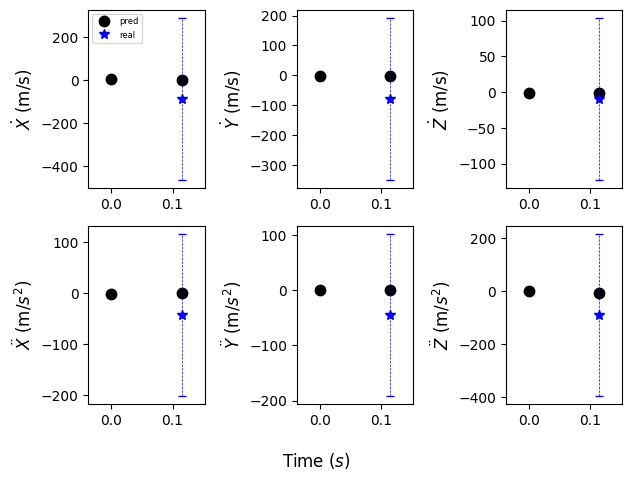

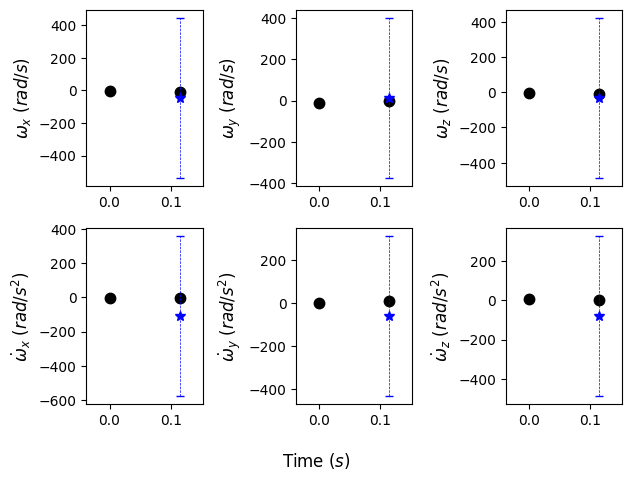

Model saved at epoch 0.

Current Batch Train Loss: 338.5416259765625

Current Batch Train Loss: -13.400026321411133

Current Batch Train Loss: -14.847060203552246

Current Batch Train Loss: -15.464702606201172

Current Batch Train Loss: -14.706356048583984

Current Batch Train Loss: -13.580032348632812

Current Batch Train Loss: -16.02594757080078

Current Batch Train Loss: -16.05071449279785

Current Batch Train Loss: -15.805728912353516

Current Batch Train Loss: -15.860200881958008

Epoch: 1, Batch Testing Loss: -15.856090545654297, Batch Testing Average RMSE: 21.81369972229004 w/ Standard Deviation: 8.419649124145508
Marginal Quantiles: tensor([2.3430, 1.4083, 0.9897, 2.3055, 2.3442, 2.8832, 1.3989, 1.7279, 1.7220,
        3.9732, 4.6201, 7.2111]),
 Joint Quantile: 9.417773246765137
Testing Calibrated (marginal) Predictive Average Batch NLL: 2.1257715225219727 ± 0.24310633540153503
Testing Calibrated (joint) Predictive Average Batch NLL: 2.604424476623535 ± 0.13434503972530365
Test

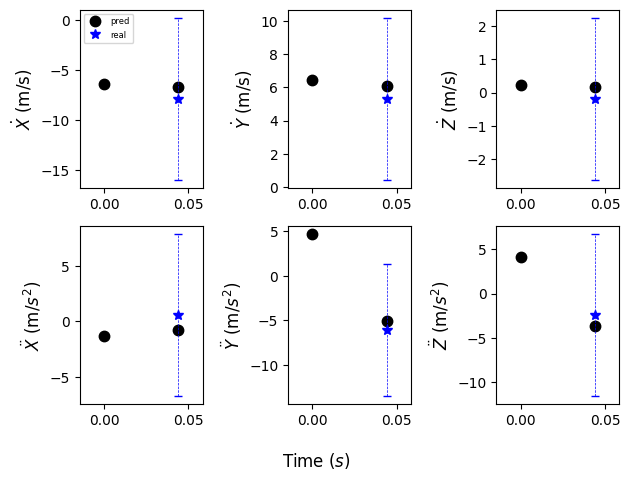

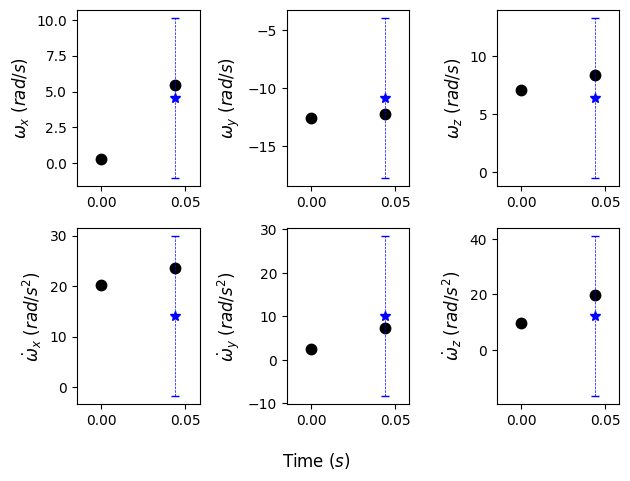

Current Batch Train Loss: -15.910542488098145

Current Batch Train Loss: -15.94088077545166

Current Batch Train Loss: -15.91226577758789

Current Batch Train Loss: -15.994364738464355

Current Batch Train Loss: -16.08547592163086

Current Batch Train Loss: -15.780900955200195

Current Batch Train Loss: -16.10250473022461

Current Batch Train Loss: -16.07522964477539

Current Batch Train Loss: -15.691611289978027

Current Batch Train Loss: -16.096622467041016

Epoch: 2, Batch Testing Loss: -16.040733337402344, Batch Testing Average RMSE: 17.00218963623047 w/ Standard Deviation: 8.418099403381348
Marginal Quantiles: tensor([1.2528, 1.2333, 0.6986, 2.4227, 2.3609, 2.1626, 1.0354, 0.9498, 1.1430,
        3.8715, 3.9834, 6.4578]),
 Joint Quantile: 8.586935997009277
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.9397146701812744 ± 0.25324198603630066
Testing Calibrated (joint) Predictive Average Batch NLL: 2.5355384349823 ± 0.13043522834777832
Testing Uncalibrated Predictive 

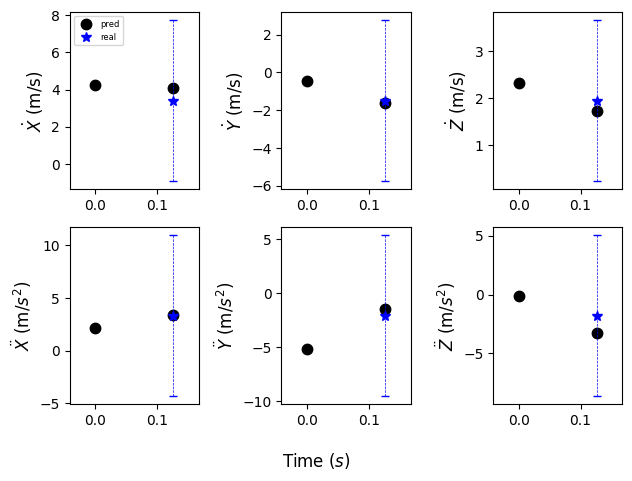

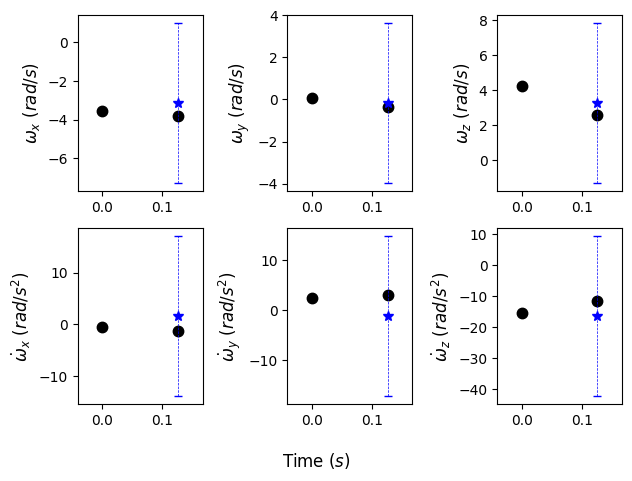

Current Batch Train Loss: -16.074344635009766

Current Batch Train Loss: -15.88818359375

Current Batch Train Loss: -16.080942153930664

Current Batch Train Loss: -16.096511840820312

Current Batch Train Loss: -15.94156265258789

Current Batch Train Loss: -15.989123344421387

Current Batch Train Loss: -15.948025703430176

Current Batch Train Loss: -16.032411575317383

Current Batch Train Loss: -16.11216163635254

Current Batch Train Loss: -15.94962215423584

Epoch: 3, Batch Testing Loss: -15.995173454284668, Batch Testing Average RMSE: 17.769922256469727 w/ Standard Deviation: 8.66671371459961
Marginal Quantiles: tensor([1.5809, 1.3402, 0.6444, 2.2488, 2.2367, 2.0813, 1.3325, 0.7154, 1.3500,
        3.5515, 4.0430, 6.2389]),
 Joint Quantile: 8.414236068725586
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.9694583415985107 ± 0.32419145107269287
Testing Calibrated (joint) Predictive Average Batch NLL: 2.5281982421875 ± 0.16168935596942902
Testing Uncalibrated Predictive Av

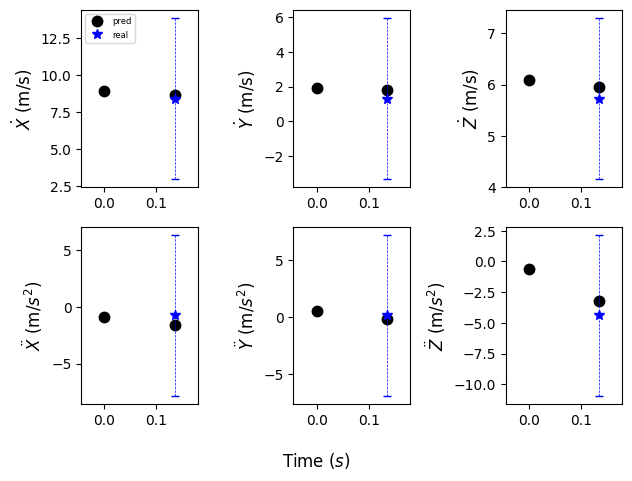

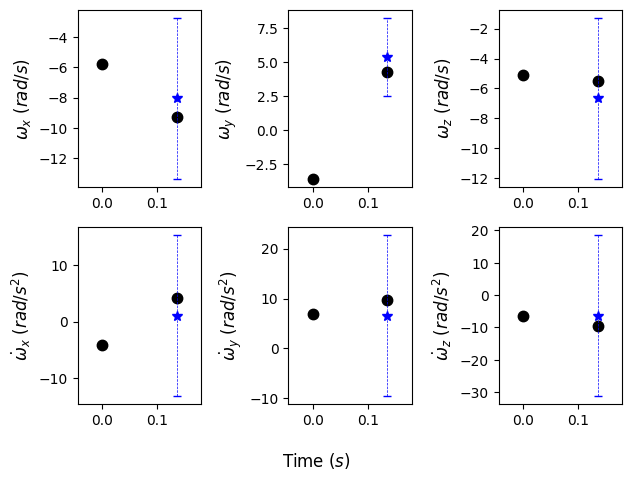

Current Batch Train Loss: -16.087297439575195

Current Batch Train Loss: -16.083782196044922

Current Batch Train Loss: -16.001548767089844

Current Batch Train Loss: -16.15574073791504

Current Batch Train Loss: -16.11035919189453

Current Batch Train Loss: -16.112947463989258

Current Batch Train Loss: -15.97955322265625

Current Batch Train Loss: -16.080230712890625

Current Batch Train Loss: -16.140647888183594

Current Batch Train Loss: -16.04110336303711

Epoch: 4, Batch Testing Loss: -16.093250274658203, Batch Testing Average RMSE: 14.825016021728516 w/ Standard Deviation: 8.722862243652344
Marginal Quantiles: tensor([1.0691, 0.8182, 0.6565, 2.2172, 2.3692, 1.9787, 1.0121, 0.6226, 0.5414,
        3.6201, 4.1229, 6.2737]),
 Joint Quantile: 8.320906639099121
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.8340578079223633 ± 0.38094642758369446
Testing Calibrated (joint) Predictive Average Batch NLL: 2.5147933959960938 ± 0.19295233488082886
Testing Uncalibrated Predic

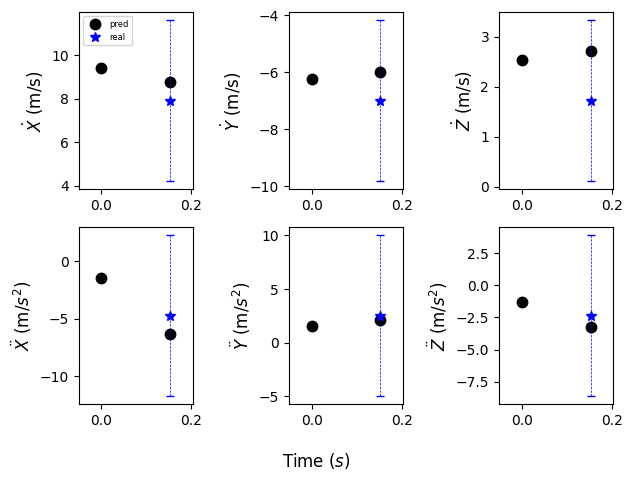

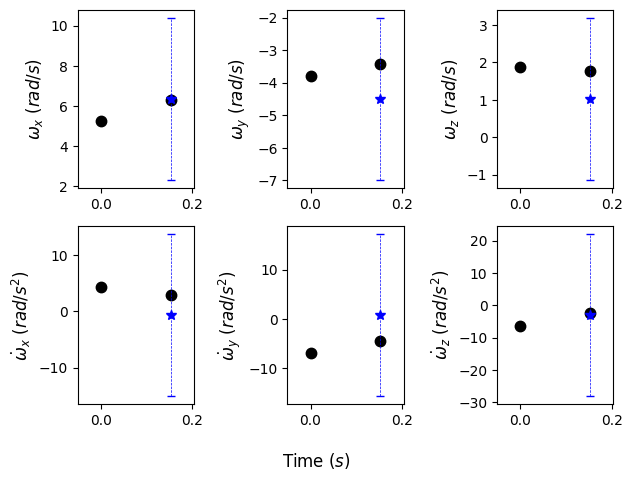

Current Batch Train Loss: -16.168140411376953

Current Batch Train Loss: -16.169504165649414

Current Batch Train Loss: -16.158754348754883

Current Batch Train Loss: -16.124061584472656

Current Batch Train Loss: -16.11166763305664

Current Batch Train Loss: -16.146177291870117

Current Batch Train Loss: -16.14046287536621

Current Batch Train Loss: -16.140628814697266

Current Batch Train Loss: -16.146604537963867

Current Batch Train Loss: -16.153934478759766

Epoch: 5, Batch Testing Loss: -16.08496856689453, Batch Testing Average RMSE: 14.150398254394531 w/ Standard Deviation: 8.190208435058594
Marginal Quantiles: tensor([0.7681, 1.2933, 0.7380, 2.1647, 2.2984, 1.9996, 0.6715, 0.5068, 0.4459,
        3.4848, 4.0755, 5.8851]),
 Joint Quantile: 7.817039966583252
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.7905926704406738 ± 0.3103308379650116
Testing Calibrated (joint) Predictive Average Batch NLL: 2.4779560565948486 ± 0.140716090798378
Testing Uncalibrated Predicti

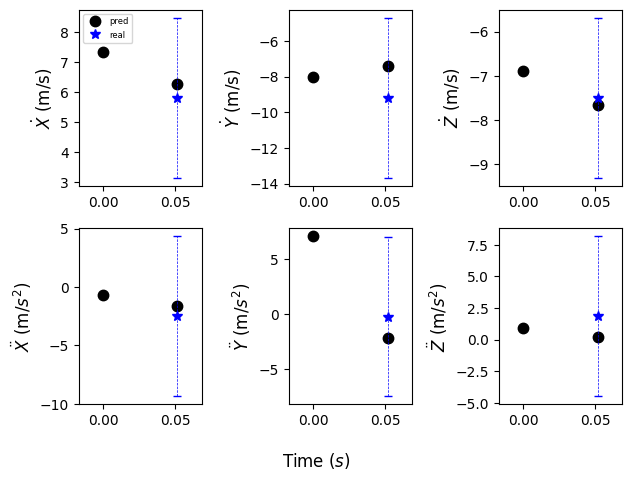

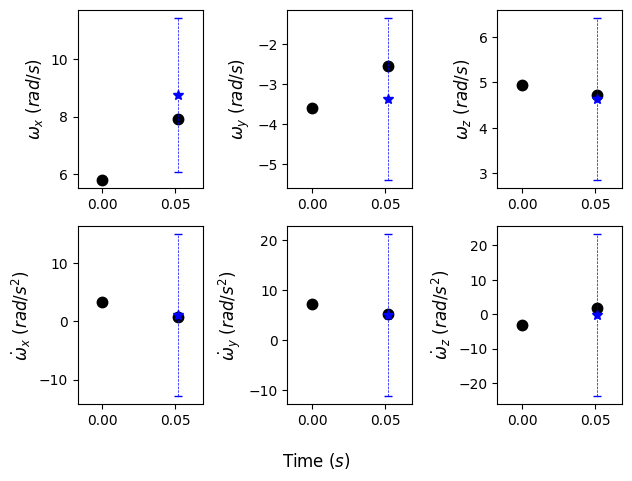

Model saved at epoch 5.

Current Batch Train Loss: -16.169721603393555

Current Batch Train Loss: -16.161895751953125

Current Batch Train Loss: -16.074684143066406

Current Batch Train Loss: -16.1544132232666

Current Batch Train Loss: -16.195703506469727

Current Batch Train Loss: -16.052770614624023

Current Batch Train Loss: -16.144731521606445

Current Batch Train Loss: -16.149030685424805

Current Batch Train Loss: -16.160037994384766

Current Batch Train Loss: -16.16609764099121

Epoch: 6, Batch Testing Loss: -16.092239379882812, Batch Testing Average RMSE: 15.254648208618164 w/ Standard Deviation: 8.4705810546875
Marginal Quantiles: tensor([0.8534, 1.1376, 0.7038, 2.2905, 2.0377, 1.9819, 0.5683, 0.4339, 1.1573,
        3.6206, 3.6823, 6.6149]),
 Joint Quantile: 8.314393043518066
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.8296213150024414 ± 0.2812366485595703
Testing Calibrated (joint) Predictive Average Batch NLL: 2.513047456741333 ± 0.15826614201068878
Testi

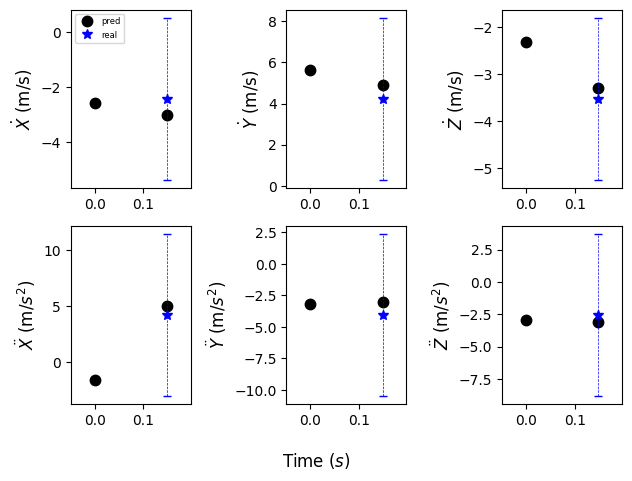

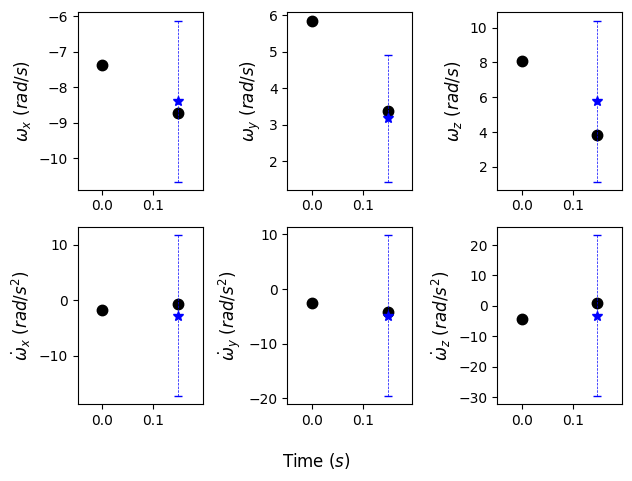

Current Batch Train Loss: -16.103723526000977

Current Batch Train Loss: -16.149290084838867

Current Batch Train Loss: -16.18924903869629

Current Batch Train Loss: -16.115690231323242

Current Batch Train Loss: -16.19285774230957

Current Batch Train Loss: -16.151275634765625

Current Batch Train Loss: -16.16832733154297

Current Batch Train Loss: -16.19844627380371

Current Batch Train Loss: -16.18264389038086

Current Batch Train Loss: -16.22824478149414

Epoch: 7, Batch Testing Loss: -16.1842041015625, Batch Testing Average RMSE: 12.719457626342773 w/ Standard Deviation: 8.366515159606934
Marginal Quantiles: tensor([0.6545, 0.6291, 0.6203, 2.3720, 2.2102, 2.0865, 0.5744, 0.4169, 0.3050,
        3.6176, 3.9911, 6.1878]),
 Joint Quantile: 7.982520580291748
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.6973036527633667 ± 0.26233646273612976
Testing Calibrated (joint) Predictive Average Batch NLL: 2.486057758331299 ± 0.14865419268608093
Testing Uncalibrated Predictive 

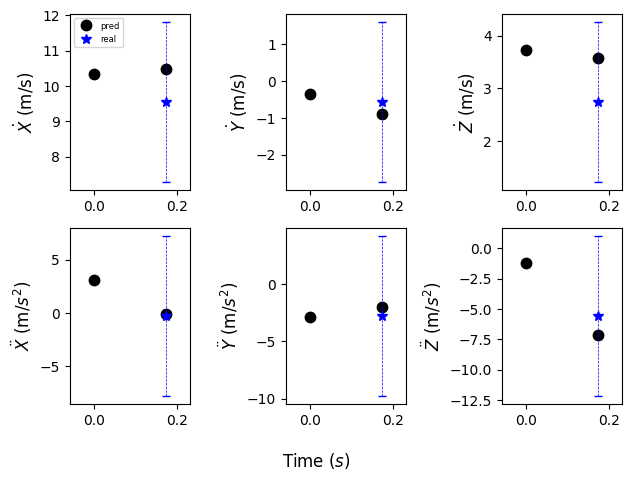

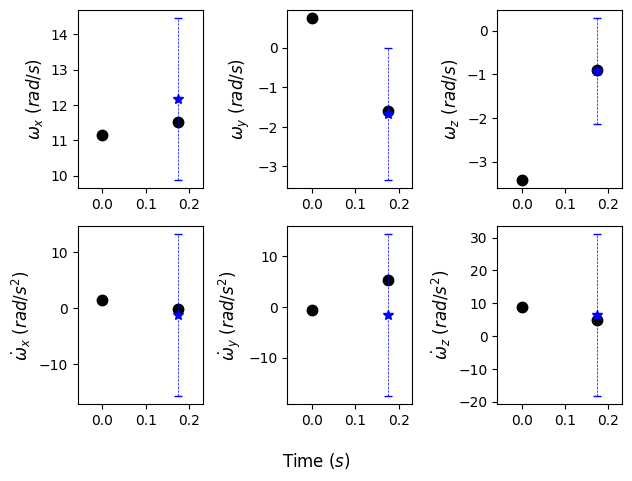

Current Batch Train Loss: -16.17078399658203

Current Batch Train Loss: -16.203489303588867

Current Batch Train Loss: -16.16615104675293

Current Batch Train Loss: -16.212656021118164

Current Batch Train Loss: -16.2286376953125

Current Batch Train Loss: -16.20644760131836

Current Batch Train Loss: -16.169923782348633

Current Batch Train Loss: -16.18007469177246

Current Batch Train Loss: -16.17226791381836

Current Batch Train Loss: -16.204469680786133

Epoch: 8, Batch Testing Loss: -16.159257888793945, Batch Testing Average RMSE: 13.321710586547852 w/ Standard Deviation: 8.664276123046875
Marginal Quantiles: tensor([0.5967, 0.8605, 0.6211, 2.1864, 2.2439, 2.0169, 0.7947, 0.3271, 0.3061,
        3.6444, 3.7616, 5.4217]),
 Joint Quantile: 7.490565299987793
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.7237375974655151 ± 0.378512978553772
Testing Calibrated (joint) Predictive Average Batch NLL: 2.4637036323547363 ± 0.22220052778720856
Testing Uncalibrated Predictive 

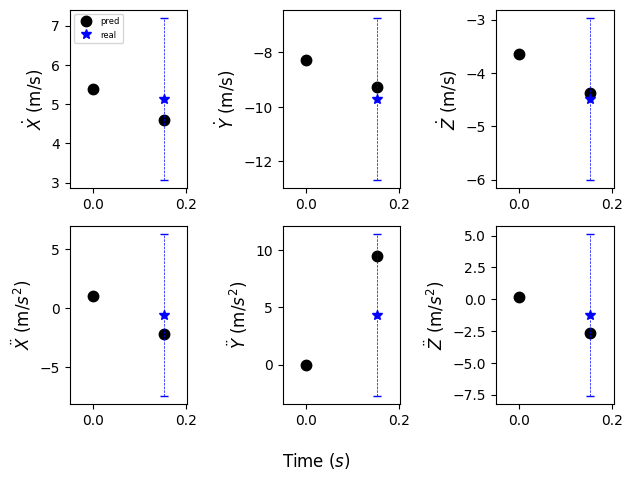

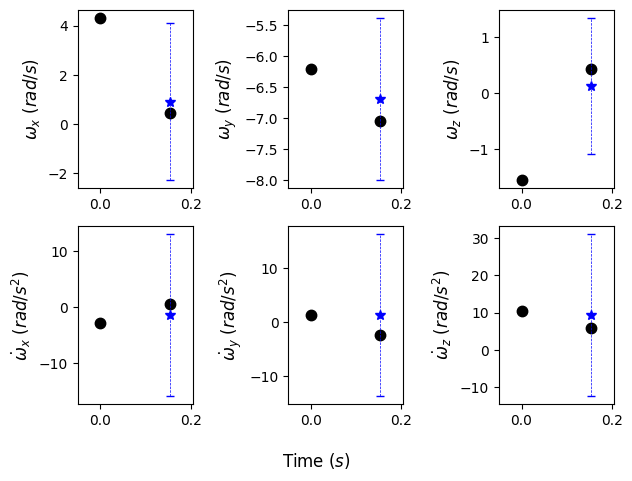

Current Batch Train Loss: -16.137601852416992

Current Batch Train Loss: -16.176830291748047

Current Batch Train Loss: -16.159391403198242

Current Batch Train Loss: -16.18864631652832

Current Batch Train Loss: -16.19975471496582

Current Batch Train Loss: -16.171823501586914

Current Batch Train Loss: -16.17450714111328

Current Batch Train Loss: -16.195444107055664

Current Batch Train Loss: -16.218311309814453

Current Batch Train Loss: -16.20471954345703

Epoch: 9, Batch Testing Loss: -16.160200119018555, Batch Testing Average RMSE: 13.291675567626953 w/ Standard Deviation: 8.418344497680664
Marginal Quantiles: tensor([0.6127, 1.0416, 0.6161, 2.1082, 2.1873, 2.0936, 0.4980, 0.4384, 0.4076,
        3.4561, 3.8759, 6.1649]),
 Joint Quantile: 7.903510570526123
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.7277966737747192 ± 0.28995180130004883
Testing Calibrated (joint) Predictive Average Batch NLL: 2.480710983276367 ± 0.16093187034130096
Testing Uncalibrated Predict

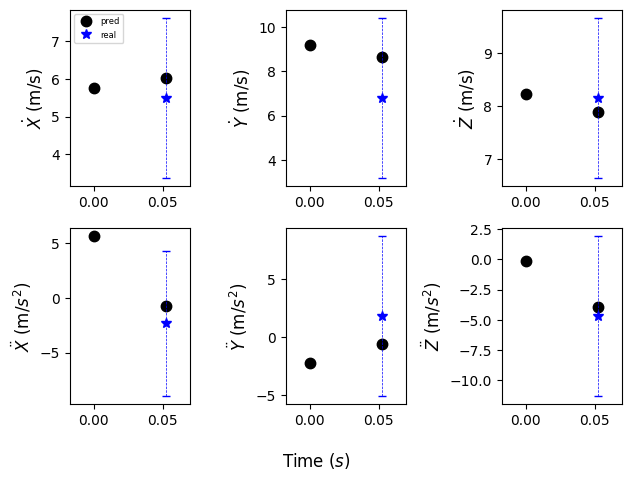

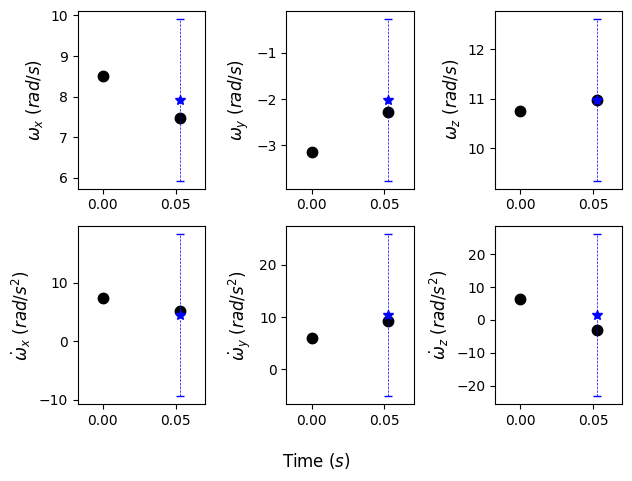

Current Batch Train Loss: -16.1777400970459

Current Batch Train Loss: -16.1890926361084

Current Batch Train Loss: -16.19876480102539

Current Batch Train Loss: -16.161231994628906

Current Batch Train Loss: -16.162290573120117

Current Batch Train Loss: -16.163623809814453

Current Batch Train Loss: -16.17796516418457

Current Batch Train Loss: -16.163774490356445

Current Batch Train Loss: -16.21024513244629

Current Batch Train Loss: -16.211849212646484

Epoch: 10, Batch Testing Loss: -16.195985794067383, Batch Testing Average RMSE: 12.410449028015137 w/ Standard Deviation: 8.237098693847656
Marginal Quantiles: tensor([0.7595, 0.5551, 0.5447, 2.3043, 2.1601, 1.9601, 0.3749, 0.4295, 0.2848,
        3.7155, 3.6274, 6.3561]),
 Joint Quantile: 7.8560404777526855
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.6604788303375244 ± 0.26069191098213196
Testing Calibrated (joint) Predictive Average Batch NLL: 2.4740242958068848 ± 0.13895733654499054
Testing Uncalibrated Predict

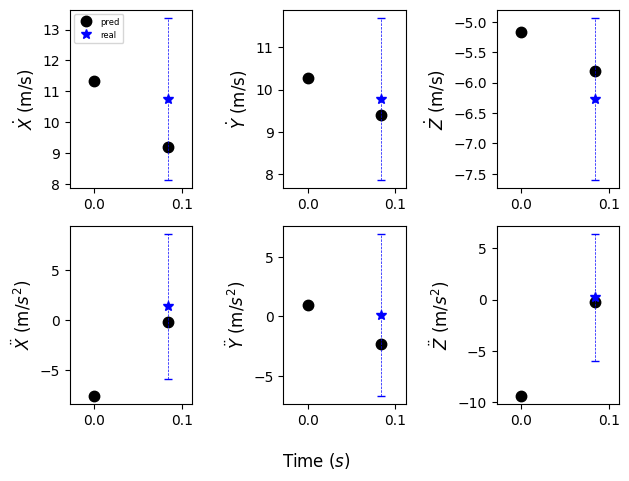

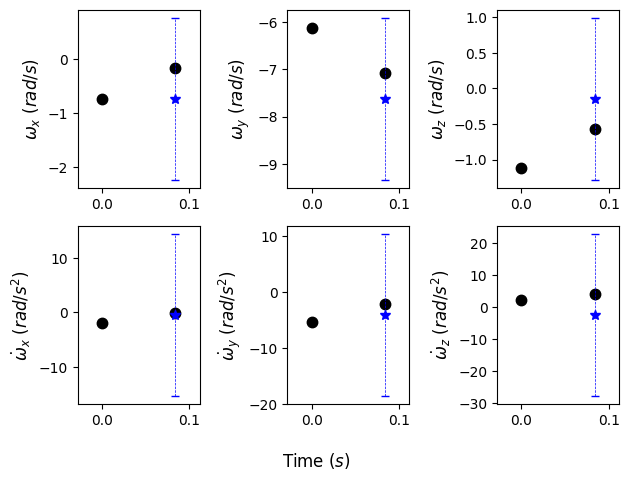

Model saved at epoch 10.

Current Batch Train Loss: -16.179168701171875

Current Batch Train Loss: -16.18575668334961

Current Batch Train Loss: -16.103551864624023

Current Batch Train Loss: -16.2153377532959

Current Batch Train Loss: -16.223106384277344

Current Batch Train Loss: -16.183650970458984

Current Batch Train Loss: -16.224777221679688

Current Batch Train Loss: -16.13140106201172

Current Batch Train Loss: -16.21479034423828

Current Batch Train Loss: -16.1866512298584

Epoch: 11, Batch Testing Loss: -16.176233291625977, Batch Testing Average RMSE: 12.860841751098633 w/ Standard Deviation: 8.357179641723633
Marginal Quantiles: tensor([0.6453, 0.7700, 0.6035, 2.2657, 2.2003, 1.9882, 0.3087, 0.4159, 0.4643,
        3.5690, 3.6806, 6.1920]),
 Joint Quantile: 7.989323139190674
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.6924455165863037 ± 0.2715946435928345
Testing Calibrated (joint) Predictive Average Batch NLL: 2.4847400188446045 ± 0.15495817363262177
Test

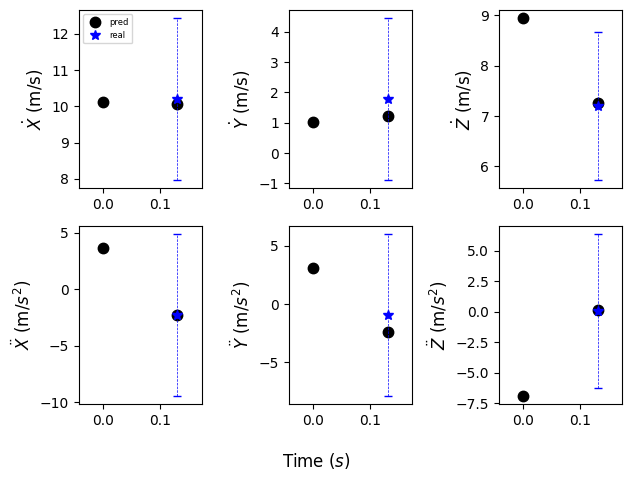

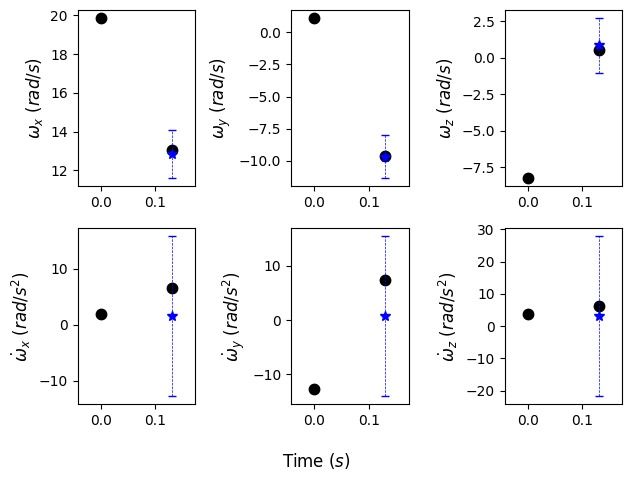

Current Batch Train Loss: -16.169429779052734

Current Batch Train Loss: -16.13341522216797

Current Batch Train Loss: -16.17049789428711

Current Batch Train Loss: -16.1910457611084

Current Batch Train Loss: -16.19362449645996

Current Batch Train Loss: -16.219350814819336

Current Batch Train Loss: -16.166732788085938

Current Batch Train Loss: -16.187503814697266

Current Batch Train Loss: -16.19353485107422

Current Batch Train Loss: -16.201629638671875

Epoch: 12, Batch Testing Loss: -16.15627098083496, Batch Testing Average RMSE: 12.346356391906738 w/ Standard Deviation: 9.035783767700195
Marginal Quantiles: tensor([0.6264, 0.6072, 0.5025, 2.3024, 2.2481, 2.2276, 0.2717, 0.3008, 0.3384,
        3.6850, 3.8152, 6.6362]),
 Joint Quantile: 8.626279830932617
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.6506367921829224 ± 0.3265761733055115
Testing Calibrated (joint) Predictive Average Batch NLL: 2.524716377258301 ± 0.18841823935508728
Testing Uncalibrated Predictive

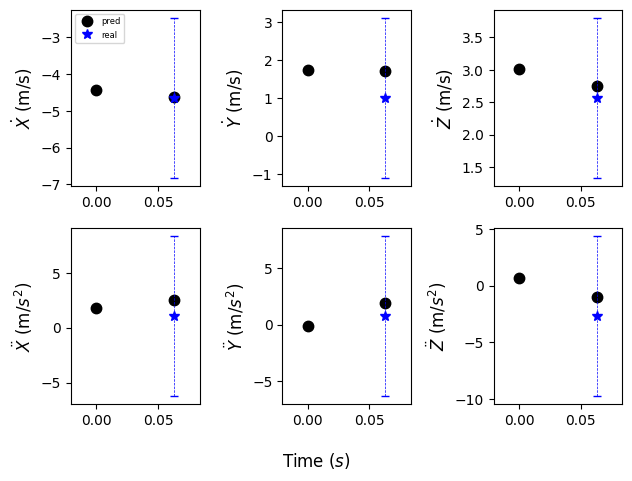

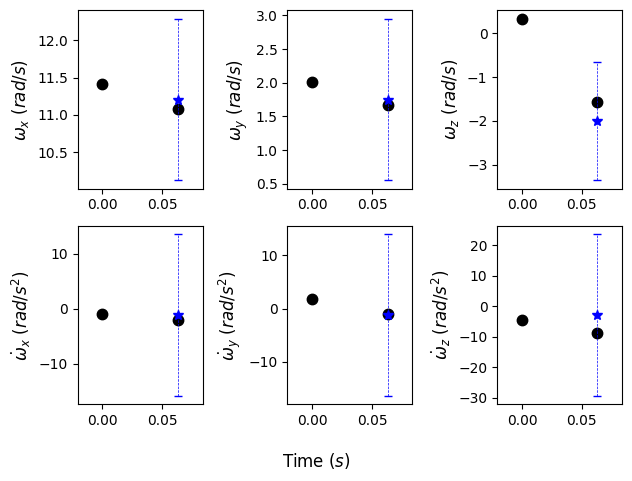

Current Batch Train Loss: -16.218530654907227

Current Batch Train Loss: -16.127521514892578

Current Batch Train Loss: -16.194215774536133

Current Batch Train Loss: -16.158340454101562

Current Batch Train Loss: -16.191795349121094

Current Batch Train Loss: -16.22129249572754

Current Batch Train Loss: -16.19239044189453

Current Batch Train Loss: -16.124584197998047

Current Batch Train Loss: -16.177827835083008

Current Batch Train Loss: -16.188596725463867

Epoch: 13, Batch Testing Loss: -16.16155433654785, Batch Testing Average RMSE: 11.855843544006348 w/ Standard Deviation: 8.125872611999512
Marginal Quantiles: tensor([0.5340, 0.5460, 0.5077, 2.2761, 2.2298, 1.9310, 0.2482, 0.3216, 0.2928,
        3.5971, 3.5383, 6.0636]),
 Joint Quantile: 7.983555316925049
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.6049174070358276 ± 0.25341081619262695
Testing Calibrated (joint) Predictive Average Batch NLL: 2.4791100025177 ± 0.13271798193454742
Testing Uncalibrated Predict

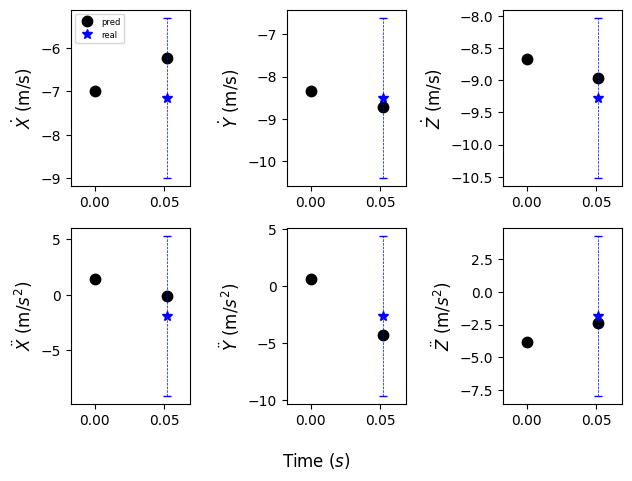

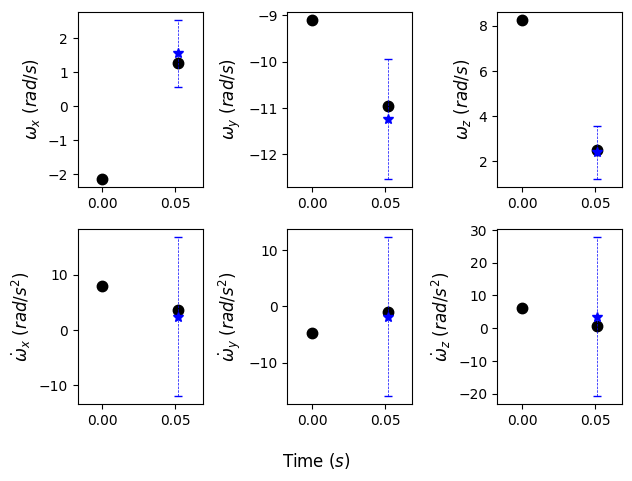

Current Batch Train Loss: -16.177017211914062

Current Batch Train Loss: -16.149410247802734

Current Batch Train Loss: -16.16802215576172

Current Batch Train Loss: -16.200061798095703

Current Batch Train Loss: -16.218015670776367

Current Batch Train Loss: -16.175899505615234

Current Batch Train Loss: -16.185699462890625

Current Batch Train Loss: -16.14007568359375

Current Batch Train Loss: -16.19606590270996

Current Batch Train Loss: -16.17864990234375

Epoch: 14, Batch Testing Loss: -16.177133560180664, Batch Testing Average RMSE: 12.386137962341309 w/ Standard Deviation: 8.877809524536133
Marginal Quantiles: tensor([0.5980, 0.6594, 0.5743, 2.1824, 2.2245, 2.0790, 0.6046, 0.2888, 0.2633,
        3.6302, 4.0171, 6.3936]),
 Joint Quantile: 8.341970443725586
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.6691315174102783 ± 0.2791725695133209
Testing Calibrated (joint) Predictive Average Batch NLL: 2.5037460327148438 ± 0.1530420184135437
Testing Uncalibrated Predict

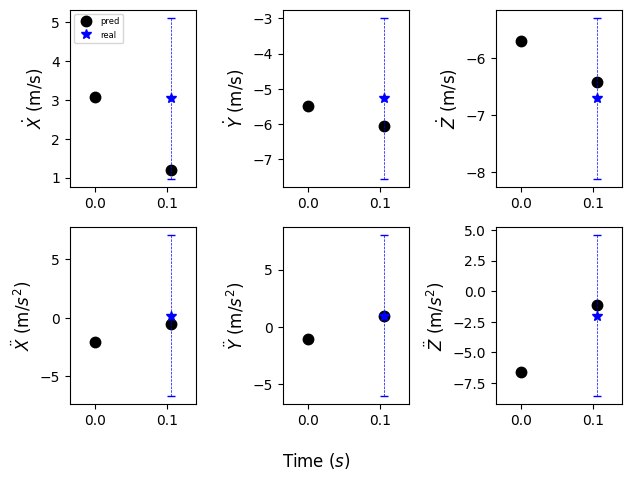

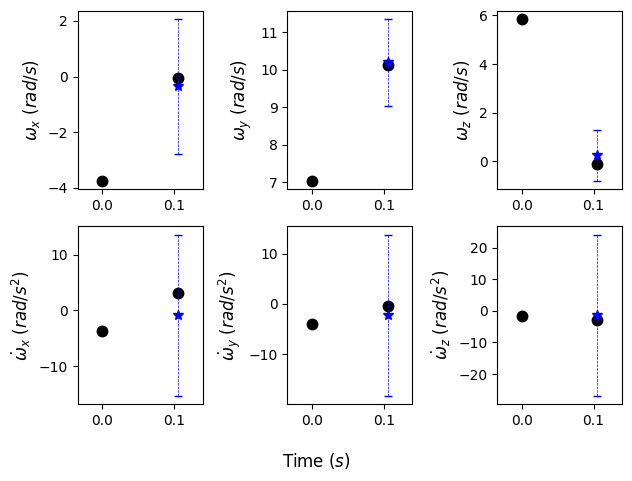

Current Batch Train Loss: -16.206274032592773

Current Batch Train Loss: -16.162818908691406

Current Batch Train Loss: -16.17780876159668

Current Batch Train Loss: -16.180435180664062

Current Batch Train Loss: -16.174997329711914

Current Batch Train Loss: -16.217540740966797

Current Batch Train Loss: -16.155471801757812

Current Batch Train Loss: -16.2000789642334

Current Batch Train Loss: -16.147247314453125

Current Batch Train Loss: -16.179393768310547

Epoch: 15, Batch Testing Loss: -16.161640167236328, Batch Testing Average RMSE: 12.280707359313965 w/ Standard Deviation: 8.929320335388184
Marginal Quantiles: tensor([0.5882, 0.6101, 0.5670, 2.1987, 2.2570, 2.0856, 0.3111, 0.3268, 0.2915,
        3.7002, 3.7925, 6.4247]),
 Joint Quantile: 8.05844783782959
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.6511296033859253 ± 0.3407439887523651
Testing Calibrated (joint) Predictive Average Batch NLL: 2.4957845211029053 ± 0.2167070358991623
Testing Uncalibrated Predict

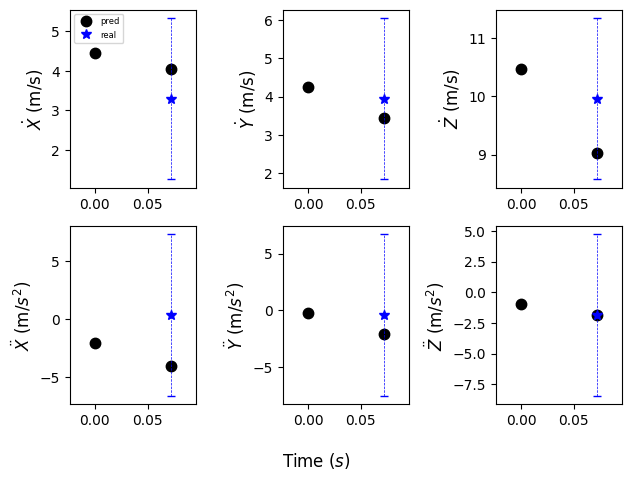

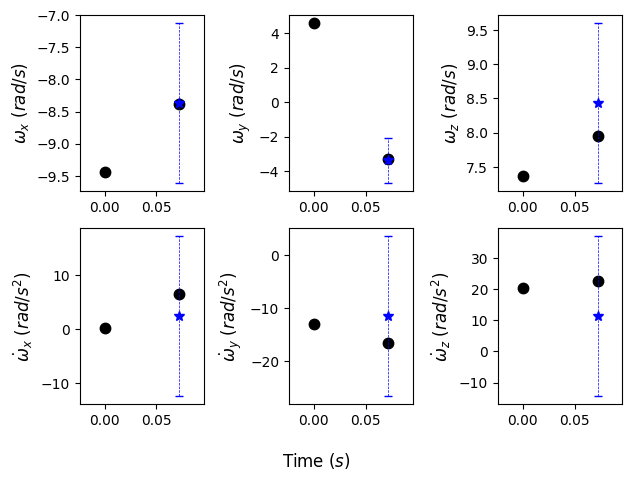

Model saved at epoch 15.

Current Batch Train Loss: -16.15589141845703

Current Batch Train Loss: -16.1629581451416

Current Batch Train Loss: -16.199289321899414

Current Batch Train Loss: -16.179723739624023

Current Batch Train Loss: -16.172073364257812

Current Batch Train Loss: -16.21481704711914

Current Batch Train Loss: -16.17447853088379

Current Batch Train Loss: -16.169452667236328

Current Batch Train Loss: -16.181821823120117

Current Batch Train Loss: -16.18551254272461

Epoch: 16, Batch Testing Loss: -16.12546157836914, Batch Testing Average RMSE: 12.776712417602539 w/ Standard Deviation: 8.79909896850586
Marginal Quantiles: tensor([0.6873, 0.5819, 0.5799, 2.2481, 2.3363, 2.0205, 0.4014, 0.4154, 0.4885,
        3.8375, 3.8553, 6.1183]),
 Joint Quantile: 8.216522216796875
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.7018181085586548 ± 0.28554007411003113
Testing Calibrated (joint) Predictive Average Batch NLL: 2.498481512069702 ± 0.15645456314086914
Testi

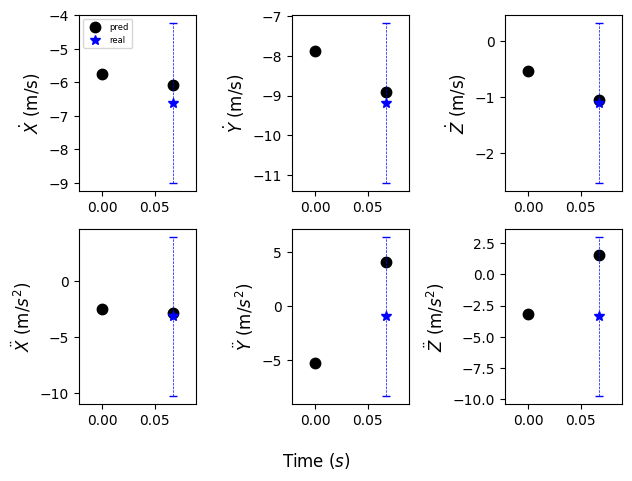

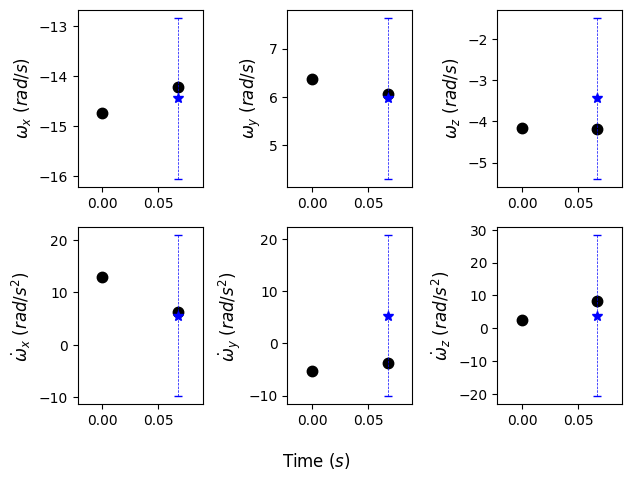

Current Batch Train Loss: -16.167516708374023

Current Batch Train Loss: -16.18646240234375

Current Batch Train Loss: -16.193750381469727

Current Batch Train Loss: -16.149070739746094

Current Batch Train Loss: -16.176834106445312

Current Batch Train Loss: -16.20134735107422

Current Batch Train Loss: -16.1731014251709

Current Batch Train Loss: -16.162282943725586

Current Batch Train Loss: -16.174461364746094

Current Batch Train Loss: -16.153263092041016

Epoch: 17, Batch Testing Loss: -16.152175903320312, Batch Testing Average RMSE: 12.342695236206055 w/ Standard Deviation: 8.795326232910156
Marginal Quantiles: tensor([0.5507, 0.5610, 0.5497, 2.0592, 2.4129, 1.9394, 0.4867, 0.4182, 0.4564,
        3.6278, 3.4005, 5.2969]),
 Joint Quantile: 7.397815227508545
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.6851048469543457 ± 0.3882201313972473
Testing Calibrated (joint) Predictive Average Batch NLL: 2.4525020122528076 ± 0.22078286111354828
Testing Uncalibrated Predic

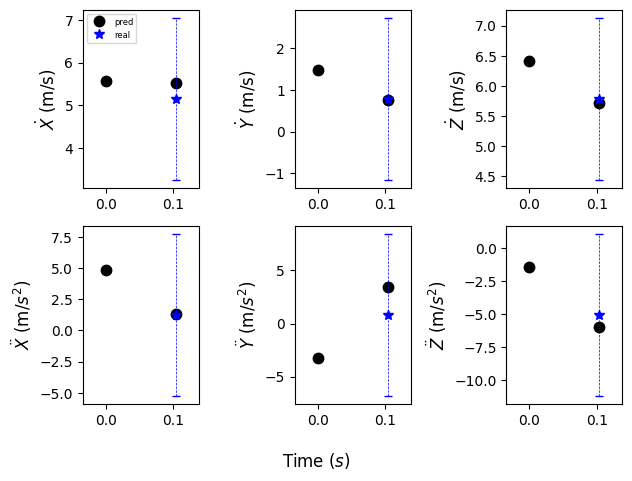

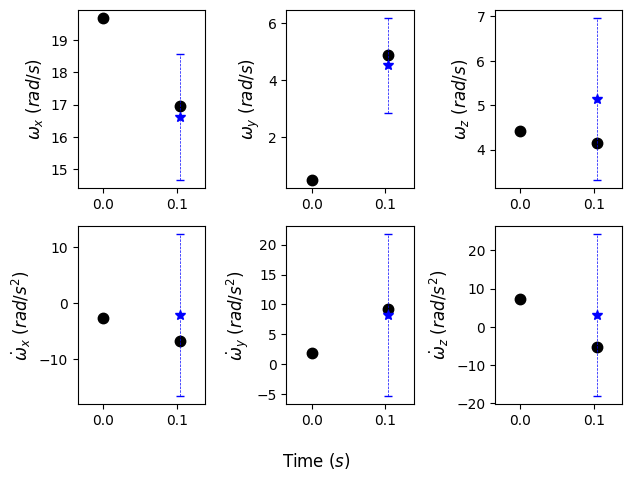

Current Batch Train Loss: -16.142135620117188

Current Batch Train Loss: -16.172483444213867

Current Batch Train Loss: -16.192079544067383

Current Batch Train Loss: -16.165998458862305

Current Batch Train Loss: -16.18038558959961

Current Batch Train Loss: -16.16642951965332

Current Batch Train Loss: -16.183582305908203

Current Batch Train Loss: -16.187162399291992

Current Batch Train Loss: -16.171634674072266

Current Batch Train Loss: -16.16961669921875

Epoch: 18, Batch Testing Loss: -16.161151885986328, Batch Testing Average RMSE: 11.8543062210083 w/ Standard Deviation: 8.487327575683594
Marginal Quantiles: tensor([0.5435, 0.6026, 0.6276, 2.0495, 2.2503, 1.9971, 0.2899, 0.4563, 0.3052,
        3.4645, 3.2766, 5.6519]),
 Joint Quantile: 7.179250240325928
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.6507097482681274 ± 0.7762888073921204
Testing Calibrated (joint) Predictive Average Batch NLL: 2.4317400455474854 ± 0.1834287792444229
Testing Uncalibrated Predicti

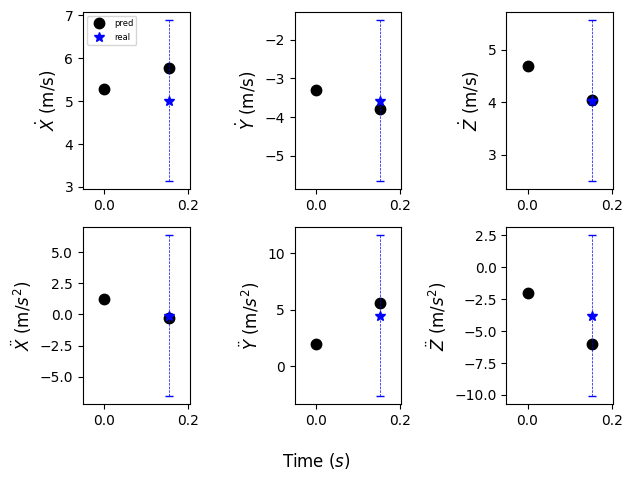

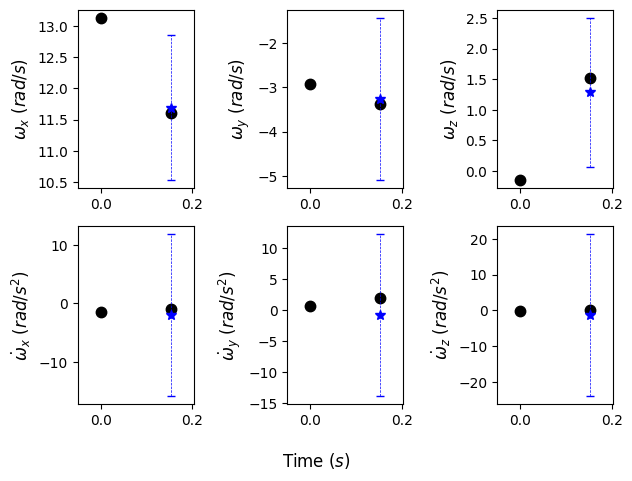

Current Batch Train Loss: -16.177400588989258

Current Batch Train Loss: -16.171911239624023

Current Batch Train Loss: -16.173749923706055

Current Batch Train Loss: -16.182132720947266

Current Batch Train Loss: -16.185100555419922

Current Batch Train Loss: -16.185152053833008

Current Batch Train Loss: -16.152809143066406

Current Batch Train Loss: -16.157501220703125

Current Batch Train Loss: -16.171846389770508

Current Batch Train Loss: -16.199338912963867

Epoch: 19, Batch Testing Loss: -16.163618087768555, Batch Testing Average RMSE: 11.767704963684082 w/ Standard Deviation: 7.749383926391602
Marginal Quantiles: tensor([0.5941, 0.5789, 0.5295, 2.2753, 2.0743, 1.8815, 0.4412, 0.2839, 0.3214,
        3.3510, 3.5941, 6.2690]),
 Joint Quantile: 7.627950191497803
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.6281684637069702 ± 0.23897139728069305
Testing Calibrated (joint) Predictive Average Batch NLL: 2.454740285873413 ± 0.1300334334373474
Testing Uncalibrated Pre

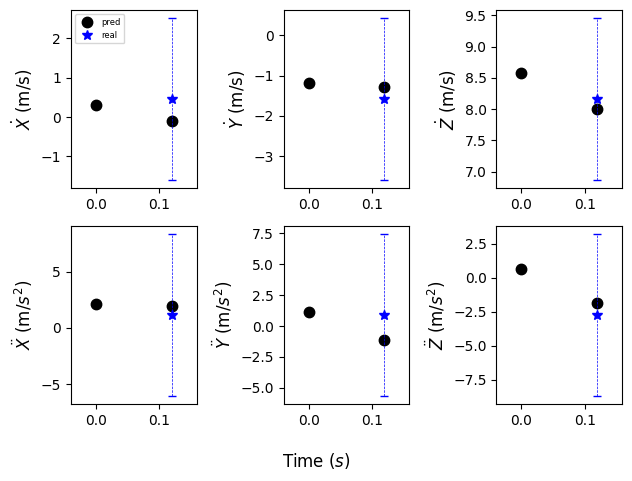

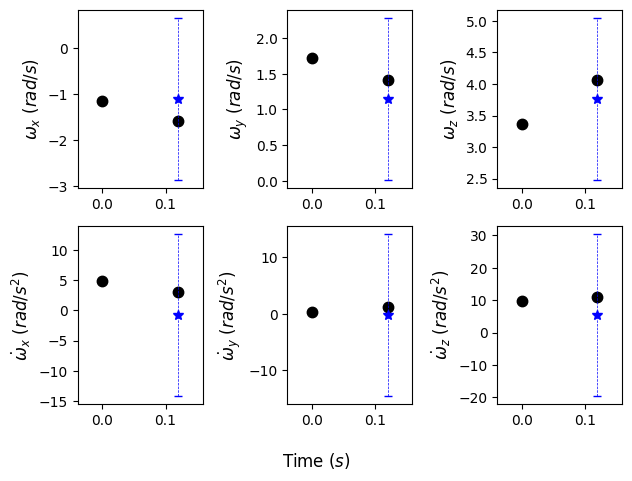

Current Batch Train Loss: -16.170143127441406

Current Batch Train Loss: -16.171798706054688

Current Batch Train Loss: -16.169248580932617

Current Batch Train Loss: -16.172414779663086

Current Batch Train Loss: -16.168542861938477

Current Batch Train Loss: -16.172134399414062

Current Batch Train Loss: -16.179628372192383

Current Batch Train Loss: -16.1450138092041

Current Batch Train Loss: -16.172582626342773

Current Batch Train Loss: -16.130903244018555

Epoch: 20, Batch Testing Loss: -16.18728256225586, Batch Testing Average RMSE: 11.658568382263184 w/ Standard Deviation: 7.879518508911133
Marginal Quantiles: tensor([0.6651, 0.6134, 0.5470, 2.2010, 1.9606, 2.0777, 0.2354, 0.4351, 0.2751,
        3.5193, 3.4422, 5.3704]),
 Joint Quantile: 7.388832092285156
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.6196799278259277 ± 0.2650837004184723
Testing Calibrated (joint) Predictive Average Batch NLL: 2.4396777153015137 ± 0.14752881228923798
Testing Uncalibrated Predi

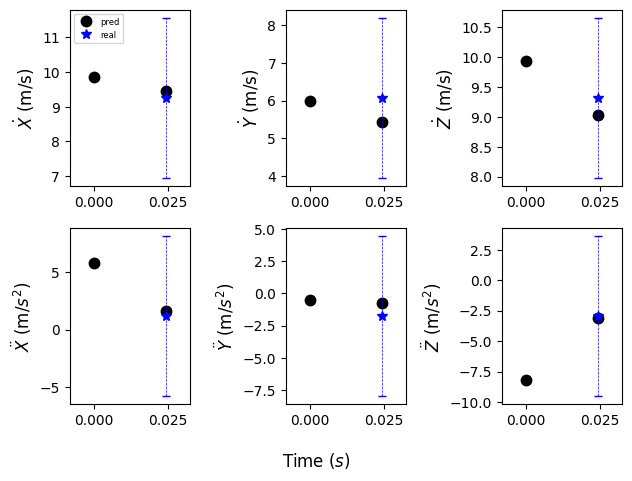

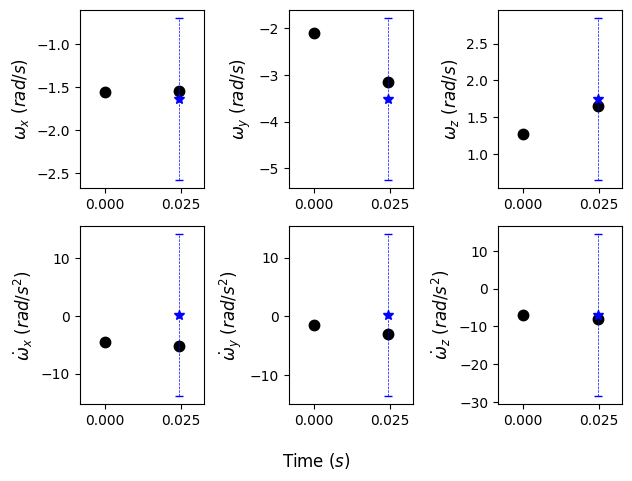

Model saved at epoch 20.

Current Batch Train Loss: -16.145959854125977

Current Batch Train Loss: -16.167387008666992

Current Batch Train Loss: -16.17422103881836

Current Batch Train Loss: -16.161224365234375

Current Batch Train Loss: -16.168720245361328

Current Batch Train Loss: -16.158660888671875

Current Batch Train Loss: -16.1612491607666

Current Batch Train Loss: -16.152006149291992

Current Batch Train Loss: -16.200328826904297

Current Batch Train Loss: -16.137535095214844

Epoch: 21, Batch Testing Loss: -16.14969253540039, Batch Testing Average RMSE: 11.407073974609375 w/ Standard Deviation: 7.789320945739746
Marginal Quantiles: tensor([0.5583, 0.5308, 0.5133, 2.2939, 2.2562, 1.8566, 0.2357, 0.2364, 0.1491,
        3.3563, 3.2928, 6.0254]),
 Joint Quantile: 7.790349006652832
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5509276390075684 ± 0.253375768661499
Testing Calibrated (joint) Predictive Average Batch NLL: 2.4652111530303955 ± 0.12723104655742645
Te

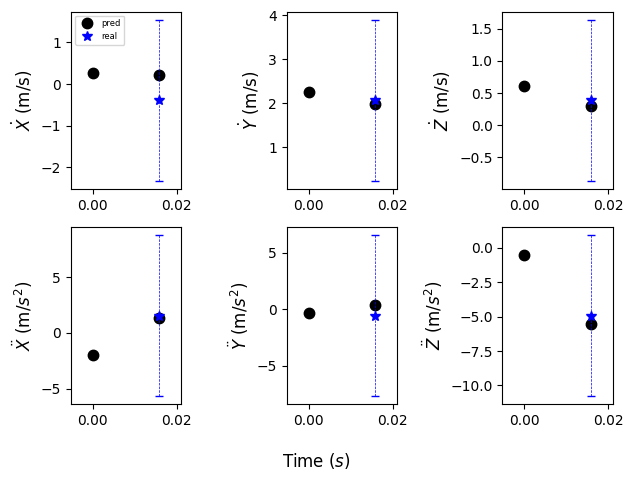

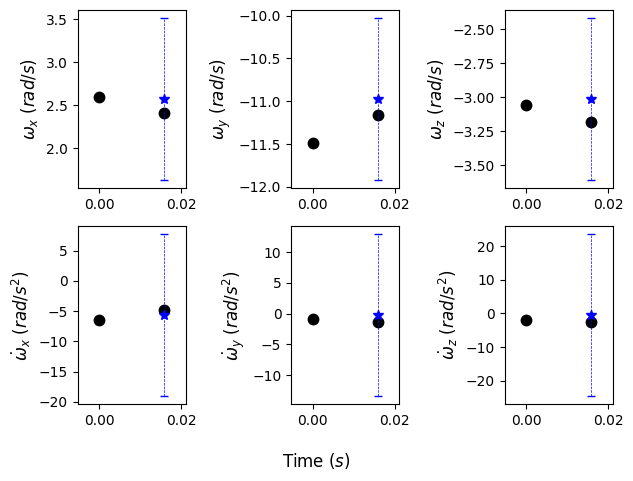

Current Batch Train Loss: -16.180009841918945

Current Batch Train Loss: -16.194814682006836

Current Batch Train Loss: -16.186100006103516

Current Batch Train Loss: -16.17901039123535

Current Batch Train Loss: -16.18174171447754

Current Batch Train Loss: -16.181556701660156

Current Batch Train Loss: -16.167070388793945

Current Batch Train Loss: -16.186704635620117

Current Batch Train Loss: -16.159526824951172

Current Batch Train Loss: -16.148225784301758

Epoch: 22, Batch Testing Loss: -16.167104721069336, Batch Testing Average RMSE: 11.552997589111328 w/ Standard Deviation: 8.176322937011719
Marginal Quantiles: tensor([0.5898, 0.5579, 0.5630, 2.2166, 2.0659, 1.9046, 0.4226, 0.3106, 0.1662,
        3.5381, 3.1970, 6.0982]),
 Joint Quantile: 7.9817280769348145
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.6113781929016113 ± 0.37351059913635254
Testing Calibrated (joint) Predictive Average Batch NLL: 2.478271245956421 ± 0.1961451917886734
Testing Uncalibrated Pred

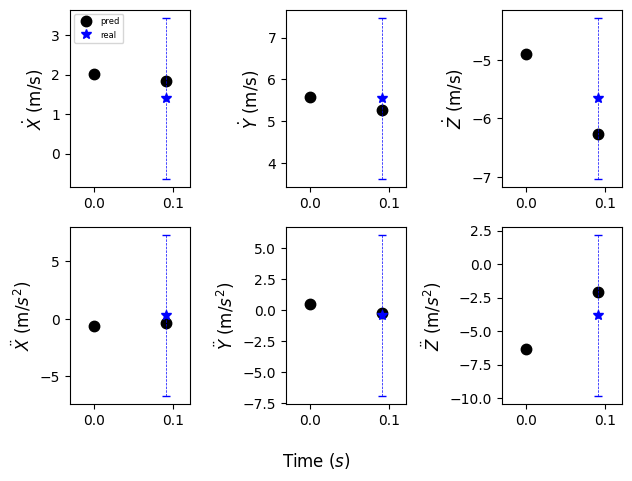

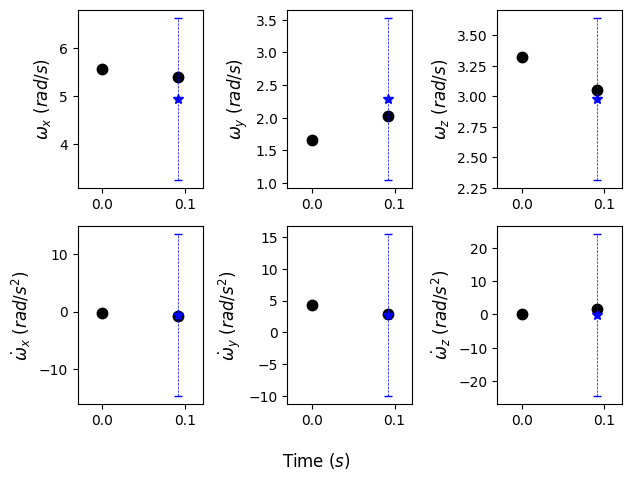

Current Batch Train Loss: -16.170303344726562

Current Batch Train Loss: -16.203134536743164

Current Batch Train Loss: -16.210468292236328

Current Batch Train Loss: -16.171438217163086

Current Batch Train Loss: -16.176837921142578

Current Batch Train Loss: -16.168441772460938

Current Batch Train Loss: -16.132246017456055

Current Batch Train Loss: -16.19066047668457

Current Batch Train Loss: -16.178394317626953

Current Batch Train Loss: -16.1597843170166

Epoch: 23, Batch Testing Loss: -16.16973114013672, Batch Testing Average RMSE: 12.103748321533203 w/ Standard Deviation: 8.314756393432617
Marginal Quantiles: tensor([0.5493, 0.6448, 0.5348, 2.1728, 2.0550, 1.8622, 0.4267, 0.2359, 0.3564,
        3.8411, 3.4701, 5.8982]),
 Joint Quantile: 7.4958038330078125
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.634179949760437 ± 0.3202138841152191
Testing Calibrated (joint) Predictive Average Batch NLL: 2.454057216644287 ± 0.18100480735301971
Testing Uncalibrated Predict

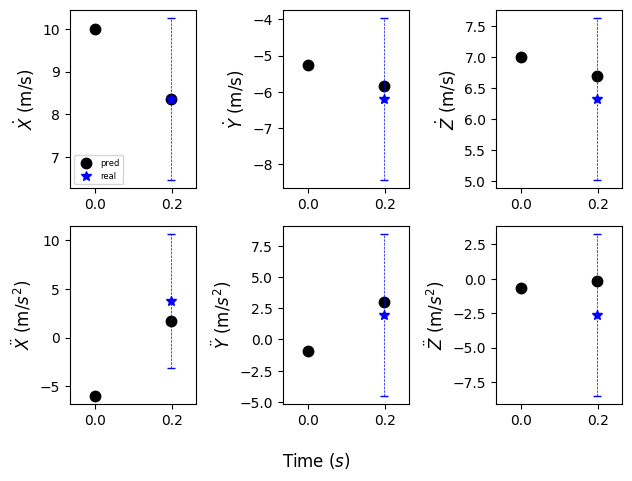

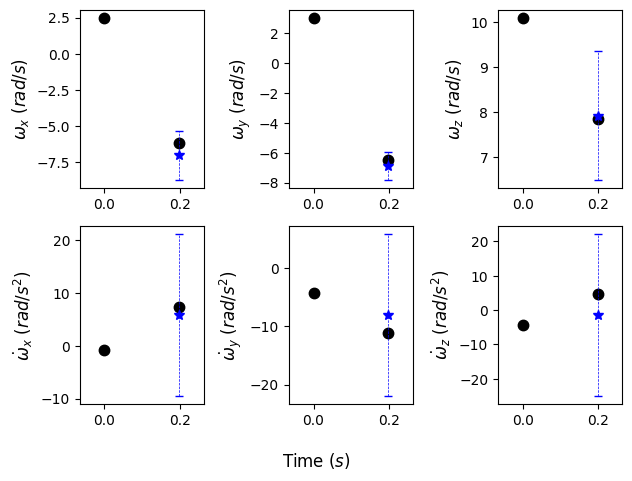

Current Batch Train Loss: -16.17107391357422

Current Batch Train Loss: -16.149066925048828

Current Batch Train Loss: -16.171390533447266

Current Batch Train Loss: -16.14065170288086

Current Batch Train Loss: -16.205400466918945

Current Batch Train Loss: -16.15953254699707

Current Batch Train Loss: -16.148908615112305

Current Batch Train Loss: -16.149751663208008

Current Batch Train Loss: -16.145244598388672

Current Batch Train Loss: -16.152198791503906

Epoch: 24, Batch Testing Loss: -16.15553855895996, Batch Testing Average RMSE: 11.368736267089844 w/ Standard Deviation: 7.972961902618408
Marginal Quantiles: tensor([0.5531, 0.5178, 0.6229, 2.3039, 2.0700, 2.0106, 0.3150, 0.2537, 0.2316,
        3.3533, 3.4161, 6.1706]),
 Joint Quantile: 7.920492172241211
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5946245193481445 ± 0.2772715389728546
Testing Calibrated (joint) Predictive Average Batch NLL: 2.472803831100464 ± 0.16063855588436127
Testing Uncalibrated Predict

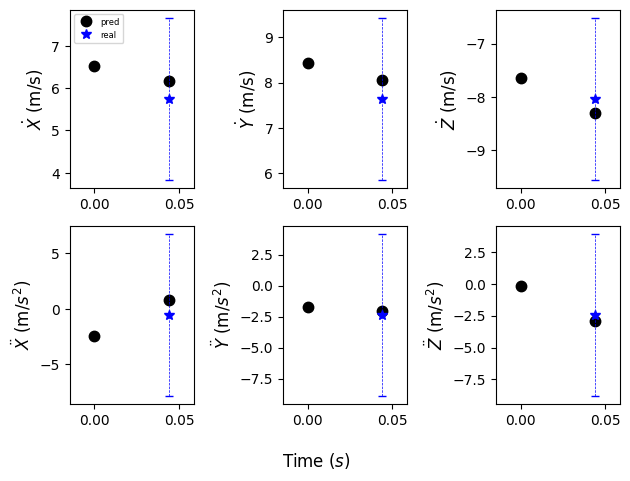

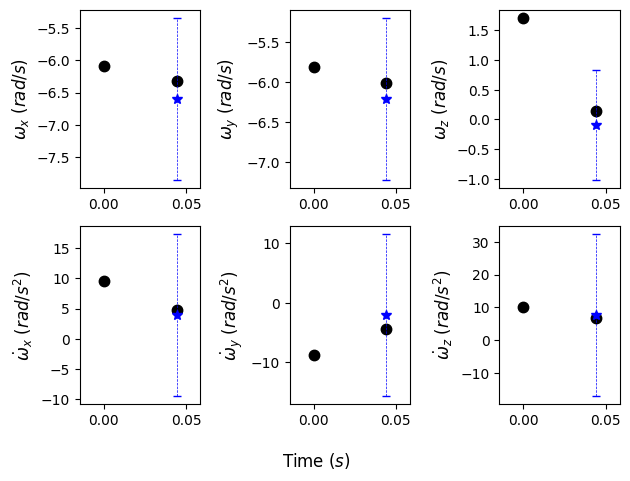

Current Batch Train Loss: -16.160972595214844

Current Batch Train Loss: -16.116962432861328

Current Batch Train Loss: -16.17386245727539

Current Batch Train Loss: -16.152048110961914

Current Batch Train Loss: -16.141469955444336

Current Batch Train Loss: -16.140405654907227

Current Batch Train Loss: -16.148040771484375

Current Batch Train Loss: -16.152172088623047

Current Batch Train Loss: -16.130495071411133

Current Batch Train Loss: -16.155742645263672

Epoch: 25, Batch Testing Loss: -16.113950729370117, Batch Testing Average RMSE: 11.325087547302246 w/ Standard Deviation: 9.672674179077148
Marginal Quantiles: tensor([0.5143, 0.5785, 0.5812, 2.2315, 2.1185, 1.9995, 0.3301, 0.2143, 0.2840,
        3.5667, 3.4613, 6.1185]),
 Joint Quantile: 7.944120407104492
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.650343656539917 ± 1.6816918849945068
Testing Calibrated (joint) Predictive Average Batch NLL: 2.481013059616089 ± 0.2355993390083313
Testing Uncalibrated Predic

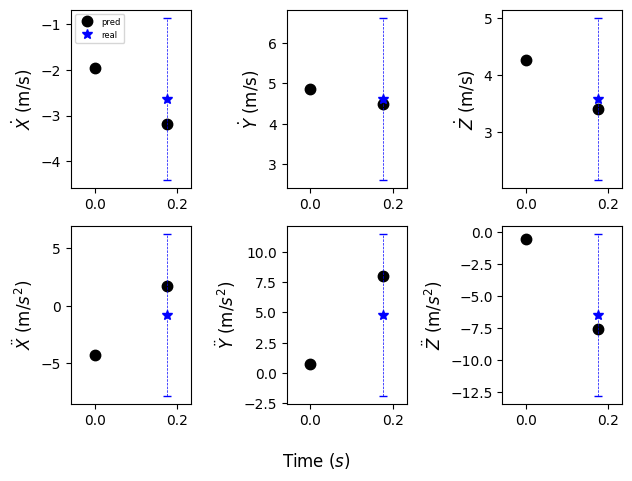

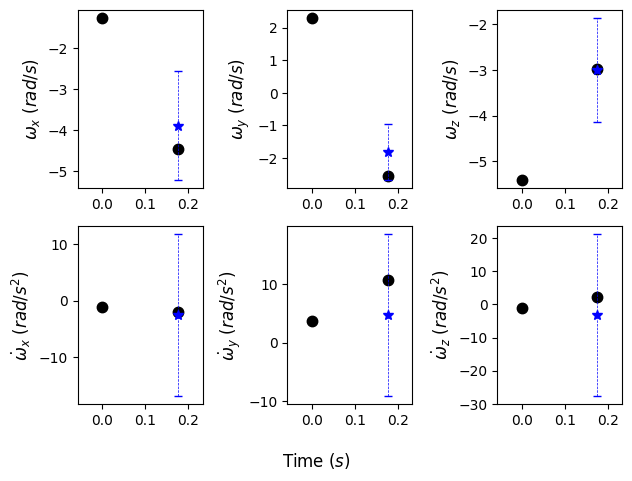

Model saved at epoch 25.

Current Batch Train Loss: -16.166215896606445

Current Batch Train Loss: -16.11372184753418

Current Batch Train Loss: -16.133514404296875

Current Batch Train Loss: -16.18201446533203

Current Batch Train Loss: -16.191421508789062

Current Batch Train Loss: -16.18462371826172

Current Batch Train Loss: -16.189769744873047

Current Batch Train Loss: -16.171052932739258

Current Batch Train Loss: -16.174800872802734

Current Batch Train Loss: -16.173593521118164

Epoch: 26, Batch Testing Loss: -16.1735897064209, Batch Testing Average RMSE: 11.337798118591309 w/ Standard Deviation: 8.083759307861328
Marginal Quantiles: tensor([0.5635, 0.6216, 0.5898, 2.1795, 2.1274, 1.9773, 0.2370, 0.2610, 0.4491,
        3.6039, 3.6582, 5.4050]),
 Joint Quantile: 7.326263427734375
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.616459846496582 ± 0.2710752487182617
Testing Calibrated (joint) Predictive Average Batch NLL: 2.435091018676758 ± 0.15093682706356049
Test

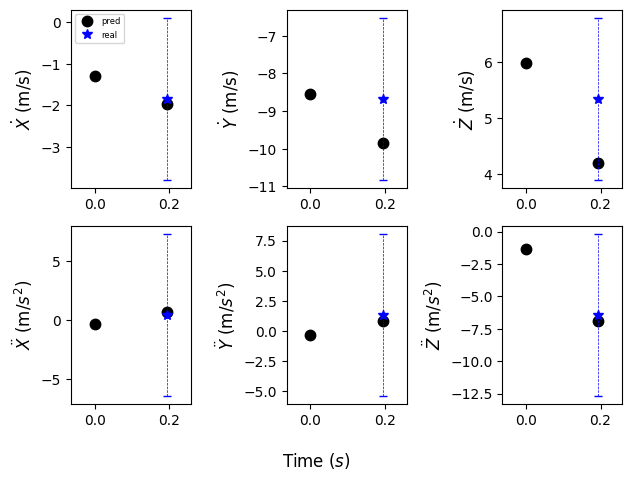

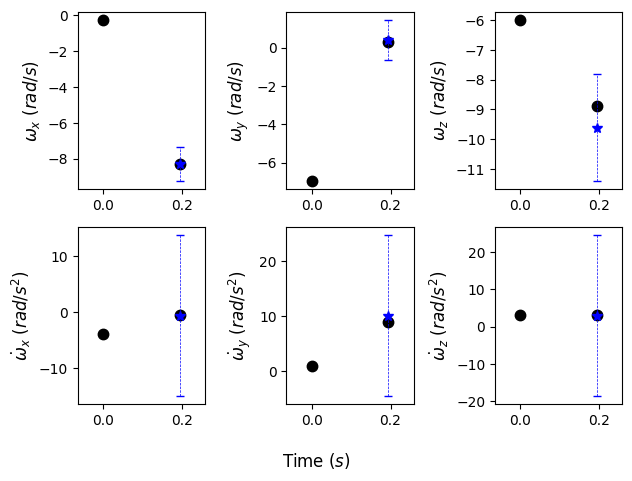

Current Batch Train Loss: -16.17741584777832

Current Batch Train Loss: -16.160343170166016

Current Batch Train Loss: -16.130970001220703

Current Batch Train Loss: -16.1560115814209

Current Batch Train Loss: -16.166362762451172

Current Batch Train Loss: -16.170061111450195

Current Batch Train Loss: -16.188129425048828

Current Batch Train Loss: -16.165115356445312

Current Batch Train Loss: -16.17962646484375

Current Batch Train Loss: -16.131879806518555

Epoch: 27, Batch Testing Loss: -16.138757705688477, Batch Testing Average RMSE: 11.771754264831543 w/ Standard Deviation: 8.03331184387207
Marginal Quantiles: tensor([0.5450, 0.5415, 0.5527, 2.3905, 2.2379, 1.9931, 0.2766, 0.2123, 0.2743,
        3.4581, 3.3816, 6.1664]),
 Joint Quantile: 7.5370774269104
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5936987400054932 ± 0.25898560881614685
Testing Calibrated (joint) Predictive Average Batch NLL: 2.4570629596710205 ± 0.15820465981960297
Testing Uncalibrated Predicti

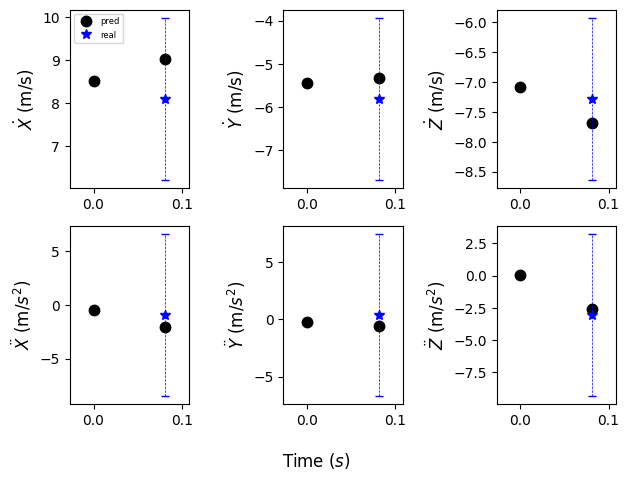

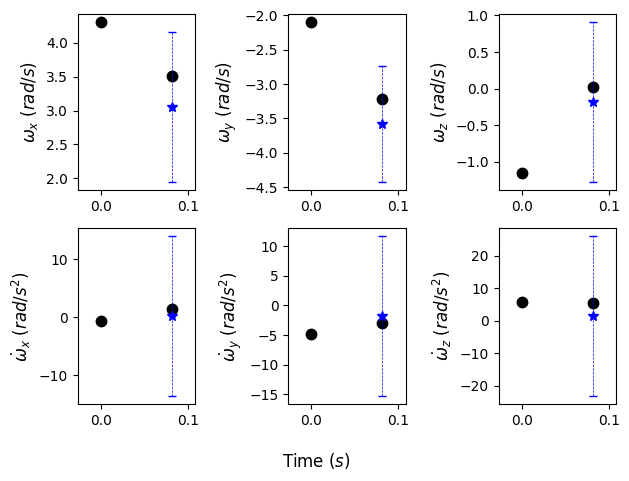

Current Batch Train Loss: -16.145902633666992

Current Batch Train Loss: -16.172420501708984

Current Batch Train Loss: -16.14625358581543

Current Batch Train Loss: -16.17159652709961

Current Batch Train Loss: -16.11170196533203

Current Batch Train Loss: -16.172388076782227

Current Batch Train Loss: -16.142189025878906

Current Batch Train Loss: -16.18433952331543

Current Batch Train Loss: -16.16549301147461

Current Batch Train Loss: -16.156068801879883

Epoch: 28, Batch Testing Loss: -16.12235450744629, Batch Testing Average RMSE: 11.818933486938477 w/ Standard Deviation: 8.4677095413208
Marginal Quantiles: tensor([0.6126, 0.5185, 0.5213, 2.2086, 2.2138, 2.1579, 0.2762, 0.2380, 0.2827,
        3.4142, 3.5910, 6.5497]),
 Joint Quantile: 8.295080184936523
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.606960654258728 ± 0.27755409479141235
Testing Calibrated (joint) Predictive Average Batch NLL: 2.499750852584839 ± 0.1561897248029709
Testing Uncalibrated Predictive A

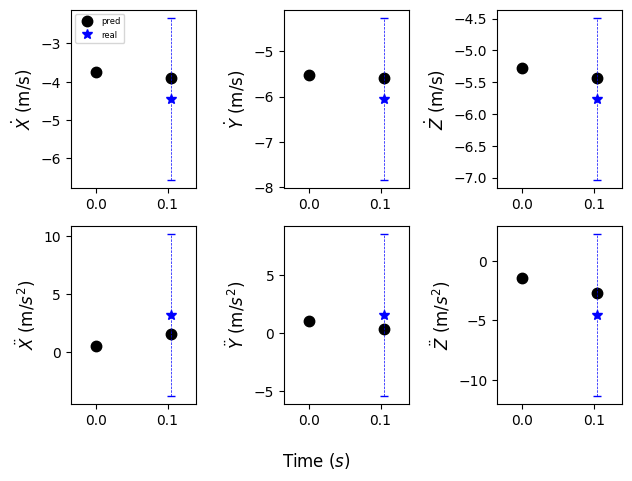

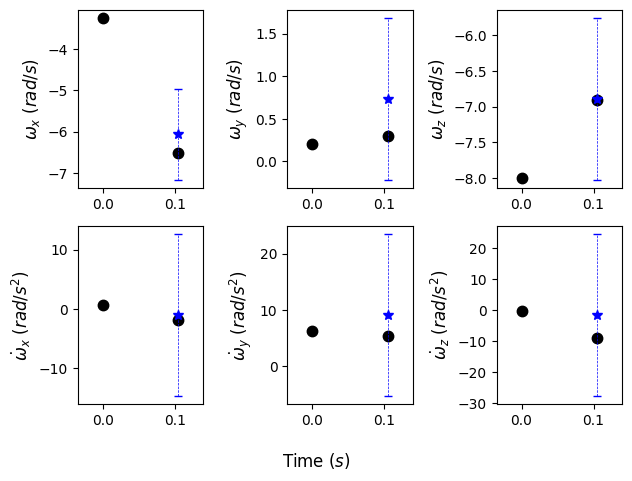

Current Batch Train Loss: -16.116804122924805

Current Batch Train Loss: -16.115262985229492

Current Batch Train Loss: -16.16204833984375

Current Batch Train Loss: -16.1580867767334

Current Batch Train Loss: -16.15508270263672

Current Batch Train Loss: -16.151235580444336

Current Batch Train Loss: -16.143434524536133

Current Batch Train Loss: -16.1706485748291

Current Batch Train Loss: -16.108726501464844

Current Batch Train Loss: -16.16621971130371

Epoch: 29, Batch Testing Loss: -16.16403579711914, Batch Testing Average RMSE: 10.656574249267578 w/ Standard Deviation: 8.16648006439209
Marginal Quantiles: tensor([0.5908, 0.6137, 0.5597, 2.1651, 2.3346, 1.8359, 0.2191, 0.1937, 0.1871,
        3.3959, 3.1012, 5.6611]),
 Joint Quantile: 7.3596391677856445
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.550323724746704 ± 0.3076675236225128
Testing Calibrated (joint) Predictive Average Batch NLL: 2.437174081802368 ± 0.16070082783699036
Testing Uncalibrated Predictive A

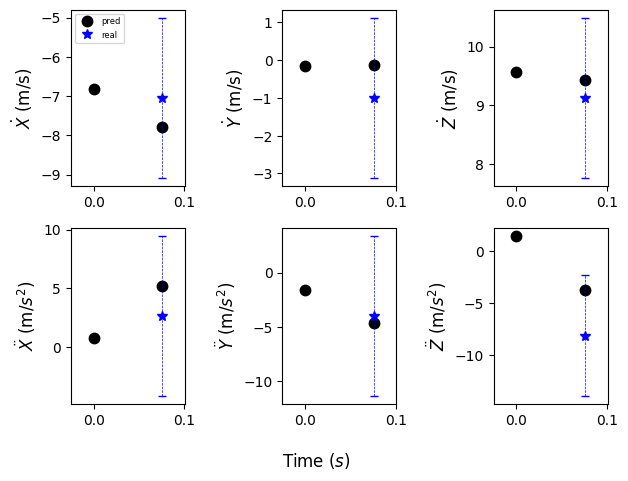

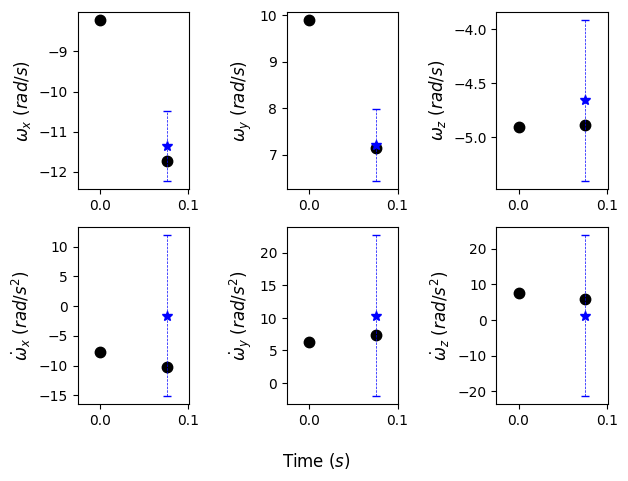

Current Batch Train Loss: -16.164257049560547

Current Batch Train Loss: -16.148534774780273

Current Batch Train Loss: -16.150888442993164

Current Batch Train Loss: -16.142356872558594

Current Batch Train Loss: -16.200944900512695

Current Batch Train Loss: -16.185819625854492

Current Batch Train Loss: -16.131027221679688

Current Batch Train Loss: -16.117109298706055

Current Batch Train Loss: -16.10385513305664

Current Batch Train Loss: -16.1279354095459

Epoch: 30, Batch Testing Loss: -16.146739959716797, Batch Testing Average RMSE: 10.57201862335205 w/ Standard Deviation: 7.518515110015869
Marginal Quantiles: tensor([0.5412, 0.5890, 0.5662, 2.0824, 2.1156, 1.9372, 0.1988, 0.2374, 0.1737,
        3.3973, 3.0473, 5.3020]),
 Joint Quantile: 7.056794166564941
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5336763858795166 ± 0.2527478337287903
Testing Calibrated (joint) Predictive Average Batch NLL: 2.4137494564056396 ± 0.14794784784317017
Testing Uncalibrated Predic

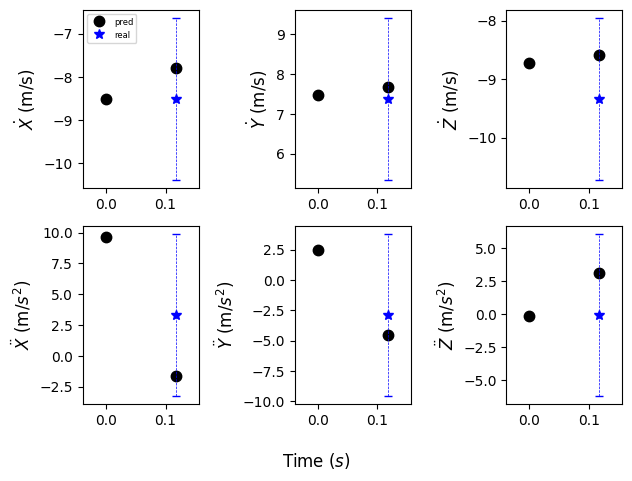

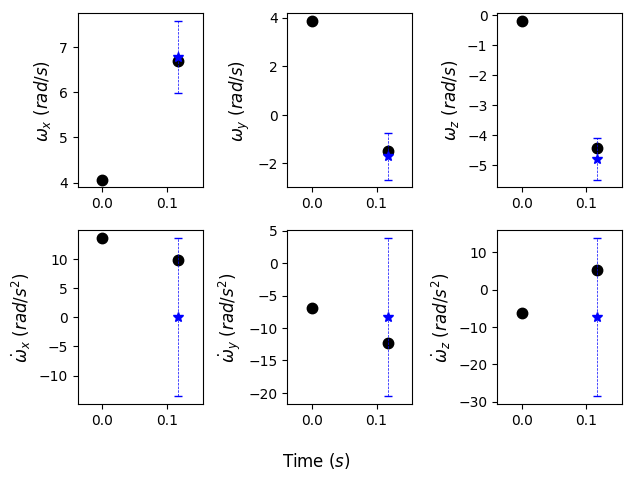

Model saved at epoch 30.

Current Batch Train Loss: -16.107824325561523

Current Batch Train Loss: -16.16139030456543

Current Batch Train Loss: -16.15109634399414

Current Batch Train Loss: -16.051834106445312

Current Batch Train Loss: -16.121213912963867

Current Batch Train Loss: -16.129018783569336

Current Batch Train Loss: -16.13436508178711

Current Batch Train Loss: -16.128324508666992

Current Batch Train Loss: -16.118839263916016

Current Batch Train Loss: -16.1357364654541

Epoch: 31, Batch Testing Loss: -16.14220428466797, Batch Testing Average RMSE: 11.501263618469238 w/ Standard Deviation: 7.977384090423584
Marginal Quantiles: tensor([0.5265, 0.5366, 0.5525, 2.1946, 2.1612, 1.9395, 0.1822, 0.1972, 0.5958,
        3.2630, 3.2742, 5.7378]),
 Joint Quantile: 7.394451141357422
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5967791080474854 ± 0.3015109598636627
Testing Calibrated (joint) Predictive Average Batch NLL: 2.4429233074188232 ± 0.1822907030582428
Test

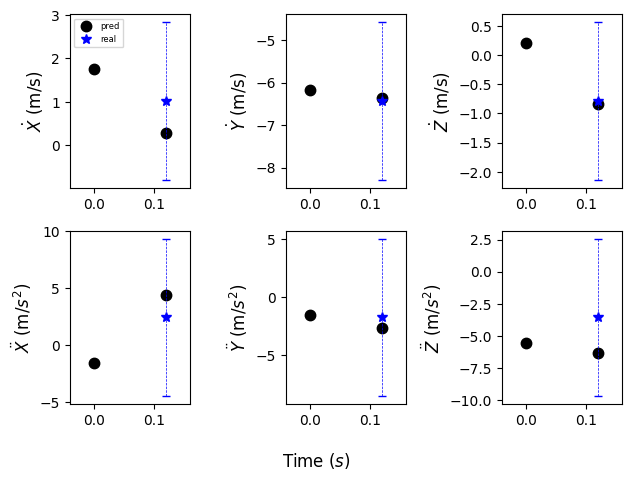

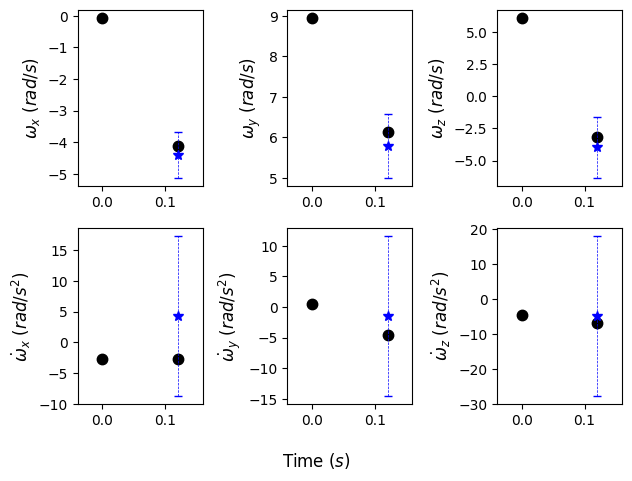

Current Batch Train Loss: -16.106252670288086

Current Batch Train Loss: -16.15567398071289

Current Batch Train Loss: -16.13512420654297

Current Batch Train Loss: -16.129425048828125

Current Batch Train Loss: -16.112247467041016

Current Batch Train Loss: -16.12428855895996

Current Batch Train Loss: -16.13064193725586

Current Batch Train Loss: -16.155500411987305

Current Batch Train Loss: -16.162376403808594

Current Batch Train Loss: -16.125835418701172

Epoch: 32, Batch Testing Loss: -16.07138442993164, Batch Testing Average RMSE: 11.40898323059082 w/ Standard Deviation: 8.792564392089844
Marginal Quantiles: tensor([0.5924, 0.6518, 0.5982, 2.2361, 2.1185, 2.0777, 0.2253, 0.1940, 0.4331,
        3.0974, 3.4005, 5.7777]),
 Joint Quantile: 7.790546417236328
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.6612781286239624 ± 1.9568135738372803
Testing Calibrated (joint) Predictive Average Batch NLL: 2.4648473262786865 ± 0.16068480908870697
Testing Uncalibrated Predicti

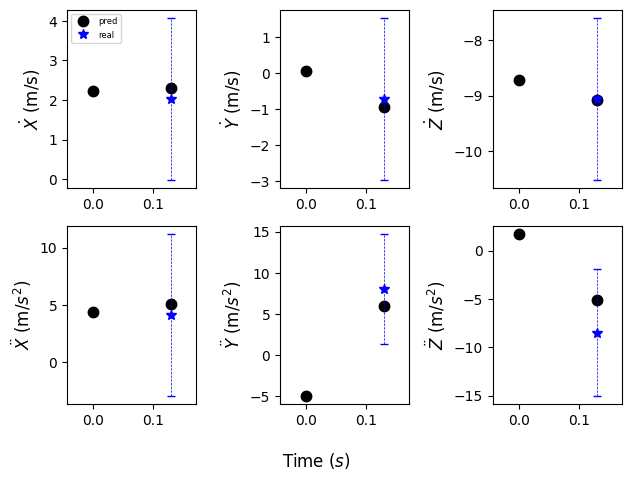

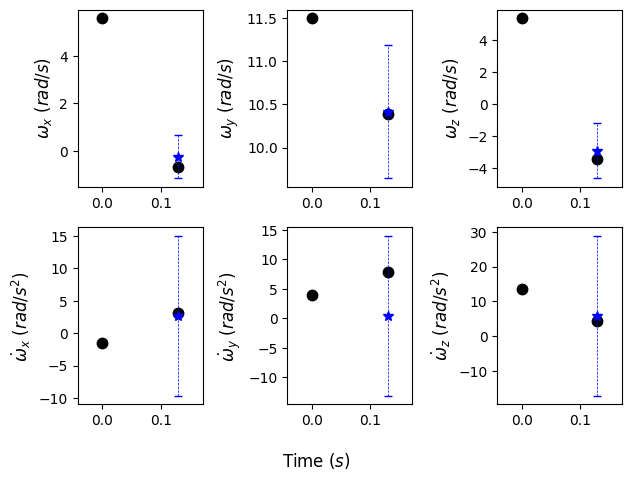

Current Batch Train Loss: -16.119922637939453

Current Batch Train Loss: -16.099042892456055

Current Batch Train Loss: -16.11512565612793

Current Batch Train Loss: -16.124515533447266

Current Batch Train Loss: -16.14815330505371

Current Batch Train Loss: -16.09233283996582

Current Batch Train Loss: -16.121423721313477

Current Batch Train Loss: -16.135250091552734

Current Batch Train Loss: -16.132619857788086

Current Batch Train Loss: -16.1430721282959

Epoch: 33, Batch Testing Loss: -16.10959815979004, Batch Testing Average RMSE: 10.875720024108887 w/ Standard Deviation: 8.075481414794922
Marginal Quantiles: tensor([0.5405, 0.5519, 0.5603, 2.1761, 2.0763, 1.9824, 0.2179, 0.2349, 0.2460,
        3.2447, 3.4225, 5.7510]),
 Joint Quantile: 7.518447399139404
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.564951777458191 ± 0.26046934723854065
Testing Calibrated (joint) Predictive Average Batch NLL: 2.446927785873413 ± 0.1388770192861557
Testing Uncalibrated Predictive

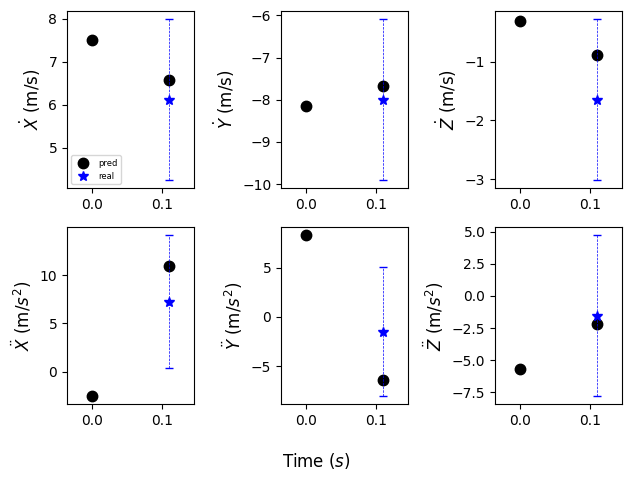

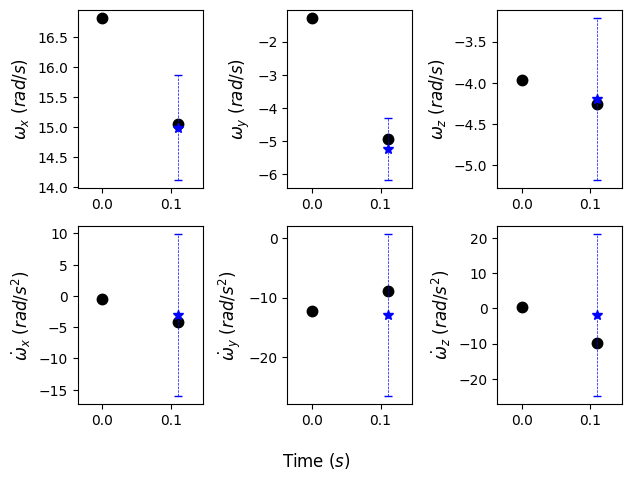

Current Batch Train Loss: -16.11107063293457

Current Batch Train Loss: -16.088817596435547

Current Batch Train Loss: -16.107524871826172

Current Batch Train Loss: -16.0876522064209

Current Batch Train Loss: -16.141862869262695

Current Batch Train Loss: -16.12790870666504

Current Batch Train Loss: -16.097963333129883

Current Batch Train Loss: -16.108659744262695

Current Batch Train Loss: -16.12179946899414

Current Batch Train Loss: -16.096454620361328

Epoch: 34, Batch Testing Loss: -16.12424659729004, Batch Testing Average RMSE: 10.731969833374023 w/ Standard Deviation: 8.090912818908691
Marginal Quantiles: tensor([0.5460, 0.5353, 0.5313, 2.1661, 2.2348, 1.9290, 0.1953, 0.2192, 0.3879,
        3.3432, 3.0392, 5.7311]),
 Joint Quantile: 7.334999084472656
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5712155103683472 ± 0.32865002751350403
Testing Calibrated (joint) Predictive Average Batch NLL: 2.4347035884857178 ± 0.1629672348499298
Testing Uncalibrated Predicti

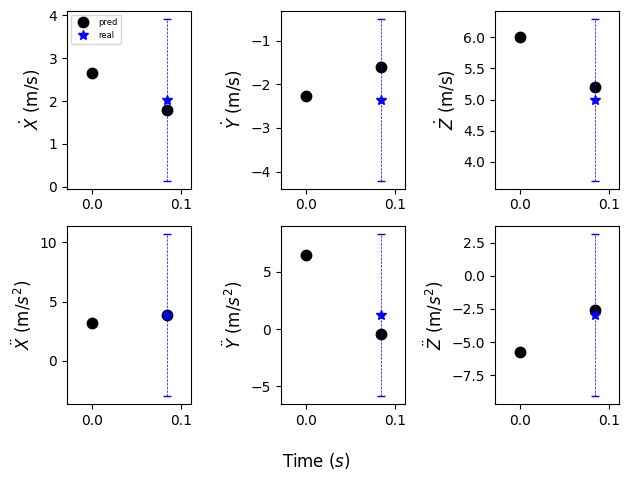

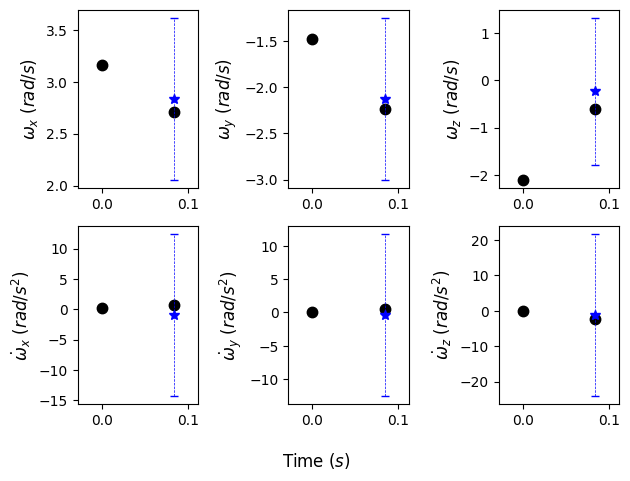

Current Batch Train Loss: -16.09685707092285

Current Batch Train Loss: -16.14179801940918

Current Batch Train Loss: -16.131023406982422

Current Batch Train Loss: -16.097196578979492

Current Batch Train Loss: -16.113765716552734

Current Batch Train Loss: -16.116525650024414

Current Batch Train Loss: -16.106300354003906

Current Batch Train Loss: -16.125396728515625

Current Batch Train Loss: -16.079479217529297

Current Batch Train Loss: -16.066930770874023

Epoch: 35, Batch Testing Loss: -16.127342224121094, Batch Testing Average RMSE: 10.835965156555176 w/ Standard Deviation: 8.25153636932373
Marginal Quantiles: tensor([0.6020, 0.5569, 0.5434, 2.0727, 2.0284, 2.0002, 0.2463, 0.2227, 0.2111,
        3.5093, 3.5786, 5.2023]),
 Joint Quantile: 7.448394775390625
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.568821907043457 ± 0.3558851182460785
Testing Calibrated (joint) Predictive Average Batch NLL: 2.4413704872131348 ± 0.14974336326122284
Testing Uncalibrated Predic

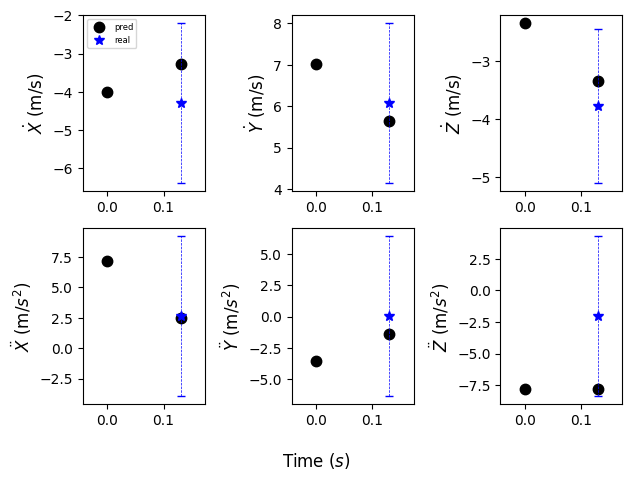

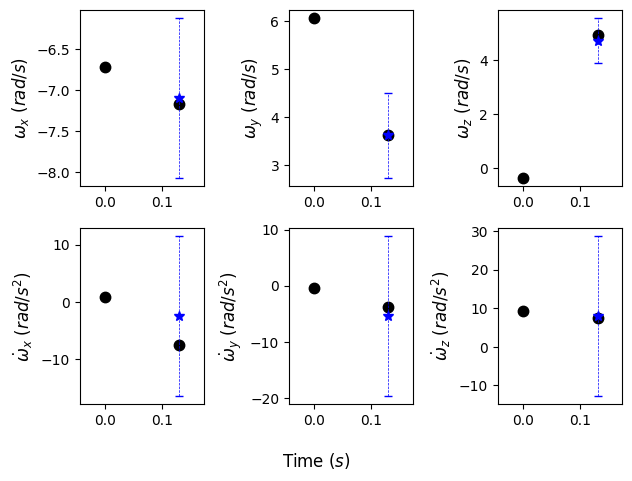

Model saved at epoch 35.

Current Batch Train Loss: -16.118040084838867

Current Batch Train Loss: -16.09459686279297

Current Batch Train Loss: -16.092378616333008

Current Batch Train Loss: -16.147186279296875

Current Batch Train Loss: -16.150747299194336

Current Batch Train Loss: -16.164167404174805

Current Batch Train Loss: -16.114574432373047

Current Batch Train Loss: -16.12453269958496

Current Batch Train Loss: -16.13768196105957

Current Batch Train Loss: -16.14042091369629

Epoch: 36, Batch Testing Loss: -16.116456985473633, Batch Testing Average RMSE: 10.469857215881348 w/ Standard Deviation: 7.872714519500732
Marginal Quantiles: tensor([0.6551, 0.5729, 0.5717, 2.1291, 1.9605, 2.0125, 0.2137, 0.1762, 0.2294,
        3.0762, 3.1026, 5.3235]),
 Joint Quantile: 6.960885047912598
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5455023050308228 ± 0.3193100392818451
Testing Calibrated (joint) Predictive Average Batch NLL: 2.406357765197754 ± 0.1463537961244583
Tes

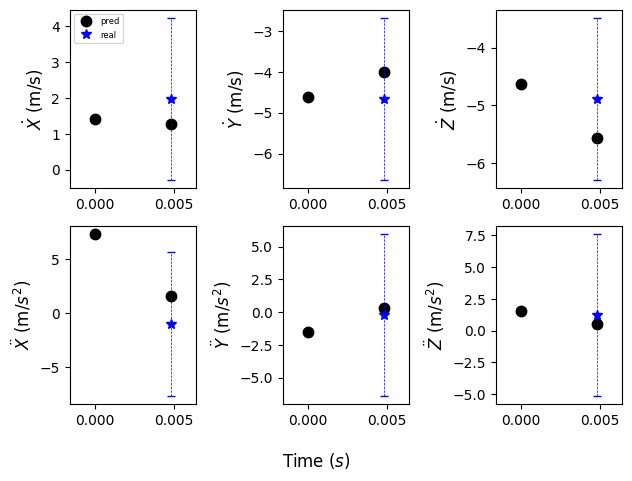

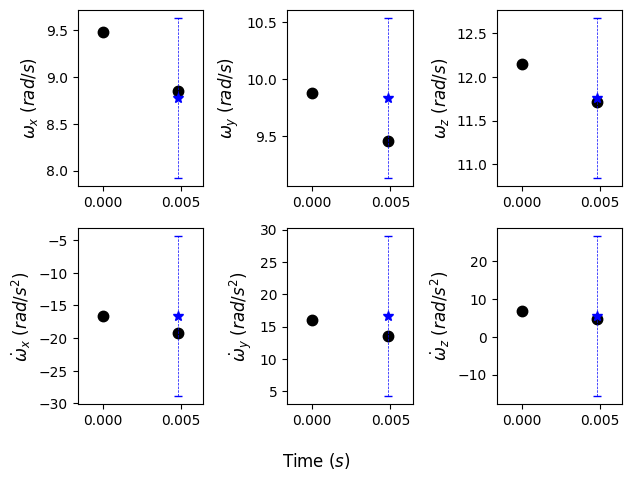

Current Batch Train Loss: -16.096420288085938

Current Batch Train Loss: -16.085634231567383

Current Batch Train Loss: -16.119752883911133

Current Batch Train Loss: -16.090360641479492

Current Batch Train Loss: -16.12911605834961

Current Batch Train Loss: -16.097518920898438

Current Batch Train Loss: -16.095064163208008

Current Batch Train Loss: -16.088376998901367

Current Batch Train Loss: -16.10828971862793

Current Batch Train Loss: -16.099971771240234

Epoch: 37, Batch Testing Loss: -16.11894989013672, Batch Testing Average RMSE: 10.471492767333984 w/ Standard Deviation: 8.376472473144531
Marginal Quantiles: tensor([0.4941, 0.5413, 0.5596, 2.0821, 2.2120, 2.0816, 0.2162, 0.2112, 0.2083,
        3.1896, 3.1655, 5.3965]),
 Joint Quantile: 7.210079669952393
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5477652549743652 ± 0.38254600763320923
Testing Calibrated (joint) Predictive Average Batch NLL: 2.4313786029815674 ± 0.2372191995382309
Testing Uncalibrated Predi

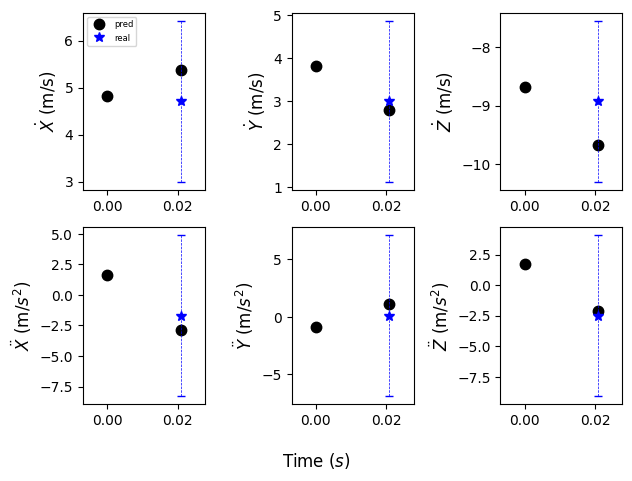

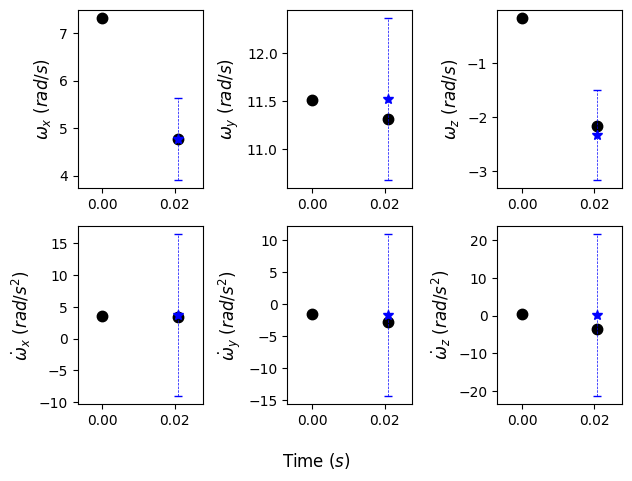

Current Batch Train Loss: -16.10873031616211

Current Batch Train Loss: -16.09168243408203

Current Batch Train Loss: -16.110347747802734

Current Batch Train Loss: -16.121681213378906

Current Batch Train Loss: -16.05455207824707

Current Batch Train Loss: -16.1398983001709

Current Batch Train Loss: -16.117862701416016

Current Batch Train Loss: -16.138416290283203

Current Batch Train Loss: -16.110795974731445

Current Batch Train Loss: -16.100488662719727

Epoch: 38, Batch Testing Loss: -16.077360153198242, Batch Testing Average RMSE: 10.523354530334473 w/ Standard Deviation: 7.416313171386719
Marginal Quantiles: tensor([0.5139, 0.5654, 0.5608, 2.0211, 2.2201, 1.9708, 0.1893, 0.3103, 0.2196,
        3.3832, 3.1526, 5.2952]),
 Joint Quantile: 7.01041316986084
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5502746105194092 ± 0.2428653985261917
Testing Calibrated (joint) Predictive Average Batch NLL: 2.4097654819488525 ± 0.13950525224208832
Testing Uncalibrated Predicti

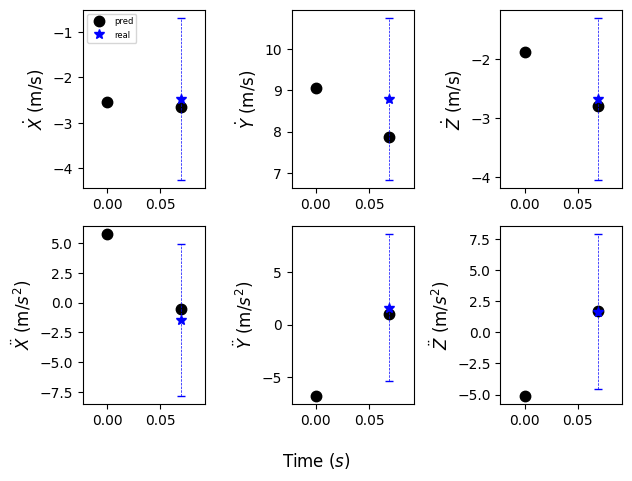

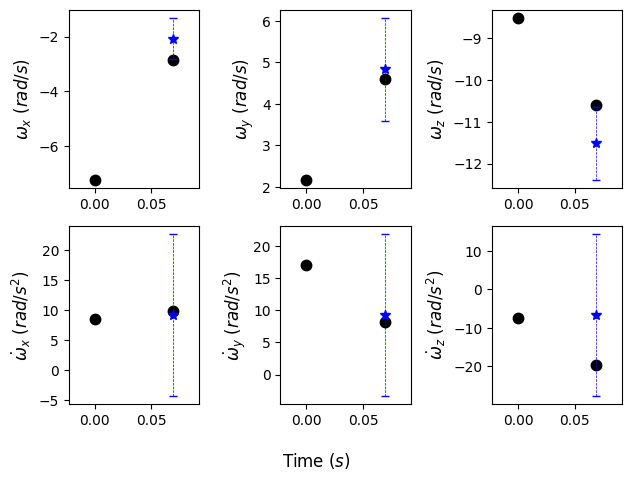

Current Batch Train Loss: -16.125717163085938

Current Batch Train Loss: -16.073122024536133

Current Batch Train Loss: -16.084918975830078

Current Batch Train Loss: -16.12189292907715

Current Batch Train Loss: -16.121740341186523

Current Batch Train Loss: -16.051822662353516

Current Batch Train Loss: -16.08623695373535

Current Batch Train Loss: -16.115970611572266

Current Batch Train Loss: -16.115598678588867

Current Batch Train Loss: -16.13603973388672

Epoch: 39, Batch Testing Loss: -16.115354537963867, Batch Testing Average RMSE: 11.00563907623291 w/ Standard Deviation: 7.340336799621582
Marginal Quantiles: tensor([0.6698, 0.5466, 0.5376, 2.1405, 2.0160, 1.9354, 0.2262, 0.2012, 0.4153,
        3.2190, 3.1472, 5.3518]),
 Joint Quantile: 7.150644779205322
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.578182339668274 ± 0.238816499710083
Testing Calibrated (joint) Predictive Average Batch NLL: 2.4201107025146484 ± 0.12964212894439697
Testing Uncalibrated Predicti

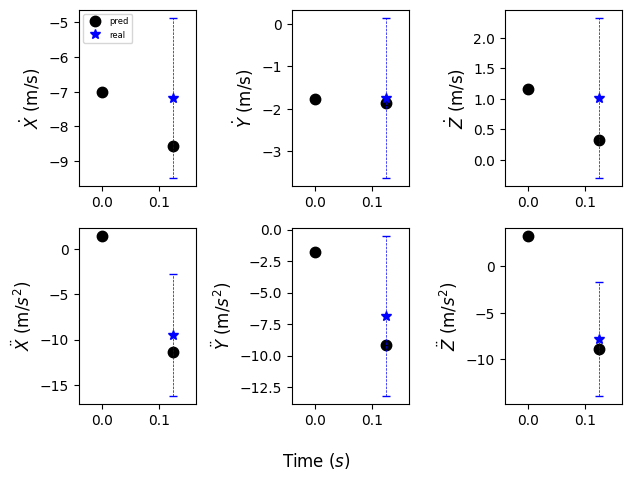

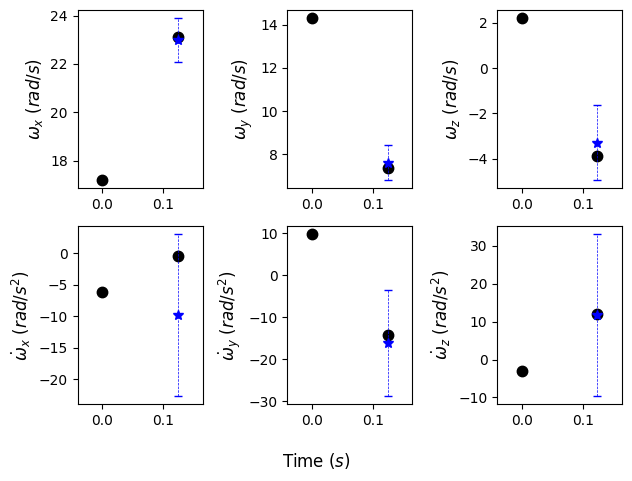

Current Batch Train Loss: -16.107072830200195

Current Batch Train Loss: -16.108566284179688

Current Batch Train Loss: -16.054540634155273

Current Batch Train Loss: -16.09586524963379

Current Batch Train Loss: -16.100126266479492

Current Batch Train Loss: -16.133052825927734

Current Batch Train Loss: -16.10645294189453

Current Batch Train Loss: -16.076759338378906

Current Batch Train Loss: -16.066518783569336

Current Batch Train Loss: -16.112964630126953

Epoch: 40, Batch Testing Loss: -16.065841674804688, Batch Testing Average RMSE: 10.736743927001953 w/ Standard Deviation: 8.148391723632812
Marginal Quantiles: tensor([0.5245, 0.5849, 0.5243, 2.1935, 2.2293, 1.9953, 0.2624, 0.1786, 0.3310,
        3.2640, 3.3404, 5.7194]),
 Joint Quantile: 7.396225452423096
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5710619688034058 ± 0.2961972951889038
Testing Calibrated (joint) Predictive Average Batch NLL: 2.438246965408325 ± 0.1711074262857437
Testing Uncalibrated Predic

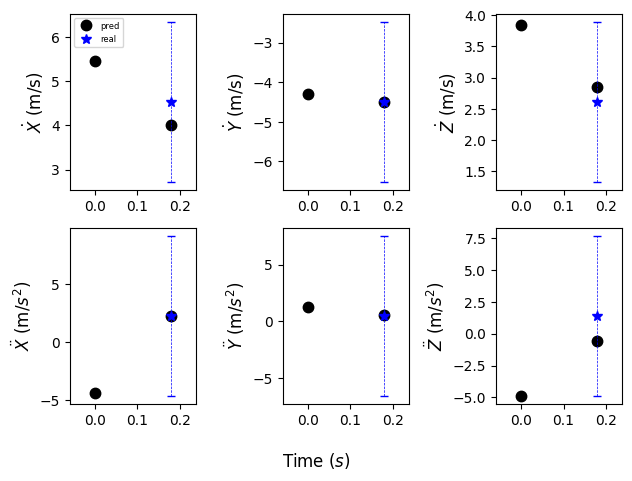

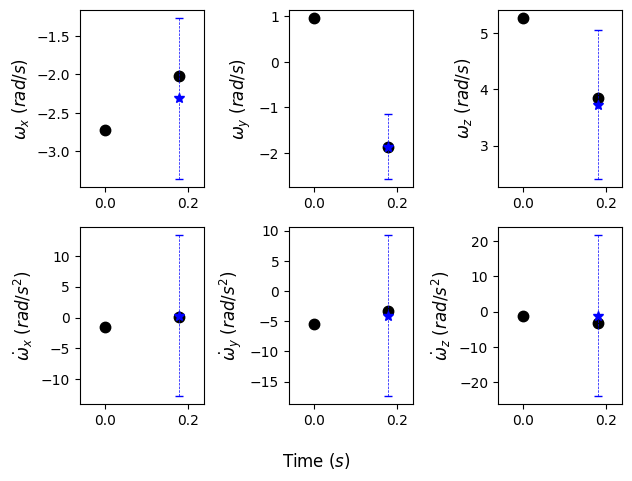

Model saved at epoch 40.

Current Batch Train Loss: -16.087326049804688

Current Batch Train Loss: -16.0534610748291

Current Batch Train Loss: -16.092918395996094

Current Batch Train Loss: -16.095510482788086

Current Batch Train Loss: -16.080659866333008

Current Batch Train Loss: -16.093069076538086

Current Batch Train Loss: -16.080251693725586

Current Batch Train Loss: -16.091554641723633

Current Batch Train Loss: -16.116405487060547

Current Batch Train Loss: -16.1206111907959

Epoch: 41, Batch Testing Loss: -16.100326538085938, Batch Testing Average RMSE: 10.375391960144043 w/ Standard Deviation: 7.596686363220215
Marginal Quantiles: tensor([0.5408, 0.6062, 0.5311, 2.0891, 2.0187, 2.0732, 0.2546, 0.2253, 0.2874,
        3.4290, 3.2447, 5.5654]),
 Joint Quantile: 7.288618087768555
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.561975121498108 ± 0.2320302575826645
Testing Calibrated (joint) Predictive Average Batch NLL: 2.4256680011749268 ± 0.1287248581647873
Tes

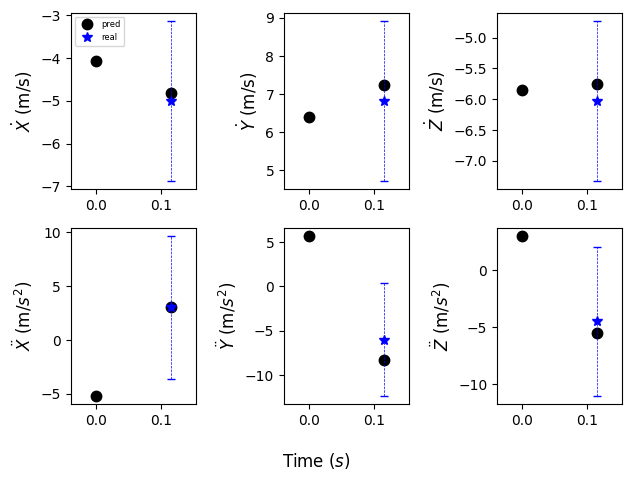

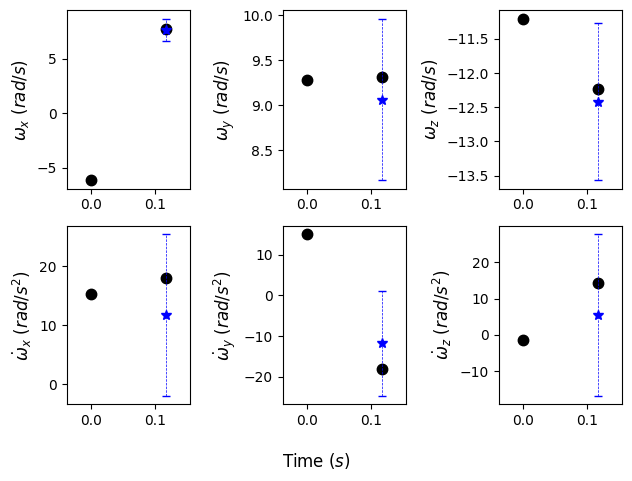

Current Batch Train Loss: -16.10616683959961

Current Batch Train Loss: -16.12167739868164

Current Batch Train Loss: -16.11446762084961

Current Batch Train Loss: -16.09273910522461

Current Batch Train Loss: -16.077417373657227

Current Batch Train Loss: -16.09266471862793

Current Batch Train Loss: -16.063161849975586

Current Batch Train Loss: -16.112653732299805

Current Batch Train Loss: -16.058874130249023

Current Batch Train Loss: -16.12824249267578

Epoch: 42, Batch Testing Loss: -16.10075569152832, Batch Testing Average RMSE: 10.971929550170898 w/ Standard Deviation: 7.722103118896484
Marginal Quantiles: tensor([0.5999, 0.6252, 0.5853, 2.1499, 2.1431, 2.0316, 0.2559, 0.3819, 0.2930,
        3.2543, 3.0803, 5.2994]),
 Joint Quantile: 7.078453063964844
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.6070621013641357 ± 0.3596976399421692
Testing Calibrated (joint) Predictive Average Batch NLL: 2.4125096797943115 ± 0.121039018034935
Testing Uncalibrated Predictive 

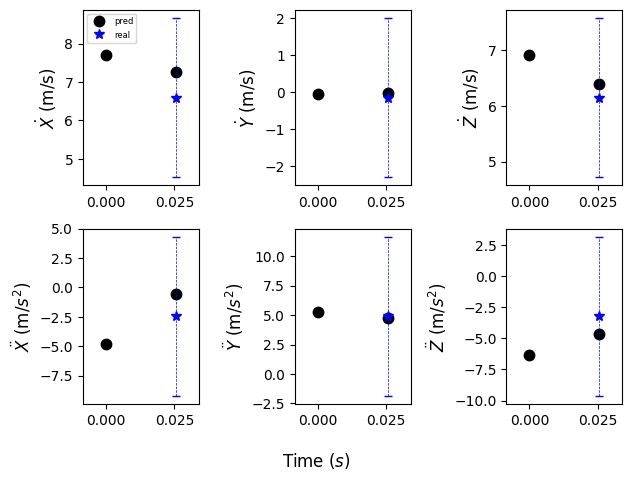

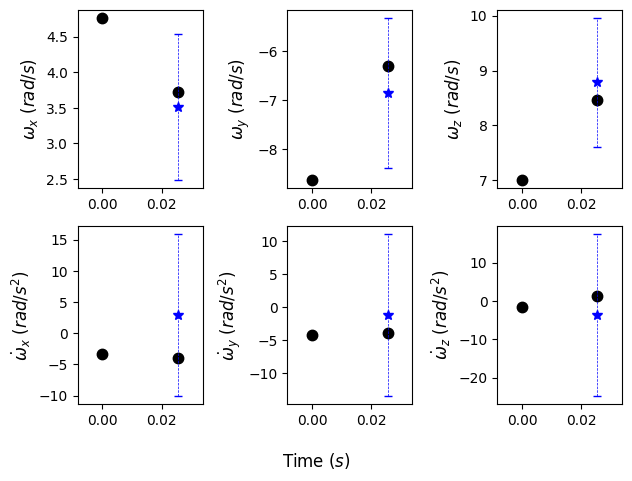

Current Batch Train Loss: -16.0601863861084

Current Batch Train Loss: -16.12156867980957

Current Batch Train Loss: -16.068984985351562

Current Batch Train Loss: -16.091276168823242

Current Batch Train Loss: -16.152864456176758

Current Batch Train Loss: -16.09418487548828

Current Batch Train Loss: -16.062110900878906

Current Batch Train Loss: -16.093730926513672

Current Batch Train Loss: -16.100099563598633

Current Batch Train Loss: -16.09647560119629

Epoch: 43, Batch Testing Loss: -16.062454223632812, Batch Testing Average RMSE: 10.588608741760254 w/ Standard Deviation: 7.866934776306152
Marginal Quantiles: tensor([0.5413, 0.5891, 0.5535, 2.1922, 2.0126, 1.9132, 0.2997, 0.2840, 0.2794,
        3.1568, 3.0034, 5.3180]),
 Joint Quantile: 6.8095197677612305
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5823191404342651 ± 0.35170409083366394
Testing Calibrated (joint) Predictive Average Batch NLL: 2.3985307216644287 ± 0.1632383167743683
Testing Uncalibrated Predic

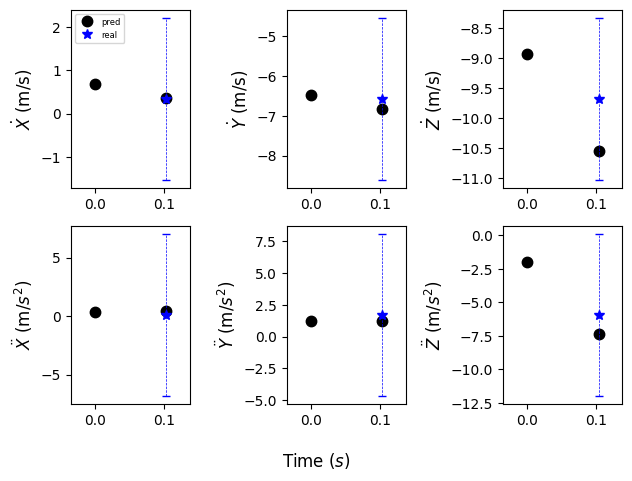

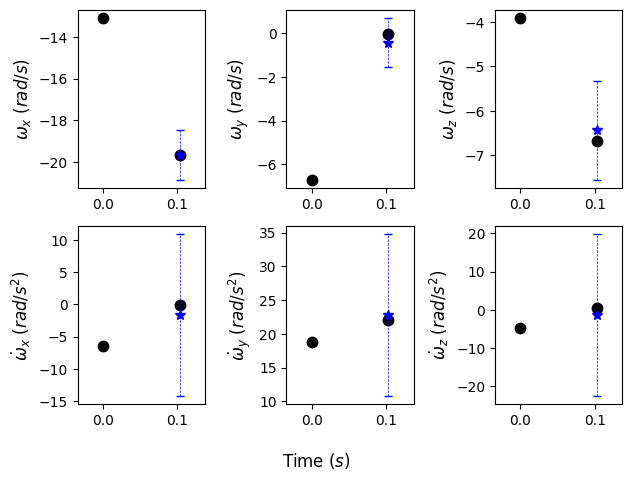

Current Batch Train Loss: -16.081607818603516

Current Batch Train Loss: -16.124555587768555

Current Batch Train Loss: -16.10051918029785

Current Batch Train Loss: -16.08478546142578

Current Batch Train Loss: -16.093250274658203

Current Batch Train Loss: -16.116554260253906

Current Batch Train Loss: -16.083036422729492

Current Batch Train Loss: -16.091588973999023

Current Batch Train Loss: -16.10211753845215

Current Batch Train Loss: -16.109609603881836

Epoch: 44, Batch Testing Loss: -16.102340698242188, Batch Testing Average RMSE: 10.731410026550293 w/ Standard Deviation: 7.565917015075684
Marginal Quantiles: tensor([0.6191, 0.5542, 0.5489, 2.0260, 2.0226, 1.9314, 0.3113, 0.2015, 0.3563,
        3.1213, 3.3776, 5.5637]),
 Joint Quantile: 7.612165451049805
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.578809142112732 ± 0.23474720120429993
Testing Calibrated (joint) Predictive Average Batch NLL: 2.443770408630371 ± 0.12071447819471359
Testing Uncalibrated Predic

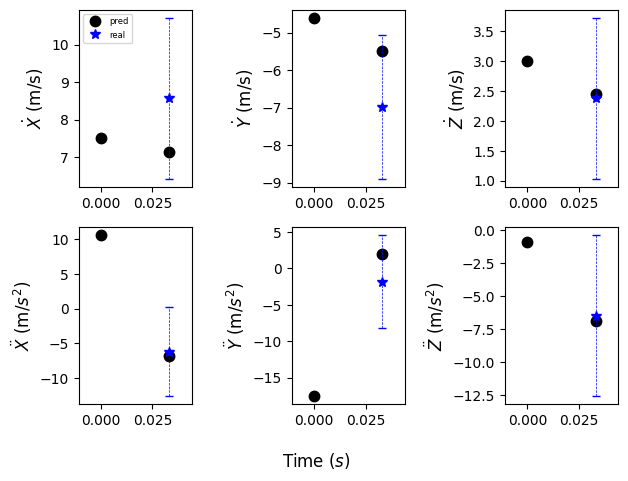

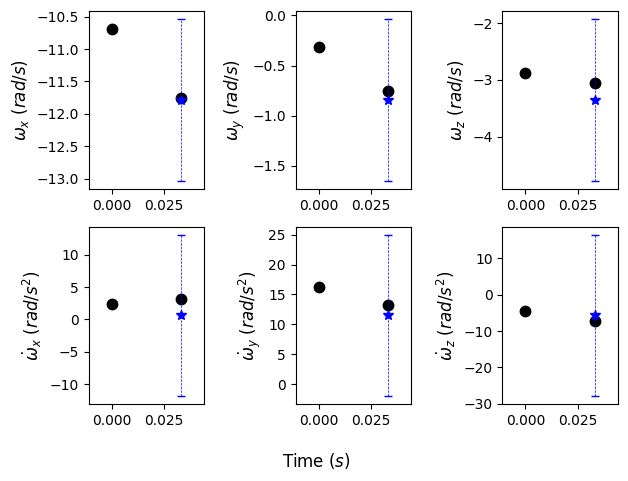

Current Batch Train Loss: -16.064119338989258

Current Batch Train Loss: -16.097497940063477

Current Batch Train Loss: -16.025104522705078

Current Batch Train Loss: -16.07546615600586

Current Batch Train Loss: -16.058902740478516

Current Batch Train Loss: -16.091079711914062

Current Batch Train Loss: -16.086923599243164

Current Batch Train Loss: -16.10327911376953

Current Batch Train Loss: -16.054031372070312

Current Batch Train Loss: -16.10688591003418

Epoch: 45, Batch Testing Loss: -16.038959503173828, Batch Testing Average RMSE: 11.318469047546387 w/ Standard Deviation: 8.055206298828125
Marginal Quantiles: tensor([0.5716, 0.6404, 0.5228, 2.0842, 1.9741, 1.9828, 0.4526, 0.2164, 0.4062,
        3.2077, 3.3963, 5.4606]),
 Joint Quantile: 7.5584893226623535
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.620123267173767 ± 0.2726652920246124
Testing Calibrated (joint) Predictive Average Batch NLL: 2.4474399089813232 ± 0.13961710035800934
Testing Uncalibrated Predi

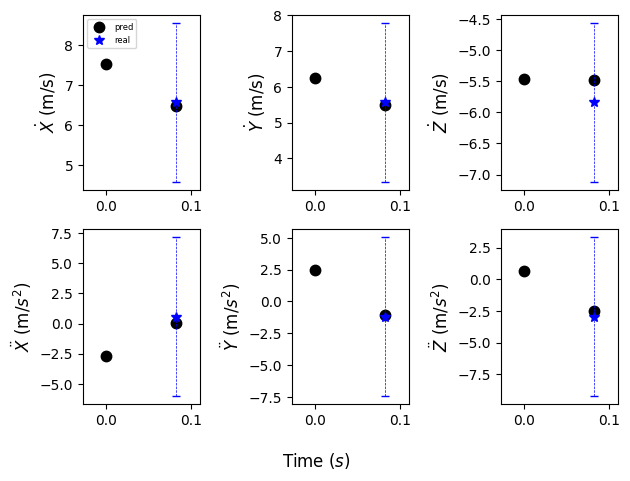

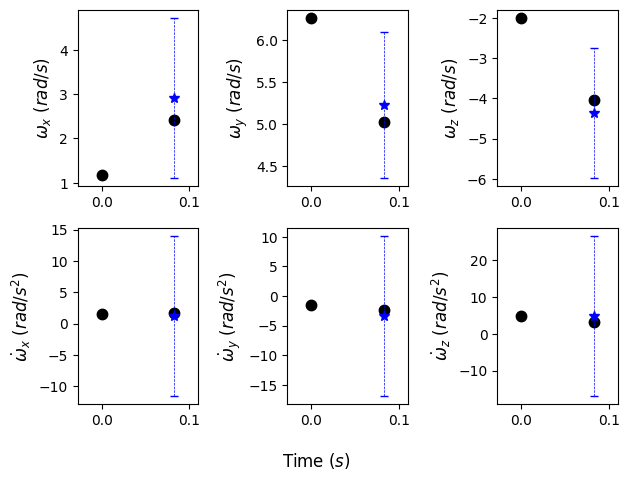

Model saved at epoch 45.

Current Batch Train Loss: -16.10880470275879

Current Batch Train Loss: -16.11627197265625

Current Batch Train Loss: -16.06960105895996

Current Batch Train Loss: -16.08392333984375

Current Batch Train Loss: -16.008333206176758

Current Batch Train Loss: -16.084089279174805

Current Batch Train Loss: -16.154706954956055

Current Batch Train Loss: -16.11168670654297

Current Batch Train Loss: -16.080190658569336

Current Batch Train Loss: -16.073488235473633

Epoch: 46, Batch Testing Loss: -16.100786209106445, Batch Testing Average RMSE: 10.74293327331543 w/ Standard Deviation: 7.64776086807251
Marginal Quantiles: tensor([0.6557, 0.5839, 0.5899, 2.1015, 2.1738, 1.9996, 0.2141, 0.2353, 0.2845,
        3.3189, 3.0556, 5.2512]),
 Joint Quantile: 6.849818706512451
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5734392404556274 ± 0.32144615054130554
Testing Calibrated (joint) Predictive Average Batch NLL: 2.397892951965332 ± 0.12003523111343384
Test

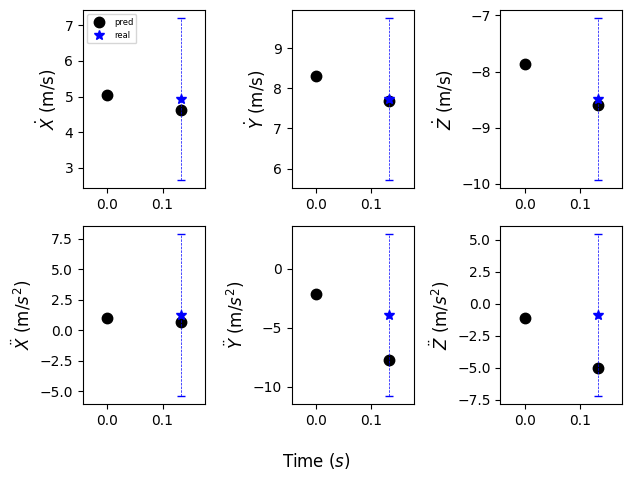

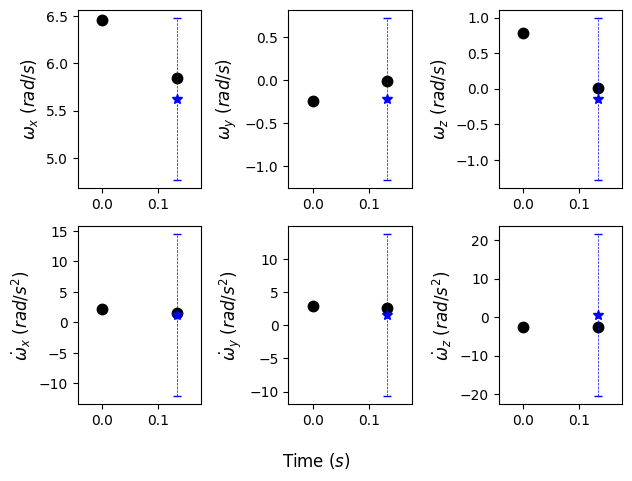

Current Batch Train Loss: -16.101062774658203

Current Batch Train Loss: -16.052934646606445

Current Batch Train Loss: -16.102914810180664

Current Batch Train Loss: -16.050640106201172

Current Batch Train Loss: -16.071157455444336

Current Batch Train Loss: -16.031898498535156

Current Batch Train Loss: -16.11208724975586

Current Batch Train Loss: -16.10062599182129

Current Batch Train Loss: -16.0603084564209

Current Batch Train Loss: -16.1033992767334

Epoch: 47, Batch Testing Loss: -16.132062911987305, Batch Testing Average RMSE: 10.009084701538086 w/ Standard Deviation: 7.770935535430908
Marginal Quantiles: tensor([0.5176, 0.4988, 0.4914, 1.9594, 2.0343, 1.9154, 0.2076, 0.1822, 0.2990,
        3.2749, 3.2955, 5.2296]),
 Joint Quantile: 7.235045909881592
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5245301723480225 ± 0.2672770619392395
Testing Calibrated (joint) Predictive Average Batch NLL: 2.4201736450195312 ± 0.13871818780899048
Testing Uncalibrated Predicti

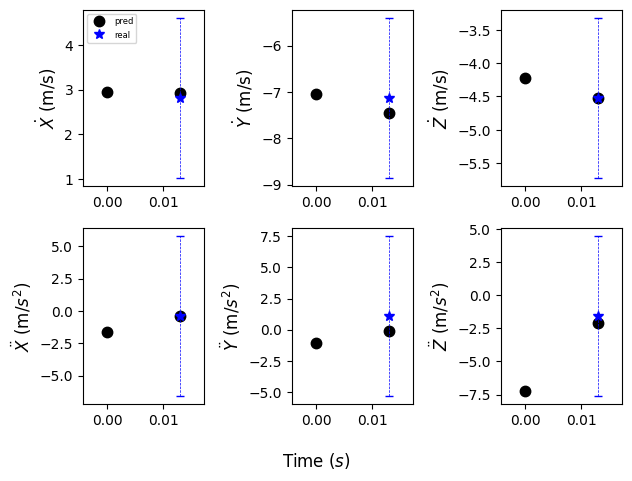

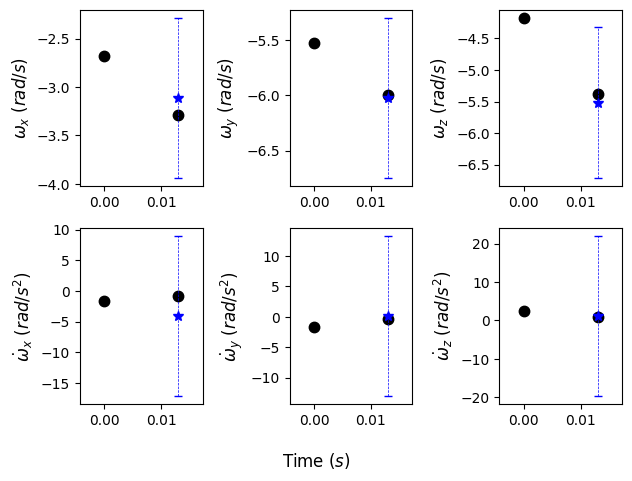

Current Batch Train Loss: -16.094600677490234

Current Batch Train Loss: -16.056800842285156

Current Batch Train Loss: -16.05531883239746

Current Batch Train Loss: -16.077360153198242

Current Batch Train Loss: -16.065553665161133

Current Batch Train Loss: -16.052549362182617

Current Batch Train Loss: -16.10536766052246

Current Batch Train Loss: -16.1125431060791

Current Batch Train Loss: -16.074758529663086

Current Batch Train Loss: -16.11263084411621

Epoch: 48, Batch Testing Loss: -16.10874366760254, Batch Testing Average RMSE: 10.342745780944824 w/ Standard Deviation: 7.838376998901367
Marginal Quantiles: tensor([0.5674, 0.6163, 0.5450, 2.0802, 2.1805, 1.9364, 0.2709, 0.1772, 0.3188,
        3.0263, 3.2263, 5.5277]),
 Joint Quantile: 6.97902250289917
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5659347772598267 ± 0.30858397483825684
Testing Calibrated (joint) Predictive Average Batch NLL: 2.4113380908966064 ± 0.1913682520389557
Testing Uncalibrated Predictiv

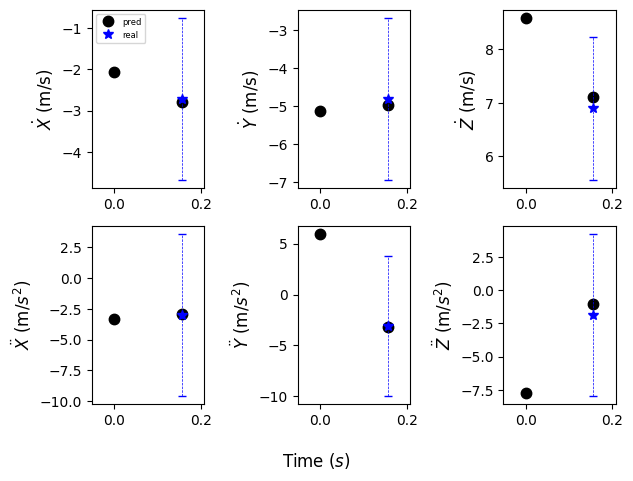

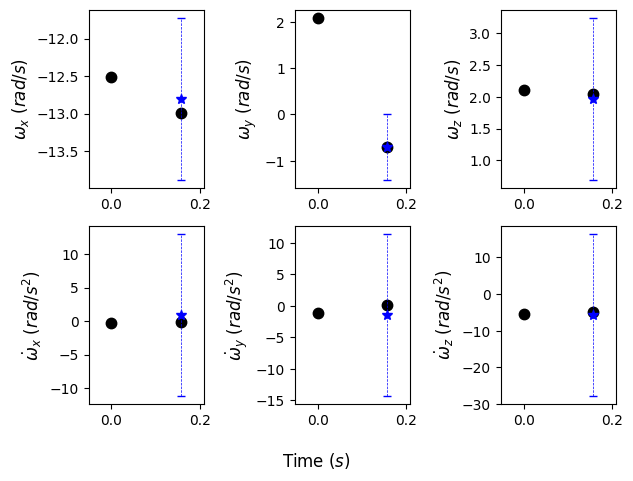

Current Batch Train Loss: -16.064977645874023

Current Batch Train Loss: -16.06656265258789

Current Batch Train Loss: -16.114229202270508

Current Batch Train Loss: -16.108808517456055

Current Batch Train Loss: -16.047000885009766

Current Batch Train Loss: -16.03541374206543

Current Batch Train Loss: -16.05768585205078

Current Batch Train Loss: -16.084095001220703

Current Batch Train Loss: -16.094234466552734

Current Batch Train Loss: -16.078474044799805

Epoch: 49, Batch Testing Loss: -16.0786190032959, Batch Testing Average RMSE: 10.586244583129883 w/ Standard Deviation: 7.864311695098877
Marginal Quantiles: tensor([0.5679, 0.5148, 0.5803, 2.1480, 2.0585, 2.0671, 0.2709, 0.2336, 0.3321,
        3.1749, 2.9640, 5.4817]),
 Joint Quantile: 7.842445373535156
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5799620151519775 ± 0.2857306897640228
Testing Calibrated (joint) Predictive Average Batch NLL: 2.4611966609954834 ± 0.13818255066871643
Testing Uncalibrated Predict

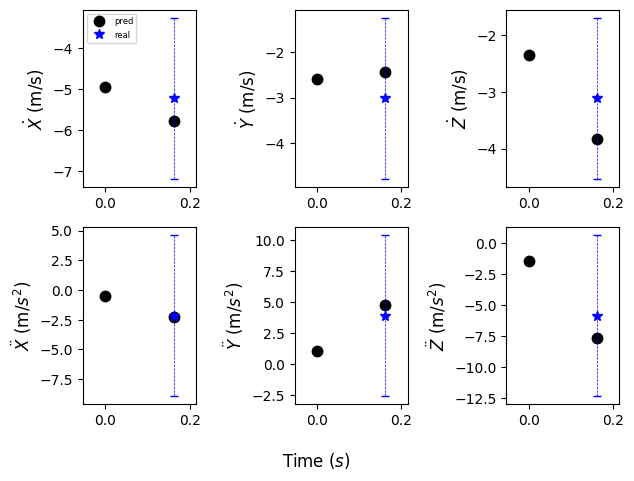

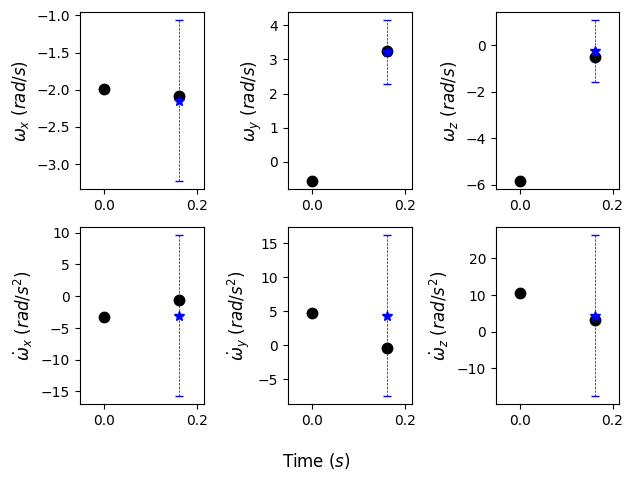

Current Batch Train Loss: -16.064546585083008

Current Batch Train Loss: -16.024993896484375

Current Batch Train Loss: -16.103527069091797

Current Batch Train Loss: -16.06126594543457

Current Batch Train Loss: -16.057323455810547

Current Batch Train Loss: -16.101585388183594

Current Batch Train Loss: -16.056533813476562

Current Batch Train Loss: -16.0799560546875

Current Batch Train Loss: -16.092191696166992

Current Batch Train Loss: -16.053855895996094

Epoch: 50, Batch Testing Loss: -16.071809768676758, Batch Testing Average RMSE: 10.373990058898926 w/ Standard Deviation: 7.29955530166626
Marginal Quantiles: tensor([0.5742, 0.5442, 0.5519, 1.9583, 2.2422, 1.9979, 0.2393, 0.1487, 0.3033,
        2.9250, 3.0976, 5.3648]),
 Joint Quantile: 6.807302474975586
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5545204877853394 ± 0.7222868800163269
Testing Calibrated (joint) Predictive Average Batch NLL: 2.3942646980285645 ± 0.12915807962417603
Testing Uncalibrated Predic

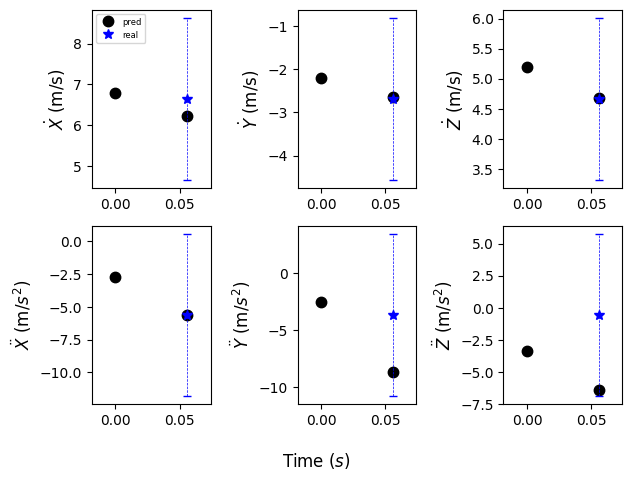

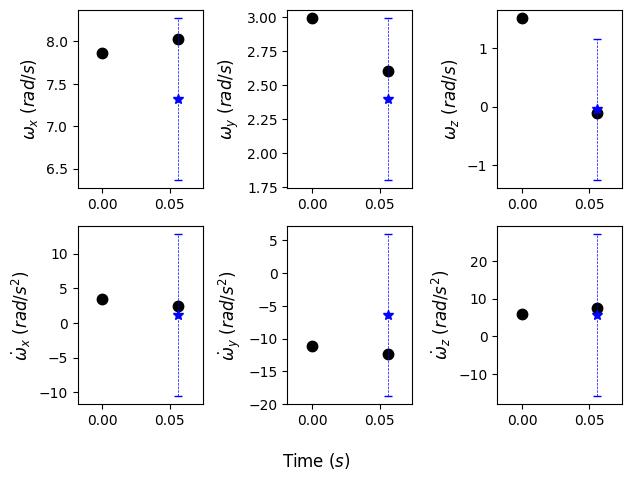

Model saved at epoch 50.

Current Batch Train Loss: -16.153676986694336

Current Batch Train Loss: -16.035844802856445

Current Batch Train Loss: -16.100332260131836

Current Batch Train Loss: -16.1033878326416

Current Batch Train Loss: -16.074832916259766

Current Batch Train Loss: -16.05934715270996

Current Batch Train Loss: -16.062341690063477

Current Batch Train Loss: -16.08727264404297

Current Batch Train Loss: -16.07001495361328

Current Batch Train Loss: -16.106346130371094

Epoch: 51, Batch Testing Loss: -16.052879333496094, Batch Testing Average RMSE: 10.455354690551758 w/ Standard Deviation: 8.282682418823242
Marginal Quantiles: tensor([0.5672, 0.5463, 0.5643, 2.0374, 2.0613, 2.0861, 0.2847, 0.1904, 0.2377,
        3.1072, 3.1741, 5.4842]),
 Joint Quantile: 7.411361217498779
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5592436790466309 ± 0.34074103832244873
Testing Calibrated (joint) Predictive Average Batch NLL: 2.438042640686035 ± 0.1866873949766159
Tes

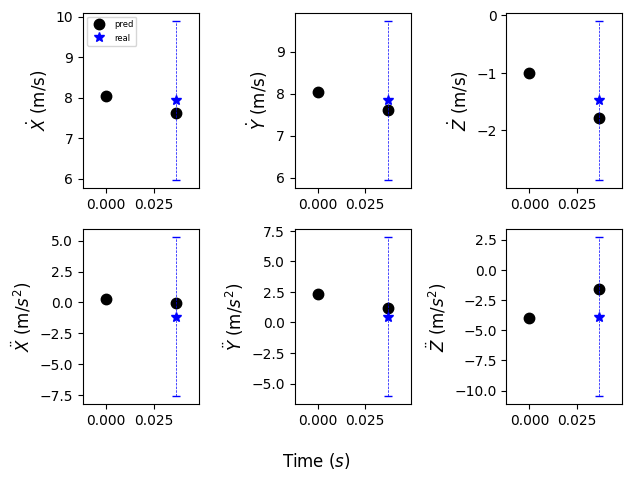

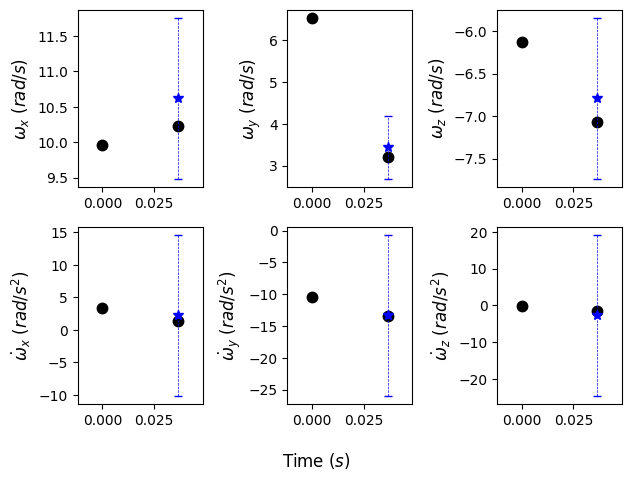

Current Batch Train Loss: -16.064985275268555

Current Batch Train Loss: -16.05492401123047

Current Batch Train Loss: -16.037269592285156

Current Batch Train Loss: -16.03672218322754

Current Batch Train Loss: -16.054763793945312

Current Batch Train Loss: -16.042566299438477

Current Batch Train Loss: -16.085552215576172

Current Batch Train Loss: -16.078128814697266

Current Batch Train Loss: -16.050432205200195

Current Batch Train Loss: -16.041757583618164

Epoch: 52, Batch Testing Loss: -16.06415557861328, Batch Testing Average RMSE: 9.894065856933594 w/ Standard Deviation: 7.558793067932129
Marginal Quantiles: tensor([0.5342, 0.5994, 0.5214, 2.0709, 1.9011, 1.9067, 0.2185, 0.1485, 0.2492,
        2.8504, 2.9723, 5.2115]),
 Joint Quantile: 6.743041038513184
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.516502857208252 ± 0.31672030687332153
Testing Calibrated (joint) Predictive Average Batch NLL: 2.3903093338012695 ± 0.18233104050159454
Testing Uncalibrated Predic

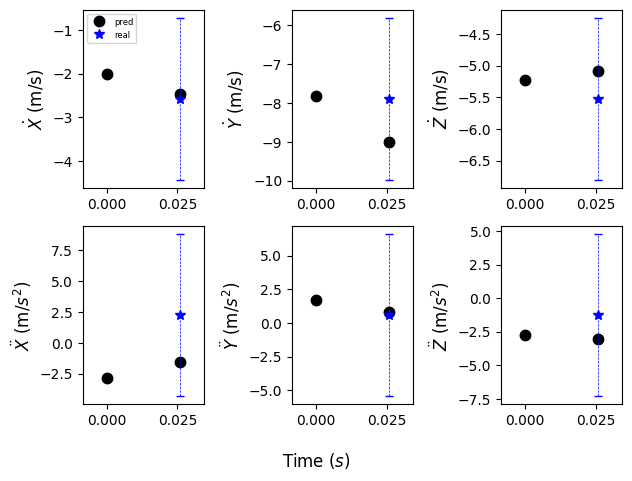

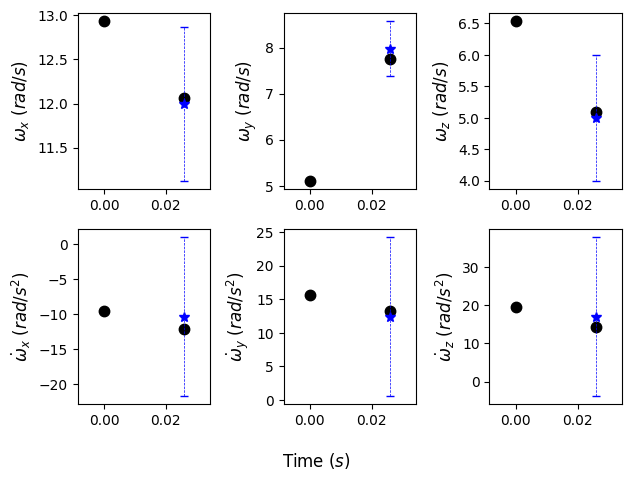

Current Batch Train Loss: -16.077972412109375

Current Batch Train Loss: -16.069683074951172

Current Batch Train Loss: -16.07876968383789

Current Batch Train Loss: -16.040212631225586

Current Batch Train Loss: -16.046897888183594

Current Batch Train Loss: -16.08295440673828

Current Batch Train Loss: -16.038311004638672

Current Batch Train Loss: -16.08935546875

Current Batch Train Loss: -16.059663772583008

Current Batch Train Loss: -16.065935134887695

Epoch: 53, Batch Testing Loss: -16.073528289794922, Batch Testing Average RMSE: 10.598740577697754 w/ Standard Deviation: 7.470219135284424
Marginal Quantiles: tensor([0.5674, 0.5653, 0.6425, 1.9697, 1.9983, 1.9852, 0.2229, 0.2132, 0.4263,
        3.2141, 3.1188, 4.9687]),
 Joint Quantile: 6.776853084564209
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5759145021438599 ± 0.2963675260543823
Testing Calibrated (joint) Predictive Average Batch NLL: 2.3951685428619385 ± 0.17743796110153198
Testing Uncalibrated Predicti

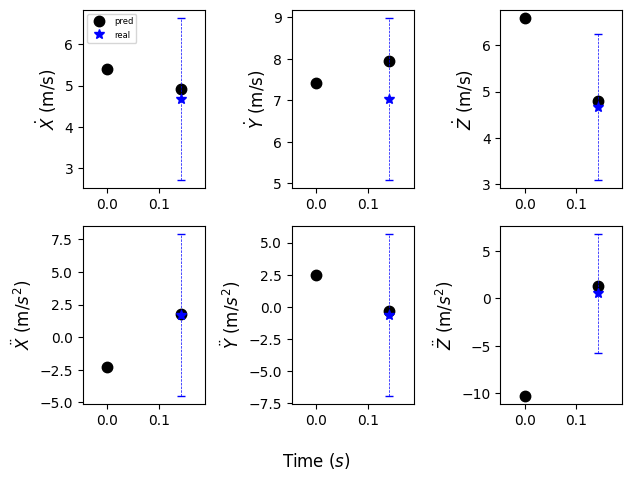

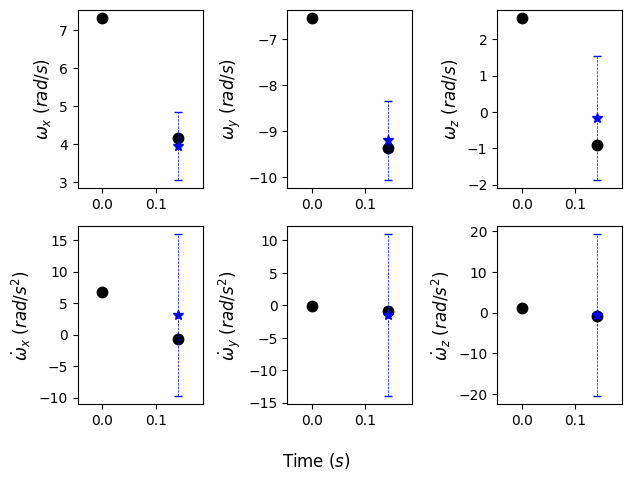

Current Batch Train Loss: -16.070425033569336

Current Batch Train Loss: -16.05527114868164

Current Batch Train Loss: -16.117427825927734

Current Batch Train Loss: -16.036579132080078

Current Batch Train Loss: -16.051145553588867

Current Batch Train Loss: -16.051509857177734

Current Batch Train Loss: -16.070295333862305

Current Batch Train Loss: -16.043651580810547

Current Batch Train Loss: -16.086641311645508

Current Batch Train Loss: -16.030244827270508

Epoch: 54, Batch Testing Loss: -16.057748794555664, Batch Testing Average RMSE: 10.581894874572754 w/ Standard Deviation: 8.44801139831543
Marginal Quantiles: tensor([0.5062, 0.5440, 0.5749, 2.0763, 2.0741, 2.1889, 0.2357, 0.2166, 0.3505,
        3.1881, 3.1256, 5.5351]),
 Joint Quantile: 7.229176044464111
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5804425477981567 ± 0.3674454391002655
Testing Calibrated (joint) Predictive Average Batch NLL: 2.428107500076294 ± 0.17255520820617676
Testing Uncalibrated Predi

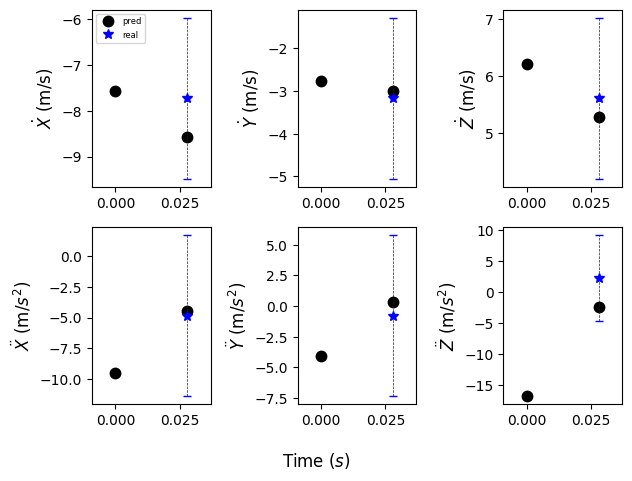

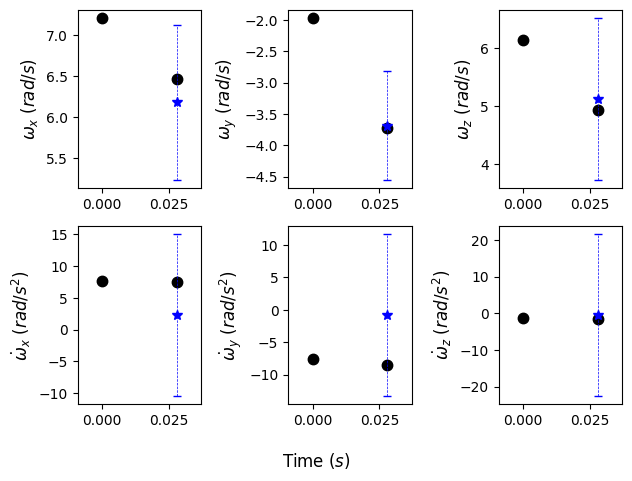

Current Batch Train Loss: -16.05670738220215

Current Batch Train Loss: -16.045578002929688

Current Batch Train Loss: -16.050806045532227

Current Batch Train Loss: -16.055845260620117

Current Batch Train Loss: -16.094966888427734

Current Batch Train Loss: -16.105525970458984

Current Batch Train Loss: -16.04249382019043

Current Batch Train Loss: -16.076250076293945

Current Batch Train Loss: -16.02296257019043

Current Batch Train Loss: -16.084640502929688

Epoch: 55, Batch Testing Loss: -16.095651626586914, Batch Testing Average RMSE: 10.147551536560059 w/ Standard Deviation: 7.153759479522705
Marginal Quantiles: tensor([0.5003, 0.5378, 0.5519, 2.0330, 2.0852, 1.9024, 0.2436, 0.2415, 0.3629,
        2.8452, 2.8073, 5.4882]),
 Joint Quantile: 7.009088516235352
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.549056053161621 ± 0.23550614714622498
Testing Calibrated (joint) Predictive Average Batch NLL: 2.405153274536133 ± 0.1324874311685562
Testing Uncalibrated Predict

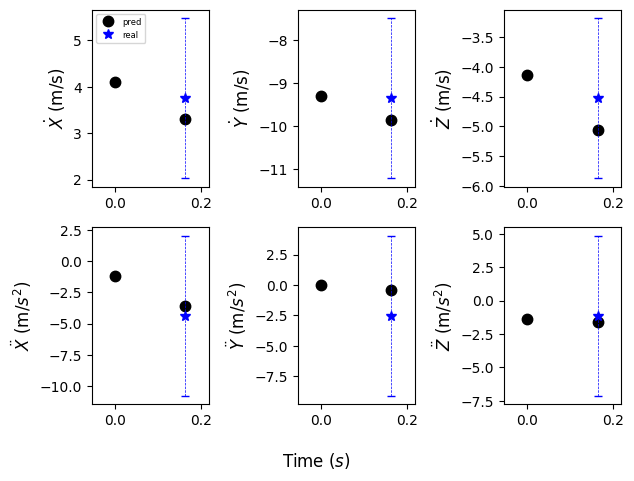

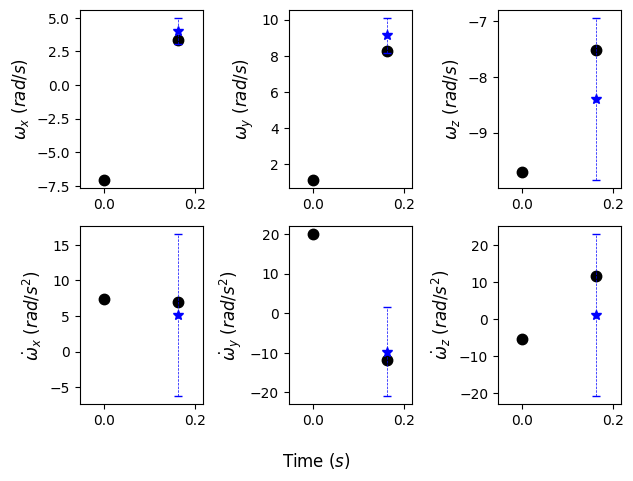

Model saved at epoch 55.

Current Batch Train Loss: -16.08382225036621

Current Batch Train Loss: -16.041370391845703

Current Batch Train Loss: -16.053030014038086

Current Batch Train Loss: -16.031272888183594

Current Batch Train Loss: -16.080703735351562

Current Batch Train Loss: -16.07781219482422

Current Batch Train Loss: -16.032806396484375

Current Batch Train Loss: -16.049293518066406

Current Batch Train Loss: -16.06810188293457

Current Batch Train Loss: -16.024715423583984

Epoch: 56, Batch Testing Loss: -16.06578254699707, Batch Testing Average RMSE: 11.039339065551758 w/ Standard Deviation: 7.491405487060547
Marginal Quantiles: tensor([0.5460, 0.5376, 0.5503, 2.0559, 2.1003, 1.9798, 0.4293, 0.2571, 0.3968,
        2.9236, 3.2887, 5.6196]),
 Joint Quantile: 7.253354072570801
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.6037828922271729 ± 0.24092963337898254
Testing Calibrated (joint) Predictive Average Batch NLL: 2.4242324829101562 ± 0.13819201290607452


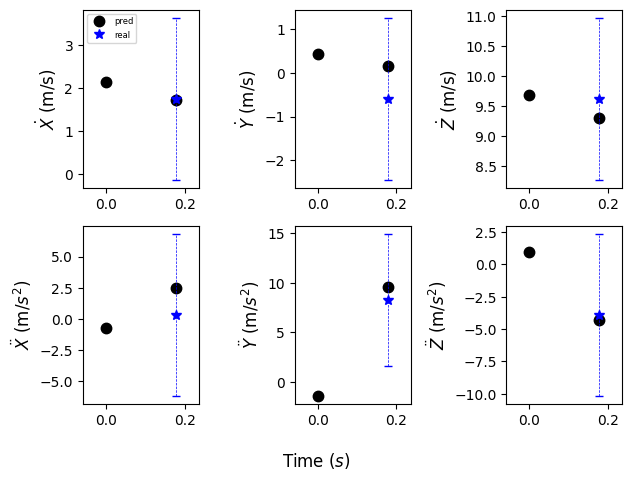

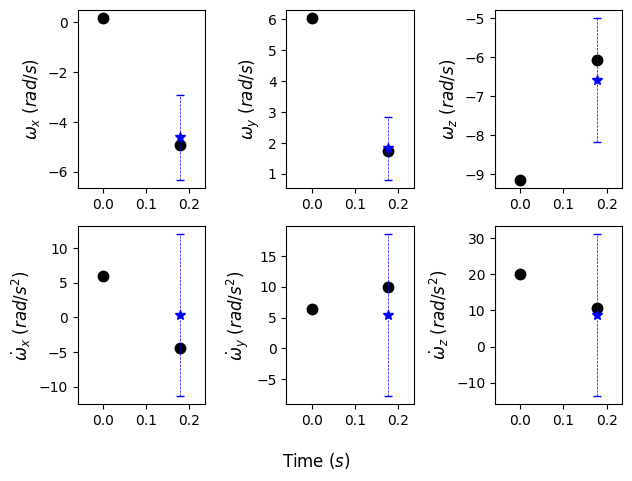

Current Batch Train Loss: -16.036083221435547

Current Batch Train Loss: -16.060781478881836

Current Batch Train Loss: -16.104406356811523

Current Batch Train Loss: -16.042139053344727

Current Batch Train Loss: -16.020877838134766

Current Batch Train Loss: -16.042293548583984

Current Batch Train Loss: -16.03242301940918

Current Batch Train Loss: -16.0233211517334

Current Batch Train Loss: -16.064058303833008

Current Batch Train Loss: -16.070960998535156

Epoch: 57, Batch Testing Loss: -16.10459327697754, Batch Testing Average RMSE: 9.755561828613281 w/ Standard Deviation: 7.396684169769287
Marginal Quantiles: tensor([0.5675, 0.5393, 0.5523, 1.9615, 1.9964, 1.9271, 0.2481, 0.1811, 0.2618,
        2.8841, 3.1756, 5.4985]),
 Joint Quantile: 7.152230739593506
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.525485634803772 ± 0.2248314768075943
Testing Calibrated (joint) Predictive Average Batch NLL: 2.411668062210083 ± 0.11987331509590149
Testing Uncalibrated Predictiv

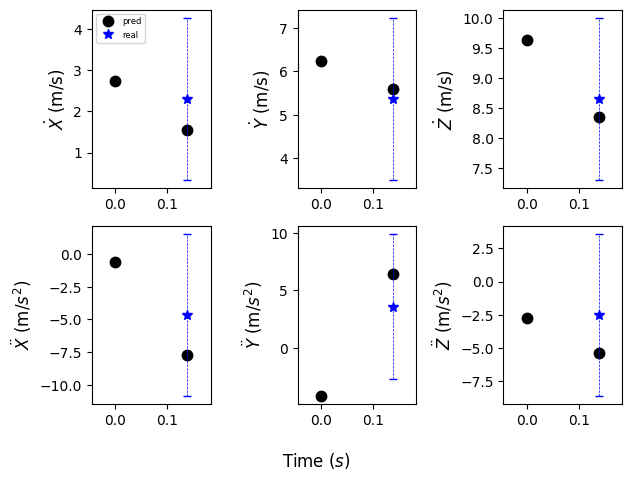

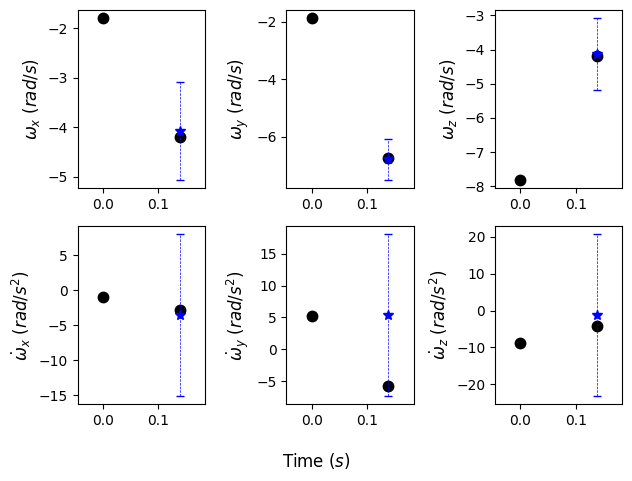

Current Batch Train Loss: -16.028099060058594

Current Batch Train Loss: -16.074583053588867

Current Batch Train Loss: -16.061317443847656

Current Batch Train Loss: -16.036399841308594

Current Batch Train Loss: -16.074758529663086

Current Batch Train Loss: -16.073822021484375

Current Batch Train Loss: -16.047863006591797

Current Batch Train Loss: -16.073591232299805

Current Batch Train Loss: -16.03934097290039

Current Batch Train Loss: -16.01986312866211

Epoch: 58, Batch Testing Loss: -16.043262481689453, Batch Testing Average RMSE: 10.182156562805176 w/ Standard Deviation: 8.651895523071289
Marginal Quantiles: tensor([0.5334, 0.5389, 0.5577, 2.0009, 2.0415, 1.9145, 0.3515, 0.2204, 0.2959,
        3.0858, 2.9711, 5.0087]),
 Joint Quantile: 6.734637260437012
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5859557390213013 ± 1.1169463396072388
Testing Calibrated (joint) Predictive Average Batch NLL: 2.388413429260254 ± 0.2605222463607788
Testing Uncalibrated Predic

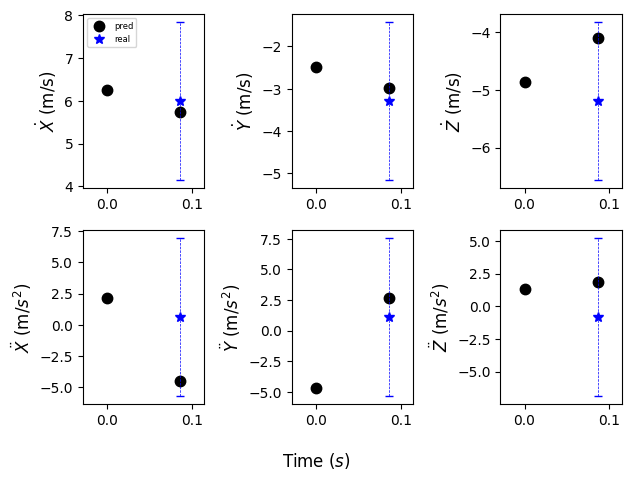

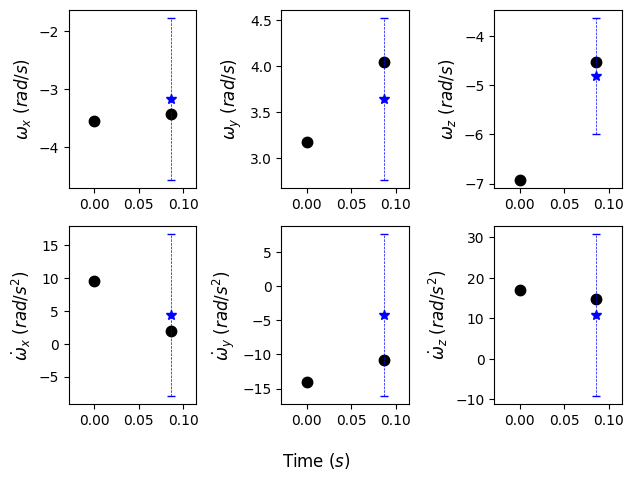

Current Batch Train Loss: -16.069604873657227

Current Batch Train Loss: -16.050947189331055

Current Batch Train Loss: -16.03608512878418

Current Batch Train Loss: -16.025516510009766

Current Batch Train Loss: -16.030858993530273

Current Batch Train Loss: -16.050325393676758

Current Batch Train Loss: -16.057031631469727

Current Batch Train Loss: -16.042552947998047

Current Batch Train Loss: -16.00984764099121

Current Batch Train Loss: -16.040462493896484

Epoch: 59, Batch Testing Loss: -16.06470489501953, Batch Testing Average RMSE: 9.578094482421875 w/ Standard Deviation: 7.2716264724731445
Marginal Quantiles: tensor([0.5326, 0.5259, 0.5404, 1.9901, 1.9928, 1.9703, 0.1760, 0.1865, 0.2537,
        2.9225, 2.8257, 5.1659]),
 Joint Quantile: 6.972881317138672
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5043525695800781 ± 0.26077908277511597
Testing Calibrated (joint) Predictive Average Batch NLL: 2.3993191719055176 ± 0.13758894801139832
Testing Uncalibrated Pred

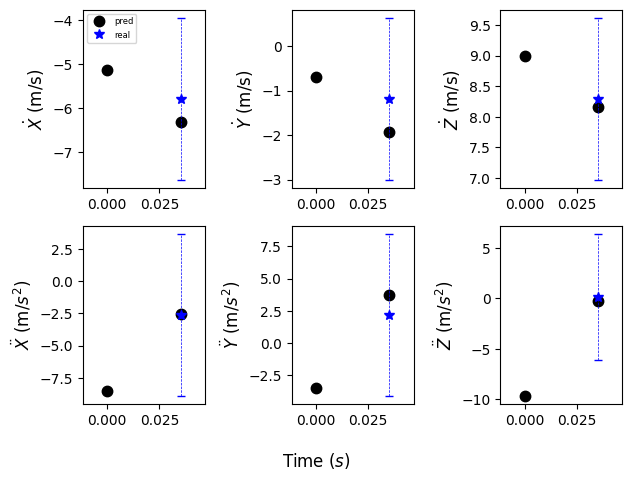

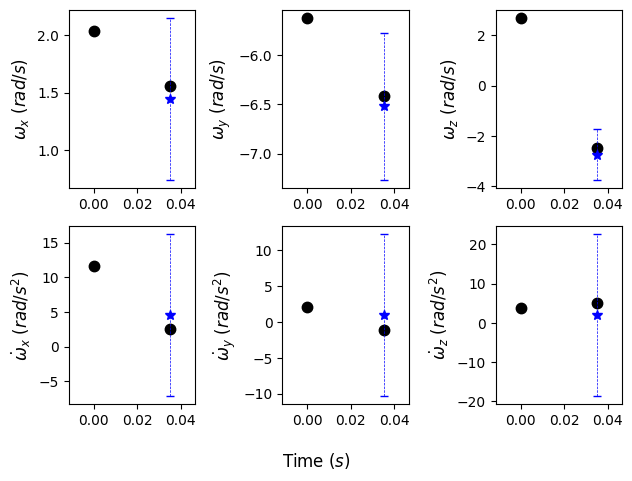

Current Batch Train Loss: -16.02776336669922

Current Batch Train Loss: -16.068906784057617

Current Batch Train Loss: -16.059053421020508

Current Batch Train Loss: -16.02574348449707

Current Batch Train Loss: -16.059223175048828

Current Batch Train Loss: -16.08835792541504

Current Batch Train Loss: -16.08346176147461

Current Batch Train Loss: -16.04734230041504

Current Batch Train Loss: -16.08274269104004

Current Batch Train Loss: -16.030363082885742

Epoch: 60, Batch Testing Loss: -16.010465621948242, Batch Testing Average RMSE: 10.173600196838379 w/ Standard Deviation: 7.284618377685547
Marginal Quantiles: tensor([0.5472, 0.5735, 0.5556, 2.0752, 2.0697, 1.9670, 0.2245, 0.1852, 0.3277,
        2.8577, 3.2805, 5.2320]),
 Joint Quantile: 7.120283603668213
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.544337272644043 ± 0.24523413181304932
Testing Calibrated (joint) Predictive Average Batch NLL: 2.412468910217285 ± 0.13550905883312225
Testing Uncalibrated Predictiv

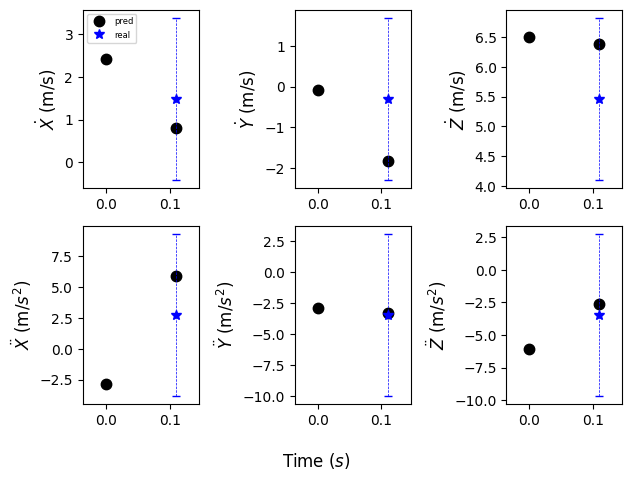

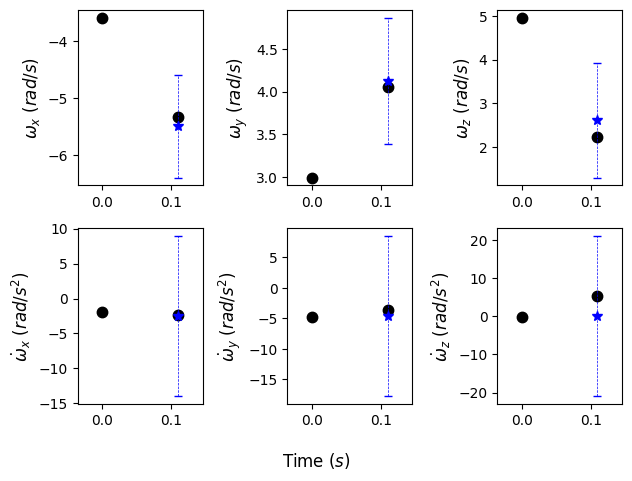

Model saved at epoch 60.

Current Batch Train Loss: -16.041526794433594

Current Batch Train Loss: -16.029504776000977

Current Batch Train Loss: -16.064001083374023

Current Batch Train Loss: -16.05670166015625

Current Batch Train Loss: -16.030241012573242

Current Batch Train Loss: -16.040817260742188

Current Batch Train Loss: -16.026416778564453

Current Batch Train Loss: -16.062389373779297

Current Batch Train Loss: -16.03280258178711

Current Batch Train Loss: -16.06173324584961

Epoch: 61, Batch Testing Loss: -16.025041580200195, Batch Testing Average RMSE: 9.97850513458252 w/ Standard Deviation: 7.4471330642700195
Marginal Quantiles: tensor([0.5915, 0.5808, 0.5238, 2.0744, 2.0684, 2.0303, 0.2915, 0.1892, 0.2478,
        2.9343, 2.9606, 5.2600]),
 Joint Quantile: 7.1441731452941895
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.544944167137146 ± 0.2506311535835266
Testing Calibrated (joint) Predictive Average Batch NLL: 2.4116170406341553 ± 0.1287616491317749
Te

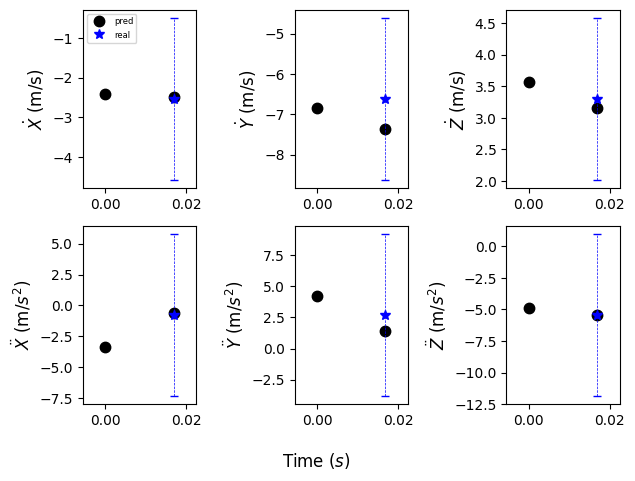

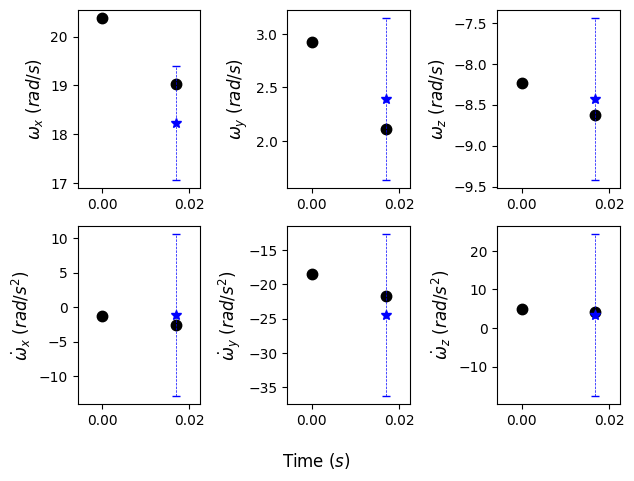

Current Batch Train Loss: -16.022296905517578

Current Batch Train Loss: -16.082632064819336

Current Batch Train Loss: -16.03083038330078

Current Batch Train Loss: -16.02602767944336

Current Batch Train Loss: -16.0048885345459

Current Batch Train Loss: -16.06998634338379

Current Batch Train Loss: -16.025165557861328

Current Batch Train Loss: -16.038867950439453

Current Batch Train Loss: -16.003307342529297

Current Batch Train Loss: -16.00714874267578

Epoch: 62, Batch Testing Loss: -16.03158950805664, Batch Testing Average RMSE: 10.050861358642578 w/ Standard Deviation: 7.416972637176514
Marginal Quantiles: tensor([0.5649, 0.5265, 0.5379, 2.1873, 2.0100, 2.0126, 0.2346, 0.1895, 0.2490,
        2.9363, 3.1456, 5.2680]),
 Joint Quantile: 6.858978271484375
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5320593118667603 ± 0.24699445068836212
Testing Calibrated (joint) Predictive Average Batch NLL: 2.3961448669433594 ± 0.13289089500904083
Testing Uncalibrated Predicti

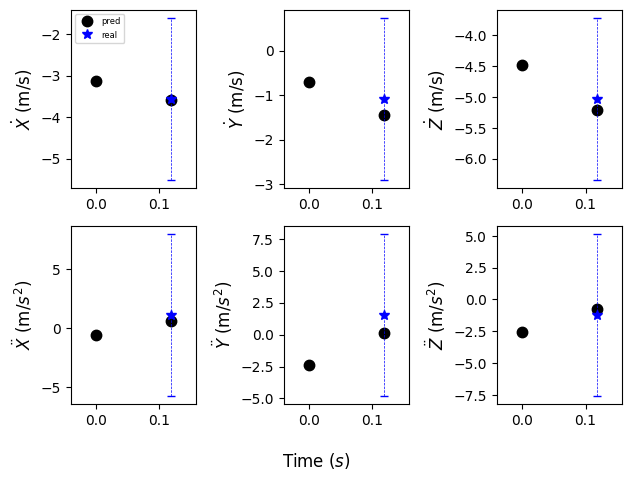

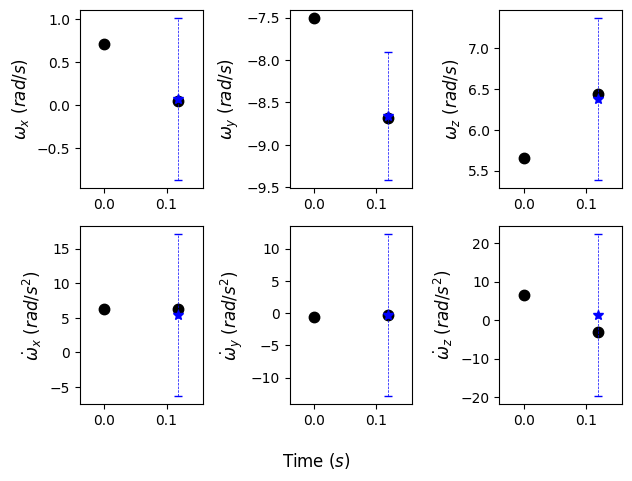

Current Batch Train Loss: -16.039443969726562

Current Batch Train Loss: -16.018489837646484

Current Batch Train Loss: -16.042070388793945

Current Batch Train Loss: -16.036649703979492

Current Batch Train Loss: -16.061782836914062

Current Batch Train Loss: -16.045509338378906

Current Batch Train Loss: -16.033618927001953

Current Batch Train Loss: -15.988512992858887

Current Batch Train Loss: -16.05120086669922

Current Batch Train Loss: -16.050487518310547

Epoch: 63, Batch Testing Loss: -16.024354934692383, Batch Testing Average RMSE: 10.216552734375 w/ Standard Deviation: 7.5861687660217285
Marginal Quantiles: tensor([0.5171, 0.5463, 0.5210, 2.0127, 1.9526, 1.9042, 0.1855, 0.1937, 0.3306,
        2.8710, 3.1040, 5.9705]),
 Joint Quantile: 7.2138895988464355
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5281105041503906 ± 0.24324370920658112
Testing Calibrated (joint) Predictive Average Batch NLL: 2.4215903282165527 ± 0.1344766914844513
Testing Uncalibrated Pred

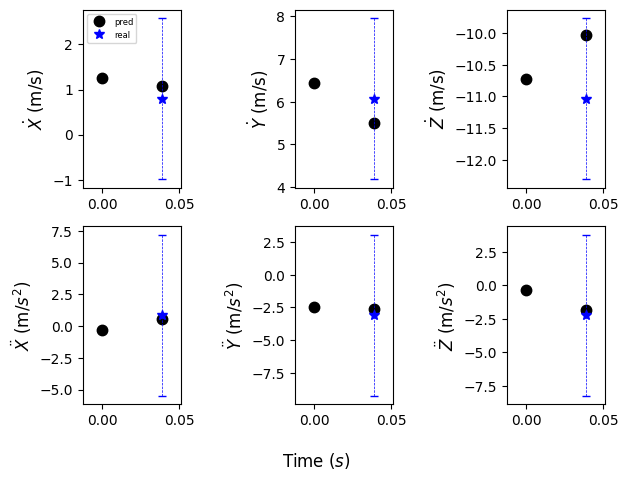

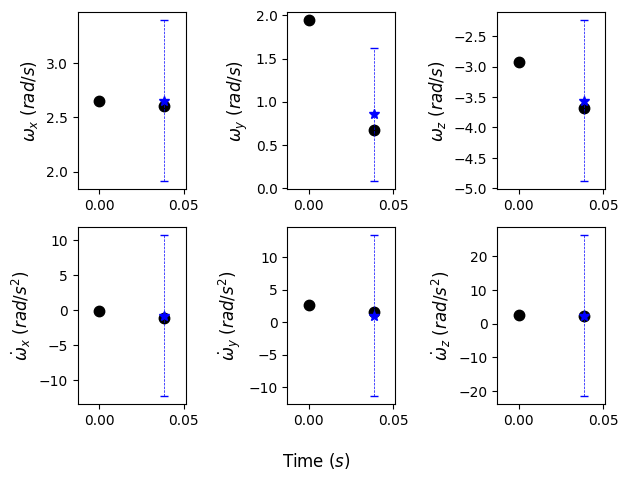

Current Batch Train Loss: -15.982626914978027

Current Batch Train Loss: -16.051555633544922

Current Batch Train Loss: -16.058706283569336

Current Batch Train Loss: -16.062049865722656

Current Batch Train Loss: -16.03938102722168

Current Batch Train Loss: -16.024904251098633

Current Batch Train Loss: -16.053850173950195

Current Batch Train Loss: -16.017417907714844

Current Batch Train Loss: -16.00244903564453

Current Batch Train Loss: -16.04534149169922

Epoch: 64, Batch Testing Loss: -16.074270248413086, Batch Testing Average RMSE: 10.081953048706055 w/ Standard Deviation: 7.491949558258057
Marginal Quantiles: tensor([0.5209, 0.6131, 0.5469, 2.0587, 1.9345, 1.8971, 0.2614, 0.1994, 0.3068,
        2.7002, 2.9734, 5.0885]),
 Joint Quantile: 6.7855634689331055
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.545745849609375 ± 0.31304678320884705
Testing Calibrated (joint) Predictive Average Batch NLL: 2.3904380798339844 ± 0.1729741245508194
Testing Uncalibrated Predi

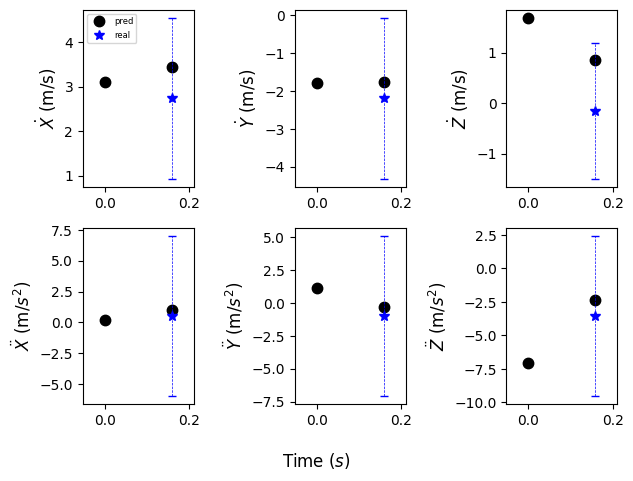

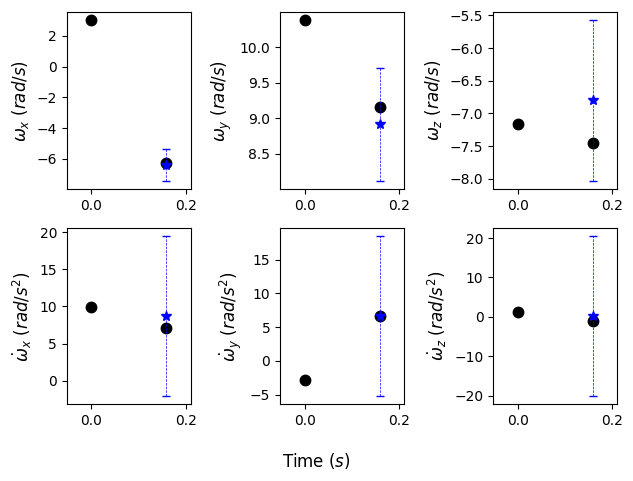

Current Batch Train Loss: -16.074302673339844

Current Batch Train Loss: -16.042152404785156

Current Batch Train Loss: -16.057567596435547

Current Batch Train Loss: -16.038372039794922

Current Batch Train Loss: -16.048458099365234

Current Batch Train Loss: -16.048290252685547

Current Batch Train Loss: -16.041526794433594

Current Batch Train Loss: -16.03057289123535

Current Batch Train Loss: -16.029233932495117

Current Batch Train Loss: -16.03587532043457

Epoch: 65, Batch Testing Loss: -16.04744529724121, Batch Testing Average RMSE: 9.706501960754395 w/ Standard Deviation: 6.661929130554199
Marginal Quantiles: tensor([0.5528, 0.5796, 0.5360, 1.9553, 2.0923, 1.9487, 0.1975, 0.1874, 0.2130,
        3.0131, 2.6216, 5.0832]),
 Joint Quantile: 6.5091986656188965
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.4988961219787598 ± 0.19839134812355042
Testing Calibrated (joint) Predictive Average Batch NLL: 2.3655686378479004 ± 0.10730160772800446
Testing Uncalibrated Pred

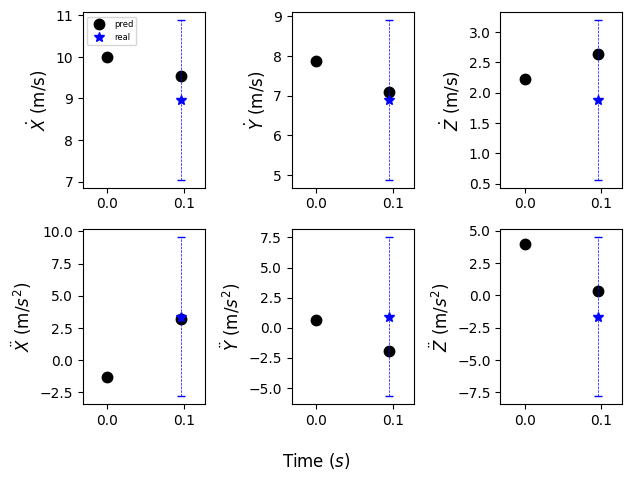

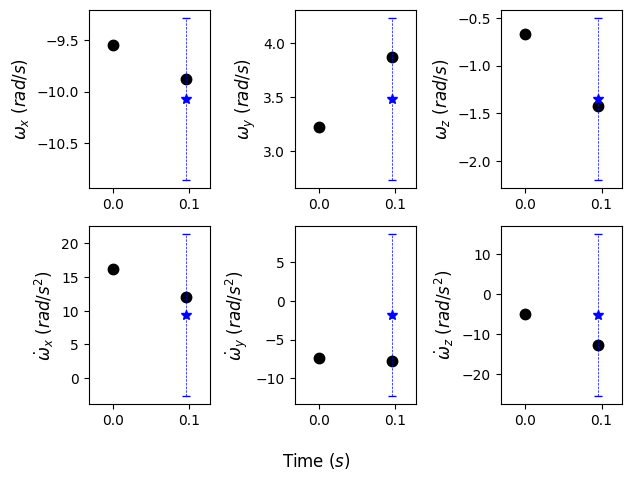

Model saved at epoch 65.

Current Batch Train Loss: -16.025676727294922

Current Batch Train Loss: -16.035825729370117

Current Batch Train Loss: -16.07895851135254

Current Batch Train Loss: -16.041933059692383

Current Batch Train Loss: -15.977128028869629

Current Batch Train Loss: -16.07659149169922

Current Batch Train Loss: -16.02544403076172

Current Batch Train Loss: -16.050939559936523

Current Batch Train Loss: -16.01519203186035

Current Batch Train Loss: -16.04535484313965

Epoch: 66, Batch Testing Loss: -16.094724655151367, Batch Testing Average RMSE: 9.543662071228027 w/ Standard Deviation: 7.282660007476807
Marginal Quantiles: tensor([0.5296, 0.5114, 0.5256, 2.0506, 1.9977, 1.8264, 0.1991, 0.2012, 0.2838,
        2.8935, 2.8095, 4.8052]),
 Joint Quantile: 6.7384514808654785
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5084787607192993 ± 0.2605751156806946
Testing Calibrated (joint) Predictive Average Batch NLL: 2.3799426555633545 ± 0.12497006356716156
Te

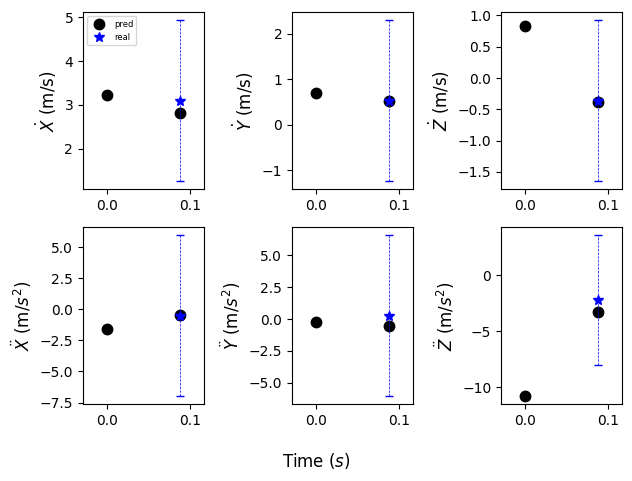

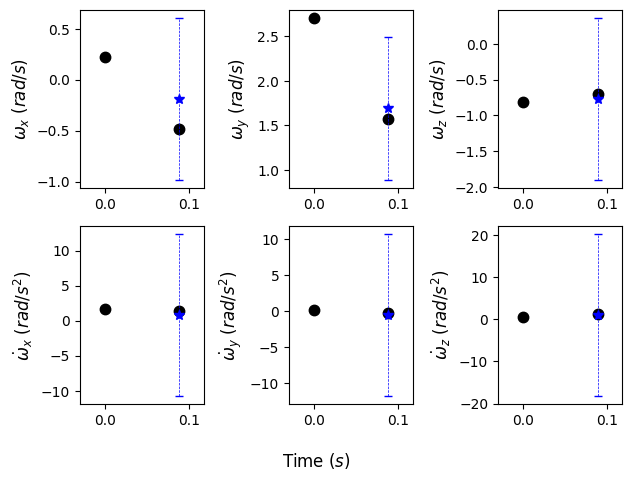

Current Batch Train Loss: -16.03400421142578

Current Batch Train Loss: -16.052169799804688

Current Batch Train Loss: -16.016685485839844

Current Batch Train Loss: -15.992231369018555

Current Batch Train Loss: -16.005359649658203

Current Batch Train Loss: -16.03434944152832

Current Batch Train Loss: -16.020530700683594

Current Batch Train Loss: -16.03497314453125

Current Batch Train Loss: -16.07489013671875

Current Batch Train Loss: -16.090492248535156

Epoch: 67, Batch Testing Loss: -16.019025802612305, Batch Testing Average RMSE: 9.996011734008789 w/ Standard Deviation: 7.404664516448975
Marginal Quantiles: tensor([0.5547, 0.5839, 0.6012, 2.1962, 2.0372, 2.1026, 0.1467, 0.1656, 0.2518,
        2.9799, 2.9457, 5.6183]),
 Joint Quantile: 7.603665351867676
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5153506994247437 ± 0.2410508096218109
Testing Calibrated (joint) Predictive Average Batch NLL: 2.4412853717803955 ± 0.12853361666202545
Testing Uncalibrated Predict

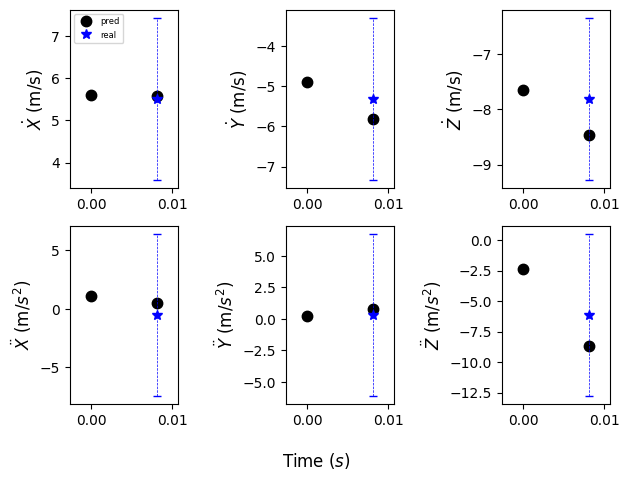

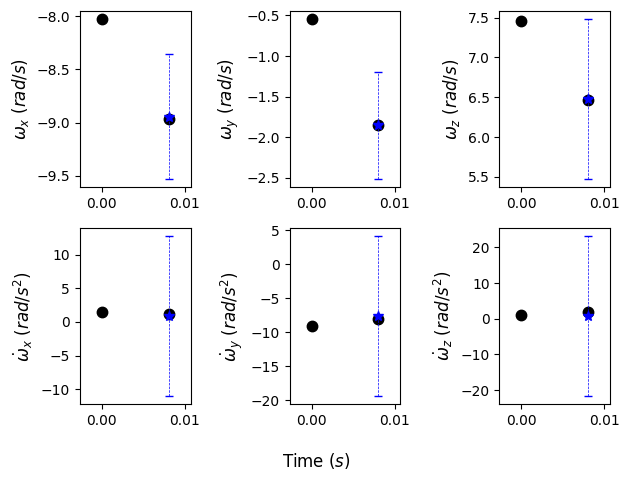

Current Batch Train Loss: -16.111454010009766

Current Batch Train Loss: -16.06385040283203

Current Batch Train Loss: -16.055194854736328

Current Batch Train Loss: -16.029830932617188

Current Batch Train Loss: -16.000930786132812

Current Batch Train Loss: -16.01272201538086

Current Batch Train Loss: -16.06171989440918

Current Batch Train Loss: -16.046140670776367

Current Batch Train Loss: -15.965944290161133

Current Batch Train Loss: -15.981948852539062

Epoch: 68, Batch Testing Loss: -16.04776954650879, Batch Testing Average RMSE: 9.988072395324707 w/ Standard Deviation: 6.784034729003906
Marginal Quantiles: tensor([0.5271, 0.5251, 0.5760, 2.0342, 2.0061, 1.9564, 0.2348, 0.1773, 0.3700,
        2.8010, 2.8603, 5.3109]),
 Joint Quantile: 6.6813530921936035
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5328506231307983 ± 0.23721566796302795
Testing Calibrated (joint) Predictive Average Batch NLL: 2.381466865539551 ± 0.14485827088356018
Testing Uncalibrated Predic

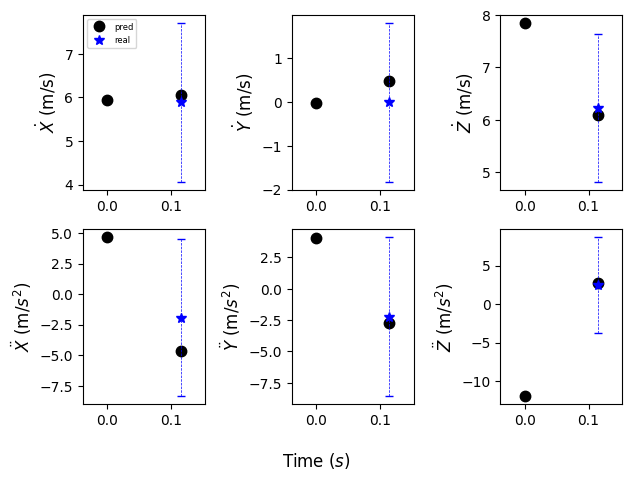

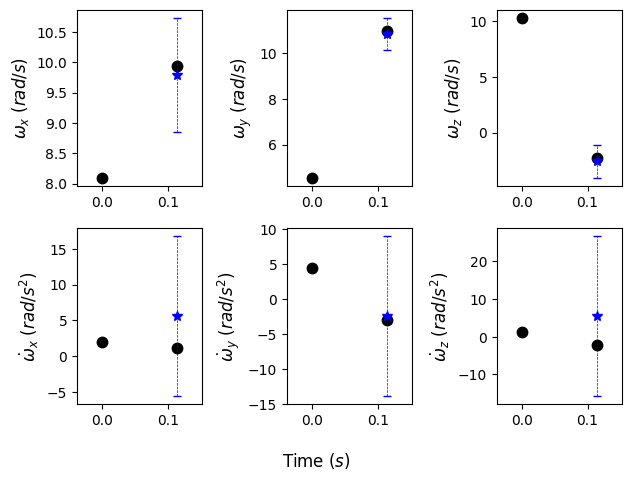

Current Batch Train Loss: -16.051206588745117

Current Batch Train Loss: -16.063175201416016

Current Batch Train Loss: -15.992205619812012

Current Batch Train Loss: -16.027124404907227

Current Batch Train Loss: -16.043655395507812

Current Batch Train Loss: -16.021591186523438

Current Batch Train Loss: -16.062623977661133

Current Batch Train Loss: -16.058019638061523

Current Batch Train Loss: -16.022615432739258

Current Batch Train Loss: -16.0377254486084

Epoch: 69, Batch Testing Loss: -16.03899383544922, Batch Testing Average RMSE: 10.018742561340332 w/ Standard Deviation: 6.777890682220459
Marginal Quantiles: tensor([0.5394, 0.5270, 0.5219, 2.1729, 1.9721, 1.9573, 0.2202, 0.2128, 0.3074,
        2.7750, 3.0029, 5.3330]),
 Joint Quantile: 6.675238609313965
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5279830694198608 ± 0.20964592695236206
Testing Calibrated (joint) Predictive Average Batch NLL: 2.3793110847473145 ± 0.11326514184474945
Testing Uncalibrated Pred

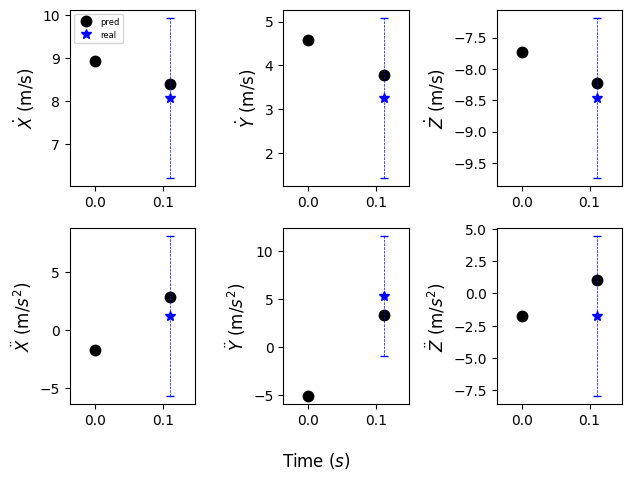

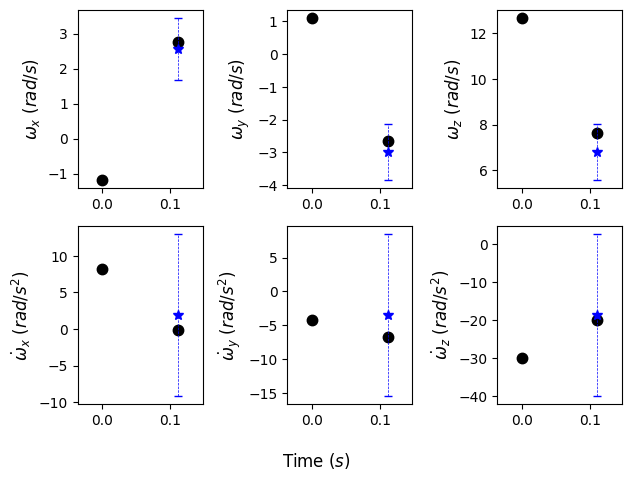

Current Batch Train Loss: -16.073823928833008

Current Batch Train Loss: -16.028881072998047

Current Batch Train Loss: -16.076839447021484

Current Batch Train Loss: -16.0105037689209

Current Batch Train Loss: -16.027177810668945

Current Batch Train Loss: -16.02816390991211

Current Batch Train Loss: -16.005041122436523

Current Batch Train Loss: -16.029701232910156

Current Batch Train Loss: -16.088199615478516

Current Batch Train Loss: -16.02821922302246

Epoch: 70, Batch Testing Loss: -16.001873016357422, Batch Testing Average RMSE: 10.319201469421387 w/ Standard Deviation: 7.639340877532959
Marginal Quantiles: tensor([0.5208, 0.5721, 0.5025, 2.1251, 2.1114, 2.0382, 0.2630, 0.2197, 0.3513,
        3.0457, 3.0108, 5.6417]),
 Joint Quantile: 7.2083845138549805
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5640192031860352 ± 0.2685614228248596
Testing Calibrated (joint) Predictive Average Batch NLL: 2.4229767322540283 ± 0.15728852152824402
Testing Uncalibrated Predi

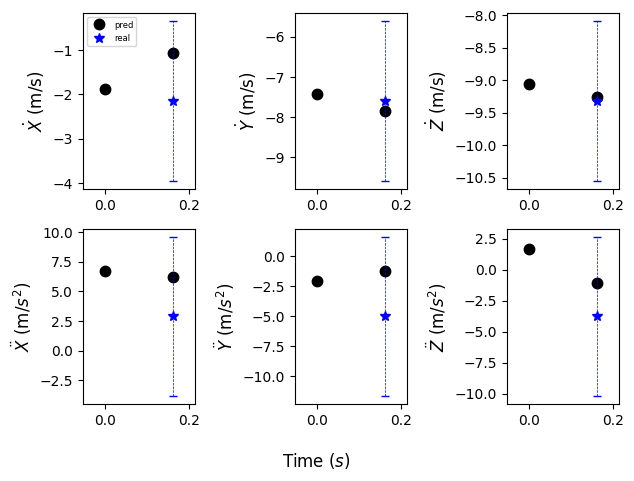

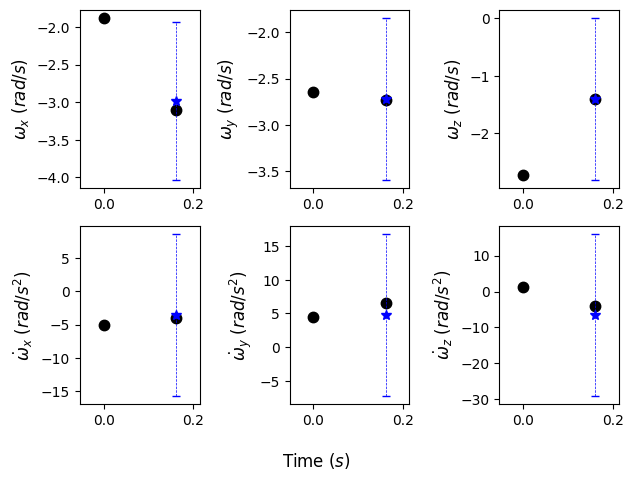

Model saved at epoch 70.

Current Batch Train Loss: -16.03791046142578

Current Batch Train Loss: -16.025081634521484

Current Batch Train Loss: -16.041080474853516

Current Batch Train Loss: -16.008256912231445

Current Batch Train Loss: -16.01909828186035

Current Batch Train Loss: -16.02499008178711

Current Batch Train Loss: -15.995920181274414

Current Batch Train Loss: -16.056976318359375

Current Batch Train Loss: -16.028154373168945

Current Batch Train Loss: -16.06502914428711

Epoch: 71, Batch Testing Loss: -16.023487091064453, Batch Testing Average RMSE: 9.810589790344238 w/ Standard Deviation: 7.317013740539551
Marginal Quantiles: tensor([0.5124, 0.5589, 0.5378, 2.1604, 2.1422, 1.8990, 0.1674, 0.1813, 0.2764,
        2.7301, 2.6920, 5.4343]),
 Joint Quantile: 6.828325271606445
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5170072317123413 ± 0.4613434970378876
Testing Calibrated (joint) Predictive Average Batch NLL: 2.392441987991333 ± 0.1606534719467163
Test

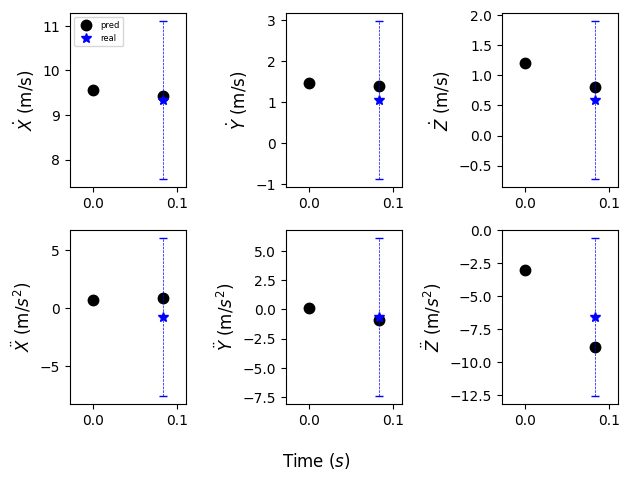

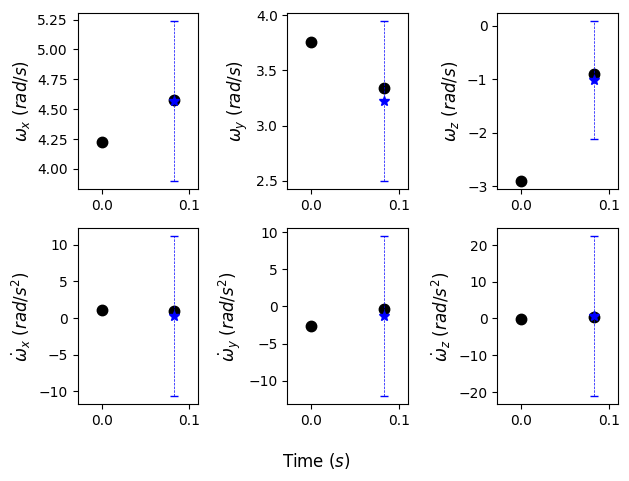

Current Batch Train Loss: -16.035310745239258

Current Batch Train Loss: -16.049238204956055

Current Batch Train Loss: -16.05358123779297

Current Batch Train Loss: -15.997502326965332

Current Batch Train Loss: -16.03023910522461

Current Batch Train Loss: -16.057018280029297

Current Batch Train Loss: -15.987187385559082

Current Batch Train Loss: -16.006912231445312

Current Batch Train Loss: -16.014328002929688

Current Batch Train Loss: -16.00575065612793

Epoch: 72, Batch Testing Loss: -16.04648208618164, Batch Testing Average RMSE: 9.956786155700684 w/ Standard Deviation: 7.407017230987549
Marginal Quantiles: tensor([0.5246, 0.5807, 0.5510, 1.9109, 2.0033, 1.9978, 0.2783, 0.2433, 0.2311,
        2.8339, 2.9421, 5.1742]),
 Joint Quantile: 6.616978168487549
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5444867610931396 ± 0.3048379421234131
Testing Calibrated (joint) Predictive Average Batch NLL: 2.3832335472106934 ± 0.19404813647270203
Testing Uncalibrated Predict

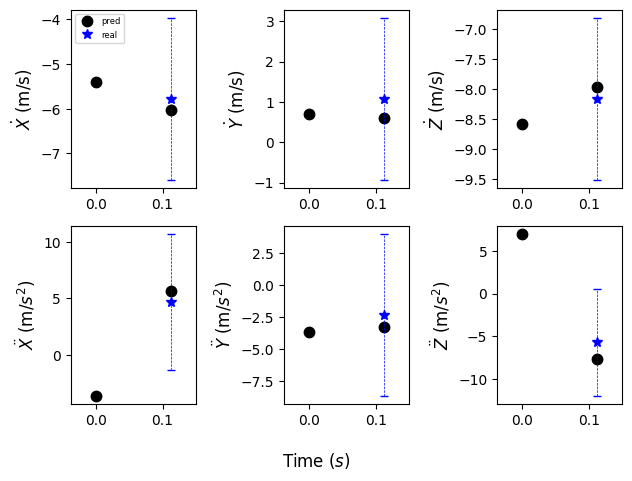

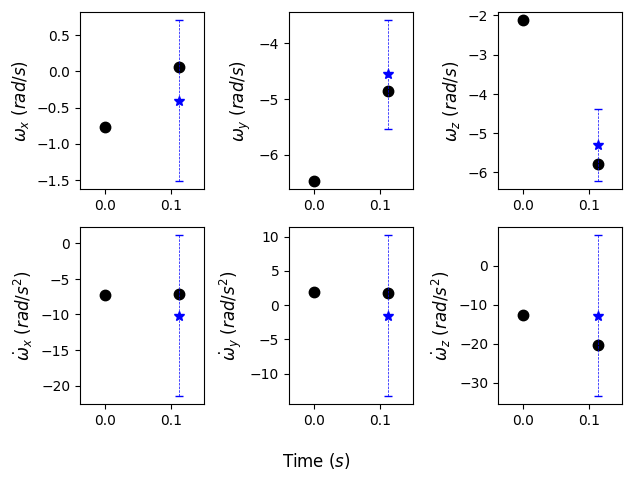

Current Batch Train Loss: -16.03550910949707

Current Batch Train Loss: -16.037918090820312

Current Batch Train Loss: -16.044353485107422

Current Batch Train Loss: -16.03028678894043

Current Batch Train Loss: -16.02366828918457

Current Batch Train Loss: -16.00090789794922

Current Batch Train Loss: -16.027978897094727

Current Batch Train Loss: -16.006776809692383

Current Batch Train Loss: -16.041728973388672

Current Batch Train Loss: -15.98177433013916

Epoch: 73, Batch Testing Loss: -16.038681030273438, Batch Testing Average RMSE: 9.699246406555176 w/ Standard Deviation: 7.050414085388184
Marginal Quantiles: tensor([0.5492, 0.5535, 0.5664, 1.9634, 2.1066, 1.8741, 0.1945, 0.2060, 0.2210,
        2.8977, 2.8072, 4.9906]),
 Joint Quantile: 6.786492824554443
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5112346410751343 ± 0.24762722849845886
Testing Calibrated (joint) Predictive Average Batch NLL: 2.387686014175415 ± 0.13566510379314423
Testing Uncalibrated Predicti

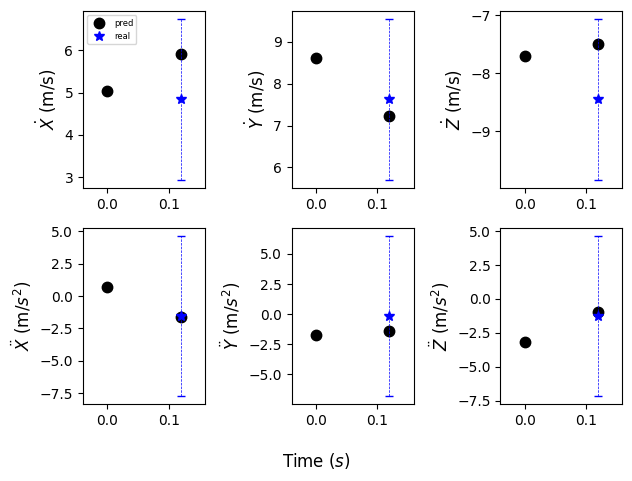

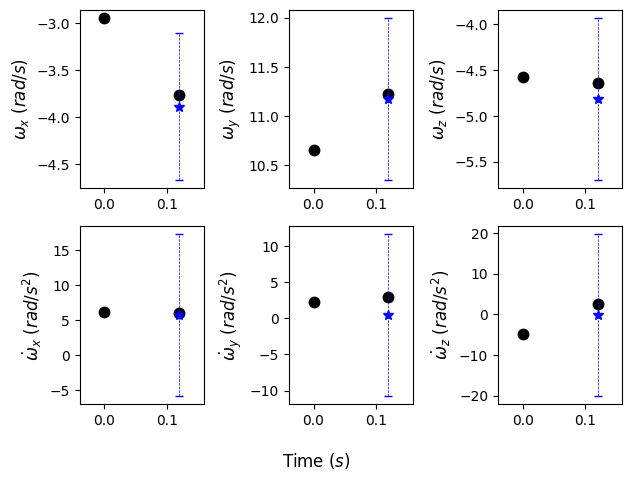

Current Batch Train Loss: -16.005470275878906

Current Batch Train Loss: -15.99183177947998

Current Batch Train Loss: -15.989668846130371

Current Batch Train Loss: -16.044281005859375

Current Batch Train Loss: -16.025339126586914

Current Batch Train Loss: -16.05693817138672

Current Batch Train Loss: -16.02486228942871

Current Batch Train Loss: -16.035404205322266

Current Batch Train Loss: -15.997596740722656

Current Batch Train Loss: -16.049470901489258

Epoch: 74, Batch Testing Loss: -16.020191192626953, Batch Testing Average RMSE: 9.641536712646484 w/ Standard Deviation: 7.078568935394287
Marginal Quantiles: tensor([0.5503, 0.5446, 0.5694, 2.0768, 2.0975, 1.9844, 0.2083, 0.1578, 0.2220,
        2.7457, 2.8230, 4.9615]),
 Joint Quantile: 6.815283298492432
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5001546144485474 ± 0.25289273262023926
Testing Calibrated (joint) Predictive Average Batch NLL: 2.386444568634033 ± 0.1255561113357544
Testing Uncalibrated Predict

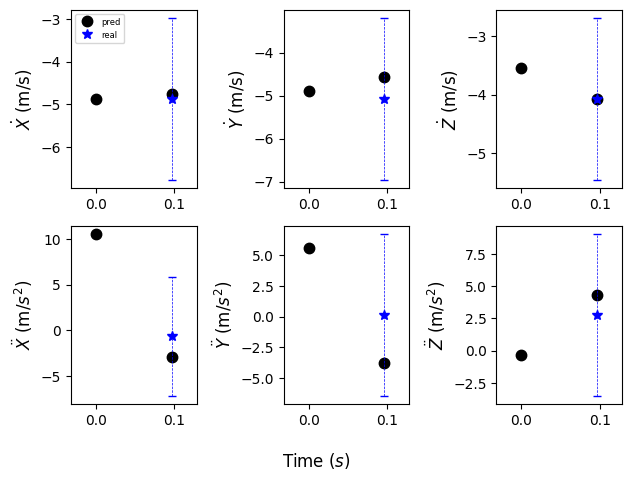

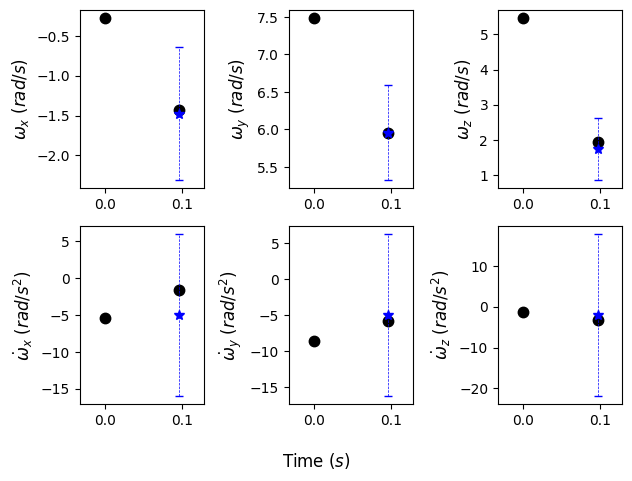

Current Batch Train Loss: -16.06739616394043

Current Batch Train Loss: -16.08697509765625

Current Batch Train Loss: -16.024763107299805

Current Batch Train Loss: -16.041088104248047

Current Batch Train Loss: -16.01411247253418

Current Batch Train Loss: -16.04875373840332

Current Batch Train Loss: -16.00876808166504

Current Batch Train Loss: -16.05852508544922

Current Batch Train Loss: -16.060909271240234

Current Batch Train Loss: -16.017873764038086

Epoch: 75, Batch Testing Loss: -16.0133056640625, Batch Testing Average RMSE: 9.843501091003418 w/ Standard Deviation: 7.227226734161377
Marginal Quantiles: tensor([0.5018, 0.5431, 0.5133, 2.0963, 1.9180, 1.8444, 0.2193, 0.2009, 0.2007,
        2.7463, 2.8119, 5.4474]),
 Joint Quantile: 6.765756607055664
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5023318529129028 ± 0.2844441533088684
Testing Calibrated (joint) Predictive Average Batch NLL: 2.389096736907959 ± 0.1713411957025528
Testing Uncalibrated Predictive Av

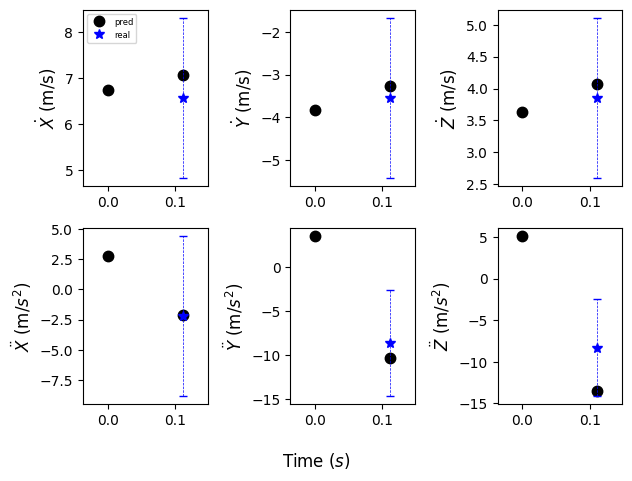

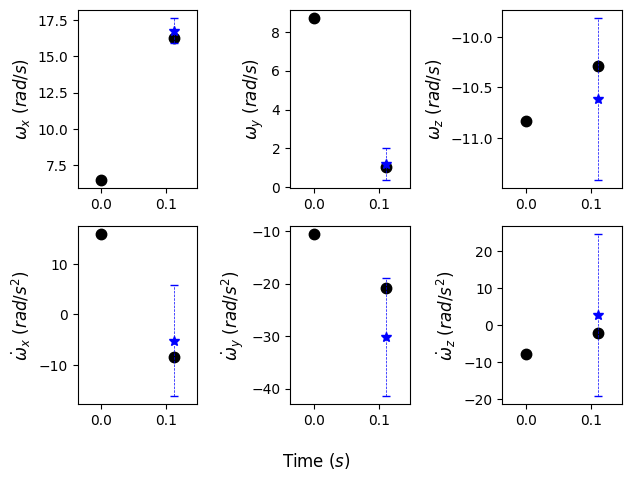

Model saved at epoch 75.

Current Batch Train Loss: -16.0056095123291

Current Batch Train Loss: -16.03586769104004

Current Batch Train Loss: -16.075477600097656

Current Batch Train Loss: -16.022789001464844

Current Batch Train Loss: -16.028226852416992

Current Batch Train Loss: -15.99557113647461

Current Batch Train Loss: -15.969721794128418

Current Batch Train Loss: -15.996418952941895

Current Batch Train Loss: -16.02577018737793

Current Batch Train Loss: -16.064645767211914

Epoch: 76, Batch Testing Loss: -16.06049919128418, Batch Testing Average RMSE: 10.069091796875 w/ Standard Deviation: 7.096667766571045
Marginal Quantiles: tensor([0.5008, 0.6169, 0.5476, 2.3063, 2.1326, 1.8791, 0.1824, 0.2363, 0.2870,
        2.5441, 2.9161, 5.3084]),
 Joint Quantile: 6.681622505187988
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5307451486587524 ± 0.21762511134147644
Testing Calibrated (joint) Predictive Average Batch NLL: 2.382220983505249 ± 0.12662647664546967
Testin

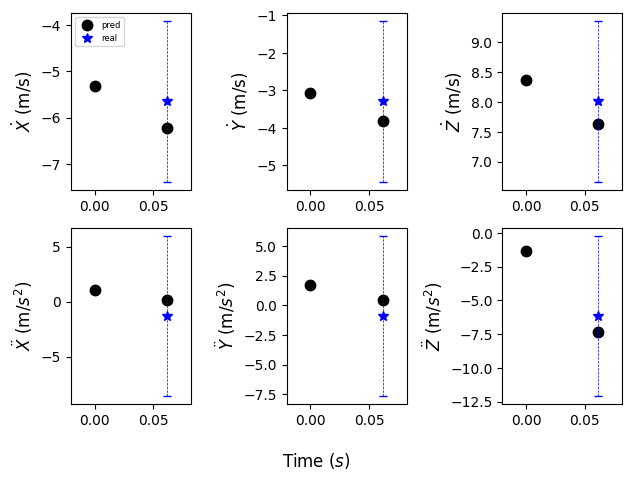

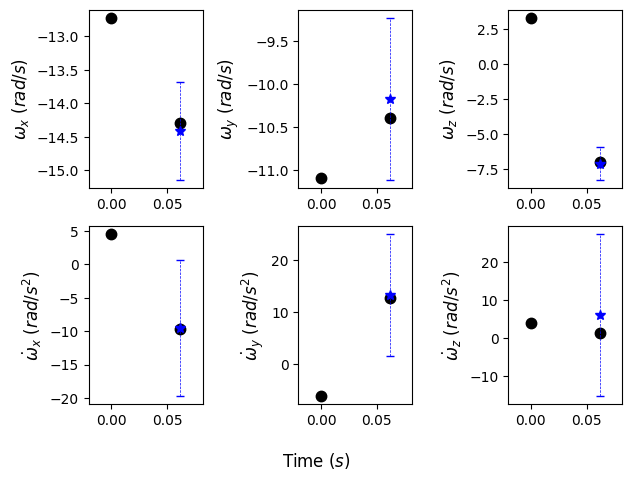

Current Batch Train Loss: -16.06782341003418

Current Batch Train Loss: -16.036842346191406

Current Batch Train Loss: -16.003808975219727

Current Batch Train Loss: -16.03166961669922

Current Batch Train Loss: -16.010631561279297

Current Batch Train Loss: -16.037227630615234

Current Batch Train Loss: -15.986372947692871

Current Batch Train Loss: -16.050334930419922

Current Batch Train Loss: -15.995885848999023

Current Batch Train Loss: -16.002132415771484

Epoch: 77, Batch Testing Loss: -16.011104583740234, Batch Testing Average RMSE: 9.742276191711426 w/ Standard Deviation: 7.418213844299316
Marginal Quantiles: tensor([0.5304, 0.5274, 0.5428, 2.0268, 2.0045, 1.9341, 0.2569, 0.1631, 0.2499,
        2.9637, 2.9568, 5.5078]),
 Joint Quantile: 6.995062828063965
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5179184675216675 ± 0.2652825713157654
Testing Calibrated (joint) Predictive Average Batch NLL: 2.4037861824035645 ± 0.15368928015232086
Testing Uncalibrated Predi

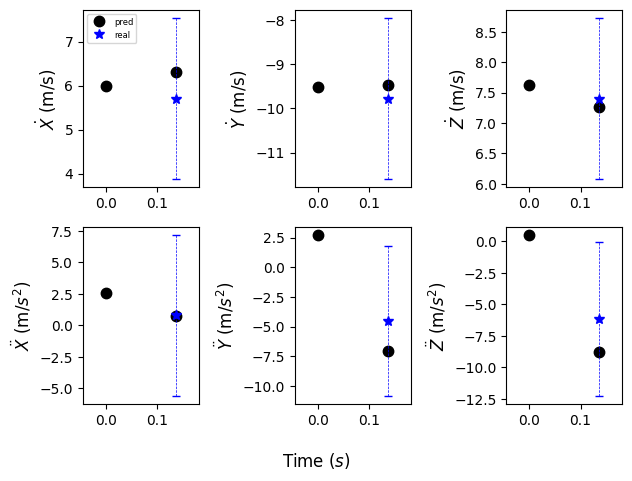

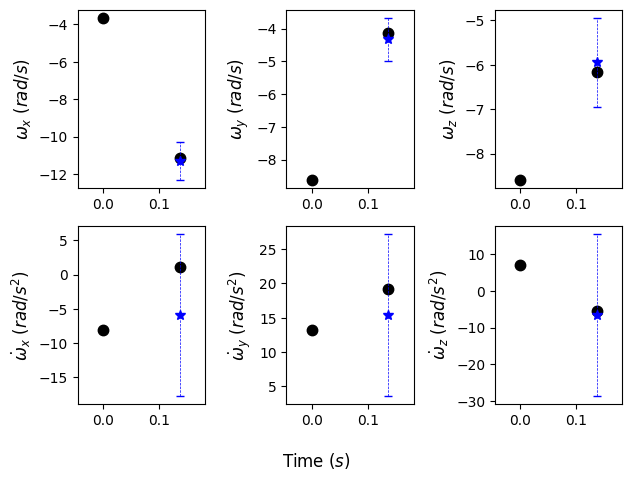

Current Batch Train Loss: -16.00592803955078

Current Batch Train Loss: -15.981822967529297

Current Batch Train Loss: -16.017894744873047

Current Batch Train Loss: -16.029502868652344

Current Batch Train Loss: -16.050052642822266

Current Batch Train Loss: -16.000469207763672

Current Batch Train Loss: -16.04508399963379

Current Batch Train Loss: -16.04170036315918

Current Batch Train Loss: -16.026832580566406

Current Batch Train Loss: -16.038204193115234

Epoch: 78, Batch Testing Loss: -16.029943466186523, Batch Testing Average RMSE: 9.592656135559082 w/ Standard Deviation: 6.888100624084473
Marginal Quantiles: tensor([0.5364, 0.6122, 0.5414, 2.0703, 2.0616, 1.8658, 0.2030, 0.1631, 0.1963,
        2.8888, 2.8194, 5.0766]),
 Joint Quantile: 6.625453948974609
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.494469404220581 ± 0.21451258659362793
Testing Calibrated (joint) Predictive Average Batch NLL: 2.374356269836426 ± 0.12042859196662903
Testing Uncalibrated Predict

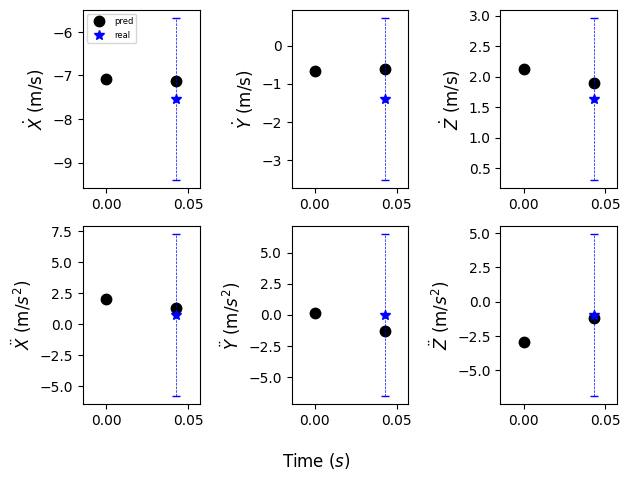

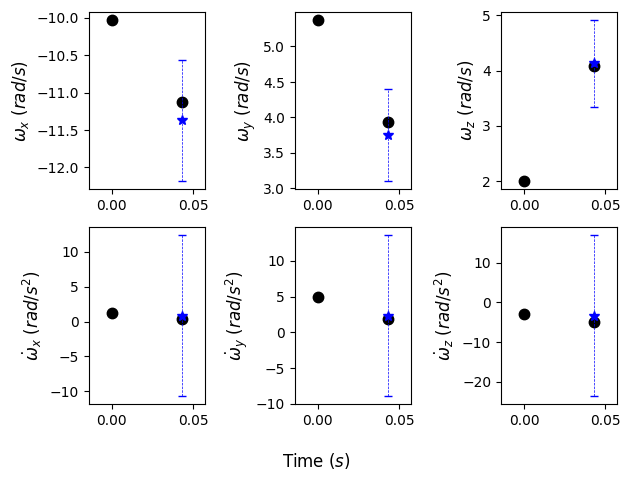

Current Batch Train Loss: -15.962997436523438

Current Batch Train Loss: -16.032039642333984

Current Batch Train Loss: -16.02224349975586

Current Batch Train Loss: -16.084875106811523

Current Batch Train Loss: -16.000133514404297

Current Batch Train Loss: -16.041667938232422

Current Batch Train Loss: -16.068370819091797

Current Batch Train Loss: -16.04993438720703

Current Batch Train Loss: -16.03765296936035

Current Batch Train Loss: -16.075796127319336

Epoch: 79, Batch Testing Loss: -16.050025939941406, Batch Testing Average RMSE: 9.718412399291992 w/ Standard Deviation: 7.587732791900635
Marginal Quantiles: tensor([0.5151, 0.5287, 0.5994, 1.9856, 2.0820, 1.9376, 0.2876, 0.2808, 0.1759,
        2.9924, 2.9329, 5.0778]),
 Joint Quantile: 6.435235023498535
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.53343665599823 ± 0.2765951454639435
Testing Calibrated (joint) Predictive Average Batch NLL: 2.3658201694488525 ± 0.1557593196630478
Testing Uncalibrated Predictiv

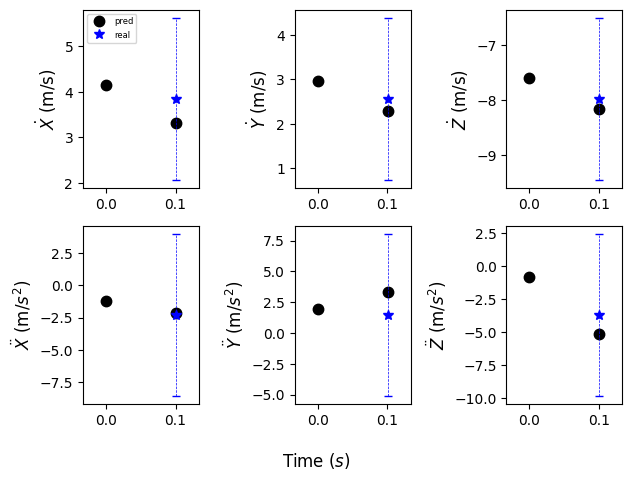

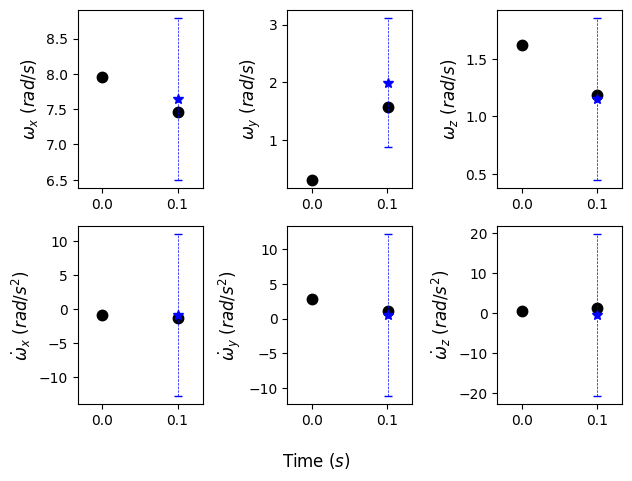

Current Batch Train Loss: -16.021759033203125

Current Batch Train Loss: -16.014598846435547

Current Batch Train Loss: -16.014984130859375

Current Batch Train Loss: -16.045631408691406

Current Batch Train Loss: -16.037935256958008

Current Batch Train Loss: -16.066909790039062

Current Batch Train Loss: -16.05084228515625

Current Batch Train Loss: -16.00368309020996

Current Batch Train Loss: -16.010635375976562

Current Batch Train Loss: -16.041593551635742

Epoch: 80, Batch Testing Loss: -16.01967430114746, Batch Testing Average RMSE: 9.699843406677246 w/ Standard Deviation: 7.114156246185303
Marginal Quantiles: tensor([0.4955, 0.5338, 0.5734, 2.1156, 2.0627, 1.9705, 0.2050, 0.2199, 0.2916,
        2.7254, 2.7868, 5.1631]),
 Joint Quantile: 6.632007598876953
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5228513479232788 ± 0.2519407868385315
Testing Calibrated (joint) Predictive Average Batch NLL: 2.375432014465332 ± 0.126766175031662
Testing Uncalibrated Predictiv

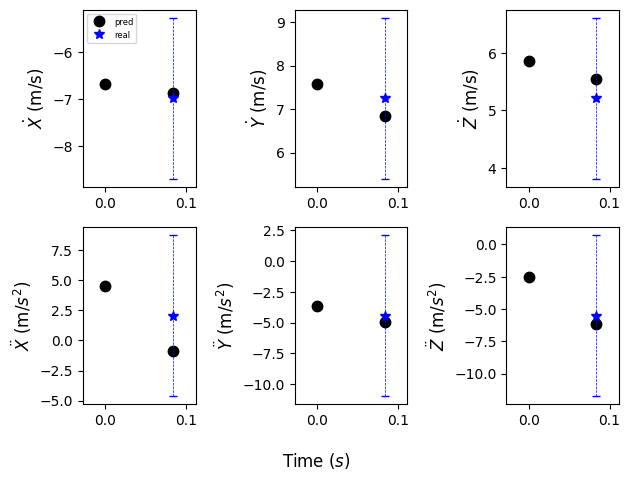

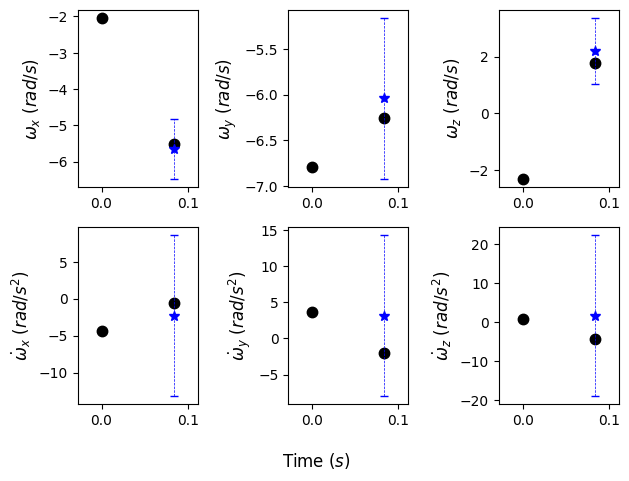

Model saved at epoch 80.

Current Batch Train Loss: -16.006893157958984

Current Batch Train Loss: -16.07282257080078

Current Batch Train Loss: -16.045146942138672

Current Batch Train Loss: -16.03898048400879

Current Batch Train Loss: -16.023649215698242

Current Batch Train Loss: -16.016834259033203

Current Batch Train Loss: -16.032344818115234

Current Batch Train Loss: -16.03940773010254

Current Batch Train Loss: -15.967143058776855

Current Batch Train Loss: -16.025146484375

Epoch: 81, Batch Testing Loss: -16.049232482910156, Batch Testing Average RMSE: 9.614782333374023 w/ Standard Deviation: 7.450839519500732
Marginal Quantiles: tensor([0.5187, 0.5703, 0.5618, 2.0582, 1.9490, 1.7997, 0.1596, 0.2770, 0.2069,
        2.7096, 2.5977, 5.0092]),
 Joint Quantile: 6.622087478637695
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5072855949401855 ± 0.3828786015510559
Testing Calibrated (joint) Predictive Average Batch NLL: 2.3790059089660645 ± 0.22814656794071198
Test

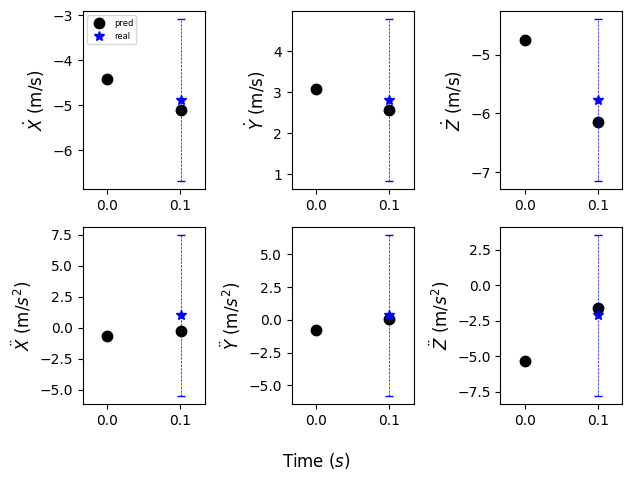

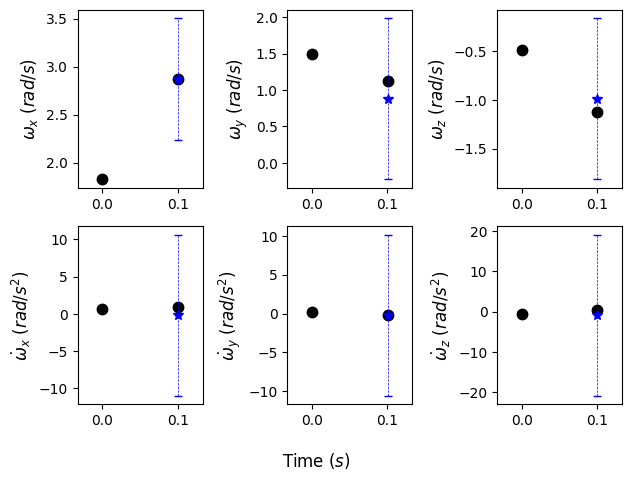

Current Batch Train Loss: -16.032148361206055

Current Batch Train Loss: -16.0174503326416

Current Batch Train Loss: -16.023252487182617

Current Batch Train Loss: -16.05823516845703

Current Batch Train Loss: -15.989472389221191

Current Batch Train Loss: -16.027080535888672

Current Batch Train Loss: -16.013246536254883

Current Batch Train Loss: -16.02669906616211

Current Batch Train Loss: -15.986679077148438

Current Batch Train Loss: -16.05218505859375

Epoch: 82, Batch Testing Loss: -16.030929565429688, Batch Testing Average RMSE: 9.731645584106445 w/ Standard Deviation: 6.9733967781066895
Marginal Quantiles: tensor([0.4688, 0.5120, 0.4994, 2.0811, 2.0599, 1.9990, 0.2400, 0.1683, 0.2108,
        2.8644, 2.9280, 5.2441]),
 Joint Quantile: 6.917220115661621
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.4963974952697754 ± 0.2181089073419571
Testing Calibrated (joint) Predictive Average Batch NLL: 2.394338607788086 ± 0.11186686158180237
Testing Uncalibrated Predicti

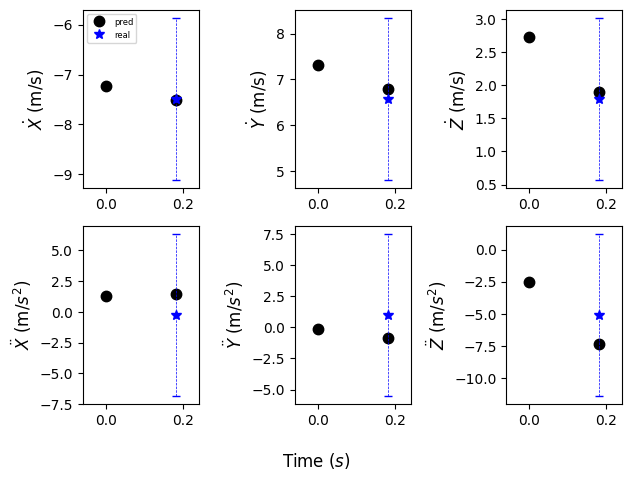

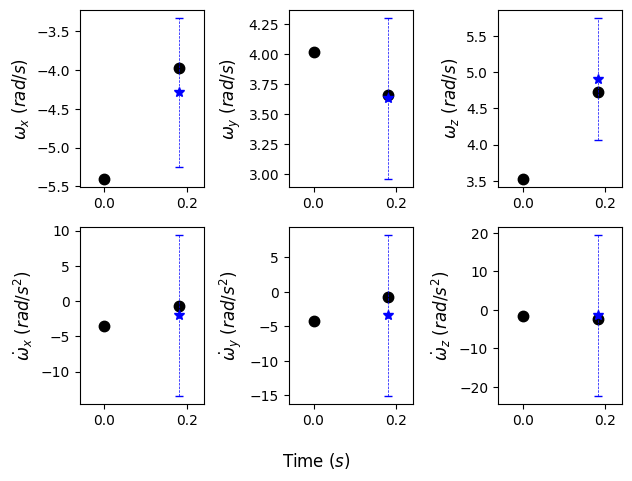

Current Batch Train Loss: -16.010061264038086

Current Batch Train Loss: -15.989134788513184

Current Batch Train Loss: -15.995438575744629

Current Batch Train Loss: -16.027278900146484

Current Batch Train Loss: -15.955527305603027

Current Batch Train Loss: -16.061222076416016

Current Batch Train Loss: -16.05669403076172

Current Batch Train Loss: -15.98975944519043

Current Batch Train Loss: -16.017126083374023

Current Batch Train Loss: -16.021944046020508

Epoch: 83, Batch Testing Loss: -16.01470184326172, Batch Testing Average RMSE: 9.719063758850098 w/ Standard Deviation: 6.984006881713867
Marginal Quantiles: tensor([0.5650, 0.5911, 0.5548, 1.9527, 2.1225, 1.9923, 0.1560, 0.1493, 0.2403,
        2.7115, 2.9371, 5.2083]),
 Joint Quantile: 6.696369647979736
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.498299479484558 ± 0.36427000164985657
Testing Calibrated (joint) Predictive Average Batch NLL: 2.3795511722564697 ± 0.121909961104393
Testing Uncalibrated Predicti

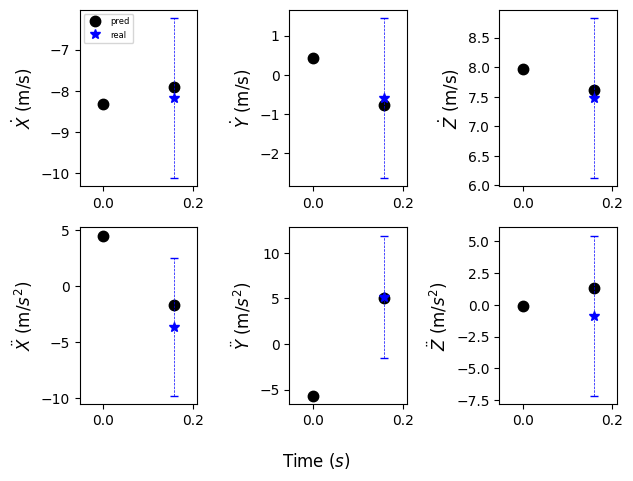

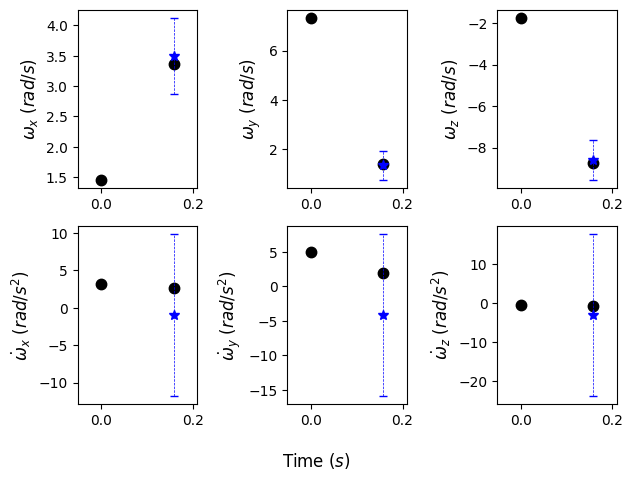

Current Batch Train Loss: -16.033035278320312

Current Batch Train Loss: -16.048582077026367

Current Batch Train Loss: -16.027793884277344

Current Batch Train Loss: -16.04429817199707

Current Batch Train Loss: -16.028554916381836

Current Batch Train Loss: -15.992783546447754

Current Batch Train Loss: -15.996711730957031

Current Batch Train Loss: -16.05522918701172

Current Batch Train Loss: -16.003116607666016

Current Batch Train Loss: -16.001720428466797

Epoch: 84, Batch Testing Loss: -16.01311683654785, Batch Testing Average RMSE: 9.67264175415039 w/ Standard Deviation: 7.516725540161133
Marginal Quantiles: tensor([0.4934, 0.4959, 0.5342, 2.0884, 2.1000, 2.0790, 0.2095, 0.1771, 0.2696,
        3.1900, 2.9108, 5.0849]),
 Joint Quantile: 6.823777198791504
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5141940116882324 ± 0.2688242495059967
Testing Calibrated (joint) Predictive Average Batch NLL: 2.3914196491241455 ± 0.1526191532611847
Testing Uncalibrated Predicti

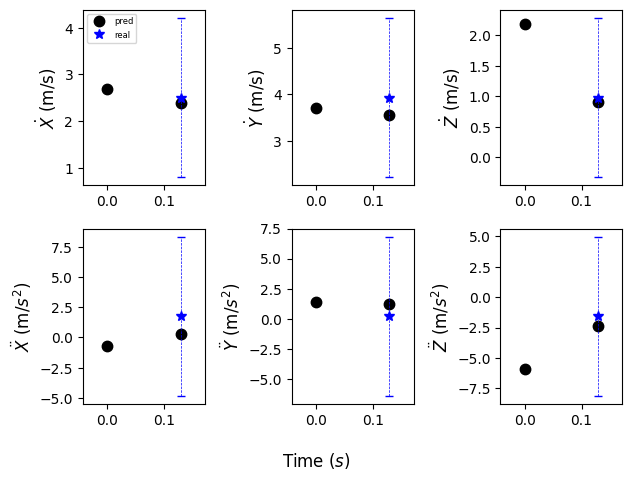

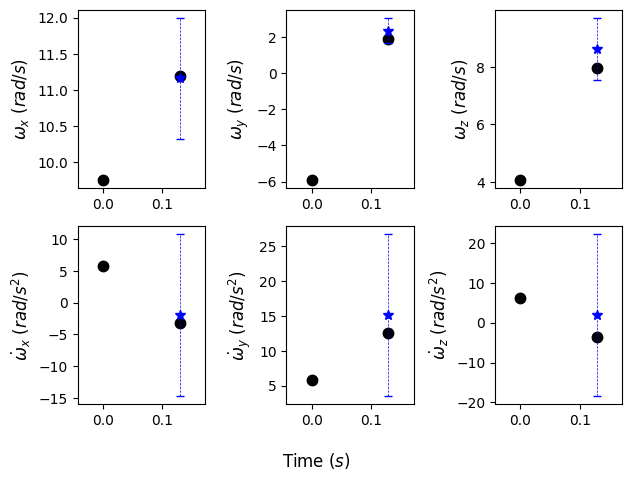

Current Batch Train Loss: -16.02753257751465

Current Batch Train Loss: -15.988789558410645

Current Batch Train Loss: -16.016786575317383

Current Batch Train Loss: -16.046812057495117

Current Batch Train Loss: -16.017213821411133

Current Batch Train Loss: -16.042287826538086

Current Batch Train Loss: -16.013010025024414

Current Batch Train Loss: -16.061025619506836

Current Batch Train Loss: -16.051647186279297

Current Batch Train Loss: -16.029199600219727

Epoch: 85, Batch Testing Loss: -16.033220291137695, Batch Testing Average RMSE: 9.64098072052002 w/ Standard Deviation: 6.871179103851318
Marginal Quantiles: tensor([0.5747, 0.5540, 0.5159, 2.0358, 1.9843, 1.8635, 0.1850, 0.2329, 0.1953,
        2.9201, 2.9367, 5.2661]),
 Joint Quantile: 6.858185768127441
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5015918016433716 ± 0.22062332928180695
Testing Calibrated (joint) Predictive Average Batch NLL: 2.389458179473877 ± 0.11600162088871002
Testing Uncalibrated Predi

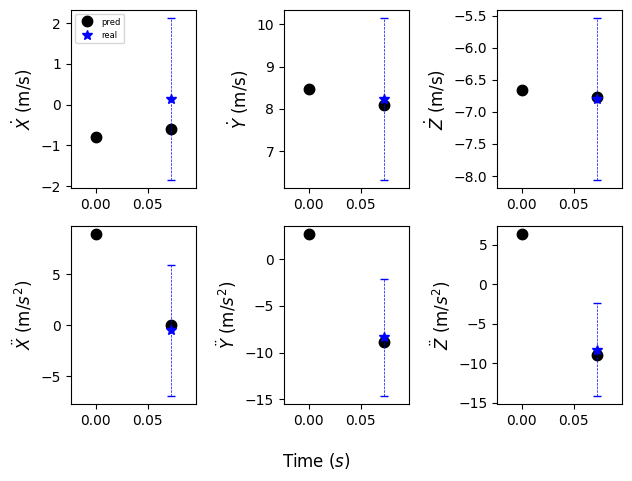

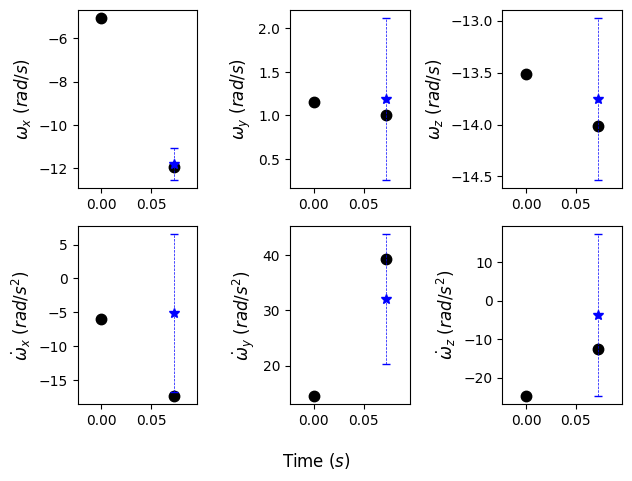

Model saved at epoch 85.

Current Batch Train Loss: -16.049890518188477

Current Batch Train Loss: -16.050371170043945

Current Batch Train Loss: -15.972749710083008

Current Batch Train Loss: -16.004798889160156

Current Batch Train Loss: -16.010469436645508

Current Batch Train Loss: -16.031705856323242

Current Batch Train Loss: -16.0335636138916

Current Batch Train Loss: -15.995201110839844

Current Batch Train Loss: -15.947819709777832

Current Batch Train Loss: -15.966245651245117

Epoch: 86, Batch Testing Loss: -15.968544960021973, Batch Testing Average RMSE: 9.784595489501953 w/ Standard Deviation: 7.235291957855225
Marginal Quantiles: tensor([0.5226, 0.5554, 0.5691, 2.0725, 2.0711, 2.1133, 0.2684, 0.1688, 0.1989,
        2.9417, 3.1808, 4.8602]),
 Joint Quantile: 6.804786682128906
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5183018445968628 ± 0.2281201183795929
Testing Calibrated (joint) Predictive Average Batch NLL: 2.3889665603637695 ± 0.12397629022598267


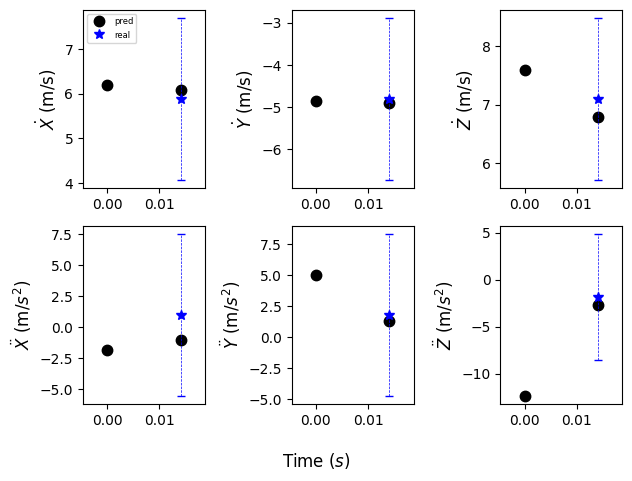

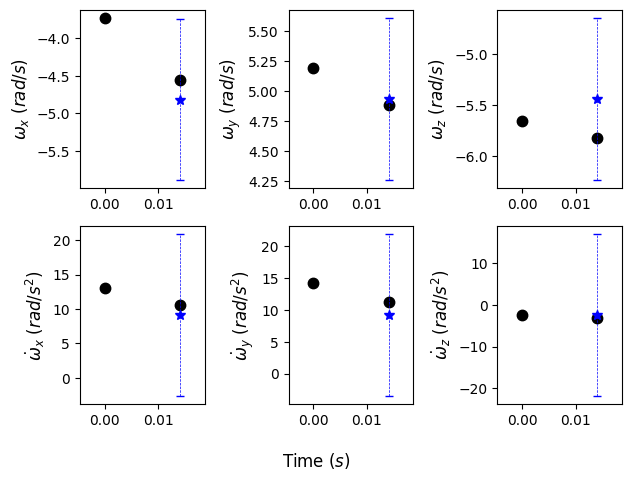

Current Batch Train Loss: -16.0177059173584

Current Batch Train Loss: -16.050277709960938

Current Batch Train Loss: -16.03589630126953

Current Batch Train Loss: -16.000303268432617

Current Batch Train Loss: -16.041770935058594

Current Batch Train Loss: -16.052770614624023

Current Batch Train Loss: -16.046188354492188

Current Batch Train Loss: -16.046524047851562

Current Batch Train Loss: -16.004865646362305

Current Batch Train Loss: -15.98415470123291

Epoch: 87, Batch Testing Loss: -16.02629280090332, Batch Testing Average RMSE: 10.367228507995605 w/ Standard Deviation: 7.002218246459961
Marginal Quantiles: tensor([0.5273, 0.5812, 0.5199, 2.1442, 2.0611, 1.9276, 0.1958, 0.2774, 0.2637,
        2.8149, 2.8499, 5.5424]),
 Joint Quantile: 6.837756633758545
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.536002278327942 ± 0.2159472554922104
Testing Calibrated (joint) Predictive Average Batch NLL: 2.3942337036132812 ± 0.12313967943191528
Testing Uncalibrated Predicti

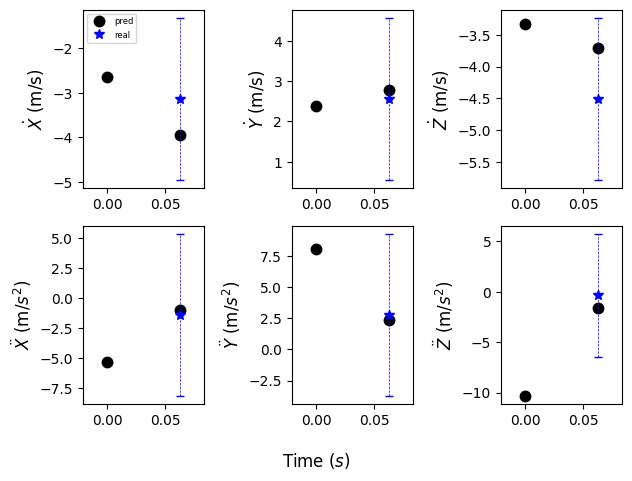

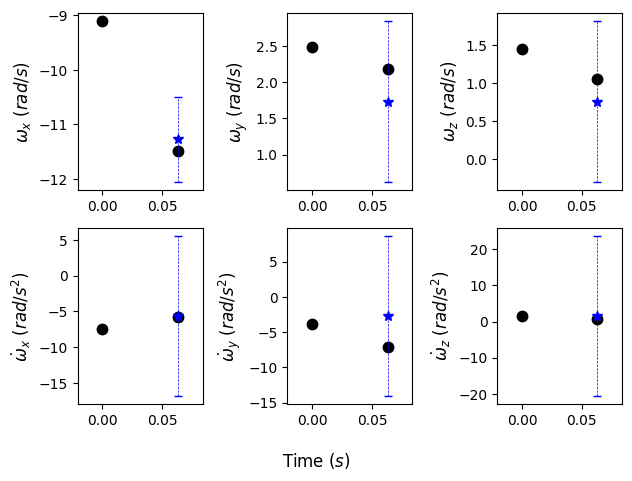

Current Batch Train Loss: -16.04486083984375

Current Batch Train Loss: -16.016786575317383

Current Batch Train Loss: -16.032413482666016

Current Batch Train Loss: -16.09282875061035

Current Batch Train Loss: -16.00307846069336

Current Batch Train Loss: -15.999712944030762

Current Batch Train Loss: -16.009464263916016

Current Batch Train Loss: -16.03241539001465

Current Batch Train Loss: -16.035648345947266

Current Batch Train Loss: -16.049821853637695

Epoch: 88, Batch Testing Loss: -16.01079750061035, Batch Testing Average RMSE: 9.4845609664917 w/ Standard Deviation: 6.602384567260742
Marginal Quantiles: tensor([0.5762, 0.5623, 0.5670, 2.0019, 2.0320, 1.9956, 0.1494, 0.1555, 0.3512,
        2.8282, 2.7370, 5.0521]),
 Joint Quantile: 6.415299892425537
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.4998761415481567 ± 0.1985776275396347
Testing Calibrated (joint) Predictive Average Batch NLL: 2.3576643466949463 ± 0.11024896800518036
Testing Uncalibrated Predictive

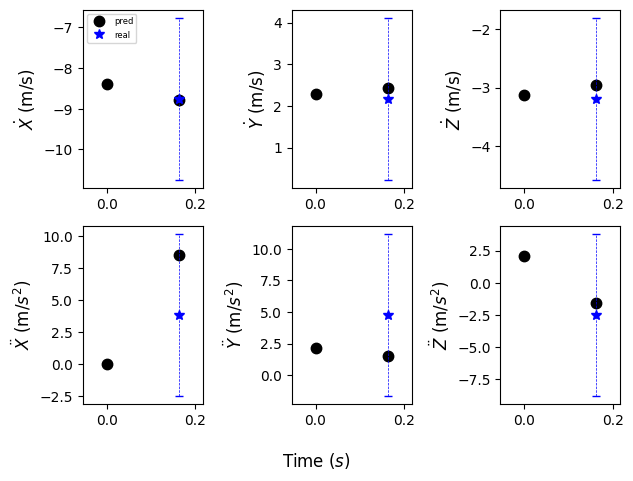

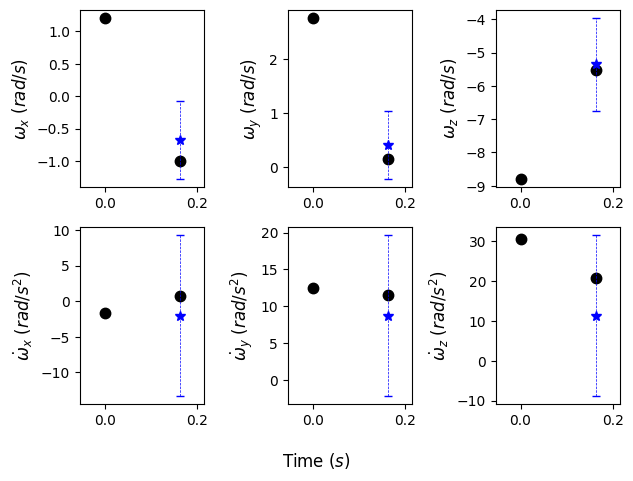

Current Batch Train Loss: -16.023319244384766

Current Batch Train Loss: -16.041179656982422

Current Batch Train Loss: -15.99984073638916

Current Batch Train Loss: -16.023000717163086

Current Batch Train Loss: -16.031314849853516

Current Batch Train Loss: -16.025634765625

Current Batch Train Loss: -16.02787971496582

Current Batch Train Loss: -16.05497169494629

Current Batch Train Loss: -16.037126541137695

Current Batch Train Loss: -16.070240020751953

Epoch: 89, Batch Testing Loss: -16.01148796081543, Batch Testing Average RMSE: 9.658458709716797 w/ Standard Deviation: 6.655789852142334
Marginal Quantiles: tensor([0.5419, 0.5935, 0.5345, 1.9388, 2.0364, 1.9094, 0.1484, 0.2660, 0.2177,
        2.8603, 2.8940, 5.0492]),
 Joint Quantile: 6.486949443817139
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.4989997148513794 ± 0.20179736614227295
Testing Calibrated (joint) Predictive Average Batch NLL: 2.361497640609741 ± 0.1122131496667862
Testing Uncalibrated Predictive 

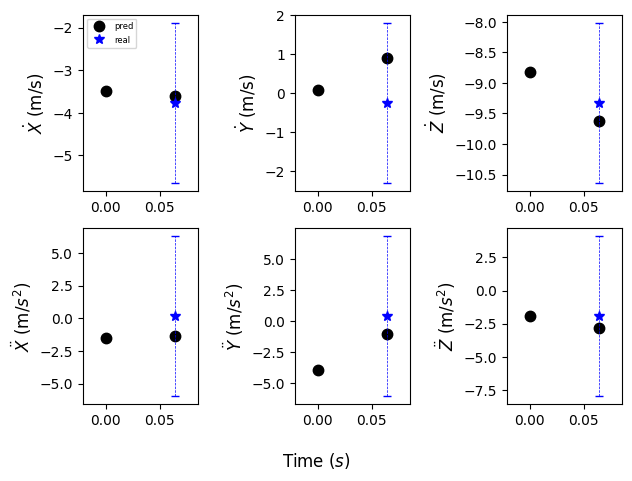

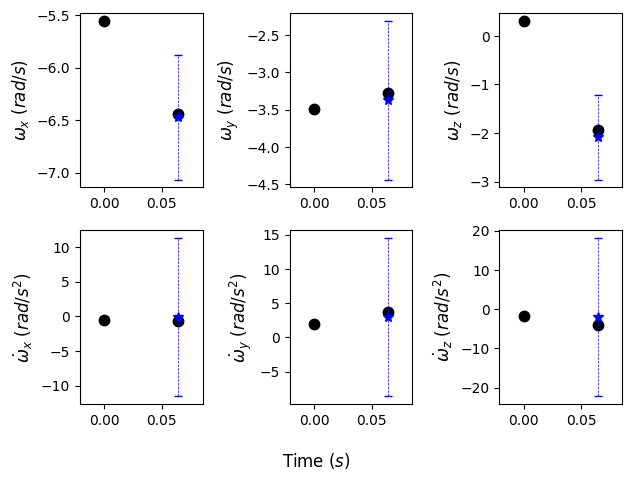

Current Batch Train Loss: -16.053104400634766

Current Batch Train Loss: -16.024276733398438

Current Batch Train Loss: -16.064289093017578

Current Batch Train Loss: -16.014820098876953

Current Batch Train Loss: -16.081457138061523

Current Batch Train Loss: -16.026580810546875

Current Batch Train Loss: -16.00679588317871

Current Batch Train Loss: -16.044113159179688

Current Batch Train Loss: -16.019990921020508

Current Batch Train Loss: -15.997703552246094

Epoch: 90, Batch Testing Loss: -16.017536163330078, Batch Testing Average RMSE: 9.569747924804688 w/ Standard Deviation: 7.108971118927002
Marginal Quantiles: tensor([0.4935, 0.5463, 0.5520, 2.0885, 2.1422, 1.8563, 0.2254, 0.1875, 0.2153,
        2.6608, 2.6523, 5.1149]),
 Joint Quantile: 6.509176254272461
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5107501745224 ± 0.4360335171222687
Testing Calibrated (joint) Predictive Average Batch NLL: 2.3691956996917725 ± 0.17142032086849213
Testing Uncalibrated Predict

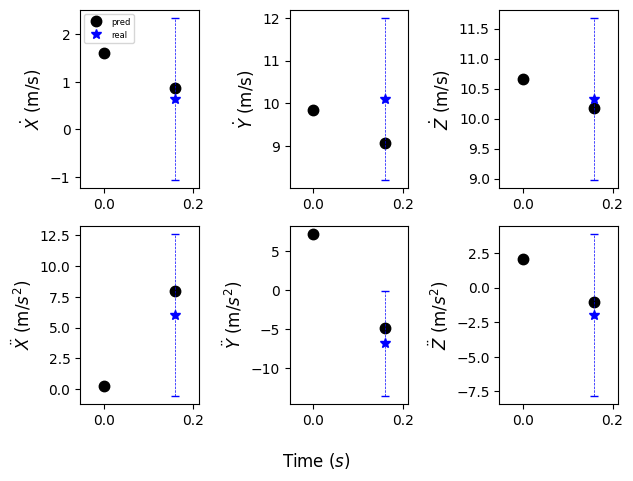

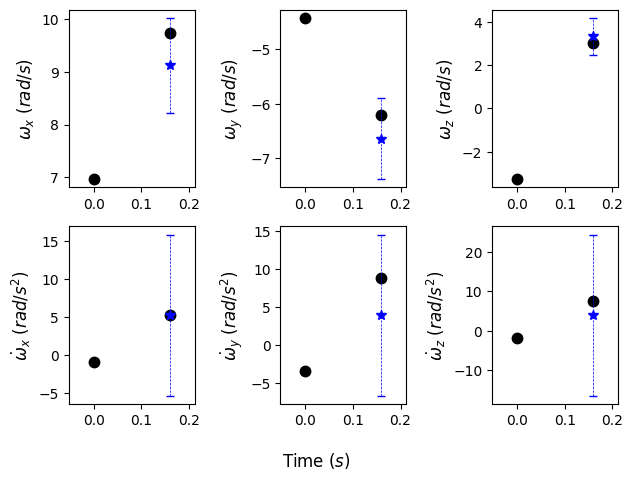

Model saved at epoch 90.

Current Batch Train Loss: -15.986934661865234

Current Batch Train Loss: -16.034635543823242

Current Batch Train Loss: -16.045480728149414

Current Batch Train Loss: -15.974409103393555

Current Batch Train Loss: -15.99868106842041

Current Batch Train Loss: -16.02195930480957

Current Batch Train Loss: -16.030963897705078

Current Batch Train Loss: -16.01296043395996

Current Batch Train Loss: -16.027111053466797

Current Batch Train Loss: -16.002351760864258

Epoch: 91, Batch Testing Loss: -16.00575065612793, Batch Testing Average RMSE: 9.579341888427734 w/ Standard Deviation: 7.111908912658691
Marginal Quantiles: tensor([0.5307, 0.5233, 0.5280, 1.9860, 1.9624, 1.7915, 0.1854, 0.2191, 0.2784,
        2.7949, 2.8626, 5.2839]),
 Joint Quantile: 6.689419269561768
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5119379758834839 ± 0.27629202604293823
Testing Calibrated (joint) Predictive Average Batch NLL: 2.381510019302368 ± 0.17212140560150146
Te

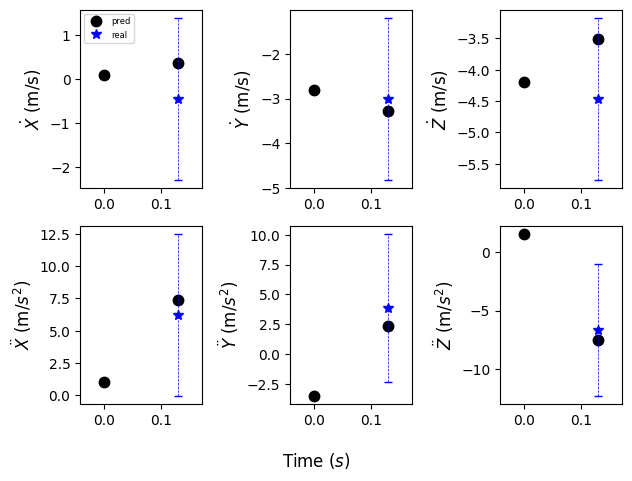

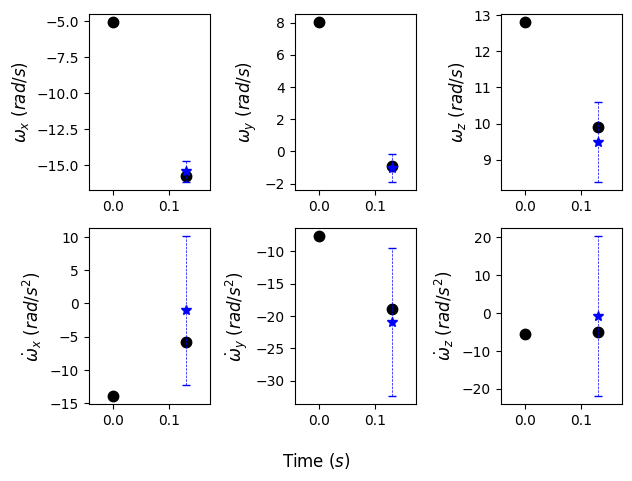

Current Batch Train Loss: -15.984771728515625

Current Batch Train Loss: -16.01072120666504

Current Batch Train Loss: -16.025598526000977

Current Batch Train Loss: -16.01131248474121

Current Batch Train Loss: -16.01988983154297

Current Batch Train Loss: -16.01479721069336

Current Batch Train Loss: -15.977206230163574

Current Batch Train Loss: -16.034196853637695

Current Batch Train Loss: -16.021516799926758

Current Batch Train Loss: -16.01350212097168

Epoch: 92, Batch Testing Loss: -16.03677749633789, Batch Testing Average RMSE: 9.69788646697998 w/ Standard Deviation: 8.412530899047852
Marginal Quantiles: tensor([0.5170, 0.5378, 0.5574, 1.9712, 1.9343, 1.9502, 0.1915, 0.1577, 0.2557,
        2.7311, 3.0394, 5.3520]),
 Joint Quantile: 7.096558094024658
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.523317575454712 ± 0.8380123376846313
Testing Calibrated (joint) Predictive Average Batch NLL: 2.4190516471862793 ± 0.39935067296028137
Testing Uncalibrated Predictive 

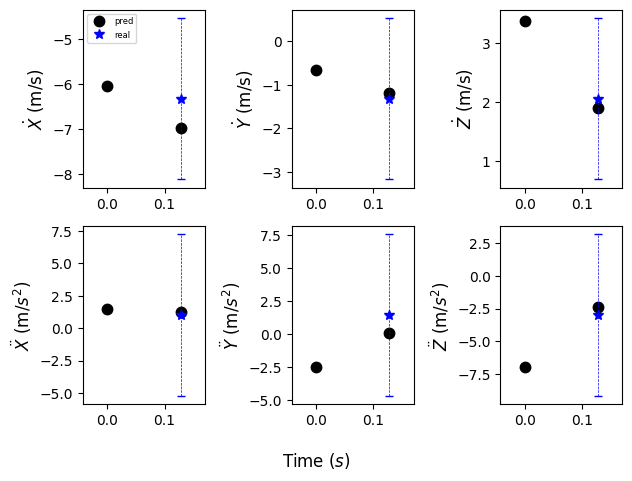

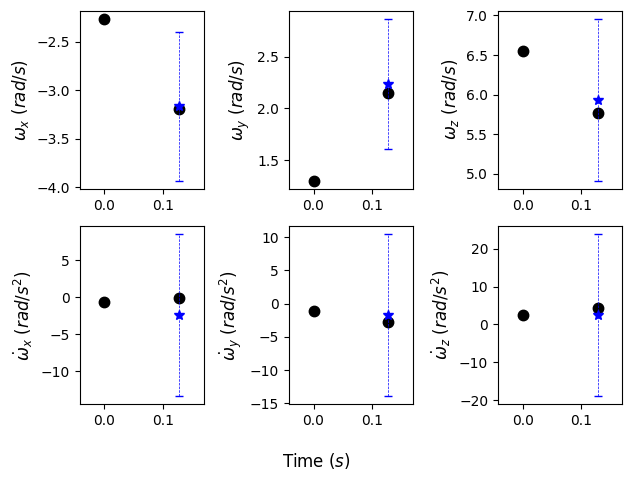

Current Batch Train Loss: -16.035985946655273

Current Batch Train Loss: -15.978946685791016

Current Batch Train Loss: -16.017789840698242

Current Batch Train Loss: -16.047595977783203

Current Batch Train Loss: -16.056076049804688

Current Batch Train Loss: -16.009822845458984

Current Batch Train Loss: -16.054269790649414

Current Batch Train Loss: -16.011823654174805

Current Batch Train Loss: -16.01727867126465

Current Batch Train Loss: -15.983804702758789

Epoch: 93, Batch Testing Loss: -15.988883018493652, Batch Testing Average RMSE: 9.843244552612305 w/ Standard Deviation: 7.0586466789245605
Marginal Quantiles: tensor([0.4997, 0.5828, 0.5290, 2.0294, 2.1209, 1.8964, 0.2943, 0.2800, 0.2801,
        2.8786, 3.1295, 5.3723]),
 Joint Quantile: 6.9562811851501465
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.547620415687561 ± 0.20426303148269653
Testing Calibrated (joint) Predictive Average Batch NLL: 2.3946151733398438 ± 0.10972278565168381
Testing Uncalibrated Pr

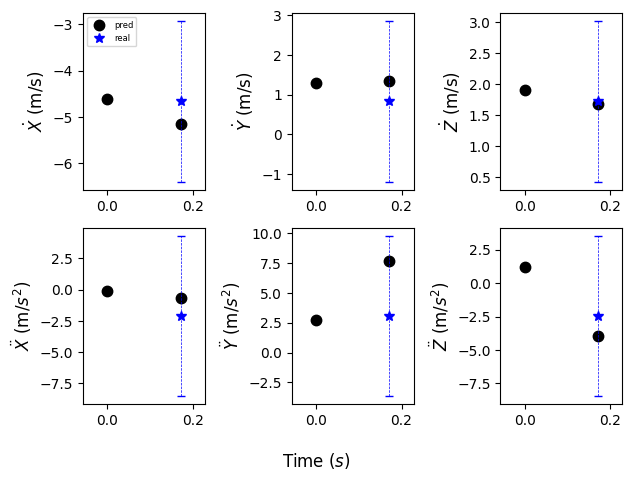

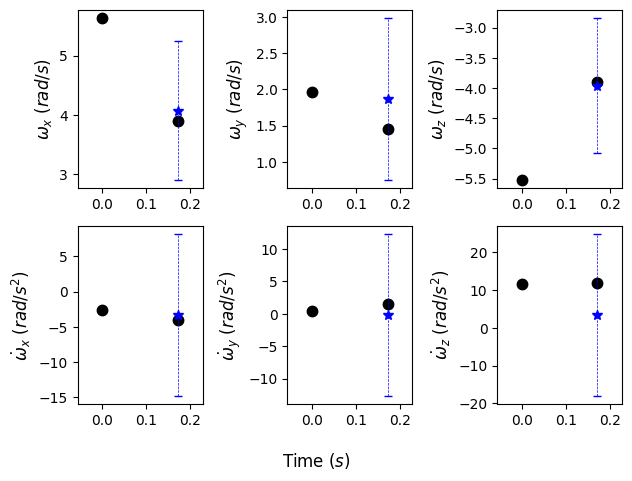

Current Batch Train Loss: -16.02939796447754

Current Batch Train Loss: -16.0413761138916

Current Batch Train Loss: -16.037845611572266

Current Batch Train Loss: -16.03545570373535

Current Batch Train Loss: -16.007184982299805

Current Batch Train Loss: -16.04531478881836

Current Batch Train Loss: -16.01072883605957

Current Batch Train Loss: -16.02954864501953

Current Batch Train Loss: -16.01478385925293

Current Batch Train Loss: -16.006155014038086

Epoch: 94, Batch Testing Loss: -16.008893966674805, Batch Testing Average RMSE: 9.51423454284668 w/ Standard Deviation: 6.790297508239746
Marginal Quantiles: tensor([0.5345, 0.5683, 0.5399, 2.0464, 1.9983, 1.8379, 0.1951, 0.1786, 0.2030,
        2.8350, 2.8697, 4.9508]),
 Joint Quantile: 6.723867416381836
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.4896488189697266 ± 0.22667454183101654
Testing Calibrated (joint) Predictive Average Batch NLL: 2.3777554035186768 ± 0.1094113364815712
Testing Uncalibrated Predictive A

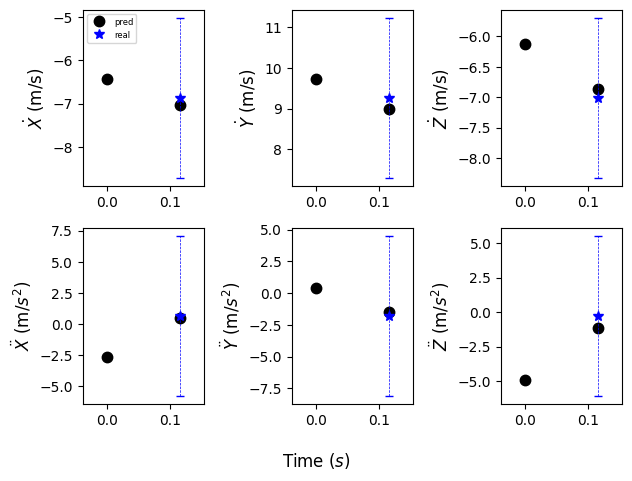

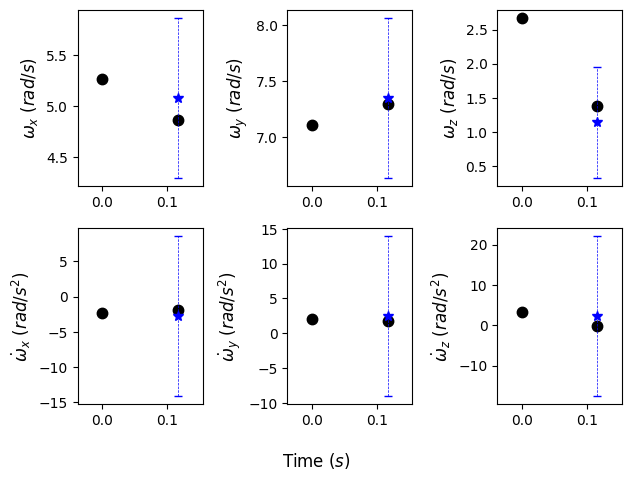

Current Batch Train Loss: -16.01548957824707

Current Batch Train Loss: -15.987627029418945

Current Batch Train Loss: -15.986763000488281

Current Batch Train Loss: -16.025978088378906

Current Batch Train Loss: -15.99343490600586

Current Batch Train Loss: -16.016569137573242

Current Batch Train Loss: -16.005268096923828

Current Batch Train Loss: -16.027055740356445

Current Batch Train Loss: -15.993480682373047

Current Batch Train Loss: -16.030527114868164

Epoch: 95, Batch Testing Loss: -15.975870132446289, Batch Testing Average RMSE: 9.374442100524902 w/ Standard Deviation: 6.875670433044434
Marginal Quantiles: tensor([0.5330, 0.5429, 0.5142, 1.9170, 2.0361, 1.9053, 0.1369, 0.1583, 0.1897,
        2.9367, 2.7842, 5.2908]),
 Joint Quantile: 6.8656816482543945
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.4663538932800293 ± 0.24711453914642334
Testing Calibrated (joint) Predictive Average Batch NLL: 2.3900978565216064 ± 0.14077408611774445
Testing Uncalibrated Pre

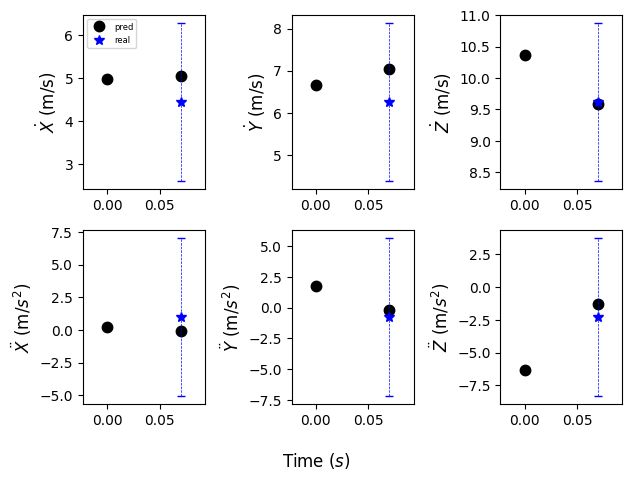

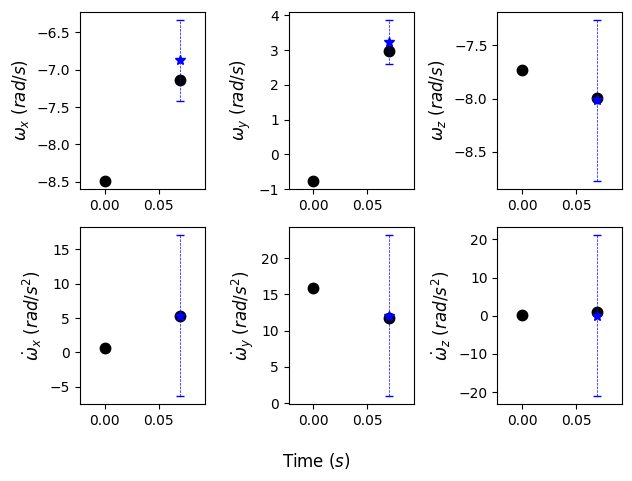

Model saved at epoch 95.

Current Batch Train Loss: -16.00286865234375

Current Batch Train Loss: -16.00984764099121

Current Batch Train Loss: -16.03326416015625

Current Batch Train Loss: -16.0087833404541

Current Batch Train Loss: -16.008821487426758

Current Batch Train Loss: -16.045692443847656

Current Batch Train Loss: -15.985093116760254

Current Batch Train Loss: -16.014192581176758

Current Batch Train Loss: -16.035755157470703

Current Batch Train Loss: -16.04303741455078

Epoch: 96, Batch Testing Loss: -16.027713775634766, Batch Testing Average RMSE: 9.59510326385498 w/ Standard Deviation: 7.066300868988037
Marginal Quantiles: tensor([0.4911, 0.5141, 0.5291, 2.0706, 2.0448, 1.8488, 0.2272, 0.1468, 0.2860,
        2.8455, 2.8510, 5.2366]),
 Joint Quantile: 7.1069793701171875
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5009477138519287 ± 0.23861248791217804
Testing Calibrated (joint) Predictive Average Batch NLL: 2.406749963760376 ± 0.13451775908470154
Test

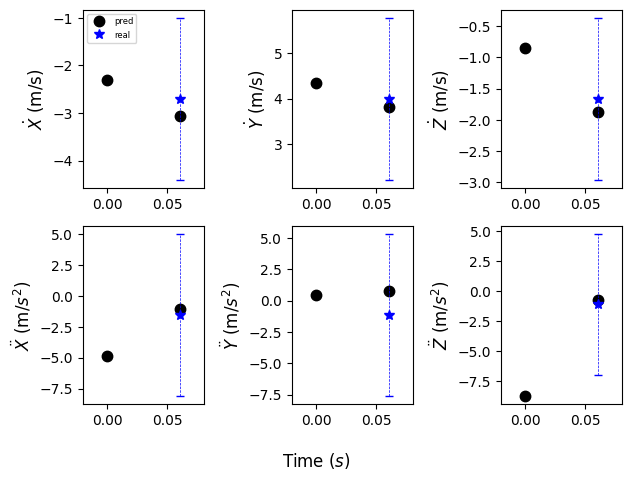

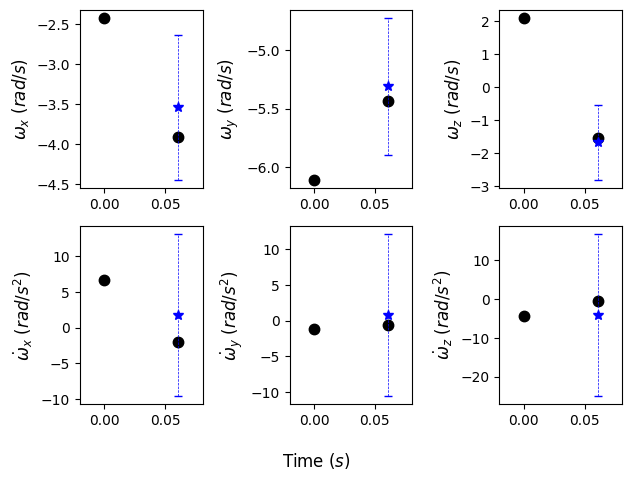

Current Batch Train Loss: -15.967560768127441

Current Batch Train Loss: -16.071725845336914

Current Batch Train Loss: -16.026641845703125

Current Batch Train Loss: -16.045814514160156

Current Batch Train Loss: -16.009613037109375

Current Batch Train Loss: -16.040746688842773

Current Batch Train Loss: -16.03520393371582

Current Batch Train Loss: -16.012258529663086

Current Batch Train Loss: -15.989713668823242

Current Batch Train Loss: -16.031370162963867

Epoch: 97, Batch Testing Loss: -16.012422561645508, Batch Testing Average RMSE: 9.394235610961914 w/ Standard Deviation: 7.160583972930908
Marginal Quantiles: tensor([0.5525, 0.5154, 0.5813, 1.9670, 2.0489, 2.0428, 0.1551, 0.2533, 0.2445,
        2.7135, 2.7712, 4.7031]),
 Joint Quantile: 6.417987823486328
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5100016593933105 ± 0.29051193594932556
Testing Calibrated (joint) Predictive Average Batch NLL: 2.363265037536621 ± 0.17862524092197418
Testing Uncalibrated Pred

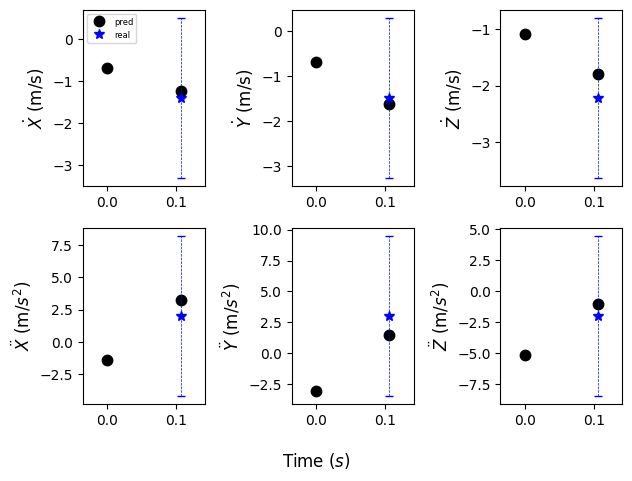

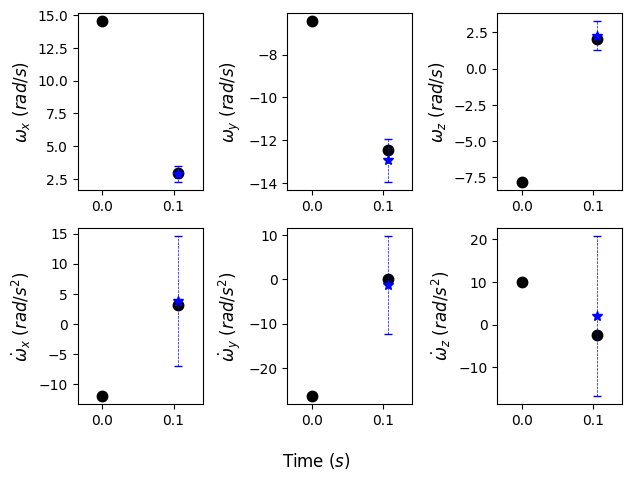

Current Batch Train Loss: -16.051319122314453

Current Batch Train Loss: -15.978669166564941

Current Batch Train Loss: -16.044509887695312

Current Batch Train Loss: -16.055879592895508

Current Batch Train Loss: -16.010913848876953

Current Batch Train Loss: -15.996170997619629

Current Batch Train Loss: -16.020694732666016

Current Batch Train Loss: -15.997405052185059

Current Batch Train Loss: -16.05951690673828

Current Batch Train Loss: -16.06838035583496

Epoch: 98, Batch Testing Loss: -15.953097343444824, Batch Testing Average RMSE: 9.56513500213623 w/ Standard Deviation: 7.5879058837890625
Marginal Quantiles: tensor([0.5254, 0.5370, 0.5386, 1.9719, 1.9649, 1.9100, 0.1325, 0.1474, 0.2109,
        2.6108, 3.1522, 5.5872]),
 Joint Quantile: 6.95145845413208
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.484055995941162 ± 0.48161426186561584
Testing Calibrated (joint) Predictive Average Batch NLL: 2.4017820358276367 ± 0.1901107132434845
Testing Uncalibrated Predict

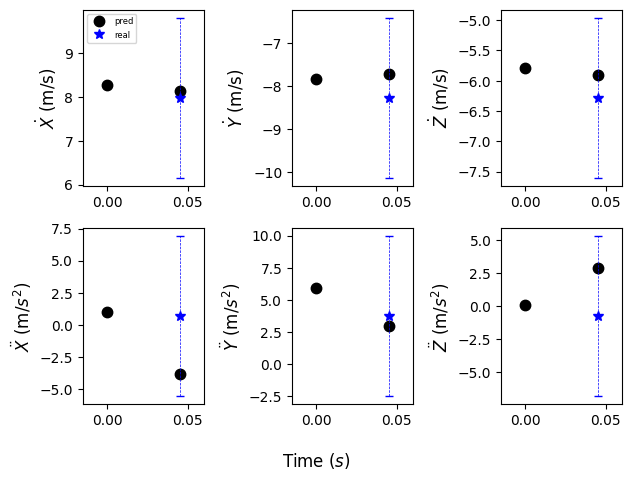

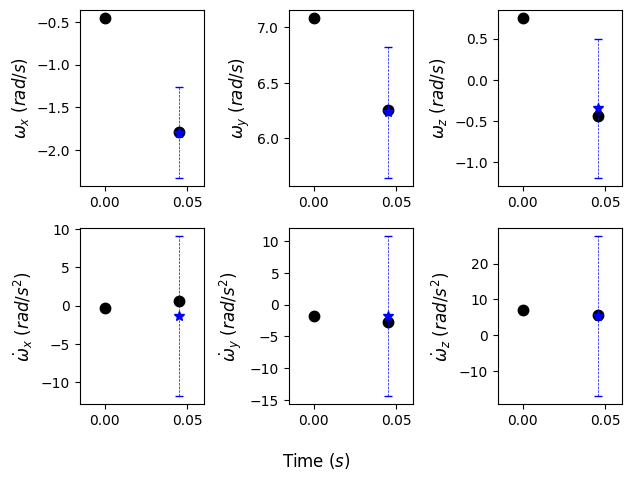

Current Batch Train Loss: -16.024478912353516

Current Batch Train Loss: -15.9973783493042

Current Batch Train Loss: -16.051542282104492

Current Batch Train Loss: -16.05630111694336

Current Batch Train Loss: -16.017911911010742

Current Batch Train Loss: -16.0108642578125

Current Batch Train Loss: -16.037778854370117

Current Batch Train Loss: -16.023574829101562

Current Batch Train Loss: -15.995431900024414

Current Batch Train Loss: -16.013399124145508

Epoch: 99, Batch Testing Loss: -15.992476463317871, Batch Testing Average RMSE: 9.42444896697998 w/ Standard Deviation: 6.690497875213623
Marginal Quantiles: tensor([0.5258, 0.5041, 0.5438, 2.0841, 2.0140, 1.9096, 0.2458, 0.2419, 0.2116,
        2.5626, 2.7684, 5.3192]),
 Joint Quantile: 6.5323567390441895
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.5070070028305054 ± 0.22252662479877472
Testing Calibrated (joint) Predictive Average Batch NLL: 2.3669204711914062 ± 0.12397689372301102
Testing Uncalibrated Predict

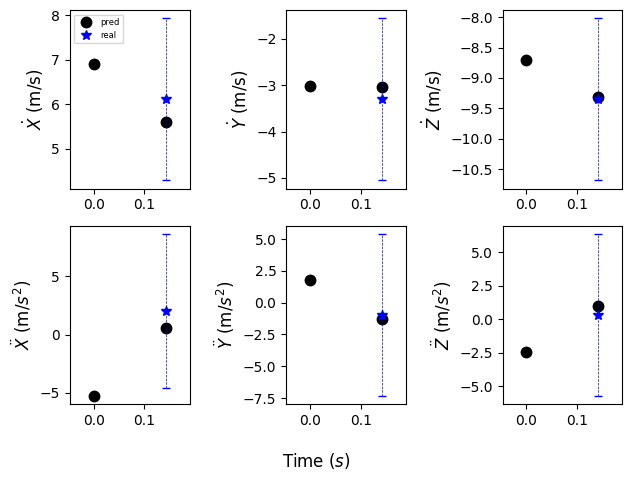

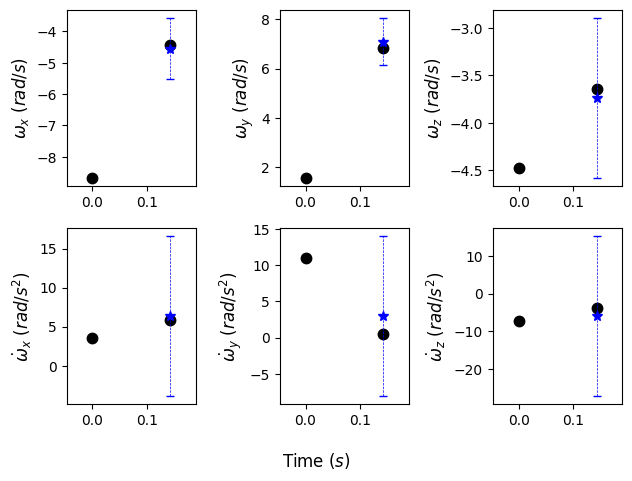

Current Batch Train Loss: -15.994719505310059

Current Batch Train Loss: -16.027040481567383

Current Batch Train Loss: -16.000219345092773

Current Batch Train Loss: -16.014015197753906

Current Batch Train Loss: -16.03295135498047

Current Batch Train Loss: -15.972806930541992

Current Batch Train Loss: -16.061662673950195

Current Batch Train Loss: -15.980746269226074

Current Batch Train Loss: -15.999920845031738

Current Batch Train Loss: -15.989750862121582

Epoch: 100, Batch Testing Loss: -16.005090713500977, Batch Testing Average RMSE: 9.479461669921875 w/ Standard Deviation: 6.667998313903809
Marginal Quantiles: tensor([0.5427, 0.5166, 0.5356, 2.0327, 2.1072, 1.9779, 0.1617, 0.1666, 0.2823,
        2.5568, 2.7221, 5.0531]),
 Joint Quantile: 6.43175745010376
Testing Calibrated (marginal) Predictive Average Batch NLL: 1.489200472831726 ± 0.2100636065006256
Testing Calibrated (joint) Predictive Average Batch NLL: 2.3608999252319336 ± 0.12207785993814468
Testing Uncalibrated Predi

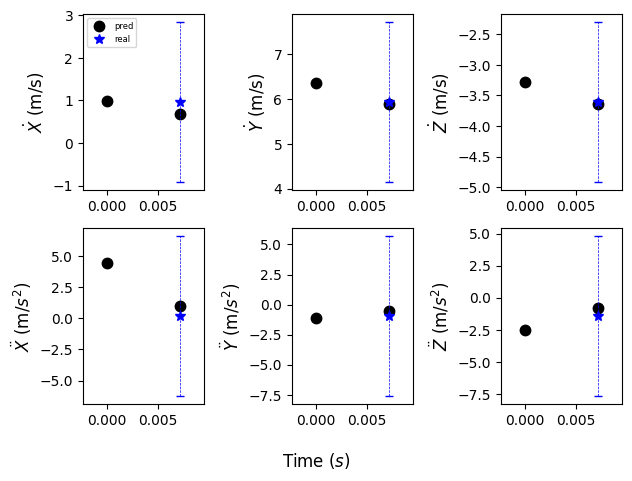

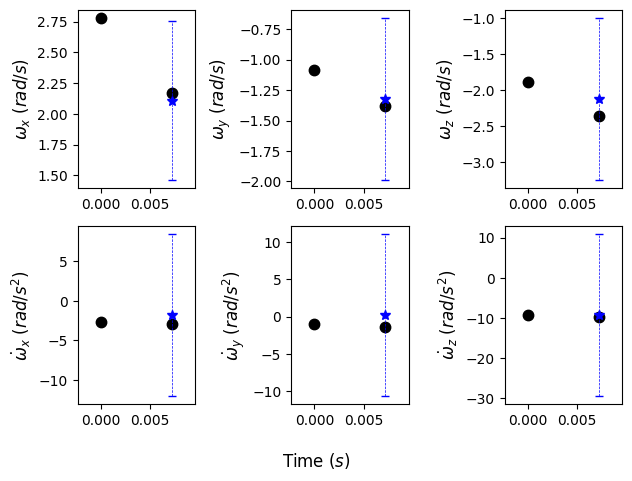

Model saved at epoch 100.

Current Batch Train Loss: -16.027982711791992

Current Batch Train Loss: -16.024532318115234

Current Batch Train Loss: -15.959124565124512

Current Batch Train Loss: -16.07213020324707

Current Batch Train Loss: -16.006254196166992



In [ ]:
# Initializing LNP model
encoder_input = torch.concat([context_x, context_y], dim=-1)
encoder_size = encoder_input.shape[2]
model = AttLNP(
    state_dim=12,
    control_dim=4
)

# Initializing model's loss function and optimizer
criterion = LossFunc().to(device)  # Move criterion to the device
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3, weight_decay=5e-7, amsgrad=True)

# Initializing training + validation loss tracker
train_loss_array = np.array([])
train_iter_array = np.array([])
val_loss_array = np.array([])
val_RMSE_array = np.array([])
q_norm_array = np.array([])
q_scalar_array = np.array([])
q_marginal_coverage_array = np.array([])
q_joint_coverage_array = np.array([])
np_coverage_array = np.array([])
val_NLL_avg_array = np.array([])
val_NLL_avg_CP_marginal_array = np.array([])
val_NLL_avg_CP_joint_array = np.array([])
val_epoch_array = np.linspace(0, NUM_EPOCHS, int(NUM_EPOCHS/PLOT_AFTER)+1)

# Initializing training loop
i = 0
for epoch in range(NUM_EPOCHS+1):

  if epoch % PLOT_AFTER == 0:
    with torch.no_grad():

      # Sampling random validation batch
      idx = random.randint(0, test_dataset.shape[0]-BATCH_SIZE)
      batch_dataset = test_dataset[idx:idx+BATCH_SIZE,:,:]
      input = batch_dataset[:,:,:5].to(device)
      output = batch_dataset[:,:,5:].to(device)
      input_unnorm = test_dataset_unnorm[idx:idx+BATCH_SIZE,:23].to(device)

      # Defining context and target sets
      context_x = input[:,0:1,:].clone()
      context_y = output[:,0:1,:].clone()
      target_x = input.clone()
      target_y = output.clone()

      # Initializing query object for model
      query = ((context_x, context_y), target_x)

      # Collecting predicted outputs + their associated variances + loss info
      # from comparing to ground-truth dynamical data
      log_p, kl, pred_y, var = model(query, input_unnorm, target_y, is_testing=True)

      # Unnormalizing data for plotting and computing AAE
      target_y, pred_y, var = db.minmax_unnorm(target_y, pred_y, var)

      # Computing empirical coverage of uncalibrated predictive distribution
      np_coverage = compute_empirical_coverage(target_y, pred_y, var)

      # Computing NLL of uncalibrated predictive distribution
      nll, nll_std = compute_avg_nll(target_y[:,-1,:], pred_y[:,-1,:], var[:,-1,:])
      val_NLL_avg_array = np.concatenate([val_NLL_avg_array, nll.unsqueeze(0).detach().numpy()])  

      # Scale the variances based on quantiles (joint quantile)
      q_joint = compute_joint_conformal_quantile(target_y, pred_y, var, alpha=0.95)
      var_copy = var.clone()  # Copying last time step variances
      joint_coverage = compute_joint_empirical_coverage(target_y, pred_y, var_copy, q_joint)
      var_copy *= q_joint.unsqueeze(0)
      q_scalar_array = np.concatenate([q_scalar_array, q_joint.unsqueeze(0).detach().numpy()])
      nll_CP_joint, nll_std_CP_joint = compute_avg_nll(target_y[:,-1,:], pred_y[:,-1,:], var_copy[:,-1,:])
      val_NLL_avg_CP_joint_array = np.concatenate([val_NLL_avg_CP_joint_array, nll_CP_joint.unsqueeze(0).detach().numpy()])

      # Scale the variances based on quantiles (each state gets its own scaling factor)
      q_marginal = compute_marginal_conformal_quantiles(target_y, pred_y, var, alpha=0.95)
      marginal_coverage = compute_marginal_empirical_coverage(target_y, pred_y, var, q_marginal)
      var[:, -1, :] *= q_marginal.unsqueeze(0)
      q_norm_array = np.concatenate([q_norm_array, torch.linalg.norm(q_marginal).unsqueeze(0).detach().numpy()])

      # Computing NLL of CP-calibrated predictive distribution
      nll_CP_marginal, nll_std_CP_marginal = compute_avg_nll(target_y[:,-1,:], pred_y[:,-1,:], var[:,-1,:])
      val_NLL_avg_CP_marginal_array = np.concatenate([val_NLL_avg_CP_marginal_array, nll_CP_marginal.unsqueeze(0).detach().numpy()]) 

      # Collecting loss from prediction
      loss_test = criterion(log_p, kl)

      # Computing root mean squared error (RMSE) over current testing batch
      batch_RMSE, batch_RMSE_std = compute_RMSE(target_y.detach().numpy(), pred_y.detach().numpy())
      val_RMSE_array = np.concatenate([val_RMSE_array, np.array([batch_RMSE])], axis=0)
      q_marginal_coverage_array = np.concatenate([q_marginal_coverage_array, torch.mean(marginal_coverage).unsqueeze(0).detach().numpy()])
      q_joint_coverage_array = np.concatenate([q_joint_coverage_array, np.array([joint_coverage])])
      np_coverage_array = np.concatenate([np_coverage_array, np.array([torch.mean(np_coverage).detach().numpy()])])

      # Recording performance after every 'PLOT_AFTER' iterations
      print(f"Epoch: {int(epoch/2)}, Batch Testing Loss: {loss_test}, Batch Testing Average RMSE: {batch_RMSE} w/ Standard Deviation: {batch_RMSE_std}")
      print(f"Marginal Quantiles: {q_marginal},\n Joint Quantile: {q_joint}")
      print(f'Testing Calibrated (marginal) Predictive Average Batch NLL: {nll_CP_marginal} ± {nll_std_CP_marginal}')
      print(f'Testing Calibrated (joint) Predictive Average Batch NLL: {nll_CP_joint} ± {nll_std_CP_joint}')
      print(f'Testing Uncalibrated Predictive Average Batch NLL: {nll} ± {nll_std}')
      print(f'Marginal Empirical Coverage: {marginal_coverage}, Marginal Empirical Averaged Coverage: {torch.mean(marginal_coverage)} Joint Empirical Coverage: {joint_coverage}')
      print(f'Uncalibrated Empirical Coverage: {torch.mean(np_coverage)}\n')

      # Plotting testing state prediction sample vs the corresponding PI-AttNP prediction
      plot_all_functions(context_x,context_y,target_x,target_y, pred_y, var)

      # Collecting validation loss history
      val_loss_array = np.concatenate([val_loss_array, np.array([loss_test])], axis=0)

      if epoch % SAVE_MODEL_AFTER == 0:
        # Saving model after every 'SAVE_MODEL_AFTER' epochs
        torch.save(model, f'trained-model-epoch-{epoch}.pt')
        print(f"Model saved at epoch {int(epoch/2)}.\n")

  # Executing training loop
  for batch in range(0, train_dataset.shape[0], BATCH_SIZE):
    # Parsing batch dataset
    batch_dataset = train_dataset[batch:batch+BATCH_SIZE,:,:]
    input = batch_dataset[:,:,:5].to(device)
    output = batch_dataset[:,:,5:].to(device)
    input_unnorm = train_dataset_unnorm[batch:batch+BATCH_SIZE,:23].to(device)

    # Defining context and target sets
    context_x = input[:,0:1,:].clone()
    context_y = output[:,0:1,:].clone()
    target_x = input.clone()
    target_y = output.clone()

    # Forming batch query of state transitions to be predicted by model
    query = ((context_x, context_y), target_x)

    # zero the parameter gradients for each batch
    optimizer.zero_grad()

    # forward + back propogation + optimizer step
    log_p, kl, pred_y, _ = model(query, input_unnorm, target_y)
    loss_train = criterion(log_p, kl)
    loss_train.backward()
    optimizer.step()

    # Collecting training loss history after every 'COLLECT_LOSS_AFTER' iters
    if i % COLLECT_TRAINING_LOSS_AFTER == 1:
      print(f"Current Batch Train Loss: {loss_train.item()}\n")
      train_loss_array = np.concatenate([train_loss_array, np.array([loss_train.detach()])], axis=0)
      train_iter_array = np.concatenate([train_iter_array, np.array([i])], axis=0)
    i += 1

  train_dataset, train_dataset_unnorm = shuffle_data(train_dataset, train_dataset_unnorm)  

#### Forward Pass Compute Wall-Time

In [41]:
import torch
import time
import random
import numpy as np

# Ensure model is on CPU
device = torch.device("cpu")
model.to(device)
model.eval()

# Parameters
BATCH_SIZE = 1000
NUM_TRIALS = 100
timings = []

for _ in range(NUM_TRIALS):
    # Sampling random validation batch
    idx = random.randint(0, test_dataset.shape[0] - BATCH_SIZE)
    batch_dataset = test_dataset[idx:idx + BATCH_SIZE, :, :]
    input = batch_dataset[:, :, :5].to(device)
    output = batch_dataset[:, :, 5:].to(device)
    input_unnorm = test_dataset_unnorm[idx:idx + BATCH_SIZE, :23].to(device)

    # Defining context and target sets
    context_x = input[:, 0:1, :].clone()
    context_y = output[:, 0:1, :].clone()
    target_x = input.clone()
    target_y = output.clone()

    # Initializing query object for model
    query = ((context_x, context_y), target_x)

    # Timing forward pass
    start_time = time.time()
    with torch.no_grad():
        log_p, kl, pred_y, var = model(query, input_unnorm, target_y, is_testing=True)
    end_time = time.time()

    timings.append(end_time - start_time)

# Compute mean and std
mean_time = np.mean(timings)
std_time = np.std(timings)

print(f"Average forward pass time over {NUM_TRIALS} runs: {mean_time:.4f} s ± {std_time:.4f} s")


Average forward pass time over 100 runs: 0.0106 s ± 0.0209 s


### Plotting Training Results

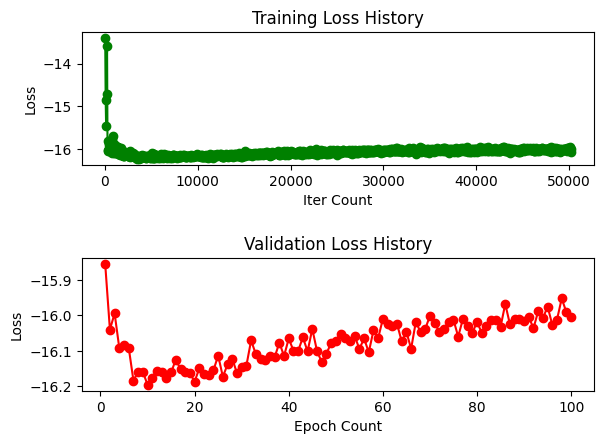

In [47]:
val_epoch_array = np.linspace(0, NUM_EPOCHS, int(NUM_EPOCHS/PLOT_AFTER)+1)

# Plotting both training+testing loss vs iteration
figure, axis = plt.subplots(2,1)
axis[0].plot(train_iter_array[1::], train_loss_array[1::], 'go-')
axis[0].set_xlabel('Iter Count')
axis[0].set_ylabel('Loss')
axis[0].set_title('Training Loss History')

axis[1].plot(np.linspace(1,100,100), val_loss_array[1:], 'ro-')
axis[1].set_xlabel('Epoch Count')
axis[1].set_ylabel('Loss')
axis[1].set_title('Validation Loss History')


figure.tight_layout(pad=2.0)
plt.show()

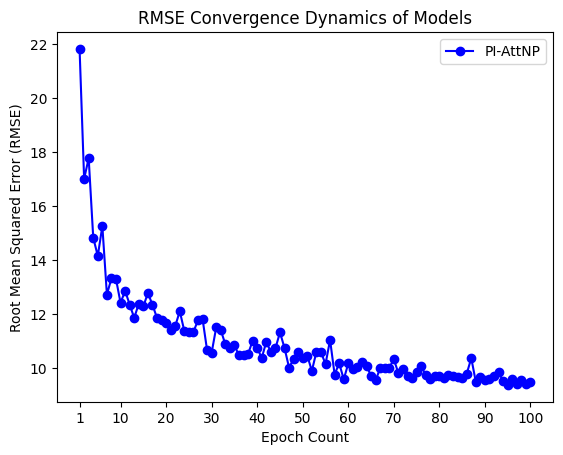

In [48]:
epoch_array = np.linspace(1, 100, 100)
plt.plot(epoch_array, val_RMSE_array[1:], 'bo-',label='PI-AttNP')
plt.plot()
plt.xlabel('Epoch Count')
plt.ylabel(r'Root Mean Squared Error (RMSE)')
plt.title('RMSE Convergence Dynamics of Models') # with $|v_{w}| \leq 5 \frac{m}{s}, |\Delta \bar{\omega}| \leq 10 \frac{rad}{s}$')
plt.xticks([1, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100])
plt.legend()

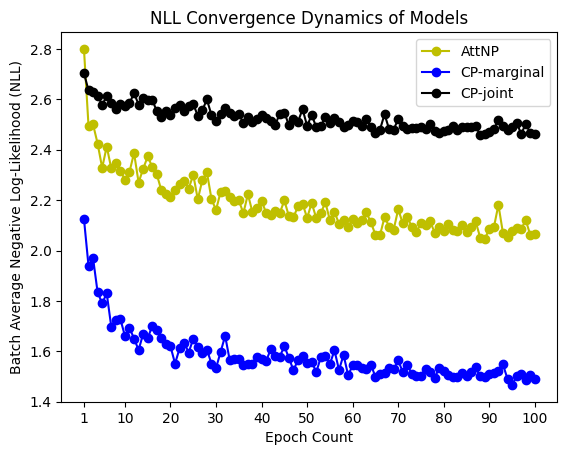

In [ ]:
epoch_array = np.linspace(1, 100, 100)
plt.plot(epoch_array, val_NLL_avg_array[1:],'-yo',label="AttNP")
plt.plot(epoch_array, val_NLL_avg_CP_marginal_array[1:], '-bo',label="CP-marginal")
plt.plot(epoch_array, val_NLL_avg_CP_joint_array[1:], '-ko', label="CP-joint")
plt.xlabel('Epoch Count'), plt.ylabel('Batch Average Negative Log-Likelihood (NLL)')
plt.xticks([1, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100])
plt.title('NLL Convergence Dynamics of Models')
plt.legend()

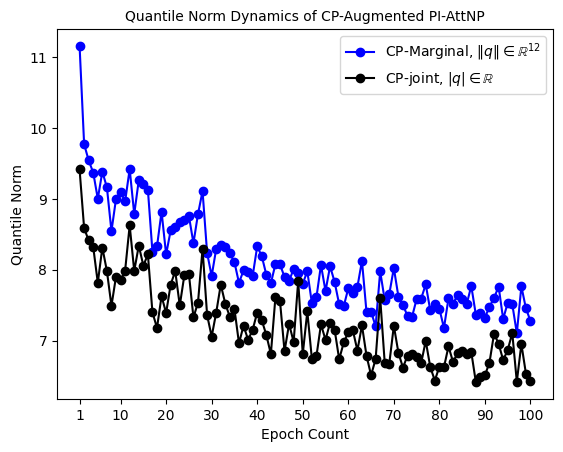

In [50]:
epoch_array = np.linspace(1, 100, 100)
plt.plot(epoch_array, q_norm_array[1:101],'-bo',label=r'CP-Marginal, $\|q\|\in\mathbb{R}^{12}$')
plt.plot(epoch_array, q_scalar_array[1:101], '-ko', label=r'CP-joint, $|q|\in\mathbb{R}$')
plt.xlabel('Epoch Count'), plt.ylabel('Quantile Norm')
plt.xticks([1, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100])
plt.title(r'Quantile Norm Dynamics of CP-Augmented PI-AttNP', fontsize=10)
plt.legend()

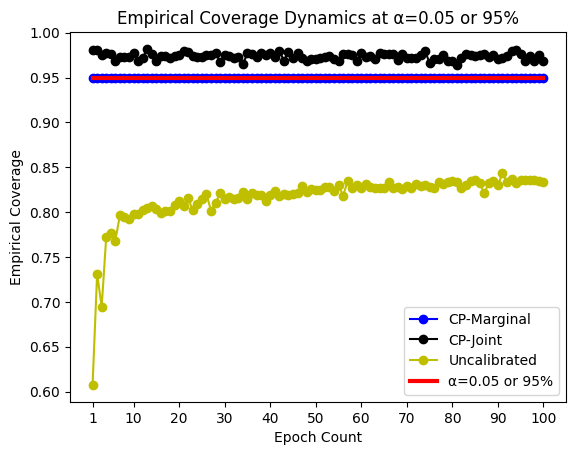

In [56]:
plt.plot(val_epoch_array[1:101], q_marginal_coverage_array[1:101], '-bo', label='CP-Marginal', markersize=6)
plt.plot(val_epoch_array[1:101], q_joint_coverage_array[1:101], '-ko', label='CP-Joint')
plt.plot(val_epoch_array[1:101], np_coverage_array[1:101], '-yo', label='Uncalibrated')
plt.plot(val_epoch_array[1:101], 0.95*np.ones_like(q_joint_coverage_array[1:101]), 'r',linewidth=3, label='α=0.05 or 95%')
plt.xticks([1, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100])
plt.xlabel('Epoch Count')
plt.ylabel('Empirical Coverage')
plt.title('Empirical Coverage Dynamics at α=0.05 or 95%')
plt.legend()
plt.show()

### Evaluation: Predicted Context Mode

Helper Functions

In [57]:
def compute_AE(target_y, pred_y):
  # Computing absolute prediction error (AE)
  state_diff = np.abs(target_y[:,-1,:] - pred_y[:,-1,:])
  AE_array = np.sum(state_diff, axis=1)
  
  return AE_array

def scaled_compute_AE(target_y, pred_y):
  # Computing absolute prediction error (AE)
  scaled_state_diff = np.abs((target_y[:,-1,:] - pred_y[:,-1,:]) / target_y[:,-1,:]) * 100
  scaled_AE_array = np.mean(scaled_state_diff)

  return scaled_AE_array

def compute_state_RMSE(target_y, pred_y):
    """
    Compute the batch-averaged sum of RMSEs for each state at the final time step.
    
    Args:
        target_y (np.ndarray): Shape (batch_size, time_steps, state_dim)
        pred_y (np.ndarray): Shape (batch_size, time_steps, state_dim)
    
    Returns:
        float: Scalar RMSE value averaged over the batch.
    """
    # Compute squared error at the final time step
    linvel_diff_squared = (target_y[:, -1, :3] - pred_y[:, -1, :3]) ** 2  # Shape: (batch_size, state_dim)
    linacc_diff_squared = (target_y[:, -1, 3:6] - pred_y[:, -1, 3:6]) ** 2  # Shape: (batch_size, state_dim)
    angvel_diff_squared = (target_y[:, -1, 6:9] - pred_y[:, -1, 6:9]) ** 2  # Shape: (batch_size, state_dim)
    angacc_diff_squared = (target_y[:, -1, 9:12] - pred_y[:, -1, 9:12]) ** 2  # Shape: (batch_size, state_dim)
    
    # RMSE for each state in each sample
    linvel_rmse = np.sqrt(linvel_diff_squared)  # Shape: (batch_size, state_dim)
    linacc_rmse = np.sqrt(linacc_diff_squared)  # Shape: (batch_size, state_dim)
    angvel_rmse = np.sqrt(angvel_diff_squared)  # Shape: (batch_size, state_dim)
    angacc_rmse = np.sqrt(angacc_diff_squared)  # Shape: (batch_size, state_dim)
    
    # Sum RMSE across states for each sample
    summed_linvel_rmse = np.sum(linvel_rmse, axis=1)  # Shape: (batch_size,)
    summed_linacc_rmse = np.sum(linacc_rmse, axis=1)  # Shape: (batch_size,)
    summed_angvel_rmse = np.sum(angvel_rmse, axis=1)  # Shape: (batch_size,)
    summed_angacc_rmse = np.sum(angacc_rmse, axis=1)  # Shape: (batch_size,)

    return summed_linvel_rmse, summed_linacc_rmse, summed_angvel_rmse, summed_angacc_rmse


def tensor_break(traj):
    
    updated_quadout = traj.clone()
    combined_quad_array = torch.empty([updated_quadout.shape[0]*2, 35])
    for iter,i in enumerate(range(0, 2*updated_quadout.shape[0], 2)):

        added_inputs1 = updated_quadout[iter:iter+1,0,12:23]
        added_inputs2 = updated_quadout[iter:iter+1,1,12:23]

        traj1 = updated_quadout[iter:iter+1,0,:12]
        traj2 = updated_quadout[iter:iter+1,0,23:]
        traj3 = updated_quadout[iter:iter+1,1,:12]
        traj4 = updated_quadout[iter:iter+1,1,23:]
        array1 = torch.concat([traj1,added_inputs1,traj2], dim=-1)
        array2 = torch.concat([traj3,added_inputs2,traj4], dim=-1)

        traj_array = torch.concat([array1, array2], dim=0)
        combined_quad_array[i:i+2,:] = traj_array
            
    return combined_quad_array

def compute_fused_estimate(pred_y, sensor_y, pred_w=0.0, sensor_w=1.0):
    pred_y = pred_y.clone()
    sensor_y = sensor_y.clone()

    # Applying weighted average estimate
    return pred_w * pred_y + sensor_w * sensor_y


Trajectory Prediction Algorithm

In [ ]:
# Initializing models used in evaluation
model1 = torch.load('load pretrained PI-AttNP model', weights_only=False)
#model1 = model   # or use previously trained model
model_list = [model1]
num_models = len(model_list)

# Initializing quadrotor sensor noise/disturbance parameters
num_perturb_profiles = 1
perturb_params = torch.zeros([num_perturb_profiles,2])
rotor_spike_profile = 200 
wind_vel_array = 50
perturb_params[0,0] = rotor_spike_profile
perturb_params[0,1] = wind_vel_array


# Sampling random trajectory data 
sample_length = 200
test_db = Quadrotor_Dynamics_Generator(normalize=False, device='cpu')
test_traj =  test_db.generate_test_traj(seq_length=sample_length, perturb_params=perturb_params[0,:], gaussian_noise=True)
test_traj_unnorm = tensor_break(test_traj.clone())
test_traj = db.convert2new(test_traj)
test_traj = db.minmax_norm(test_traj)

linvel_RMSE_array = np.zeros([num_models, sample_length])
linacc_RMSE_array = np.zeros([num_models, sample_length])
angvel_RMSE_array = np.zeros([num_models, sample_length])
angacc_RMSE_array = np.zeros([num_models, sample_length])

# Defining test trajectory time array
time_array = np.zeros([sample_length,])

# Initializing array that will contain model predictions
eval_data = torch.zeros([num_models, 3, sample_length, 12])
eval_data[:,0:1,0:1,:] = torch.tile(torch.unsqueeze(test_traj[0:1,0:1,5:], dim=0), dims=[num_models, 1, 1, 1])


# Initializing plotting parameters
Xdot = np.zeros([num_models, sample_length])
Ydot = np.zeros([num_models, sample_length])
Zdot = np.zeros([num_models, sample_length])
Xddot = np.zeros([num_models, sample_length])
Yddot = np.zeros([num_models, sample_length])
Zddot = np.zeros([num_models, sample_length])

ωx = np.zeros([num_models, sample_length])
ωy = np.zeros([num_models, sample_length])
ωz = np.zeros([num_models, sample_length])
ωxdot = np.zeros([num_models, sample_length])
ωydot = np.zeros([num_models, sample_length])
ωzdot = np.zeros([num_models, sample_length])

Xdot_pred = np.zeros([num_models, sample_length])
Ydot_pred = np.zeros([num_models, sample_length])
Zdot_pred = np.zeros([num_models, sample_length])
Xddot_pred = np.zeros([num_models, sample_length])
Yddot_pred = np.zeros([num_models, sample_length])
Zddot_pred = np.zeros([num_models, sample_length])

ωx_pred = np.zeros([num_models, sample_length])
ωy_pred = np.zeros([num_models, sample_length])
ωz_pred = np.zeros([num_models, sample_length])
ωxdot_pred = np.zeros([num_models, sample_length])
ωydot_pred = np.zeros([num_models, sample_length])
ωzdot_pred = np.zeros([num_models, sample_length])

Xdot_var = np.zeros([num_models, sample_length])
Ydot_var = np.zeros([num_models, sample_length])
Zdot_var = np.zeros([num_models, sample_length])
Xddot_var = np.zeros([num_models, sample_length])
Yddot_var = np.zeros([num_models, sample_length])
Zddot_var = np.zeros([num_models, sample_length])

ωx_var = np.zeros([num_models, sample_length])
ωy_var = np.zeros([num_models, sample_length])
ωz_var = np.zeros([num_models, sample_length])
ωxdot_var = np.zeros([num_models, sample_length])
ωydot_var = np.zeros([num_models, sample_length])
ωzdot_var = np.zeros([num_models, sample_length])


# Looping through entire test trajectory
for nn in range(num_models):

  # Setting 'curr_model' to next model in list
  curr_model = model_list[nn]
  
  # Resetting time counter
  curr_time = 0

  # Initializing first context as first state estimate
  next_context = test_traj[0:1,0:1,5:]

  for i in range(1, sample_length-1):

    curr_sample = test_traj[i:i+1,:,:].clone()
    curr_sample[:,0:1,5:] = next_context
    
    #print(f'{curr_sample}\n')
    
    curr_dt = curr_sample[:,1:2,0]
    curr_time += curr_dt 
    time_array[i] = curr_time[0].detach().numpy()

    context_x, context_y = curr_sample[:,0:1,:5], curr_sample[:,0:1,5:]
    target_x, target_y = curr_sample[:,:,:5], curr_sample[:,:,5:]

    query = ((context_x, context_y), target_x)
    input_unnorm = test_traj_unnorm[i:i+1,:23]

    with torch.no_grad():
      pred_y, var = curr_model(query, input_unnorm, is_testing=True)

    next_context = compute_fused_estimate(pred_y[:,1:2,:].clone(),test_traj[i+1:i+2,0:1,5:].clone())

    # Computing AE of current prediction
    target_y, pred_y, var = test_db.minmax_unnorm(target_y, pred_y, var)
    linvel_rmse, linacc_rmse, angvel_rmse, angacc_rmse = compute_state_RMSE(target_y.detach().numpy(), pred_y.detach().numpy())
    linvel_RMSE_array[nn, i] = linvel_rmse
    linacc_RMSE_array[nn, i] = linacc_rmse
    angvel_RMSE_array[nn, i] = angvel_rmse
    angacc_RMSE_array[nn, i] = angacc_rmse

    eval_data[nn,0:1,i:i+1,:] = target_y[:,1:2,:]
    eval_data[nn,1:2,i-1:i+1,:] = pred_y
    eval_data[nn,2:3,i-1:i+1,:] = var
    

  # Storing true states, their predictions, and associated variances for plotting
  Xdot[nn,:] = eval_data[nn,0,:,0].detach().numpy()
  Ydot[nn,:] = eval_data[nn,0,:,1].detach().numpy() 
  Zdot[nn,:] = eval_data[nn,0,:,2].detach().numpy()
  Xddot[nn,:] = eval_data[nn,0,:,3].detach().numpy() 
  Yddot[nn,:] = eval_data[nn,0,:,4].detach().numpy()
  Zddot[nn,:] = eval_data[nn,0,:,5].detach().numpy() 


  Xdot_pred[nn,:] = eval_data[nn,1,:,0].detach().numpy() 
  Ydot_pred[nn,:] = eval_data[nn,1,:,1].detach().numpy() 
  Zdot_pred[nn,:] = eval_data[nn,1,:,2].detach().numpy() 
  Xddot_pred[nn,:] = eval_data[nn,1,:,3].detach().numpy() 
  Yddot_pred[nn,:] = eval_data[nn,1,:,4].detach().numpy()
  Zddot_pred[nn,:] = eval_data[nn,1,:,5].detach().numpy()

  
  ωx[nn,:] = eval_data[nn,0,:,6].detach().numpy() 
  ωy[nn,:] = eval_data[nn,0,:,7].detach().numpy() 
  ωz[nn,:] = eval_data[nn,0,:,8].detach().numpy() 
  ωxdot[nn,:] = eval_data[nn,0,:,9].detach().numpy()
  ωydot[nn,:] = eval_data[nn,0,:,10].detach().numpy() 
  ωzdot[nn,:] = eval_data[nn,0,:,11].detach().numpy() 
  
  ωx_pred[nn,:] = eval_data[nn,1,:,6].detach().numpy() 
  ωy_pred[nn,:] = eval_data[nn,1,:,7].detach().numpy() 
  ωz_pred[nn,:] = eval_data[nn,1,:,8].detach().numpy()
  ωxdot_pred[nn,:] = eval_data[nn,1,:,9].detach().numpy()
  ωydot_pred[nn,:] = eval_data[nn,1,:,10].detach().numpy() 
  ωzdot_pred[nn,:] = eval_data[nn,1,:,11].detach().numpy()
  
  Xdot_var[nn,:] = eval_data[nn,2,:,0].detach().numpy() 
  Ydot_var[nn,:] = eval_data[nn,2,:,1].detach().numpy() 
  Zdot_var[nn,:] = eval_data[nn,2,:,2].detach().numpy() 
  Xddot_var[nn,:] = eval_data[nn,2,:,3].detach().numpy()
  Yddot_var[nn,:] = eval_data[nn,2,:,4].detach().numpy()
  Zddot_var[nn,:] = eval_data[nn,2,:,5].detach().numpy()


  ωx_var[nn,:] = eval_data[nn,2,:,6].detach().numpy() 
  ωy_var[nn,:] = eval_data[nn,2,:,7].detach().numpy() 
  ωz_var[nn,:] = eval_data[nn,2,:,8].detach().numpy() 
  ωxdot_var[nn,:] = eval_data[nn,2,:,9].detach().numpy()
  ωydot_var[nn,:] = eval_data[nn,2,:,10].detach().numpy()
  ωzdot_var[nn,:] = eval_data[nn,2,:,11].detach().numpy()


batch_linvel_rmse = np.mean(linvel_RMSE_array, axis=1)
batch_linacc_rmse = np.mean(linacc_RMSE_array, axis=1)
batch_angvel_rmse = np.mean(angvel_RMSE_array, axis=1)
batch_angacc_rmse = np.mean(angacc_RMSE_array, axis=1)

batch_linvel_rmse_std = np.std(linvel_RMSE_array, axis=1)
batch_linacc_rmse_std = np.std(linacc_RMSE_array, axis=1)
batch_angvel_rmse_std = np.std(angvel_RMSE_array, axis=1)
batch_angacc_rmse_std = np.std(angacc_RMSE_array, axis=1)

print(f'Batch Linear Velocity RMSE: {batch_linvel_rmse} ± {batch_linvel_rmse_std}')
print(f'Batch Linear Acceleration RMSE: {batch_linacc_rmse} ± {batch_linacc_rmse_std}')
print(f'Batch Angular Velocity RMSE: {batch_angvel_rmse} ± {batch_angvel_rmse_std}')
print(f'Batch Angular Acceleration RMSE: {batch_angacc_rmse} ± {batch_angacc_rmse_std}')

NP-CONVERT: Processing sample 0.
NP-CONVERT: Conversion complete. New dataset shape: torch.Size([400, 2, 17])

Starting minmax normalization of dataset...
Minmax normalization of dataset complete!



/tmp/ipykernel_69892/1593574534.py:102: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  time_array[i] = curr_time[0].detach().numpy()
/tmp/ipykernel_69892/1593574534.py:118: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  linvel_RMSE_array[nn, i] = linvel_rmse
/tmp/ipykernel_69892/1593574534.py:119: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  linacc_RMSE_array[nn, i] = linacc_rmse
/tmp/ipykernel_69892/1593574534.py:120: DeprecationWarning: Conversion of an array with

Batch Linear Velocity RMSE: [1.4908503] ± [0.86712025]
Batch Linear Acceleration RMSE: [3.55238241] ± [1.74828197]
Batch Angular Velocity RMSE: [0.76380875] ± [0.56002871]
Batch Angular Acceleration RMSE: [4.59600172] ± [2.52677407]


### Plotting Predictions vs Ground-Truth

In [60]:
# Defining length of plotted trajectories (ensure its <= to sample_length)
plt_idx = 199

(Text(0.5, 0, 'Time (s)'), Text(0, 0.5, '$\\dot{X}$ (m/s)'))

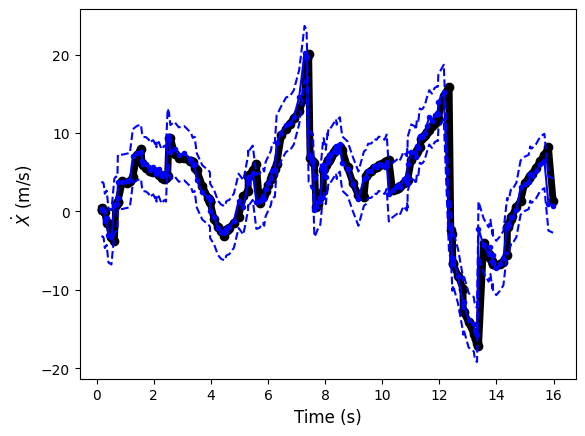

In [71]:
plt.plot(time_array[1:plt_idx], Xdot[0,1:plt_idx], '-ko', linewidth=5)
plt.plot(time_array[1:plt_idx], Xdot_pred[0,1:plt_idx], '-bo', markersize=3)

plt.plot(time_array[1:plt_idx], Xdot_pred[0,1:plt_idx] - Xdot_var[0,1:plt_idx], '--b')
plt.plot(time_array[1:plt_idx], Xdot_pred[0,1:plt_idx] + Xdot_var[0,1:plt_idx], '--b')


plt.xlabel("Time (s)", fontsize=12), plt.ylabel(r"$\dot{X}$ (m/s)", fontsize=12)

(Text(0.5, 0, 'Time (s)'), Text(0, 0.5, '$\\dot{Y}$ (m/s)'))

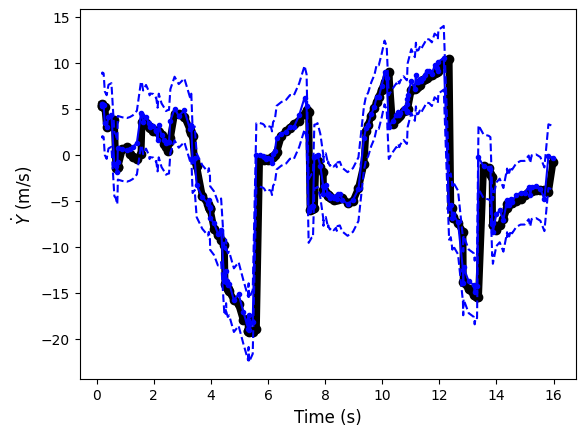

In [72]:
plt.plot(time_array[1:plt_idx], Ydot[0,1:plt_idx], '-ko', linewidth=5)
plt.plot(time_array[1:plt_idx], Ydot_pred[0,1:plt_idx], '-bo', markersize=3)

plt.plot(time_array[1:plt_idx], Ydot_pred[0,1:plt_idx] - Ydot_var[0,1:plt_idx], '--b')
plt.plot(time_array[1:plt_idx], Ydot_pred[0,1:plt_idx] + Ydot_var[0,1:plt_idx], '--b')

plt.xlabel("Time (s)", fontsize=12), plt.ylabel(r"$\dot{Y}$ (m/s)", fontsize=12)

(Text(0.5, 0, 'Time (s)'), Text(0, 0.5, '$\\dot{Z}$ (m)'))

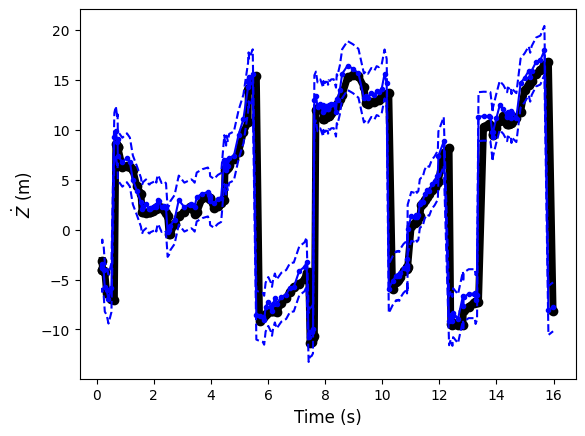

In [73]:
plt.plot(time_array[1:plt_idx], Zdot[0,1:plt_idx], '-ko', linewidth=5)
plt.plot(time_array[1:plt_idx], Zdot_pred[0,1:plt_idx], '-bo', markersize=3)

plt.plot(time_array[1:plt_idx], Zdot_pred[0,1:plt_idx] - Zdot_var[0,1:plt_idx], '--b')
plt.plot(time_array[1:plt_idx], Zdot_pred[0,1:plt_idx] + Zdot_var[0,1:plt_idx], '--b')

plt.xlabel("Time (s)", fontsize=12), plt.ylabel(r"$\dot{Z}$ (m)", fontsize=12)

(Text(0.5, 0, 'Time (s)'), Text(0, 0.5, '$\\ddot{X}$ (m/s$^2$)'))

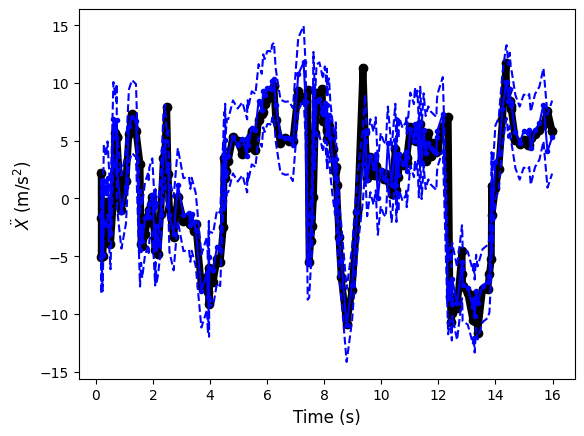

In [74]:
plt.plot(time_array[1:plt_idx], Xddot[0,1:plt_idx], '-ko', linewidth=5)
plt.plot(time_array[1:plt_idx], Xddot_pred[0,1:plt_idx], '-bo', markersize=3)

plt.plot(time_array[1:plt_idx], Xddot_pred[0,1:plt_idx] - Xddot_var[0,1:plt_idx], '--b')
plt.plot(time_array[1:plt_idx], Xddot_pred[0,1:plt_idx] + Xddot_var[0,1:plt_idx], '--b')
plt.xlabel("Time (s)", fontsize=12), plt.ylabel(r"$\ddot{X}$ (m/s$^2$)", fontsize=12)

(Text(0.5, 0, 'Time (s)'), Text(0, 0.5, '$\\ddot{Y}$ (m/s$^2$)'))

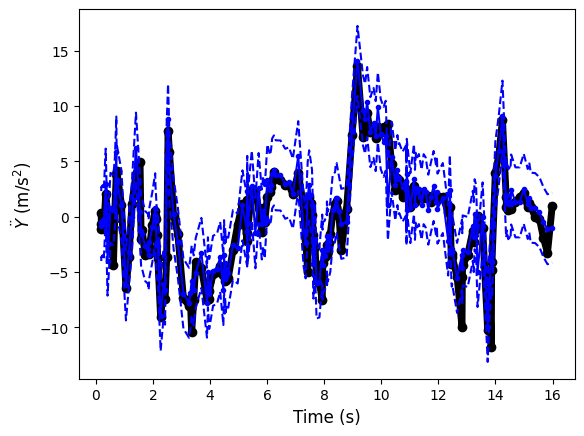

In [75]:
plt.plot(time_array[1:plt_idx], Yddot[0,1:plt_idx], '-ko', linewidth=5)
plt.plot(time_array[1:plt_idx], Yddot_pred[0,1:plt_idx], '-bo', markersize=3)

plt.plot(time_array[1:plt_idx], Yddot_pred[0,1:plt_idx] - Yddot_var[0,1:plt_idx], '--b')
plt.plot(time_array[1:plt_idx], Yddot_pred[0,1:plt_idx] + Yddot_var[0,1:plt_idx], '--b')
plt.xlabel("Time (s)", fontsize=12), plt.ylabel(r"$\ddot{Y}$ (m/s$^2$)", fontsize=12)

(Text(0.5, 0, 'Time (s)'), Text(0, 0.5, '$\\ddot{Z}$ (m/s$^2$)'))

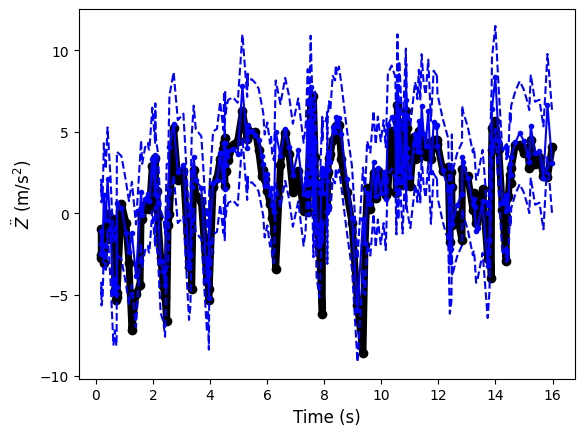

In [76]:
plt.plot(time_array[1:plt_idx], Zddot[0,1:plt_idx], '-ko', linewidth=5)
plt.plot(time_array[1:plt_idx], Zddot_pred[0,1:plt_idx], '-bo', markersize=3)

plt.plot(time_array[1:plt_idx], Zddot_pred[0,1:plt_idx] - Zddot_var[0,1:plt_idx], '--b')
plt.plot(time_array[1:plt_idx], Zddot_pred[0,1:plt_idx] + Zddot_var[0,1:plt_idx], '--b')
plt.xlabel("Time (s)", fontsize=12), plt.ylabel(r"$\ddot{Z}$ (m/s$^2$)", fontsize=12)

(Text(0.5, 0, 'Time (s)'), Text(0, 0.5, '$\\omega_{x}$ (rad/s)'))

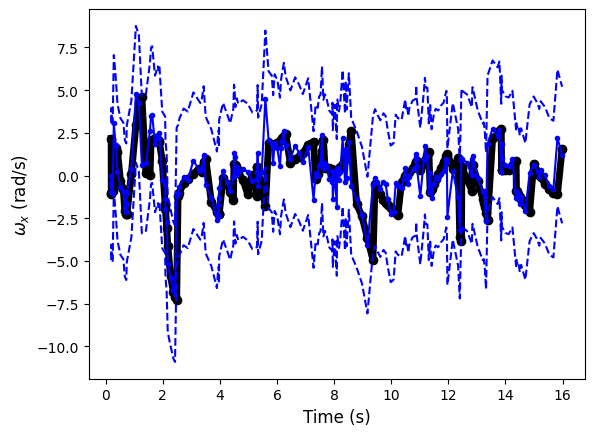

In [77]:
plt.plot(time_array[1:plt_idx], ωx[0,1:plt_idx], '-ko', linewidth=5)
plt.plot(time_array[1:plt_idx], ωx_pred[0,1:plt_idx], '-bo', markersize=3)

plt.plot(time_array[1:plt_idx], ωx_pred[0,1:plt_idx] - ωx_var[0,1:plt_idx], '--b')
plt.plot(time_array[1:plt_idx], ωx_pred[0,1:plt_idx] + ωx_var[0,1:plt_idx], '--b')

plt.xlabel("Time (s)", fontsize=12), plt.ylabel(r"$\omega_{x}$ (rad/s)", fontsize=12)

(Text(0.5, 0, 'Time (s)'), Text(0, 0.5, '$\\omega_y$ (rad/s)'))

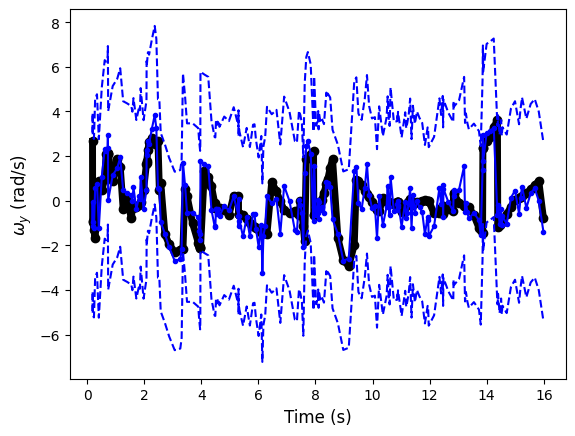

In [78]:
plt.plot(time_array[1:plt_idx], ωy[0,1:plt_idx], '-ko', linewidth=5)
plt.plot(time_array[1:plt_idx], ωy_pred[0,1:plt_idx], '-bo', markersize=3)

plt.plot(time_array[1:plt_idx], ωy_pred[0,1:plt_idx] - ωy_var[0,1:plt_idx], '--b')
plt.plot(time_array[1:plt_idx], ωy_pred[0,1:plt_idx] + ωy_var[0,1:plt_idx], '--b')

plt.xlabel("Time (s)", fontsize=12), plt.ylabel(r"$\omega_y$ (rad/s)", fontsize=12)

(Text(0.5, 0, 'Time (s)'), Text(0, 0.5, '$\\omega_z$ (rad/s)'))

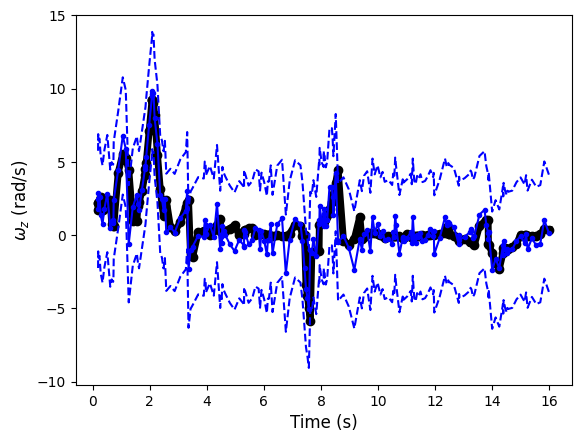

In [79]:
plt.plot(time_array[1:plt_idx], ωz[0,1:plt_idx], '-ko', linewidth=5)
plt.plot(time_array[1:plt_idx], ωz_pred[0,1:plt_idx], '-bo', markersize=3)

plt.plot(time_array[1:plt_idx], ωz_pred[0,1:plt_idx] - ωz_var[0,1:plt_idx], '--b')
plt.plot(time_array[1:plt_idx], ωz_pred[0,1:plt_idx] + ωz_var[0,1:plt_idx], '--b')

plt.xlabel("Time (s)", fontsize=12), plt.ylabel(r"$\omega_z$ (rad/s)", fontsize=12)

(Text(0.5, 0, 'Time (s)'), Text(0, 0.5, '$\\dot{\\omega}_{x}$ (rad/s$^2$)'))

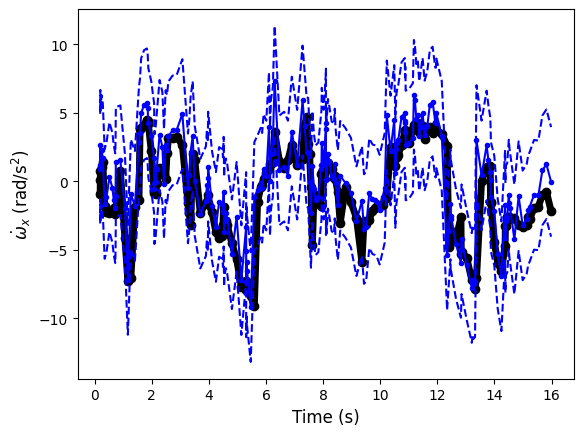

In [80]:
plt.plot(time_array[1:plt_idx], ωxdot[0,1:plt_idx], '-ko', linewidth=5)
plt.plot(time_array[1:plt_idx], ωxdot_pred[0,1:plt_idx], '-bo', markersize=3)

plt.plot(time_array[1:plt_idx], ωxdot_pred[0,1:plt_idx] - ωxdot_var[0,1:plt_idx], '--b')
plt.plot(time_array[1:plt_idx], ωxdot_pred[0,1:plt_idx] + ωxdot_var[0,1:plt_idx], '--b')
plt.xlabel("Time (s)", fontsize=12), plt.ylabel(r"$\dot{\omega}_{x}$ (rad/s$^2$)", fontsize=12)

(Text(0.5, 0, 'Time (s)'), Text(0, 0.5, '$\\dot{\\omega}_{y}$ (rad/s$^2$)'))

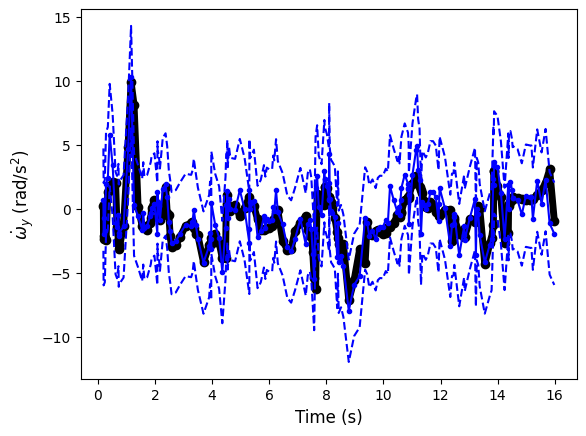

In [81]:
plt.plot(time_array[1:plt_idx], ωydot[0,1:plt_idx], '-ko', linewidth=5)
plt.plot(time_array[1:plt_idx], ωydot_pred[0,1:plt_idx], '-bo', markersize=3)

plt.plot(time_array[1:plt_idx], ωydot_pred[0,1:plt_idx] - ωydot_var[0,1:plt_idx], '--b')
plt.plot(time_array[1:plt_idx], ωydot_pred[0,1:plt_idx] + ωydot_var[0,1:plt_idx], '--b')
plt.xlabel("Time (s)", fontsize=12), plt.ylabel(r"$\dot{\omega}_{y}$ (rad/s$^2$)", fontsize=12)

(Text(0.5, 0, 'Time (s)'), Text(0, 0.5, '$\\dot{\\omega}_{z}$ (rad/s$^2$)'))

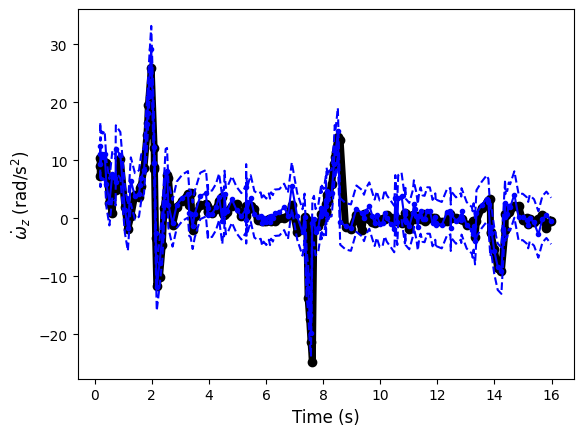

In [82]:
plt.plot(time_array[1:plt_idx], ωzdot[0,1:plt_idx], '-ko', linewidth=5)
plt.plot(time_array[1:plt_idx], ωzdot_pred[0,1:plt_idx], '-bo', markersize=3)

plt.plot(time_array[1:plt_idx], ωzdot_pred[0,1:plt_idx] - ωzdot_var[0,1:plt_idx], '--b')
plt.plot(time_array[1:plt_idx], ωzdot_pred[0,1:plt_idx] + ωzdot_var[0,1:plt_idx], '--b')
plt.xlabel("Time (s)", fontsize=12), plt.ylabel(r"$\dot{\omega}_{z}$ (rad/s$^2$)", fontsize=12)